Luca Dal Zotto
1236343


#NEURAL NETWORKS AND DEEP LEARNING
> M.Sc. ICT FOR LIFE AND HEALTH
> 
> Department of Information Engineering

> M.Sc. COMPUTER ENGINEERING
>
> Department of Information Engineering

> M.Sc. AUTOMATION ENGINEERING
>
> Department of Information Engineering
 
> M.Sc. PHYSICS OF DATA
>
> Department of Physics and Astronomy
 
> M.Sc. COGNITIVE NEUROSCIENCE AND CLINICAL NEUROPSYCHOLOGY
>
> Department of General Psychology

---
A.A. 2020/21 (6 CFU) - Dr. Alberto Testolin, Dr. Matteo Gadaleta
---


# Homework 1 - Supervised Deep Learning

## General overview
In this homework you will learn how to implement and test simple neural network models for solving supervised problems. It is divided in two tasks.

* **Regression task**: 
the regression model will consist in a simple function approximation problem, similar to the one discussed during the Lab practices. 

* **Classification task**: 
the classification model will consist in a simple image recognition problem, where the goal is to correctly classify images of handwritten digits (MNIST). 

In both cases, but especially for the classification problem, you should explore the use of advanced optimizers and regularization methods (e.g., initialization scheme, momentum, ADAM, early stopping, L2, L1 / sparsity, dropout…) to improve convergence of stochastic gradient descent and promote generalization. Learning hyperparameters should be tuned using appropriate search procedures, and final accuracy should be evaluated using a cross-validation setup. For the image classification task, you can also implement more advanced convolutional architectures and explore feature visualization techniques to better understand how the deep network is encoding information at different processing layers.



## Technical notes
The homework should be implemented in Python using the PyTorch framework. The student can explore additional libraries and tools to implement the models; however, please make sure you understand the code you are writing because during the exam you might receive specific questions related to your implementation. The entire source code required to run the homework must be uploaded as a compressed archive in a Moodle section dedicated to the homework.If your code will be entirely included in a single Python notebook, just upload the notebook file.




## Final report
Along with the source code, you must separately upload a PDF file containing a brief report of your homework. The report should include a brief Introduction on which you explain the homework goals and the main implementation strategies you choose, a brief Method section where you describe your model architectures and hyperparameters, and a Result section where you present the simulation results. Total length should not exceed 6 pages, though you can include additional tables and figures in a final Appendix (optional).




## Grade
The maximum grade for this homework will be **8 points**. Points will be assigned based on the correct implementation of the following items:
*	2 pt: implement basic regression and classification tasks
*	2 pt: explore advanced optimizers and regularization methods 
*	1 pt: optimize hyperparameters using grid/random search and cross-validation
*	2 pt: implement CNN for classification task
*	1 pt: visualize weight histograms, activation profiles and receptive fields



## Deadline
The complete homework (notebook + report) must be submitted through Moodle at least 10 days before the chosen exam date.


# Import

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tqdm.notebook as tq
import time
import itertools
import random

from sklearn import preprocessing
from sklearn.model_selection import KFold, ParameterGrid

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision import transforms

In [ ]:
# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f"Training device: {device}")

Training device: cuda


# Classification task

## Guidelines

* The goal is to train a neural network that maps an input image (hand-written digit) to one of ten classes (multi-class classification problem with mutually exclusive classes).
* Define a proper loss (e.g. [torch.nn.CrossEntropyLoss](https://pytorch.org/docs/stable/generated/torch.nn.CrossEntropyLoss.html#torch.nn.CrossEntropyLoss))
* Also here, consider to create a validation set from you training data, or use a k-fold cross-validation strategy.
* Pay attention to the shape, data type and output values range. If needed, modify them accordingly to your implementation (read carefully the documentation of the layers that you use, e.g. [torch.nn.Conv2d](https://pytorch.org/docs/stable/generated/torch.nn.Conv2d.html)).
* Explore different optimizers, acivation functions, network architectures. Analyze the effect of different regularization methods, such as dropout layers, random transformations (image rotation, scaling, add noise...) or L2 regularization (weight decay).

# Dataset

Download the dataset:

In [ ]:
train_dataset_original = torchvision.datasets.MNIST('classifier_data', train=True, download=True)
test_dataset_original  = torchvision.datasets.MNIST('classifier_data', train=False, download=True)

In [ ]:
# len(train_dataset_original)
print("Training set size:", len(train_dataset_original))
print("Test set size:", len(test_dataset_original))

Training set size: 60000
Test set size: 10000


How to get an image and the corresponding label:

SAMPLE AT INDEX 5
LABEL: 2


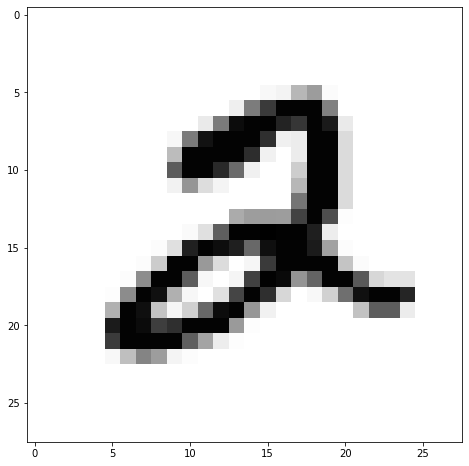

In [ ]:
sample_index = 5
image = train_dataset_original[sample_index][0]
label = train_dataset_original[sample_index][1]

fig = plt.figure(figsize=(8,8))
plt.imshow(image, cmap='Greys')
print(f"SAMPLE AT INDEX {sample_index}")
print(f"LABEL: {label}")

The output of the dataset is a PIL Image, a python object specifically developed to manage and process images. PyTorch supports this format, and there are useful transforms available natively in the framework: https://pytorch.org/docs/stable/torchvision/transforms.html

If you want, you can easily convert a PIL image to a numpy array and entirely ignore the PIL object:

In [ ]:
image_numpy = np.array(image)

print(f'Numpy array shape: {image_numpy.shape}')
print(f'Numpy array type: {image_numpy.dtype}')

Numpy array shape: (28, 28)
Numpy array type: uint8


In [ ]:
image_numpy[:7]

array([[  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,  13,  25, 100, 122,   7,   0,   0,   0,   0,   0,   0,
          0,   0],
       [  

To transform a PIL Image directly to a PyTorch tensor, instead:

In [ ]:
to_tensor = torchvision.transforms.ToTensor()
image_tensor = to_tensor(image)

print(f'PyTorch tensor shape: {image_tensor.shape}')
print(f'PyTorch tensor type: {image_tensor.dtype}')

# The first dimension is the color channel -> since we have only one channel (grey scale images), just discard that dimension
print(f'PyTorch tensor shape: {image_tensor[0].shape}')
print(f'PyTorch tensor type: {image_tensor[0].dtype}')

PyTorch tensor shape: torch.Size([1, 28, 28])
PyTorch tensor type: torch.float32
PyTorch tensor shape: torch.Size([28, 28])
PyTorch tensor type: torch.float32


In [ ]:
image_tensor[0][:7]

tensor([[0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000],
        [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000],
        [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000],
        [0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000,
         0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000

**Observation:** when using torchvision.transforms.ToTensor(), the values of the pixels of the resulting tensor are already in the interval [0, 1] instead of [0, 255], so we do not need to normalize them.

### Data exploration: class frequency

Let's compute the frequency of each class, to check whether the dataset is balanced.

In [ ]:
y_train = []
for sample in train_dataset_original:
      y_train.append(sample[1])

In [ ]:
classes, class_count = np.unique(y_train, return_counts=True)
pd.DataFrame((classes, class_count), columns=list(range(0,10)), index=['Label', 'Frequency'])

,0,1,2,3,4,5,6,7,8,9
Label,0,1,2,3,4,5,6,7,8,9
Frequency,5923,6742,5958,6131,5842,5421,5918,6265,5851,5949


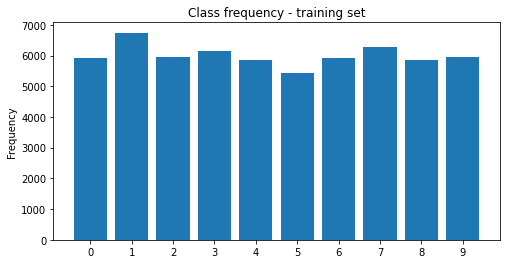

In [ ]:
# Plot the class frequency
fig, ax = plt.subplots(figsize=(8,4))
_ = ax.bar(classes, class_count, label = list(range(0,10)))
ax.set_ylabel('Frequency')
ax.set_title('Class frequency - training set')
ax.set_xticks(np.arange(10))
ax.set_xticklabels(list(range(0,10)))
plt.show()

### Data Preprocessing

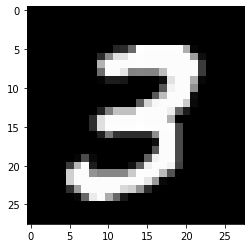

In [ ]:
# Let's take a sample fromt the dataset
original_image = train_dataset_original[7][0]
_ = plt.imshow(original_image, cmap='gray')

Define the transformation

In [ ]:
train_transform = transforms.Compose([
        # transforms.RandomRotation([-20, 20]),  # This apply a random rotation to the image
        # transforms.RandomCrop(26),  # This apply a random crop to the image
        transforms.RandomAffine(10, translate=(1/28, 1/28), scale=(0.9,1), 
                                shear=(-10,10,-10,10), resample=0),
        # transforms.RandomAffine(0, translate=(1/14, 1/14), scale=None, shear=None, resample=0),
        transforms.ToTensor()
        ])

test_transform = transforms.Compose([transforms.ToTensor()])

In [ ]:
train_dataset_original.transform = train_transform
test_dataset_original.transform = test_transform

Let's see the effect of the train_transform to the previous sample

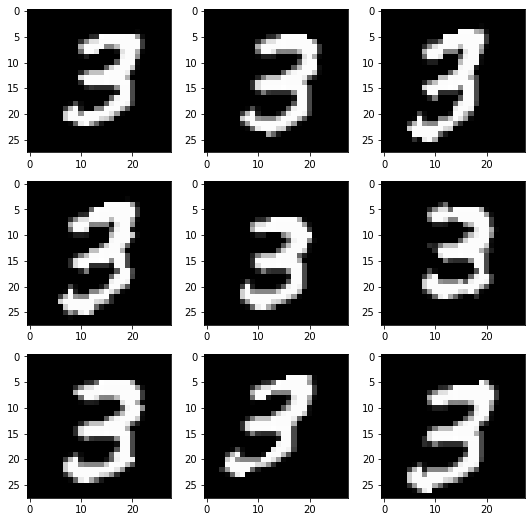

In [ ]:
torch.manual_seed(0)
fig, axs = plt.subplots(3, 3, figsize=(9,9))
for i in range(3):
  for j in range(3):
    transformed_image = train_dataset_original[7][0]
    axs[i,j].imshow(transformed_image.squeeze(), cmap='gray')

NB: test_transform simply converts the image into a tensor: no affine transformation is applied 

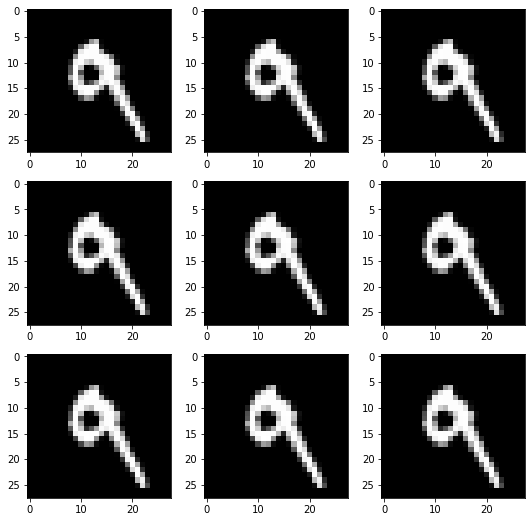

In [ ]:
torch.manual_seed(0)
fig, axs = plt.subplots(3, 3, figsize=(9,9))
for i in range(3):
  for j in range(3):
    transformed_image = test_dataset_original[7][0]
    axs[i,j].imshow(transformed_image.squeeze(), cmap='gray')

### Split in training and validation sets

In [ ]:
train_dataset, val_dataset = torch.utils.data.random_split(train_dataset_original, 
                                        [50000, 10000], generator=torch.Generator().manual_seed(1))

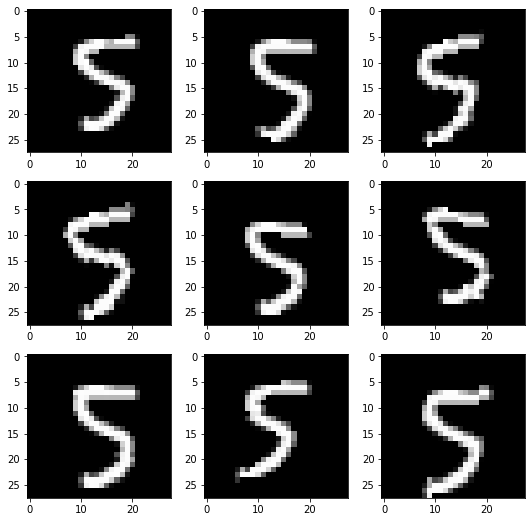

In [ ]:
# Example of a training sample
torch.manual_seed(0)
fig, axs = plt.subplots(3, 3, figsize=(9,9))
for i in range(3):
  for j in range(3):
    transformed_image = train_dataset[7][0]
    axs[i,j].imshow(transformed_image.squeeze(), cmap='gray')

Let's compute now the class distributions of these splits

In [ ]:
y_train, y_valid = [], []
for sample in train_dataset:
      y_train.append(sample[1])
for sample in val_dataset:
      y_valid.append(sample[1])

In [ ]:
classes_train, class_count_train = np.unique(y_train, return_counts=True)
pd.DataFrame((classes_train, class_count_train), columns=list(range(0,10)), index=['Label', 'Frequency'])

,0,1,2,3,4,5,6,7,8,9
Label,0,1,2,3,4,5,6,7,8,9
Frequency,4901,5591,4975,5146,4846,4515,4943,5228,4885,4970


In [ ]:
classes_valid, class_count_valid = np.unique(y_valid, return_counts=True)
pd.DataFrame((classes_valid, class_count_valid), columns=list(range(0,10)), index=['Label', 'Frequency'])

,0,1,2,3,4,5,6,7,8,9
Label,0,1,2,3,4,5,6,7,8,9
Frequency,1022,1151,983,985,996,906,975,1037,966,979


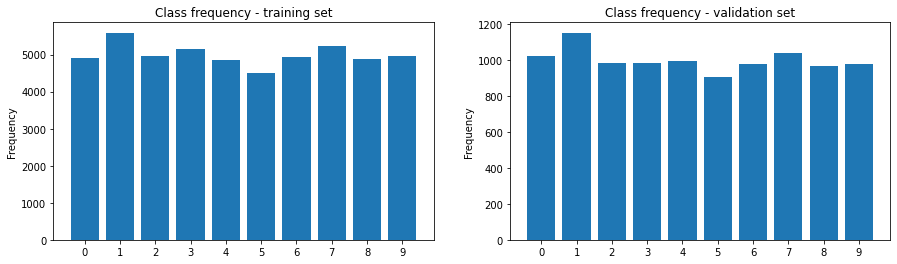

In [ ]:
# Plot the class frequency
fig, ax = plt.subplots(1,2, figsize=(15,4))
_ = ax[0].bar(classes_train, class_count_train, label = list(range(0,10)))
ax[0].set_ylabel('Frequency')
ax[0].set_title('Class frequency - training set')
ax[0].set_xticks(np.arange(10))
ax[0].set_xticklabels(list(range(0,10)))

_ = ax[1].bar(classes_valid, class_count_valid, label = list(range(0,10)))
ax[1].set_ylabel('Frequency')
ax[1].set_title('Class frequency - validation set')
ax[1].set_xticks(np.arange(10))
ax[1].set_xticklabels(list(range(0,10)))
plt.show()

Since the dataset is very large, and the original training set is well balanced, it is not necessary to extract the validation set in a stratified fashion. Even if we extract it randomly, the classes are still balanced enough.

Now we have train_dataset, val_dataset and test_dataset_original

# Auxiliary functions

In [ ]:
# ### Initialization
# import pandas as pd
# import numpy as np
# import matplotlib.pyplot as plt
# import tqdm.notebook as tq
# import time
# import itertools
# import random

# from sklearn import preprocessing
# from sklearn.model_selection import KFold, ParameterGrid

# import torch
# import torch.nn as nn
# import torch.optim as optim
# from torch.utils.data import Dataset, DataLoader
# import torchvision
# from torchvision import transforms

# # Check if the GPU is available
# device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
# print(f"Training device: {device}")

# train_dataset_original = torchvision.datasets.MNIST('classifier_data', train=True, download=True)
# test_dataset_original  = torchvision.datasets.MNIST('classifier_data', train=False, download=True)

# train_transform = transforms.Compose([
#         transforms.RandomAffine(10, translate=(1/28, 1/28), scale=(0.9,1), 
#                                 shear=(-10,10,-10,10), resample=0),
#         transforms.ToTensor()
#         ])

# test_transform = transforms.Compose([transforms.ToTensor()])

# train_dataset_original.transform = train_transform
# # train_dataset_original.transform = test_transform
# test_dataset_original.transform = test_transform

# train_dataset, val_dataset = torch.utils.data.random_split(train_dataset_original, 
#                                         [50000, 10000], generator=torch.Generator().manual_seed(1))

Training device: cuda


### Dataloader

In [ ]:
train_batch_size = 250
val_batch_size = 250
train_dataloader = DataLoader(train_dataset, batch_size=train_batch_size, shuffle=False, num_workers=0)
val_dataloader   = DataLoader(val_dataset, batch_size=val_batch_size, shuffle=False, num_workers=0)
test_dataloader = DataLoader(test_dataset_original, batch_size=250, shuffle=False, num_workers = 0)

In [ ]:
def myDataLoader(train_dataset, val_dataset, train_batch_size = 250, val_batch_size=250):
    train_dataloader = DataLoader(train_dataset, batch_size=train_batch_size, shuffle=True, num_workers=0)
    val_dataloader   = DataLoader(val_dataset, batch_size=val_batch_size, shuffle=False, num_workers=0)
    return train_dataloader, val_dataloader

In [ ]:
train_dataloader, val_dataloader = myDataLoader(train_dataset, val_dataset, train_batch_size = 250, val_batch_size=250)

Size of the dataloaders: ((batch_size,1,28,28),(batch_size))

In [ ]:
batch = next(iter(train_dataloader))
image, label = batch[0], batch[1]
print(f"Data shape: {image.shape})")
print(f"Label shape: {label.shape})")
print('First sample in batch number 1:')
plt.imshow(image[0].squeeze(), cmap='gray')
plt.show()
print('Label =', label[0])

In [ ]:
# def MyDataLoader(train_dataset, train_dataset, test_index, train_batch_size, val_batch_size = False):
  
#     train, val = train_df.iloc[train_index], train_df.iloc[test_index]
    
#     list(train_dataset_original)[0:3]

#     train_dataset = PandasDataset(train, transform=composed_transform)
#     val_dataset = PandasDataset(val, transform=composed_transform)

#     if not val_batch_size: val_batch_size = len(val_dataset)

#     train_dataloader = DataLoader(train_dataset, batch_size=train_batch_size, shuffle=False, num_workers=0)
#     val_dataloader   = DataLoader(val_dataset, batch_size=val_batch_size, shuffle=False, num_workers=0)
#     test_dataloader = DataLoader(test_dataset, batch_size=len(test_dataset), shuffle=False, num_workers = 4)

#     return train_dataloader, val_dataloader

### Network architecture

In this section I define many different architectures

In [ ]:
class FCNet(nn.Module):
    
    def __init__(self, Ni, Nh, No, hidden_layers, activation, reg):
                  
        #  pdrop1=0, pdrop2=0, pdrop3=0, pdrop4=0, pdrop5=0
        # pdropi - dropout probability after layer i
        
        """
        Ni - Input size
        Nh - Neurons in each hidden layer
        No - Output size
        hidden_layers - number of hidden layers (1<=HL<=5)
        activation - activation function
        reg - regularization approach
        """
        super().__init__()
        
        self.HL = hidden_layers
        self.fc1 = nn.Linear(in_features=Ni, out_features=Nh) # fully connected 1
        if self.HL >= 2: self.fc2 = nn.Linear(in_features=Nh, out_features=Nh) # fully connected 2
        if self.HL >= 3: self.fc3 = nn.Linear(in_features=Nh, out_features=Nh) # fully connected 3
        if self.HL >= 4: self.fc4 = nn.Linear(in_features=Nh, out_features=Nh) # fully connected 4
        if self.HL >= 5: self.fc5 = nn.Linear(in_features=Nh, out_features=Nh) # fully connected 5
        if self.HL >= 6: self.fc6 = nn.Linear(in_features=Nh, out_features=Nh) # fully connected 6
        if self.HL >= 7: self.fc7 = nn.Linear(in_features=Nh, out_features=Nh) # fully connected 7
        if self.HL == 8: self.fc8 = nn.Linear(in_features=Nh, out_features=Nh) # fully connected 8
        self.out = nn.Linear(in_features=Nh, out_features=No) # output
        
        self.reg = reg

        if self.reg == 'Dropout':
            self.drop1 = nn.Dropout(0.4)
            if self.HL >= 2: self.drop2 = nn.Dropout(0.3)
            if self.HL >= 3: self.drop3 = nn.Dropout(0.3)
            if self.HL >= 4: self.drop4 = nn.Dropout(0.2)
            if self.HL >= 5: self.drop5 = nn.Dropout(0.2)
            if self.HL >= 6: self.drop6 = nn.Dropout(0.2)
            if self.HL >= 7: self.drop7 = nn.Dropout(0.2)
            if self.HL == 8: self.drop8 = nn.Dropout(0.2)
        
        elif self.reg == 'Batch norm':
            self.batch1 = nn.BatchNorm1d(Nh)
            if self.HL >= 2: self.batch2 = nn.BatchNorm1d(Nh)
            if self.HL >= 3: self.batch3 = nn.BatchNorm1d(Nh)
            if self.HL >= 4: self.batch4 = nn.BatchNorm1d(Nh)
            if self.HL >= 5: self.batch5 = nn.BatchNorm1d(Nh)
            if self.HL >= 6: self.batch6 = nn.BatchNorm1d(Nh)
            if self.HL >= 7: self.batch7 = nn.BatchNorm1d(Nh)
            if self.HL == 8: self.batch8 = nn.BatchNorm1d(Nh)

        self.act = activation # activation

    def forward(self, x, additional_out=False):

        x = torch.flatten(x, 1)

        if self.reg == 'Dropout':
            x = self.act(self.drop1(self.fc1(x)))
            if self.HL >= 2: x = self.act(self.drop2(self.fc2(x)))
            if self.HL >= 3: x = self.act(self.drop3(self.fc3(x)))
            if self.HL >= 4: x = self.act(self.drop4(self.fc4(x)))
            if self.HL >= 5: x = self.act(self.drop5(self.fc5(x)))
            if self.HL >= 6: x = self.act(self.drop6(self.fc6(x)))
            if self.HL >= 7: x = self.act(self.drop7(self.fc7(x)))
            if self.HL == 8: x = self.act(self.drop8(self.fc8(x)))

        elif self.reg == 'Batch norm':
            x = self.act(self.batch1(self.fc1(x)))
            if self.HL >= 2: x = self.act(self.batch2(self.fc2(x)))
            if self.HL >= 3: x = self.act(self.batch3(self.fc3(x)))
            if self.HL >= 4: x = self.act(self.batch4(self.fc4(x)))
            if self.HL >= 5: x = self.act(self.batch5(self.fc5(x)))
            if self.HL >= 6: x = self.act(self.batch6(self.fc6(x)))
            if self.HL >= 7: x = self.act(self.batch7(self.fc7(x)))
            if self.HL == 8: x = self.act(self.batch8(self.fc8(x)))

        else: 
            x = self.act(self.fc1(x))
            if self.HL >= 2: x = self.act(self.fc2(x))
            if self.HL >= 3: x = self.act(self.fc3(x))
            if self.HL >= 4: x = self.act(self.fc4(x))
            if self.HL >= 5: x = self.act(self.fc5(x))
            if self.HL >= 6: x = self.act(self.fc6(x))
            if self.HL >= 7: x = self.act(self.fc7(x))
            if self.HL == 8: x = self.act(self.fc8(x))

        x = self.out(x)
        return x

# sample = next(iter(train_dataloader))
# sample = sample[0]
# print(sample.shape)

# torch.manual_seed(0)
# net = FCNet(784, 32, 10, 3, nn.Sigmoid(), False)
# out = net(sample)
# print(out.shape)

In [ ]:
# out

In [ ]:
class FCNetmod(nn.Module):
    
    def __init__(self, Ni, Nh1, Nh2, Nh3, Nh4, No, hidden_layers, activation, reg):
                  
        """
        Ni - Input size
        Nh - Neurons in each hidden layer
        No - Output size
        hidden_layers - number of hidden layers (1<=HL<=5)
        activation - activation function
        reg - regularization approach
        """
        super().__init__()
        
        self.HL = hidden_layers
        self.reg = reg
        self.act = activation # activation

        self.fc1 = nn.Linear(in_features=Ni, out_features=Nh1) # fully connected 1
        self.batch1 = nn.BatchNorm1d(Nh1)
        self.Nh=Nh1
        if self.HL >= 2: 
            self.fc2 = nn.Linear(in_features=Nh1, out_features=Nh2) # fully connected 2
            self.batch2 = nn.BatchNorm1d(Nh2)
            self.Nh=Nh2
        if self.HL >= 3: 
            self.fc3 = nn.Linear(in_features=Nh2, out_features=Nh3) # fully connected 3
            self.batch3 = nn.BatchNorm1d(Nh3)
            self.Nh=Nh3
        if self.HL == 4: 
            self.fc4 = nn.Linear(in_features=Nh3, out_features=Nh4) # fully connected 4
            self.batch4 = nn.BatchNorm1d(Nh4)
            self.Nh=Nh4
        self.out = nn.Linear(in_features=self.Nh, out_features=No) # output
        

    def forward(self, x, additional_out=False):

        x = torch.flatten(x, 1)
        x = self.act(self.batch1(self.fc1(x)))
        if self.HL >= 2: x = self.act(self.batch2(self.fc2(x)))
        if self.HL >= 3: x = self.act(self.batch3(self.fc3(x)))
        if self.HL == 4: x = self.act(self.batch4(self.fc4(x)))

        x = self.out(x)
        return x

# sample = next(iter(train_dataloader))
# sample = sample[0]
# print(sample.shape)

# torch.manual_seed(0)
# net = FCNet(784, 32, 10, 3, nn.Sigmoid(), False)
# out = net(sample)
# print(out.shape)

In [ ]:
class CNN(nn.Module):
    
    def __init__(self, Ni, No, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, Nconv5, kernel1, kernel2, stride1, stride2, Nh1, Nh2, activation, reg):
        
        """
        Ni - Input size
        Nh - Neurons in each hidden layer
        No - Output size
        fc_layers - 2 or 3 fully connected layers after convolution
        hidden_layers - number of hidden layers (1<=HL<=5)
        activation - activation function
        reg - regularization approach
        """
        super().__init__()
        
        self.fc_layers = fc_layers
        self.conv_layers = conv_layers
        self.stride1 = stride1
        self.stride2 = stride2
        self.reg = reg
        
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=Nconv1, kernel_size=kernel1, stride = stride1, padding = kernel1//2-1)
        if self.stride1 == 1: self.maxpool1 = nn.MaxPool2d(kernel_size=(2,2))
        self.conv2 = nn.Conv2d(in_channels=Nconv1, out_channels= Nconv2, kernel_size=kernel2, stride = stride2, padding = kernel2//2-1)
        if self.stride2 == 1: self.maxpool2 = nn.MaxPool2d(kernel_size=(2,2))
        self.in_fc = Nconv2
        
        if self.conv_layers >=3: 
            self.conv3 = nn.Conv2d(in_channels=Nconv2, out_channels= Nconv3, kernel_size=(3,3), stride = 1, padding=1); self.in_fc = Nconv3
        if self.conv_layers >=4: 
            self.conv4 = nn.Conv2d(in_channels=Nconv3, out_channels= Nconv4, kernel_size=(3,3), stride = 1, padding=1); self.in_fc = Nconv4      
        if self.conv_layers ==5: 
            self.conv5 = nn.Conv2d(in_channels=Nconv4, out_channels= Nconv5, kernel_size=(3,3), stride = 1, padding=1); self.in_fc = Nconv5      


        self.fc1 = nn.Linear(in_features = self.in_fc * (4+stride2) * (4+stride2), out_features = Nh1) # I made the computation and checked it
        self.Nh=Nh1
        if self.reg == 'Dropout': self.drop1 = nn.Dropout(0.3)
        elif self.reg == 'Batch norm': self.batch1 = nn.BatchNorm1d(Nh1)

        if self.fc_layers == 3: 
            self.fc2 = nn.Linear(in_features=Nh1, out_features=Nh2) # fully connected 2
            self.Nh=Nh2
            if self.reg == 'Dropout': self.drop2 = nn.Dropout(0.2)
            elif self.reg == 'Batch norm': self.batch2 = nn.BatchNorm1d(Nh2)

        self.fc_out = nn.Linear(in_features = self.Nh, out_features = No) 
        
        self.act = activation # activation

    def forward(self, x, additional_out=False):

        x = self.conv1(x)
        if self.stride1 == 1: x = self.maxpool1(x) # if stride=2 -> avoid maxpooling, if stride=1 do maxpooling
        x = self.conv2(x)
        if self.stride2 == 1: x = self.maxpool2(x) # if stride=2 -> avoid maxpooling, if stride=1 do maxpooling
        if self.conv_layers >=3: x = self.conv3(x)
        if self.conv_layers >=4: x = self.conv4(x)
        if self.conv_layers >=5: x = self.conv5(x)

        x = torch.flatten(x, 1)

        if self.reg == 'Dropout':
            x = self.act(self.drop1(self.fc1(x)))
            if self.fc_layers == 3: x = self.act(self.drop2(self.fc2(x)))

        elif self.reg == 'Batch norm':
            x = self.act(self.batch1(self.fc1(x)))
            if self.fc_layers == 3: x = self.act(self.batch2(self.fc2(x)))

        else: 
            x = self.act(self.fc1(x))
            if self.fc_layers == 3: x = self.act(self.fc2(x))

        x = self.fc_out(x)
        return x

# sample = next(iter(train_dataloader))
# sample = sample[0]
# print(sample.shape)

# torch.manual_seed(0)
# net = CNN(784, 10, conv_layers=3, fc_layers=3, Nconv1=10, Nconv2=30, Nconv3=64, Nconv4=30, kernel1=9, kernel2=7, 
#           stride1=1, stride2=1, Nh1=256, Nh2=64, activation=nn.ELU(), reg=False)
# out = net(sample)
# print(out.shape)

In [ ]:
class CNNmod(nn.Module):
    
    def __init__(self, Ni, No, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, Nconv5, kernel1, kernel2, stride1, stride2, Nh1, Nh2, activation, reg, loss):
        
        """
        Ni - Input size
        Nh - Neurons in each hidden layer
        No - Output size
        fc_layers - 2 or 3 fully connected layers after convolution
        hidden_layers - number of hidden layers (1<=HL<=5)
        activation - activation function
        reg - regularization approach
        """
        super().__init__()
        
        self.fc_layers = fc_layers
        self.conv_layers = conv_layers
        self.stride1 = stride1
        self.stride2 = stride2
        self.reg = reg
        self.loss = loss
        
        self.conv1 = nn.Conv2d(in_channels=1, out_channels=Nconv1, kernel_size=kernel1, stride = stride1, padding = kernel1//2-1)
        if self.stride1 == 1: self.maxpool1 = nn.MaxPool2d(kernel_size=(2,2))
        self.conv2 = nn.Conv2d(in_channels=Nconv1, out_channels= Nconv2, kernel_size=kernel2, stride = stride2, padding = kernel2//2-1)
        if self.stride2 == 1: self.maxpool2 = nn.MaxPool2d(kernel_size=(2,2))
        self.in_fc = Nconv2
        
        if self.conv_layers >=3: 
            self.conv3 = nn.Conv2d(in_channels=Nconv2, out_channels= Nconv3, kernel_size=(3,3), stride = 1, padding=1); self.in_fc = Nconv3
        if self.conv_layers >=4: 
            self.conv4 = nn.Conv2d(in_channels=Nconv3, out_channels= Nconv4, kernel_size=(3,3), stride = 1, padding=1); self.in_fc = Nconv4      
        if self.conv_layers ==5: 
            self.conv5 = nn.Conv2d(in_channels=Nconv4, out_channels= Nconv5, kernel_size=(3,3), stride = 1, padding=1); self.in_fc = Nconv5      


        self.fc1 = nn.Linear(in_features = self.in_fc * (4+stride2) * (4+stride2), out_features = Nh1) # I made the computation and checked it
        self.Nh=Nh1
        if self.reg == 'Dropout': self.drop1 = nn.Dropout(0.3)
        elif self.reg == 'Batch norm': self.batch1 = nn.BatchNorm1d(Nh1)

        if self.fc_layers == 3: 
            self.fc2 = nn.Linear(in_features=Nh1, out_features=Nh2) # fully connected 2
            self.Nh=Nh2
            if self.reg == 'Dropout': self.drop2 = nn.Dropout(0.2)
            elif self.reg == 'Batch norm': self.batch2 = nn.BatchNorm1d(Nh2)

        self.fc_out = nn.Linear(in_features = self.Nh, out_features = No) 
        
        self.act = activation # activation

    def forward(self, x, additional_out=False):

        x = self.conv1(x)
        if self.stride1 == 1: x = self.maxpool1(x) # if stride=2 -> avoid maxpooling, if stride=1 do maxpooling
        x = self.conv2(x)
        if self.stride2 == 1: x = self.maxpool2(x) # if stride=2 -> avoid maxpooling, if stride=1 do maxpooling
        if self.conv_layers >=3: x = self.conv3(x)
        if self.conv_layers >=4: x = self.conv4(x)
        if self.conv_layers >=5: x = self.conv5(x)

        x = torch.flatten(x, 1)

        if self.reg == 'Dropout':
            x = self.act(self.drop1(self.fc1(x)))
            if self.fc_layers == 3: x = self.act(self.drop2(self.fc2(x)))

        elif self.reg == 'Batch norm':
            x = self.act(self.batch1(self.fc1(x)))
            if self.fc_layers == 3: x = self.act(self.batch2(self.fc2(x)))

        else: 
            x = self.act(self.fc1(x))
            if self.fc_layers == 3: x = self.act(self.fc2(x))

        x = self.fc_out(x)
        # print(x)
        if self.loss == 'NLLLoss': 
            m = nn.LogSoftmax(dim=1)
            x = m(x)
            # print(x[0])
        return x

# sample = next(iter(train_dataloader))
# sample = sample[0]
# print(sample.shape)

# torch.manual_seed(0)
# net = CNNmod(784, 10, conv_layers=3, fc_layers=3, Nconv1=10, Nconv2=30, Nconv3=64, Nconv4=30, Nconv5=30, kernel1=9, kernel2=7, 
#           stride1=1, stride2=1, Nh1=256, Nh2=64, activation=nn.ELU(), reg=False, loss = 'NLLLoss')
# out = net(sample)
# print(out.shape)

In [ ]:
class CNN2(nn.Module):
    
    # def __init__(self, Nh, No, conv_layers, Nconv1, Nconv2=0, Nconv3=0, Nconv4=0):
    def __init__(self, conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, Nconv5, kernel1, kernel2, stride1, stride2, Nh1, Nh2, No, activation, reg, loss):
        
        """
        Ni - Input size
        Nh - Neurons in each hidden layer
        No - Output size
        """
        super().__init__()
        
        self.fc_layers = fc_layers
        self.conv_layers = conv_layers
        self.stride1 = stride1
        self.stride2 = stride2
        self.reg = reg
        self.loss = loss

        self.conv1 = nn.Conv2d(in_channels=1, out_channels= Nconv1, kernel_size=kernel1, stride = stride1, padding = kernel1//2 -1, padding_mode='zeros')
        if self.stride1 == 1: self.maxpool1 = nn.MaxPool2d(kernel_size=(2,2))
        self.conv2 = nn.Conv2d(in_channels=Nconv1, out_channels= Nconv2, kernel_size=kernel2, stride = stride2, padding = kernel2//2 -1, padding_mode='zeros')
        Nconv = Nconv2; dim = 5 
        if self.conv_layers >=3: 
            self.conv3 = nn.Conv2d(in_channels=Nconv2, out_channels= Nconv3, kernel_size=3, stride = (1,1), padding_mode='zeros')
            Nconv = Nconv3; dim = 4 
        if self.conv_layers >=4:
            self.conv4 = nn.Conv2d(in_channels=Nconv3, out_channels= Nconv4, kernel_size=3, stride = (1,1), padding_mode='zeros')
            Nconv = Nconv4; dim = 3 
        if self.conv_layers >=5: 
            self.conv5 = nn.Conv2d(in_channels=Nconv4, out_channels= Nconv5, kernel_size=3, stride = (1,1), padding_mode='zeros')
            Nconv = Nconv5; dim = 2 
        if self.stride2 == 1: self.maxpool4 = nn.MaxPool2d(kernel_size=(2,2))
        
        self.fc1 = nn.Linear(in_features = Nconv * dim * dim, out_features = Nh1) # (13-2-2-2)//2 = 3
        Nh = Nh1
        if self.reg == 'Dropout': self.drop1 = nn.Dropout(0.2)
        elif self.reg == 'Batch norm': self.batch1 = nn.BatchNorm1d(Nh1)

        if self.fc_layers == 3: 
            self.fc2 = nn.Linear(in_features=Nh1, out_features=Nh2) # fully connected 2
            Nh=Nh2
            if self.reg == 'Dropout': self.drop2 = nn.Dropout(0.2)
            elif self.reg == 'Batch norm': self.batch2 = nn.BatchNorm1d(Nh2)

        self.out = nn.Linear(in_features = Nh, out_features = No) 
        self.act = activation # activation

        # print('Network initialized')
        
    def forward(self, x, additional_out=False):

        
        # print(x.shape)
        x = self.act(self.conv1(x))
        # print(x.shape)
        if self.stride1 == 1: x = self.maxpool1(x)
        # print(x.shape)
                  
        x = self.act(self.conv2(x))          
        # print(x.shape)
        # x = self.maxpool2(x)
        # print(x.shape)

        if self.conv_layers >=3: x = self.act(self.conv3(x))          
        # print(x.shape)
        if self.conv_layers >=4: x = self.act(self.conv4(x))      
        if self.conv_layers >=5: x = self.act(self.conv5(x))      
        if self.stride2 == 1: x = self.maxpool4(x)
        # print(x.shape)

        x = torch.flatten(x, 1)
        # x = self.fc1(x)
        # x = self.act(self.fc1(x))

        if self.reg == 'Dropout':
            x = self.act(self.drop1(self.fc1(x)))
            if self.fc_layers == 3: x = self.act(self.drop2(self.fc2(x)))

        elif self.reg == 'Batch norm':
            x = self.act(self.batch1(self.fc1(x)))
            if self.fc_layers == 3: x = self.act(self.batch2(self.fc2(x)))

        else: 
            x = self.act(self.fc1(x))
            if self.fc_layers == 3: x = self.act(self.fc2(x))


        # x = torch.flatten(x, 1)
        # print(x.shape)
        x = self.out(x)
        # print(x.shape)

        if self.loss == 'NLLLoss': 
            m = nn.LogSoftmax(dim=1)
            x = m(x)
            # print(x[0])

        return x

# sample = next(iter(train_dataloader))
# sample = sample[0]
# print(sample.shape)

# torch.manual_seed(0)
# net = CNN2(2, 2, Nconv1, Nconv2, Nconv3, Nconv4, 32, 3, 3, 2, 1, hidden_neurons_fc, hidden_neurons_fc, No, activation, False, loss) 
# out = net(sample)
# print(out.shape)


### Training Loop

In [ ]:
def training_loop(net, train_dataloader, val_dataloader, loss_function, optimizer, num_epochs, no_improve_epoch, patience = 5):
    # ----------- TRAINING LOOP -----------
    train_loss_log, val_loss_log = [], []
    train_accuracy_log, val_accuracy_log = [], []
    best_loss = 1e100

    for epoch_num in tq.tqdm(range(num_epochs), desc = f'Training'):
        #   for epoch_num in range(num_epochs):

        # ----------- TRAIN -----------
        train_loss= []
        all_outputs, all_labels = [], []
        net.train() # Training mode (e.g. enable dropout, and all other stochastic behaviours)
        for sample_batched in train_dataloader:
            # Move data to device
            x_batch = sample_batched[0].to(device)
            label_batch = sample_batched[1].to(device)

            # Forward pass
            out = net(x_batch)

            # Compute loss
            loss = loss_function(out, label_batch)

            # Backpropagation
            net.zero_grad()
            loss.backward()

            # Update the weights
            optimizer.step()

            # Save train loss and output for this batch
            loss_batch = loss.detach().cpu().numpy()
            train_loss.append(loss_batch)
            all_outputs.append(out)
            all_labels.append(label_batch)

        train_accuracy = accuracy(all_outputs, all_labels)
        # print(train_accuracy)
        train_accuracy_log.append(train_accuracy)

        # Save average train loss
        train_loss = np.mean(train_loss)
        # print(f"AVERAGE TRAIN LOSS: {train_loss}")
        train_loss_log.append(train_loss)
        

        # ----------- VALIDATION -----------
        val_loss, all_outputs_v, all_labels_v = validation(val_dataloader, net)
        # print(val_loss)
        val_loss_log.append(val_loss)

        val_accuracy = accuracy(all_outputs_v, all_labels_v)
        # print(val_accuracy)
        val_accuracy_log.append(val_accuracy)
            

        # ----------- EARLY STOPPING -----------
        # print(best_loss, val_loss, no_improve_epoch)
        if val_loss < best_loss:
            best_loss = val_loss # Update the best value so far
            corresponding_train_loss = train_loss
            corresponding_val_acc = val_accuracy
            corresponding_train_acc = train_accuracy
            
            # Save the network state
            best_net = net.state_dict()
            # Save the state dict to a file
            torch.save(best_net, 'best_net.torch')
            
            no_improve_epoch = 0 # Reset number of consecutive epochs without improvement
        else:
            no_improve_epoch += 1
            if no_improve_epoch == patience:
                break
    
    # Load the state dict previously saved
    best_net = torch.load('best_net.torch')
    # Update the network parameters
    net.load_state_dict(best_net)
    
    return train_loss_log, val_loss_log, corresponding_train_loss, best_loss, train_accuracy_log, val_accuracy_log, corresponding_train_acc, corresponding_val_acc, net

In [ ]:
def validation(val_dataloader, net):
    val_loss = []
    all_outputs_v, all_labels_v = [], []
    net.eval() # Evaluation mode (e.g. disable dropout, and all stochastic behaviours)
    with torch.no_grad(): # Disable gradient tracking during validation
        for sample_batched in val_dataloader:
            # Move data to device
            x_batch = sample_batched[0].to(device)
            label_batch = sample_batched[1].to(device)

            # Forward pass
            out = net(x_batch)

            # Compute loss
            loss = loss_function(out, label_batch)

            # Save val loss and the output for this batch
            loss_batch = loss.detach().cpu().numpy()
            val_loss.append(loss_batch)
            all_outputs_v.append(out)
            all_labels_v.append(label_batch)

    # Save the validation loss of the epoch ()<average over batches
    val_loss = np.mean(val_loss)
    return val_loss, all_outputs_v, all_labels_v

In [ ]:
def accuracy(all_outputs, all_labels):
    # Concatenate all the outputs and labels in a single tensor
    all_outputs = torch.cat(all_outputs)
    all_labels  = torch.cat(all_labels)
    # Compute accuracy
    tot_correct_out = (all_outputs.argmax(dim=-1) == all_labels).sum()
    val_accuracy = 100 * tot_correct_out / len(all_labels)
    val_accuracy = val_accuracy.detach().cpu().numpy()
    return val_accuracy

In [ ]:
def training_loop_bis(net, train_dataloader, val_dataloader, loss_function, optimizer, num_epochs, no_improve_epoch, patience = 5):
    # ----------- TRAINING LOOP -----------
    train_loss_log, val_loss_log = [], []
    train_accuracy_log, val_accuracy_log = [], []
    best_loss = 1e100

    for epoch_num in tq.tqdm(range(num_epochs), desc = f'Training'):
        #   for epoch_num in range(num_epochs):

        # ----------- TRAIN -----------
        train_loss= []
        all_outputs, all_labels = [], []
        net.train() # Training mode (e.g. enable dropout, and all other stochastic behaviours)
        for sample_batched in train_dataloader:
            # Move data to device
            x_batch = sample_batched[0].to(device)
            label_batch = sample_batched[1].to(device)

            # Forward pass
            out = net(x_batch)

            # Compute loss
            loss = loss_function(out, label_batch)

            # Backpropagation
            net.zero_grad()
            loss.backward()

            # Update the weights
            optimizer.step()

            # Save train loss and output for this batch
            loss_batch = loss.detach().cpu().numpy()
            train_loss.append(loss_batch)
            all_outputs.append(out)
            all_labels.append(label_batch)

        train_accuracy = accuracy(all_outputs, all_labels)
        # print(train_accuracy)
        train_accuracy_log.append(train_accuracy)

        # Save average train loss
        train_loss = np.mean(train_loss)
        # print(f"AVERAGE TRAIN LOSS: {train_loss}")
        train_loss_log.append(train_loss)
        

        # ----------- VALIDATION -----------
        val_loss, all_outputs_v, all_labels_v = validation(val_dataloader, net)
        # print(val_loss)
        val_loss_log.append(val_loss)

        val_accuracy = accuracy(all_outputs_v, all_labels_v)
        # print(val_accuracy)
        val_accuracy_log.append(val_accuracy)
            

        # ----------- EARLY STOPPING -----------
        # print(best_loss, val_loss, no_improve_epoch)
        if val_loss < best_loss:
            best_loss = val_loss # Update the best value so far
            corresponding_train_loss = train_loss
            corresponding_val_acc = val_accuracy
            corresponding_train_acc = train_accuracy
            
            # Save the network state
            best_net = net.state_dict()
            # Save the state dict to a file
            torch.save(best_net, 'best_net.torch')
            
            no_improve_epoch = 0 # Reset number of consecutive epochs without improvement
        else:
            no_improve_epoch += 1
            if no_improve_epoch == patience:
                break
    
    # Load the state dict previously saved
    best_net = torch.load('best_net.torch')
    # Update the network parameters
    net.load_state_dict(best_net)
    
    return train_loss_log, val_loss_log, corresponding_train_loss, best_loss, train_accuracy_log, val_accuracy_log, corresponding_train_acc, corresponding_val_acc, net

### Learning curves

In [ ]:
def plot_losses(train_loss_log, val_loss_log, train_accuracy_log, val_accuracy_log):
    fig, ax = plt.subplots(1,2, figsize=(15,4))
    ax[0].plot(train_loss_log, label='Train loss')
    ax[0].plot(val_loss_log, label='Validation loss') # semilogy
    ax[0].set_xlabel('Epoch')
    ax[0].set_ylabel('Loss')
    ax[0].set_title('Learning curves - Loss')
    ax[0].grid()
    ax[0].legend()

    # plt.figure(figsize=(8,5))
    ax[1].plot(train_accuracy_log, label='Training accuracy')
    ax[1].plot(val_accuracy_log, label='Validation accuracy') # semilogy
    ax[1].set_xlabel('Epoch')
    ax[1].set_ylabel('Accuracy')
    ax[1].set_title('Learning curves - Accuracy')
    ax[1].grid()
    ax[1].legend()

    plt.show()

# Main

### FCNN
Coarse Random Search

FCNN with HL = 2, Nh = 512, act = ELU, opt = RMSprop, lr = 1, reg = Dropout, tbs = 500


Best val_loss: 508.97794 - train_loss: 940.25159 - val_acc: 11.54% - train_acc: 10.79% - execution_time: 149s


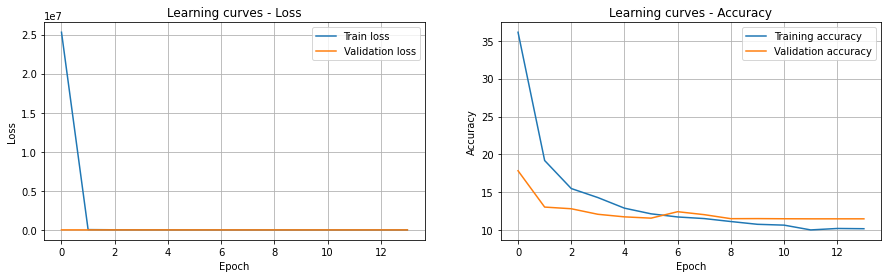

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 7, Nh = 2048, act = LeakyReLU, opt = RMSprop, lr = 1, reg = False, tbs = 250



Best val_loss: 14355610415646988290962227200.00000 - train_loss: 14819768275473383566782496768.00000 - val_acc: 11.66% - train_acc: 11.74% - execution_time: 448s


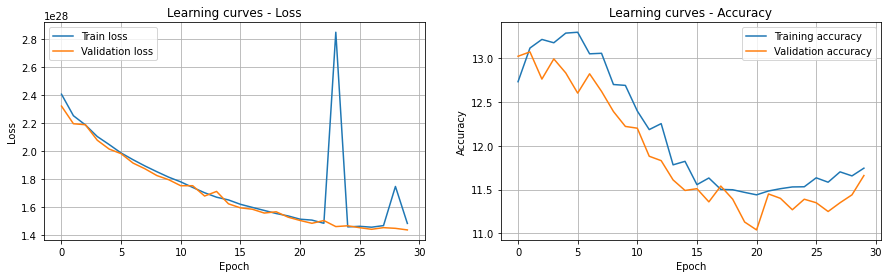

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 1, Nh = 1024, act = LeakyReLU, opt = SGD, lr = 0.1, reg = L2 (wd=0.1), tbs = 1000


Best val_loss: 1.14315 - train_loss: 1.15007 - val_acc: 73.71% - train_acc: 73.28% - execution_time: 207s


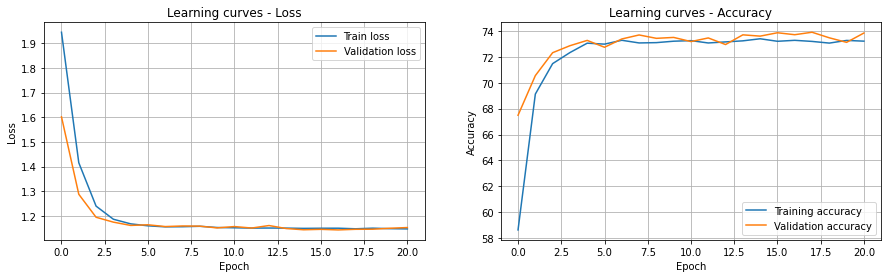

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 4, Nh = 64, act = LeakyReLU, opt = SGD, lr = 1, reg = L2 (wd=0.01), tbs = 100


Best val_loss: 2.30242 - train_loss: 2.28906 - val_acc: 11.51% - train_acc: 11.76% - execution_time: 55s


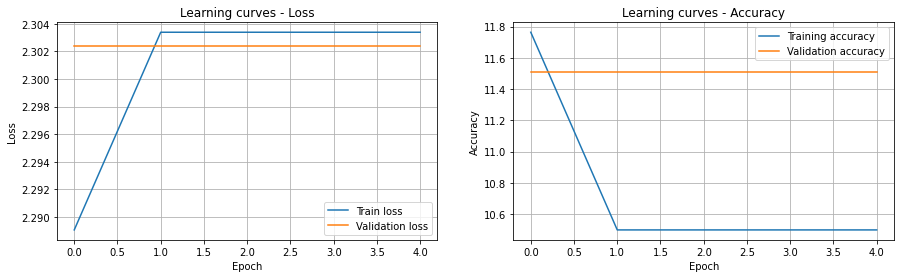

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 2, Nh = 256, act = LeakyReLU, opt = SGD, lr = 0.1, reg = Dropout, tbs = 1000



Best val_loss: 0.23953 - train_loss: 0.32363 - val_acc: 92.87% - train_acc: 90.33% - execution_time: 297s


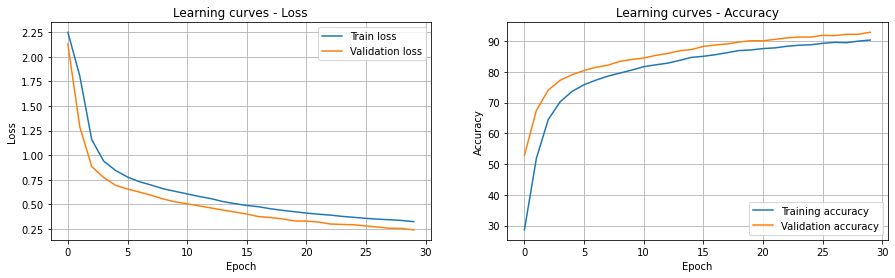

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 7, Nh = 64, act = Sigmoid, opt = Adam, lr = 0.001, reg = Dropout, tbs = 1000



Best val_loss: 1.11211 - train_loss: 1.13292 - val_acc: 55.86% - train_acc: 56.52% - execution_time: 300s


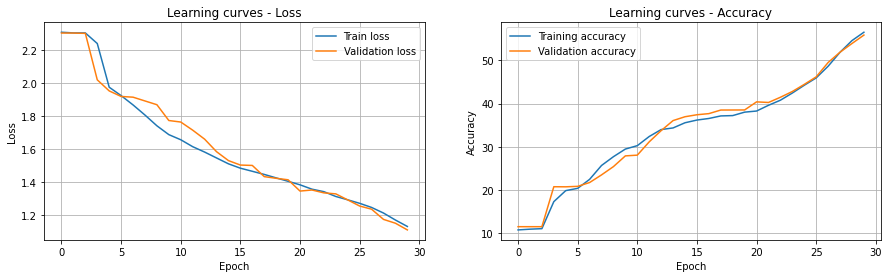

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 6, Nh = 256, act = ELU, opt = Adam, lr = 0.01, reg = L2 (wd=0.001), tbs = 1000


Best val_loss: 0.17109 - train_loss: 0.19709 - val_acc: 94.72% - train_acc: 93.81% - execution_time: 169s


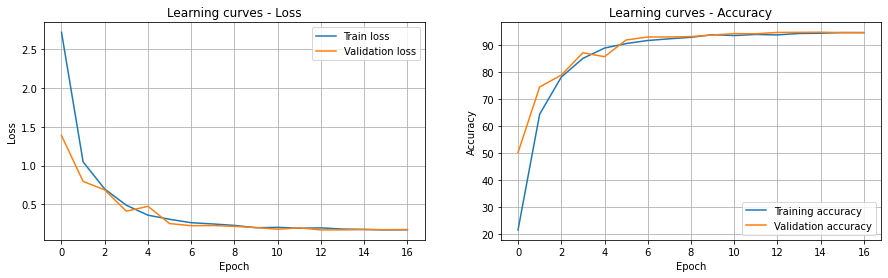

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 6, Nh = 1024, act = LeakyReLU, opt = Adam, lr = 0.01, reg = Dropout, tbs = 100


Best val_loss: 5788.68213 - train_loss: 102351.15625 - val_acc: 10.36% - train_acc: 10.20% - execution_time: 65s


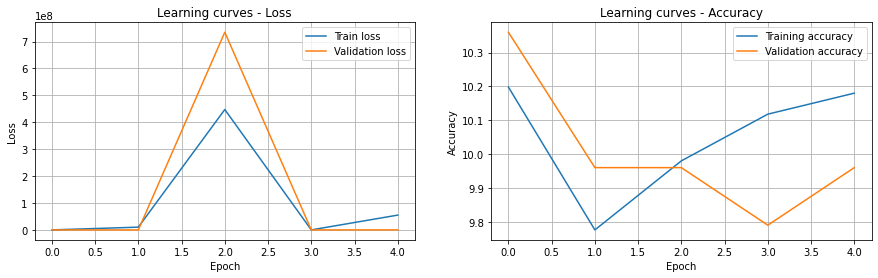

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 8, Nh = 2048, act = LeakyReLU, opt = RMSprop, lr = 1, reg = False, tbs = 1000


Best val_loss: 1230038046781196703127304142848.00000 - train_loss: 1242281745250798763751434616832.00000 - val_acc: 9.96% - train_acc: 9.69% - execution_time: 229s


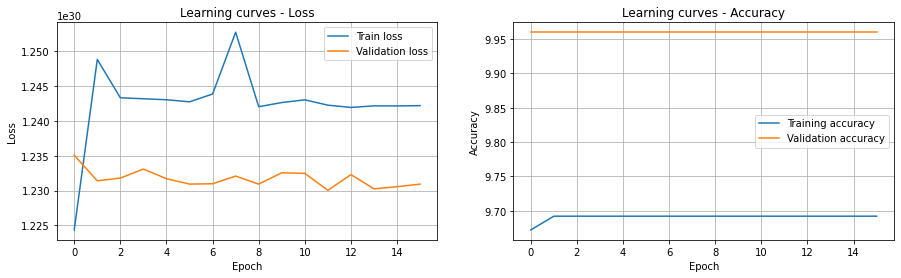

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 5, Nh = 512, act = LeakyReLU, opt = SGD, lr = 0.001, reg = L2 (wd=0.0001), tbs = 250



Best val_loss: 2.29979 - train_loss: 2.29998 - val_acc: 11.51% - train_acc: 11.18% - execution_time: 314s


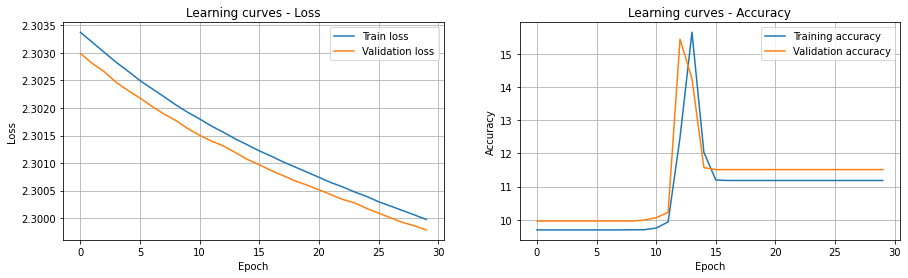

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 3, Nh = 512, act = Sigmoid, opt = SGD, lr = 0.01, reg = L2 (wd=1e-05), tbs = 500



Best val_loss: 2.30100 - train_loss: 2.30150 - val_acc: 11.51% - train_acc: 11.38% - execution_time: 300s


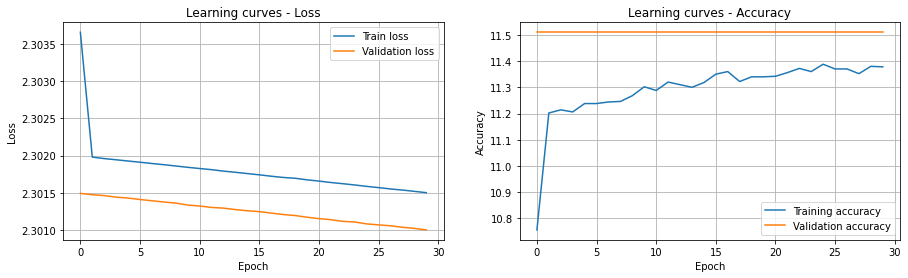

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 2, Nh = 64, act = ELU, opt = RMSprop, lr = 0.01, reg = Batch norm, tbs = 100


Best val_loss: 0.09628 - train_loss: 0.11578 - val_acc: 97.11% - train_acc: 96.45% - execution_time: 178s


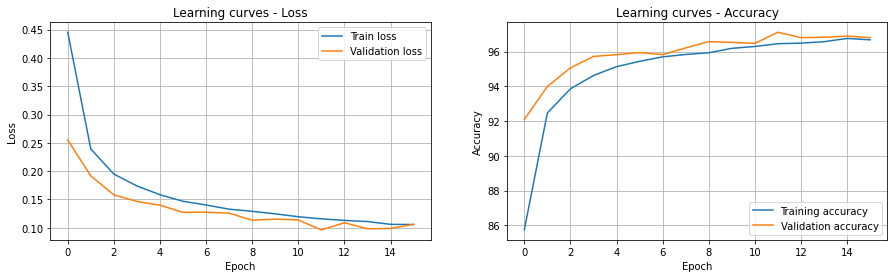

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 6, Nh = 2048, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = Batch norm, tbs = 100


Best val_loss: 0.05924 - train_loss: 0.06830 - val_acc: 98.05% - train_acc: 97.86% - execution_time: 287s


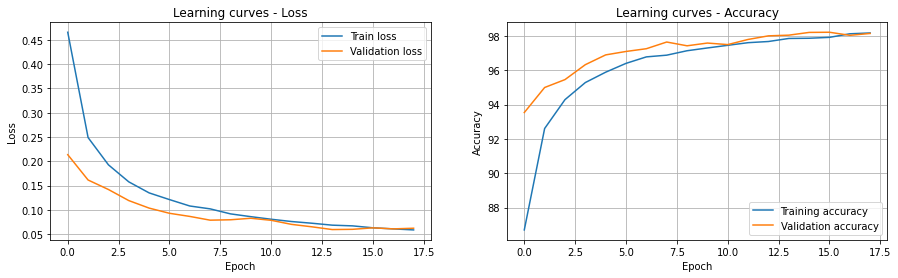

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 1, Nh = 256, act = Sigmoid, opt = Adam, lr = 0.01, reg = L2 (wd=0.001), tbs = 1000


Best val_loss: 0.29971 - train_loss: 0.31340 - val_acc: 91.50% - train_acc: 91.51% - execution_time: 280s


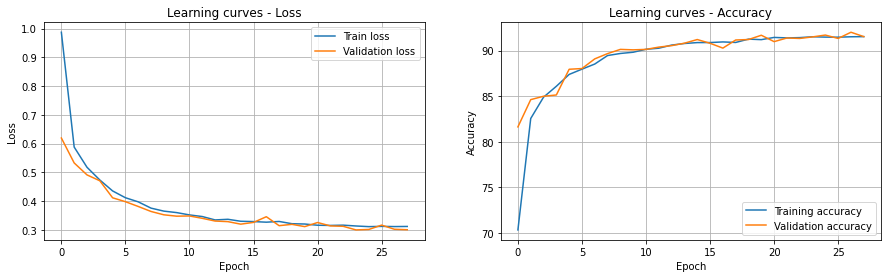

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 5, Nh = 1024, act = LeakyReLU, opt = Adam, lr = 0.01, reg = Dropout, tbs = 500


Best val_loss: 0.19240 - train_loss: 0.34457 - val_acc: 94.47% - train_acc: 90.72% - execution_time: 173s


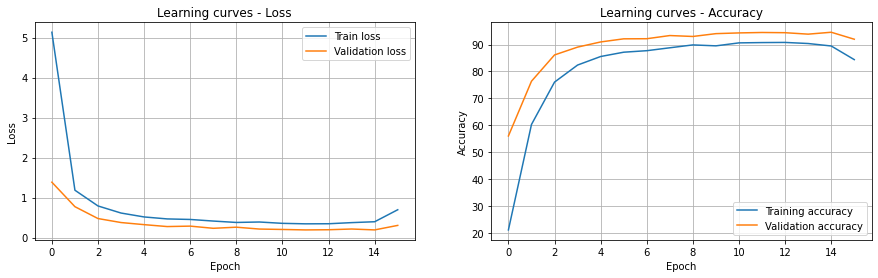

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 6, Nh = 128, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = False, tbs = 1000



Best val_loss: 0.08477 - train_loss: 0.08607 - val_acc: 97.40% - train_acc: 97.32% - execution_time: 299s


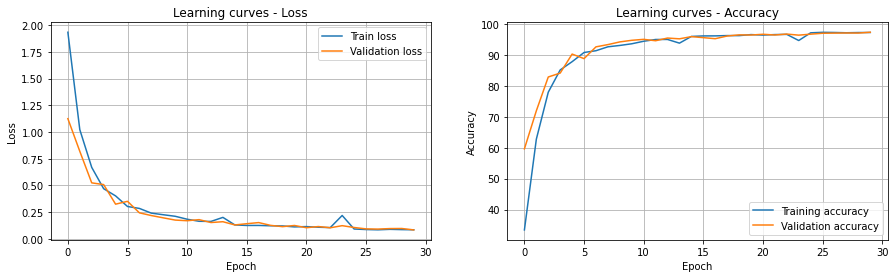

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 8, Nh = 256, act = Sigmoid, opt = SGD, lr = 1, reg = Dropout, tbs = 100


Best val_loss: 2.30115 - train_loss: 2.33410 - val_acc: 11.51% - train_acc: 10.28% - execution_time: 233s


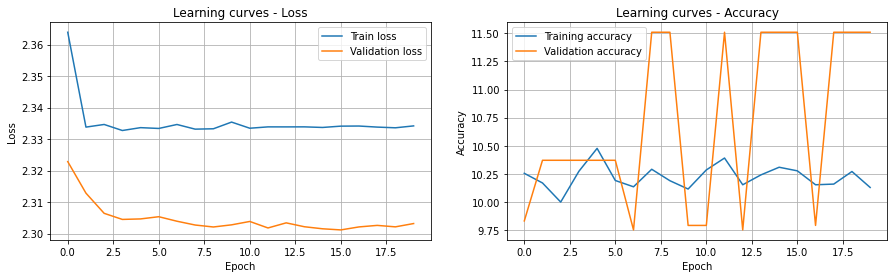

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 1, Nh = 64, act = Sigmoid, opt = RMSprop, lr = 0.1, reg = L2 (wd=0.0001), tbs = 100


Best val_loss: 0.66678 - train_loss: 0.90505 - val_acc: 80.33% - train_acc: 73.22% - execution_time: 64s


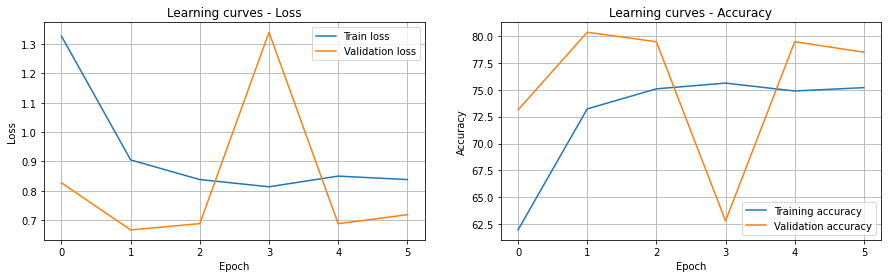

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 6, Nh = 256, act = LeakyReLU, opt = Adam, lr = 0.0001, reg = Dropout, tbs = 1000



Best val_loss: 0.19300 - train_loss: 0.28578 - val_acc: 94.18% - train_acc: 91.46% - execution_time: 300s


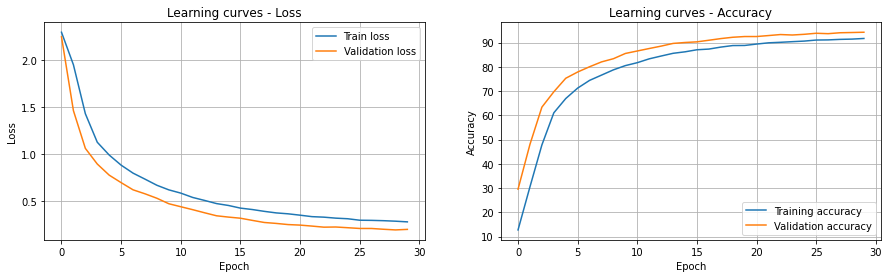

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 4, Nh = 128, act = LeakyReLU, opt = Adam, lr = 0.01, reg = Batch norm, tbs = 100


Best val_loss: 0.06436 - train_loss: 0.07301 - val_acc: 98.03% - train_acc: 97.63% - execution_time: 354s


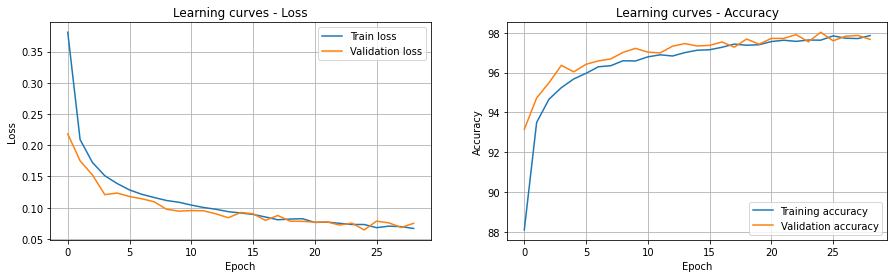

--------------------------------------------------------------------------------------------------------------------
RESULTS
Val_acc = 98.05 -> HL = 6, Nh = 2048, act = LeakyReLU, opt = RMSprop, lr =  0.001, reg = Batch norm    , tbs = 100
Val_acc = 98.03 -> HL = 4, Nh =  128, act = LeakyReLU, opt = Adam   , lr =   0.01, reg = Batch norm    , tbs = 100
Val_acc = 97.40 -> HL = 6, Nh =  128, act = LeakyReLU, opt = RMSprop, lr =  0.001, reg = False         , tbs = 1000
Val_acc = 97.11 -> HL = 2, Nh =   64, act = ELU      , opt = RMSprop, lr =   0.01, reg = Batch norm    , tbs = 100
Val_acc = 94.72 -> HL = 6, Nh =  256, act = ELU      , opt = Adam   , lr =   0.01, reg = L2 (wd=0.001) , tbs = 1000
Val_acc = 94.47 -> HL = 5, Nh = 1024, act = LeakyReLU, opt = Adam   , lr =   0.01, reg = Dropout       , tbs = 500
Val_acc = 94.18 -> HL = 6, Nh =  256, act = LeakyReLU, opt = Adam   , lr = 0.0001, reg = Dropout       , tbs = 1000
Val_acc = 92.87 -> HL = 2, Nh =  256, act = LeakyReLU, opt = SGD   

In [ ]:
# Define possible values for each hyper-parameter
HL_v = [1,2,3,4,5,6,7,8]
Nh_v = [64, 128, 256, 512, 1024, 2048]
act_v = ['Sigmoid', 'LeakyReLU', 'ELU']
act_dict = {'Sigmoid':nn.Sigmoid(), 'LeakyReLU':nn.LeakyReLU(), 'ELU':nn.ELU()}
opt_v = ['Adam', 'RMSprop', 'SGD']
lr_v = [1, 0.1, 0.01, 0.001, 0.0001]
reg_v = ['False', 'Dropout', 'Batch norm', 'L2']
wd_v = [0.1, 0.01, 0.001, 0.0001, 0.00001]
train_batch_size_v = [100, 250, 500, 1000]
results = []

# RANDOM SEARCH
random.seed(1)
pbar = tq.tqdm(total = 20, desc = 'Random search progress')
random_coarse_grid = list(itertools.product(HL_v, Nh_v, act_v, opt_v, lr_v, reg_v, wd_v, train_batch_size_v))
for (HL, Nh, act, opt, lr, reg, wd, tbs) in random.sample(random_coarse_grid, 20):
    # sampling combinations from itertools.product, we are sure no combination is repeated
    print(f'FCNN with HL = {HL}, Nh = {Nh}, act = {act}, opt = {opt}, lr = {lr},'
          f' reg = {reg if reg != "L2" else reg + " (wd=" + str(wd) + ")"}, tbs = {tbs}')
    
    start_time = time.time()
    # NETWORK INITIALIZATION
    torch.manual_seed(0)
    activation = act_dict[act]
    net = FCNet(784, Nh, 10, HL, activation, reg)
    net.to(device)

    # Define the loss function
    loss_function = nn.CrossEntropyLoss()

    # Define the optimizer
    if reg == 'L2':
        opt_dict = {'Adam': optim.Adam(net.parameters(), lr =lr, weight_decay = wd),
                    'RMSprop': optim.RMSprop(net.parameters(), lr = lr, weight_decay = wd),
                    'SGD': optim.SGD(net.parameters(), lr = lr, weight_decay = wd)}
        optimizer = opt_dict[opt]
    else:
        opt_dict = {'Adam': optim.Adam(net.parameters(), lr = lr), 
                    'RMSprop': optim.RMSprop(net.parameters(), lr = lr),
                    'SGD': optim.SGD(net.parameters(), lr = lr)}
        optimizer = opt_dict[opt]

    # TRAINING LOOP
    num_epochs = 30
    patience = 4
    train_dataloader, val_dataloader = myDataLoader(train_dataset, val_dataset, tbs, val_batch_size=250)
    train_loss_log, val_loss_log, best_t_loss, best_v_loss, train_accuracy_log, val_accuracy_log, best_t_acc, best_v_acc, net = training_loop(net, 
                            train_dataloader, val_dataloader, loss_function, optimizer, num_epochs, no_improve_epoch=0, patience=patience)
    
    results.append((np.round(best_v_acc, 2), f'HL = {HL}, Nh = {Nh:4}, act = {act:9}, opt = {opt:7}, lr = {lr:6},'
                                             f' reg = {reg if reg != "L2" else reg + " (wd=" + str(wd) + ")":14}, tbs = {tbs}'))
    run_time = time.time() - start_time
    print(f'Best val_loss: {best_v_loss:.5f} - train_loss: {best_t_loss:.5f} - val_acc: {best_v_acc:.2f}% - train_acc: {best_t_acc:.2f}% - execution_time: {run_time:.0f}s') 
    
    plot_losses(train_loss_log, val_loss_log, train_accuracy_log, val_accuracy_log)
    print('--------------------------------------------------------------------------------------------------------------------')
    pbar.update(1)

print('RESULTS')
for r in sorted(results, key=lambda tup: tup[0], reverse = True):
    print(f'Val_acc = {r[0]:.2f} -> {r[1]}')

Random search with tbs=100, with more focus lr and without SGD

FCNN with HL = 2, Nh = 2048, act = LeakyReLU, opt = Adam, lr = 0.001, reg = Batch norm, tbs = 100


Best val_loss: 0.06748 - train_loss: 0.06207 - val_acc: 98.00% - train_acc: 97.98% - execution_time: 225s


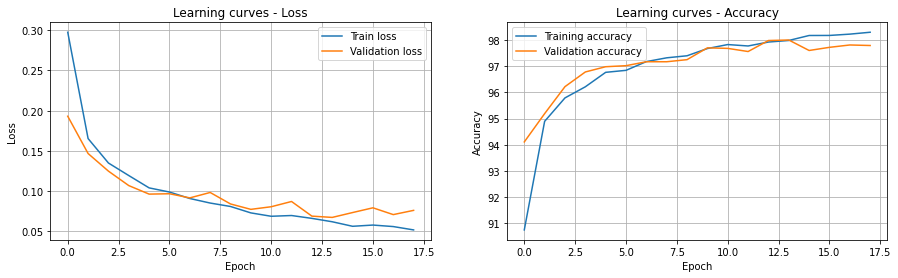

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 1, Nh = 2048, act = LeakyReLU, opt = Adam, lr = 0.01, reg = Batch norm, tbs = 100


Best val_loss: 0.08923 - train_loss: 0.10459 - val_acc: 97.40% - train_acc: 96.80% - execution_time: 153s


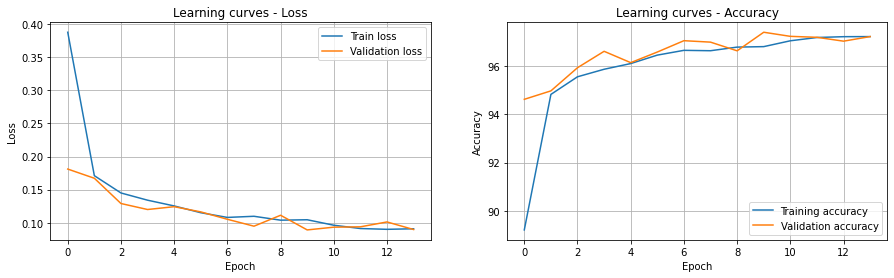

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 4, Nh = 512, act = ELU, opt = Adam, lr = 0.001, reg = False, tbs = 100


Best val_loss: 0.07621 - train_loss: 0.07752 - val_acc: 97.68% - train_acc: 97.68% - execution_time: 296s


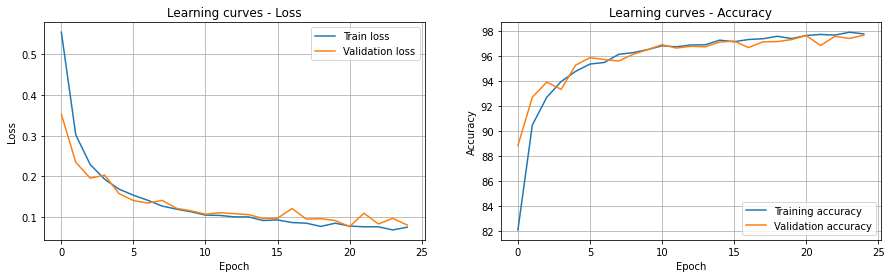

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 2, Nh = 1024, act = Softplus, opt = Adam, lr = 0.01, reg = Batch norm, tbs = 100


Best val_loss: 0.06398 - train_loss: 0.06626 - val_acc: 98.01% - train_acc: 97.92% - execution_time: 282s


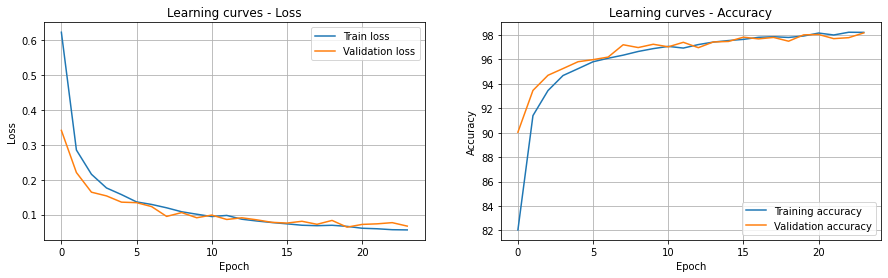

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 8, Nh = 64, act = Softplus, opt = RMSprop, lr = 0.001, reg = Dropout, tbs = 100


Best val_loss: 0.25788 - train_loss: 0.41893 - val_acc: 93.27% - train_acc: 88.50% - execution_time: 325s


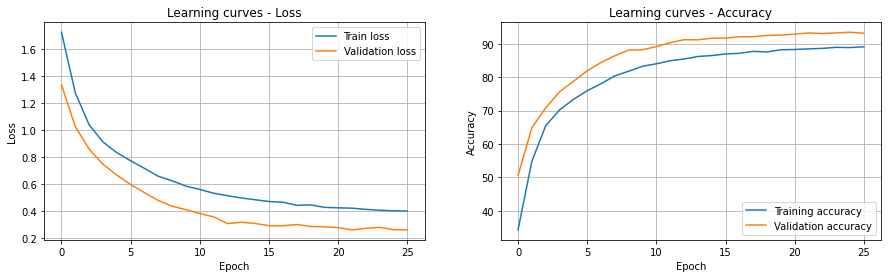

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 7, Nh = 256, act = LeakyReLU, opt = Adam, lr = 0.01, reg = Dropout, tbs = 100


Best val_loss: 2.03812 - train_loss: 2.88497 - val_acc: 23.35% - train_acc: 38.68% - execution_time: 61s


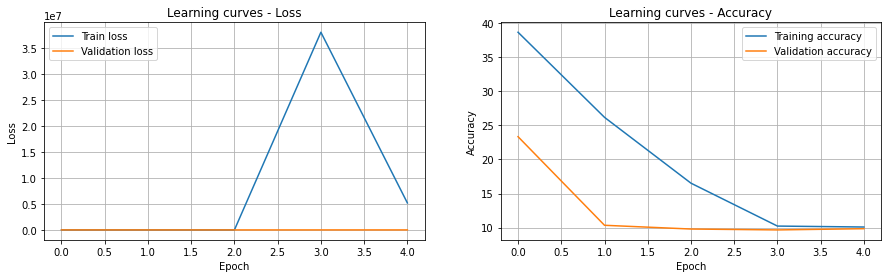

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 7, Nh = 1024, act = Softplus, opt = RMSprop, lr = 0.001, reg = Batch norm, tbs = 100


Best val_loss: 0.08834 - train_loss: 0.10723 - val_acc: 97.35% - train_acc: 96.67% - execution_time: 303s


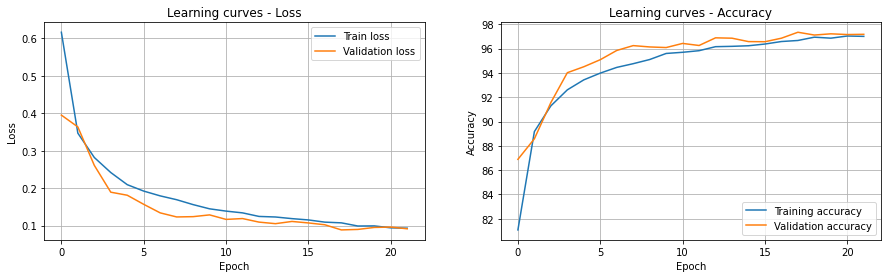

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 6, Nh = 256, act = LeakyReLU, opt = Adam, lr = 0.01, reg = Batch norm, tbs = 100


Best val_loss: 0.06999 - train_loss: 0.08306 - val_acc: 97.84% - train_acc: 97.48% - execution_time: 300s


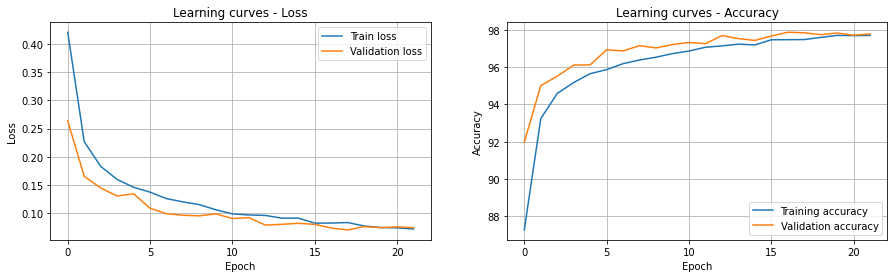

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 3, Nh = 2048, act = ELU, opt = RMSprop, lr = 0.01, reg = L2 (wd=0.0001), tbs = 100


Best val_loss: 6.85993 - train_loss: 35.32541 - val_acc: 59.74% - train_acc: 52.94% - execution_time: 97s


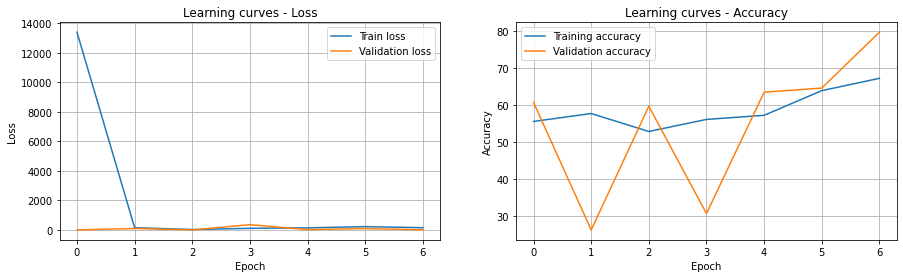

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 2, Nh = 256, act = Softplus, opt = Adam, lr = 0.01, reg = False, tbs = 100


Best val_loss: 0.14914 - train_loss: 0.16896 - val_acc: 95.75% - train_acc: 95.30% - execution_time: 140s


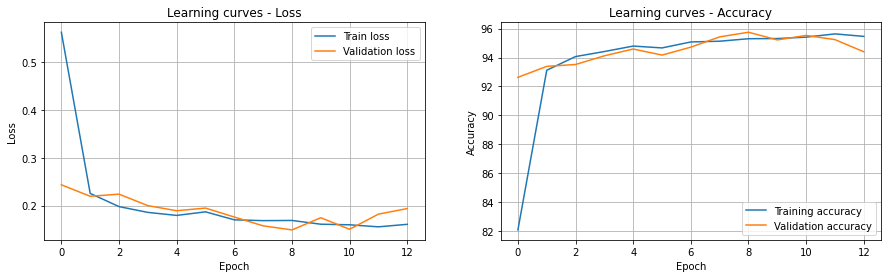

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 7, Nh = 2048, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = Batch norm, tbs = 100


Best val_loss: 0.06617 - train_loss: 0.07864 - val_acc: 97.96% - train_acc: 97.62% - execution_time: 263s


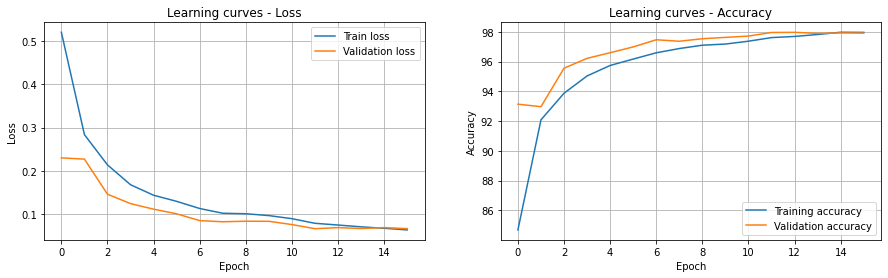

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 1, Nh = 256, act = LeakyReLU, opt = Adam, lr = 0.001, reg = False, tbs = 100


Best val_loss: 0.08290 - train_loss: 0.07926 - val_acc: 97.46% - train_acc: 97.58% - execution_time: 215s


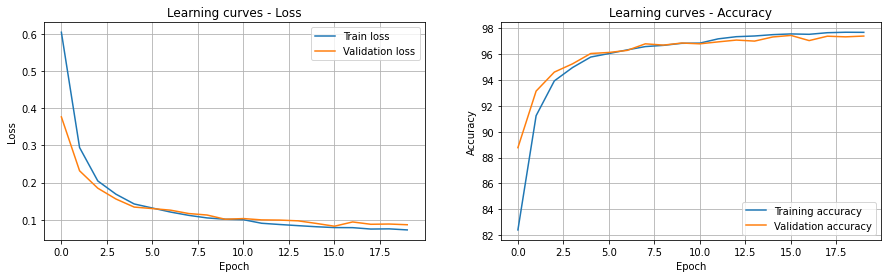

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 6, Nh = 512, act = Softplus, opt = RMSprop, lr = 0.001, reg = False, tbs = 100


Best val_loss: 0.07380 - train_loss: 0.06227 - val_acc: 97.88% - train_acc: 98.16% - execution_time: 321s


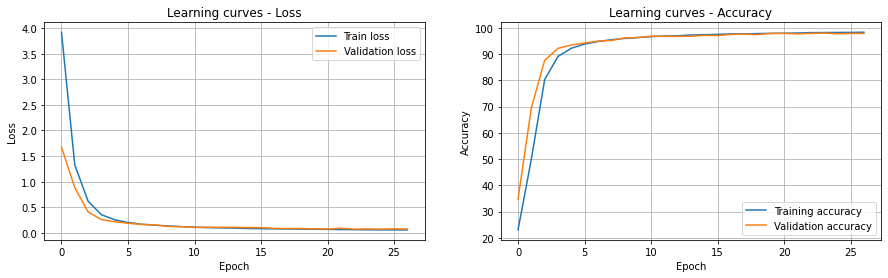

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 7, Nh = 64, act = ELU, opt = RMSprop, lr = 0.001, reg = False, tbs = 100


Best val_loss: 0.12542 - train_loss: 0.13448 - val_acc: 96.17% - train_acc: 95.79% - execution_time: 170s


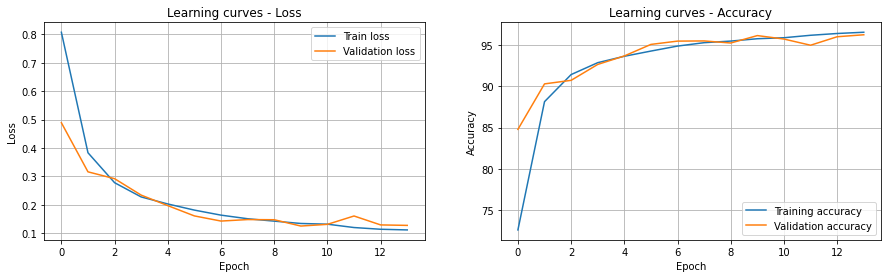

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 1, Nh = 64, act = Softplus, opt = RMSprop, lr = 0.01, reg = False, tbs = 100


Best val_loss: 0.16024 - train_loss: 0.17086 - val_acc: 95.59% - train_acc: 95.03% - execution_time: 155s


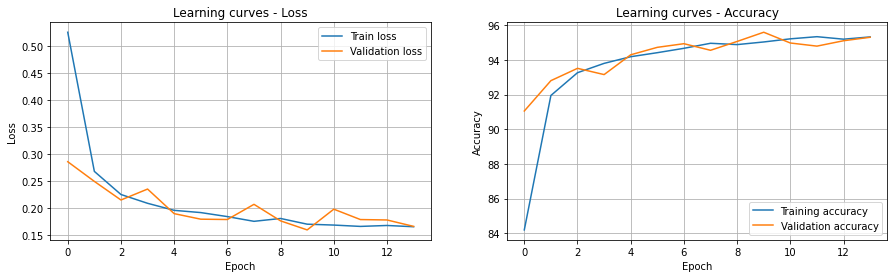

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 7, Nh = 256, act = Softplus, opt = Adam, lr = 0.01, reg = False, tbs = 100


Best val_loss: 0.28019 - train_loss: 0.30496 - val_acc: 93.25% - train_acc: 92.63% - execution_time: 137s


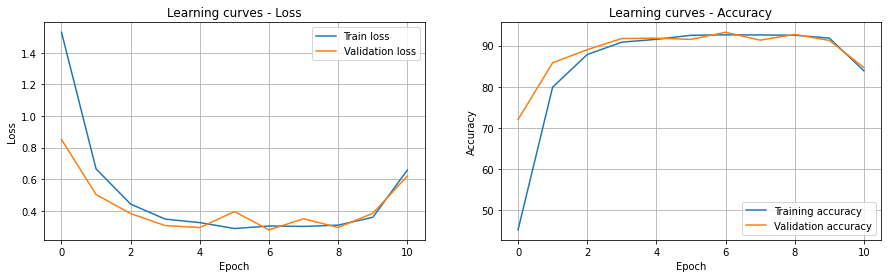

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 4, Nh = 1024, act = ELU, opt = Adam, lr = 0.01, reg = Batch norm, tbs = 100


Best val_loss: 0.06261 - train_loss: 0.06305 - val_acc: 98.13% - train_acc: 97.95% - execution_time: 334s


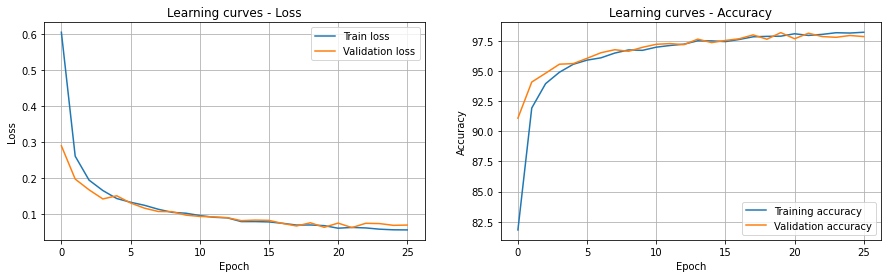

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 4, Nh = 128, act = LeakyReLU, opt = RMSprop, lr = 0.01, reg = Dropout, tbs = 100


Best val_loss: 0.28175 - train_loss: 0.65717 - val_acc: 92.42% - train_acc: 83.80% - execution_time: 201s


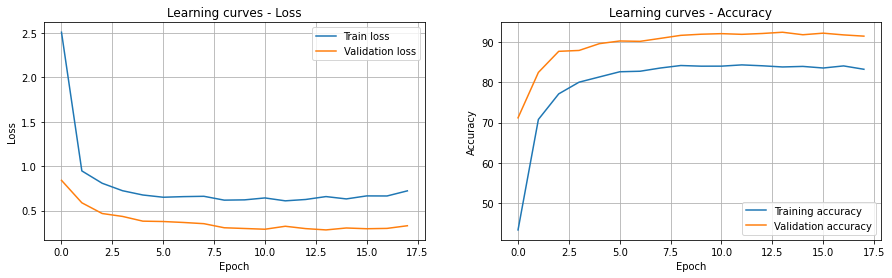

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 2, Nh = 256, act = ELU, opt = Adam, lr = 0.01, reg = Batch norm, tbs = 100


Best val_loss: 0.05720 - train_loss: 0.06453 - val_acc: 98.27% - train_acc: 97.98% - execution_time: 402s


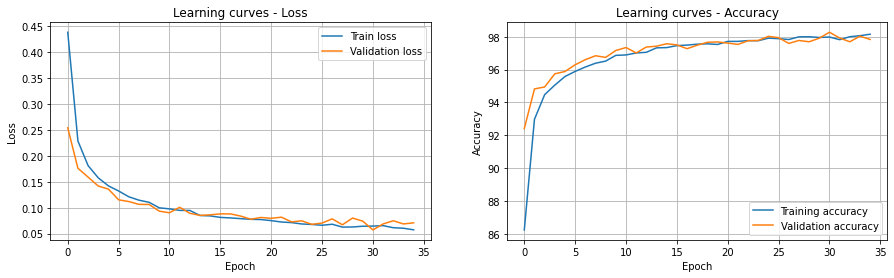

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 5, Nh = 512, act = Softplus, opt = Adam, lr = 0.001, reg = False, tbs = 100


Best val_loss: 0.07557 - train_loss: 0.08151 - val_acc: 97.65% - train_acc: 97.51% - execution_time: 205s


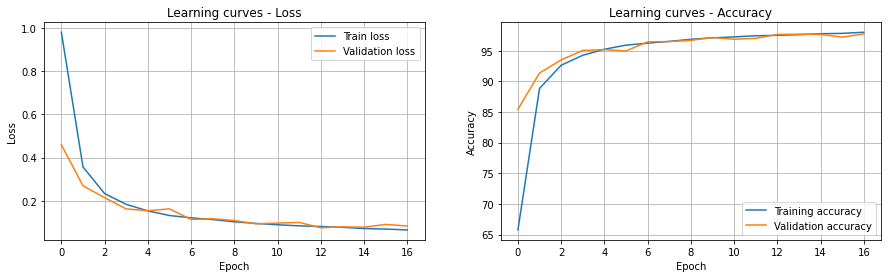

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 1, Nh = 256, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = Dropout, tbs = 100


Best val_loss: 0.08816 - train_loss: 0.13988 - val_acc: 97.37% - train_acc: 95.82% - execution_time: 257s


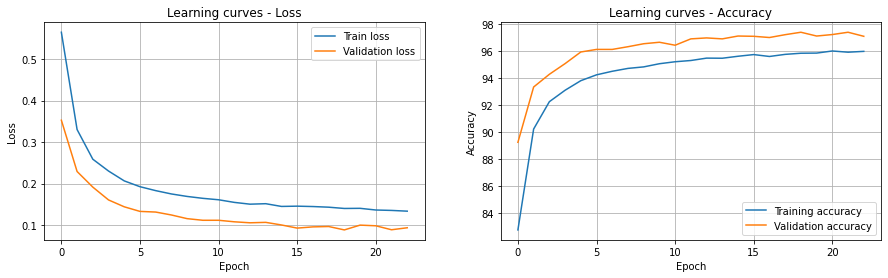

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 1, Nh = 128, act = ELU, opt = RMSprop, lr = 0.01, reg = L2 (wd=0.01), tbs = 100


Best val_loss: 0.58536 - train_loss: 0.67898 - val_acc: 82.59% - train_acc: 79.34% - execution_time: 88s


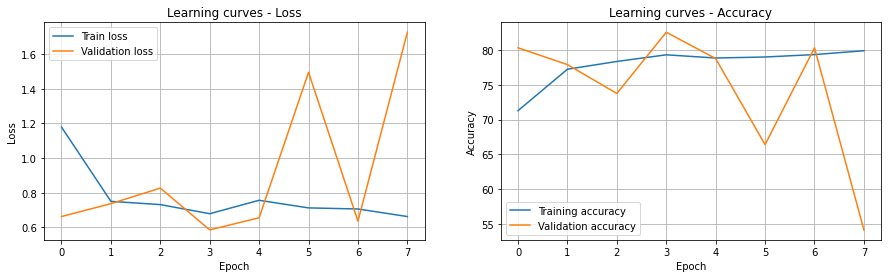

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 1, Nh = 256, act = Softplus, opt = RMSprop, lr = 0.01, reg = False, tbs = 100


Best val_loss: 0.16471 - train_loss: 0.17115 - val_acc: 95.54% - train_acc: 95.41% - execution_time: 132s


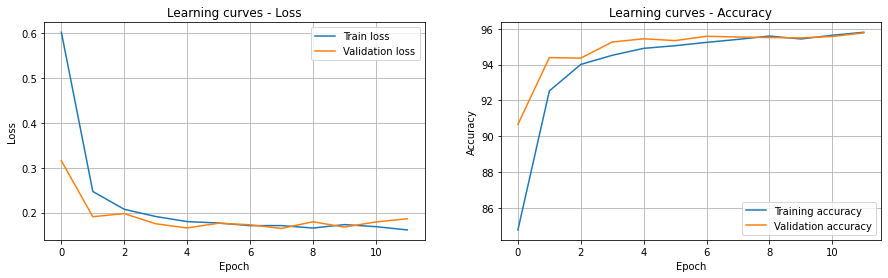

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 8, Nh = 1024, act = Softplus, opt = RMSprop, lr = 0.01, reg = Dropout, tbs = 100


Best val_loss: 2.36794 - train_loss: 103570718720.00000 - val_acc: 10.29% - train_acc: 10.44% - execution_time: 69s


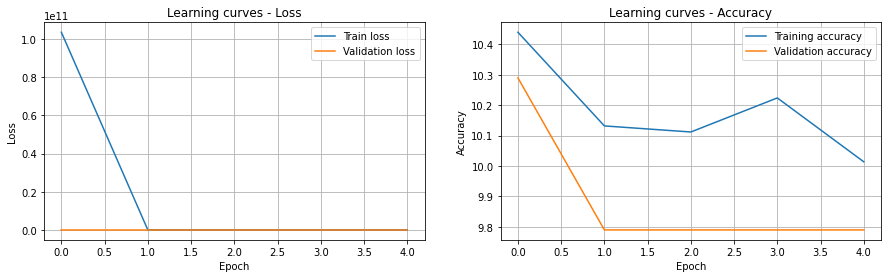

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 1, Nh = 64, act = ELU, opt = Adam, lr = 0.001, reg = Dropout, tbs = 100


Best val_loss: 0.19936 - train_loss: 0.29766 - val_acc: 94.06% - train_acc: 90.75% - execution_time: 227s


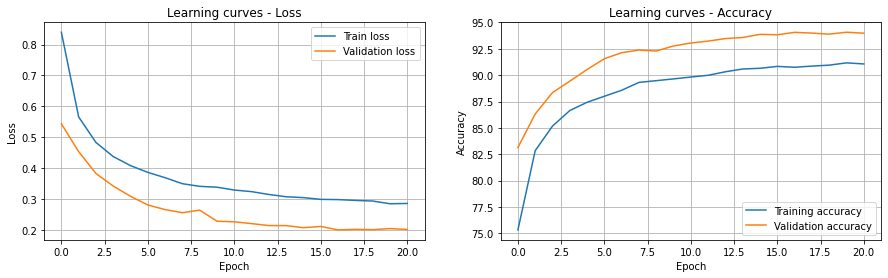

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 6, Nh = 256, act = LeakyReLU, opt = RMSprop, lr = 0.01, reg = Dropout, tbs = 100


Best val_loss: 2.15526 - train_loss: 3.62149 - val_acc: 17.88% - train_acc: 14.24% - execution_time: 104s


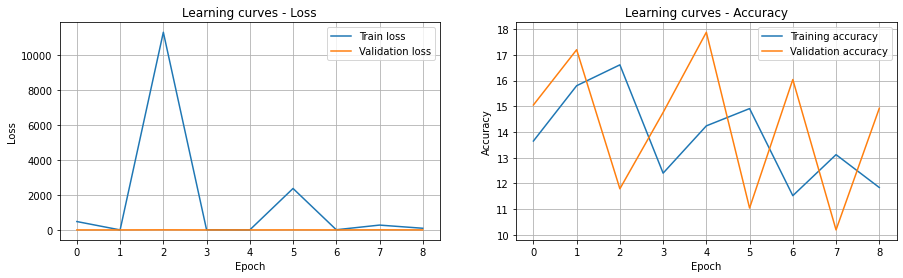

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 4, Nh = 64, act = LeakyReLU, opt = Adam, lr = 0.001, reg = L2 (wd=0.1), tbs = 100


Best val_loss: 2.30150 - train_loss: 2.30163 - val_acc: 11.51% - train_acc: 11.18% - execution_time: 68s


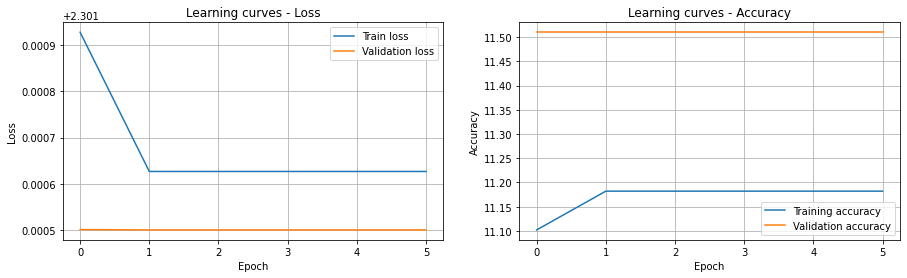

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 7, Nh = 64, act = Softplus, opt = Adam, lr = 0.01, reg = False, tbs = 100


Best val_loss: 0.19723 - train_loss: 0.21122 - val_acc: 94.65% - train_acc: 94.53% - execution_time: 166s


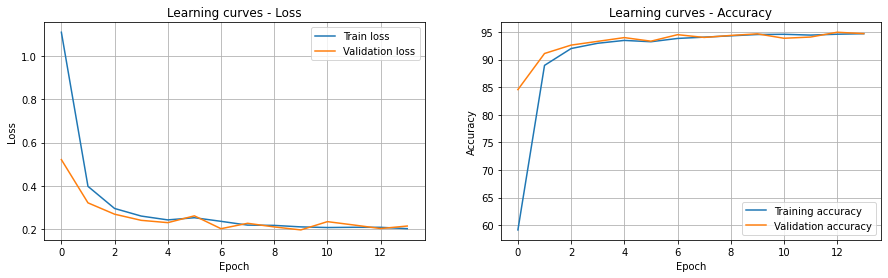

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 1, Nh = 256, act = LeakyReLU, opt = Adam, lr = 0.001, reg = Batch norm, tbs = 100


Best val_loss: 0.08391 - train_loss: 0.08541 - val_acc: 97.49% - train_acc: 97.42% - execution_time: 218s


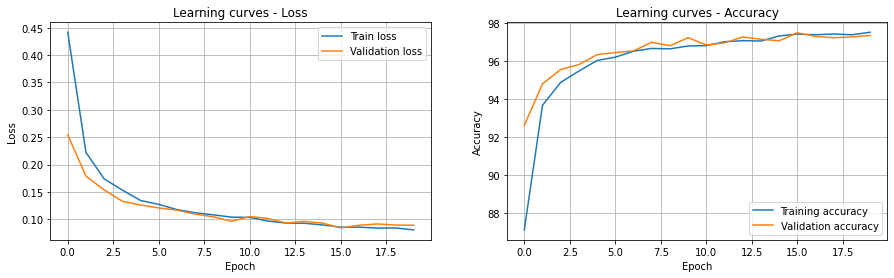

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 8, Nh = 512, act = Softplus, opt = Adam, lr = 0.01, reg = Dropout, tbs = 100


Best val_loss: 2.45838 - train_loss: 12.42361 - val_acc: 11.51% - train_acc: 10.25% - execution_time: 61s


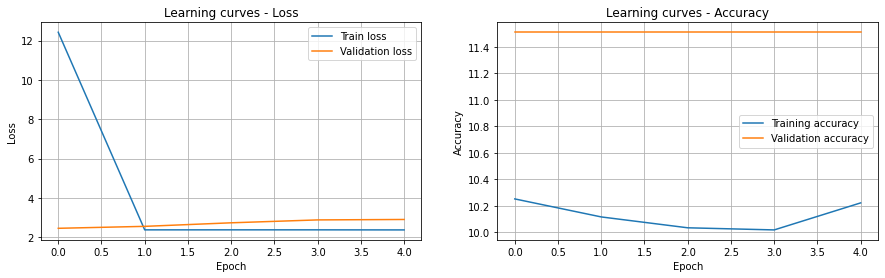

--------------------------------------------------------------------------------------------------------------------
RESULTS
Val_acc = 98.27 -> HL = 2, Nh =  256, act = ELU      , opt = Adam   , lr =   0.01, reg = Batch norm    , tbs = 100
Val_acc = 98.13 -> HL = 4, Nh = 1024, act = ELU      , opt = Adam   , lr =   0.01, reg = Batch norm    , tbs = 100
Val_acc = 98.01 -> HL = 2, Nh = 1024, act = Softplus , opt = Adam   , lr =   0.01, reg = Batch norm    , tbs = 100
Val_acc = 98.00 -> HL = 2, Nh = 2048, act = LeakyReLU, opt = Adam   , lr =  0.001, reg = Batch norm    , tbs = 100
Val_acc = 97.96 -> HL = 7, Nh = 2048, act = LeakyReLU, opt = RMSprop, lr =  0.001, reg = Batch norm    , tbs = 100
Val_acc = 97.88 -> HL = 6, Nh =  512, act = Softplus , opt = RMSprop, lr =  0.001, reg = False         , tbs = 100
Val_acc = 97.84 -> HL = 6, Nh =  256, act = LeakyReLU, opt = Adam   , lr =   0.01, reg = Batch norm    , tbs = 100
Val_acc = 97.68 -> HL = 4, Nh =  512, act = ELU      , opt = Adam   , 

In [ ]:
# Define possible values for each hyper-parameter
HL_v = [1,2,3,4,5,6,7,8]
Nh_v = [64, 128, 256, 512, 1024, 2048]
act_v = ['Softplus', 'LeakyReLU', 'ELU']
act_dict = {'Softplus':nn.Softplus(), 'LeakyReLU':nn.LeakyReLU(), 'ELU':nn.ELU()}
opt_v = ['Adam', 'RMSprop']
lr_v = [0.01, 0.001]
reg_v = ['False', 'Dropout', 'Batch norm', 'L2']
wd_v = [0.1, 0.01, 0.001, 0.0001]
tbs = 100
results = []

# RANDOM SEARCH
random.seed(1)
pbar = tq.tqdm(total = 30, desc = 'Random search progress')
random_coarse_grid = list(itertools.product(HL_v, Nh_v, act_v, opt_v, lr_v, reg_v, wd_v))
for (HL, Nh, act, opt, lr, reg, wd) in random.sample(random_coarse_grid, 30):
    # sampling combinations from itertools.product, we are sure no combination is repeated
    print(f'FCNN with HL = {HL}, Nh = {Nh}, act = {act}, opt = {opt}, lr = {lr},'
          f' reg = {reg if reg != "L2" else reg + " (wd=" + str(wd) + ")"}, tbs = {tbs}')
    
    start_time = time.time()
    # NETWORK INITIALIZATION
    torch.manual_seed(0)
    activation = act_dict[act]
    net = FCNet(784, Nh, 10, HL, activation, reg)
    net.to(device)

    # Define the loss function
    loss_function = nn.CrossEntropyLoss()

    # Define the optimizer
    if reg == 'L2':
        opt_dict = {'Adam': optim.Adam(net.parameters(), lr =lr, weight_decay = wd),
                    'RMSprop': optim.RMSprop(net.parameters(), lr = lr, weight_decay = wd)}
    else:
        opt_dict = {'Adam': optim.Adam(net.parameters(), lr = lr), 
                    'RMSprop': optim.RMSprop(net.parameters(), lr = lr)}
    optimizer = opt_dict[opt]

    # TRAINING LOOP
    num_epochs = 40
    patience = 4
    train_dataloader, val_dataloader = myDataLoader(train_dataset, val_dataset, 100, val_batch_size=250)
    train_loss_log, val_loss_log, best_t_loss, best_v_loss, train_accuracy_log, val_accuracy_log, best_t_acc, best_v_acc, net = training_loop(net, 
                            train_dataloader, val_dataloader, loss_function, optimizer, num_epochs, no_improve_epoch=0, patience=patience)
    
    results.append((np.round(best_v_acc, 2), f'HL = {HL}, Nh = {Nh:4}, act = {act:9}, opt = {opt:7}, lr = {lr:6},'
                                             f' reg = {reg if reg != "L2" else reg + " (wd=" + str(wd) + ")":14}, tbs = {tbs}'))
    run_time = time.time() - start_time
    print(f'Best val_loss: {best_v_loss:.5f} - train_loss: {best_t_loss:.5f} - val_acc: {best_v_acc:.2f}% - train_acc: {best_t_acc:.2f}% - execution_time: {run_time:.0f}s') 
    
    plot_losses(train_loss_log, val_loss_log, train_accuracy_log, val_accuracy_log)
    print('--------------------------------------------------------------------------------------------------------------------')
    pbar.update(1)

print('RESULTS')
for r in sorted(results, key=lambda tup: tup[0], reverse = True):
    print(f'Val_acc = {r[0]:.2f} -> {r[1]}')

Random search with those architecure with higher results: 2<HL<4, 2048<NH<4096, Adam optimizer, a new possible activation and more possible lr

FCNN with HL = 2, Nh = 1024, act = ELU, opt = Adam, lr = 0.003, reg = Batch norm, tbs = 100



Best val_loss: 0.05870 - train_loss: 0.04769 - val_acc: 98.19% - train_acc: 98.49% - execution_time: 485s


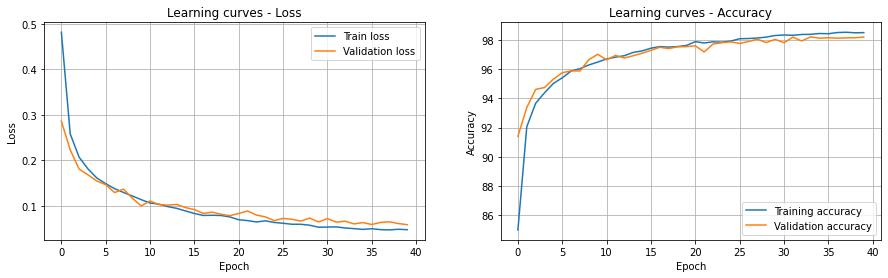

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 4, Nh = 1024, act = Softplus, opt = Adam, lr = 0.01, reg = Batch norm, tbs = 100


Best val_loss: 0.04957 - train_loss: 0.05119 - val_acc: 98.36% - train_acc: 98.34% - execution_time: 429s


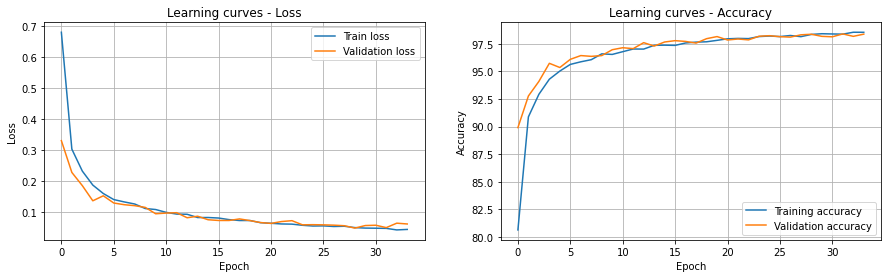

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 2, Nh = 512, act = LeakyReLU, opt = Adam, lr = 0.03, reg = Batch norm, tbs = 100


Best val_loss: 0.08853 - train_loss: 0.09399 - val_acc: 97.47% - train_acc: 97.10% - execution_time: 238s


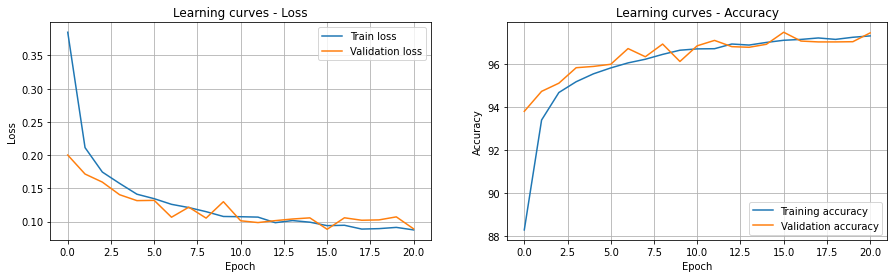

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 3, Nh = 256, act = LeakyReLU, opt = Adam, lr = 0.01, reg = Batch norm, tbs = 100


Best val_loss: 0.06045 - train_loss: 0.07164 - val_acc: 98.08% - train_acc: 97.69% - execution_time: 257s


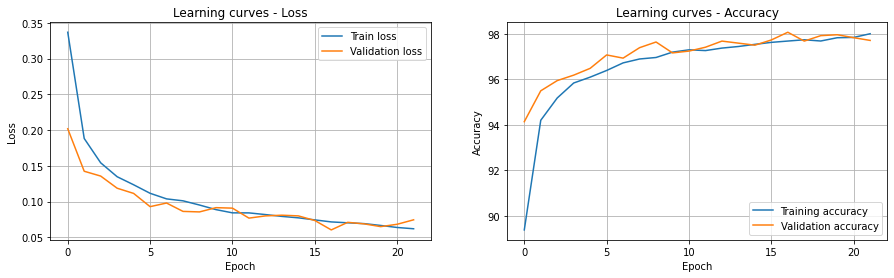

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 2, Nh = 1024, act = LeakyReLU, opt = Adam, lr = 0.003, reg = Batch norm, tbs = 100


Best val_loss: 0.05140 - train_loss: 0.04281 - val_acc: 98.40% - train_acc: 98.61% - execution_time: 337s


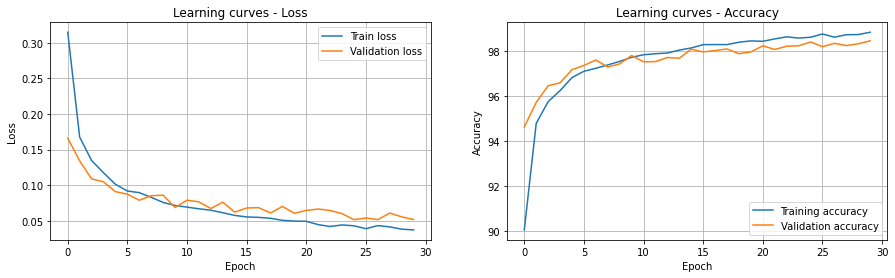

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 4, Nh = 256, act = LeakyReLU, opt = Adam, lr = 0.003, reg = Batch norm, tbs = 100


Best val_loss: 0.07064 - train_loss: 0.08370 - val_acc: 97.62% - train_acc: 97.34% - execution_time: 181s


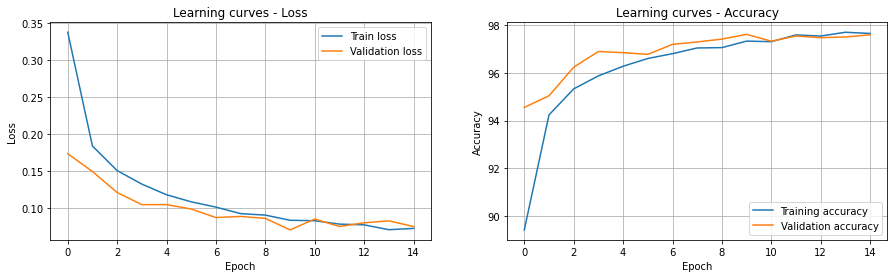

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 3, Nh = 4096, act = LeakyReLU, opt = Adam, lr = 0.001, reg = Batch norm, tbs = 100


Best val_loss: 0.04803 - train_loss: 0.04448 - val_acc: 98.43% - train_acc: 98.52% - execution_time: 630s


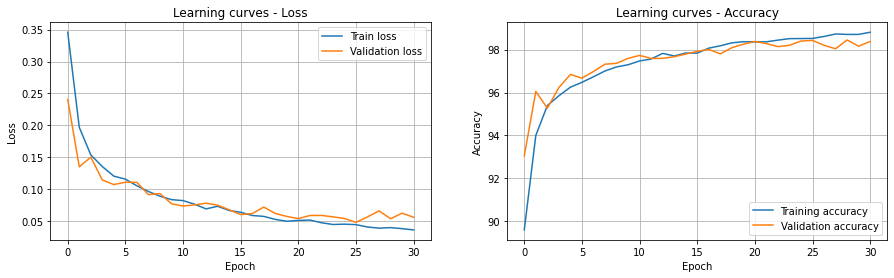

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 4, Nh = 256, act = Softplus, opt = Adam, lr = 0.03, reg = Batch norm, tbs = 100


Best val_loss: 0.05805 - train_loss: 0.07213 - val_acc: 98.18% - train_acc: 97.64% - execution_time: 355s


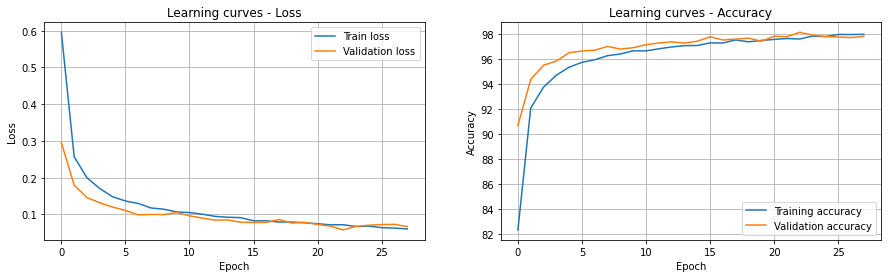

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 4, Nh = 2048, act = ELU, opt = Adam, lr = 0.003, reg = Batch norm, tbs = 100



Best val_loss: 0.04966 - train_loss: 0.04488 - val_acc: 98.52% - train_acc: 98.47% - execution_time: 646s


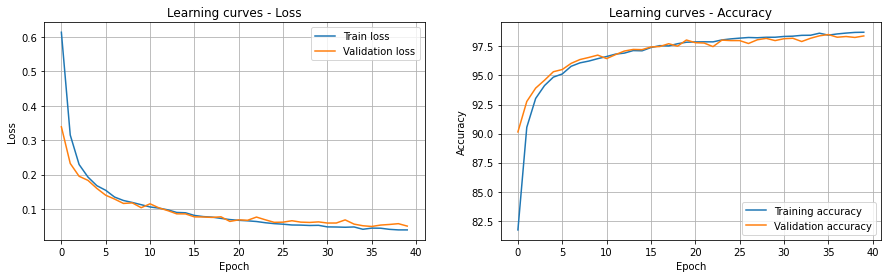

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 3, Nh = 2048, act = Softplus, opt = Adam, lr = 0.01, reg = Batch norm, tbs = 100


Best val_loss: 0.06630 - train_loss: 0.08421 - val_acc: 97.93% - train_acc: 97.35% - execution_time: 297s


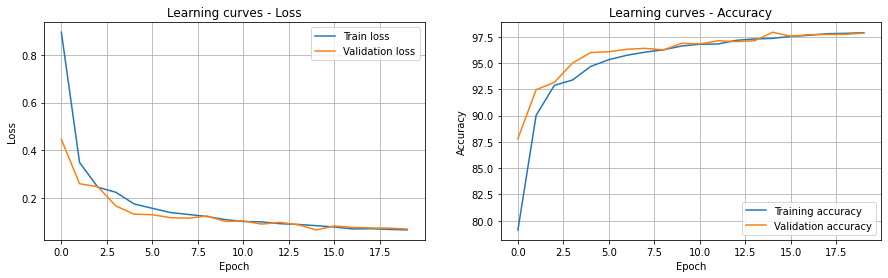

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 2, Nh = 4096, act = LeakyReLU, opt = Adam, lr = 0.01, reg = Batch norm, tbs = 100


Best val_loss: 0.05595 - train_loss: 0.05110 - val_acc: 98.52% - train_acc: 98.46% - execution_time: 616s


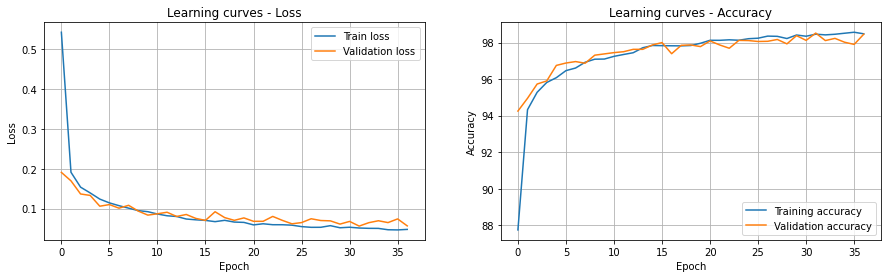

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 2, Nh = 1024, act = Softplus, opt = Adam, lr = 0.03, reg = Batch norm, tbs = 100


Best val_loss: 0.07292 - train_loss: 0.07645 - val_acc: 97.87% - train_acc: 97.57% - execution_time: 263s


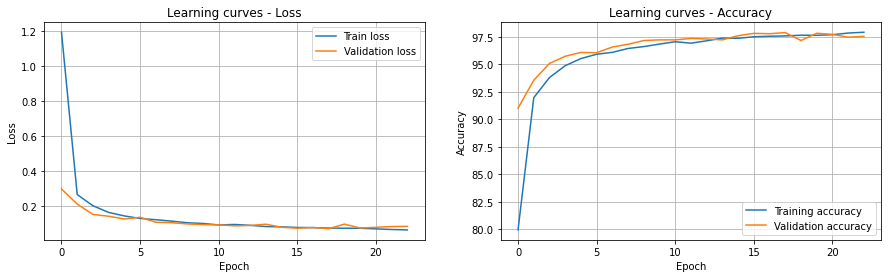

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 4, Nh = 256, act = LeakyReLU, opt = Adam, lr = 0.03, reg = Batch norm, tbs = 100


Best val_loss: 0.08834 - train_loss: 0.11089 - val_acc: 97.26% - train_acc: 96.68% - execution_time: 195s


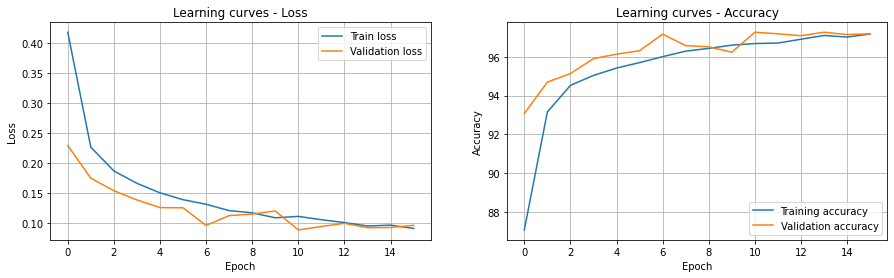

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 2, Nh = 256, act = LeakyReLU, opt = Adam, lr = 0.001, reg = Batch norm, tbs = 100


Best val_loss: 0.05591 - train_loss: 0.04621 - val_acc: 98.40% - train_acc: 98.48% - execution_time: 337s


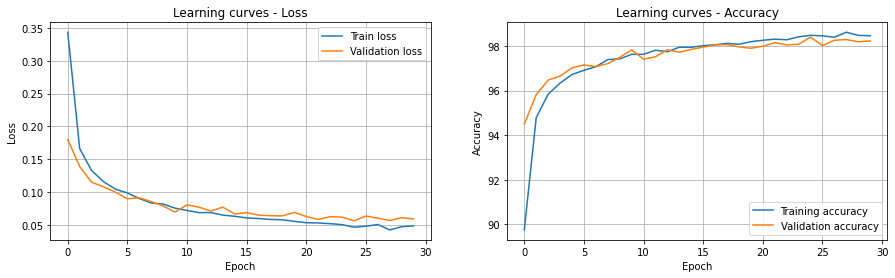

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 3, Nh = 2048, act = Softplus, opt = Adam, lr = 0.001, reg = Batch norm, tbs = 100


Best val_loss: 0.09186 - train_loss: 0.11786 - val_acc: 97.24% - train_acc: 96.38% - execution_time: 280s


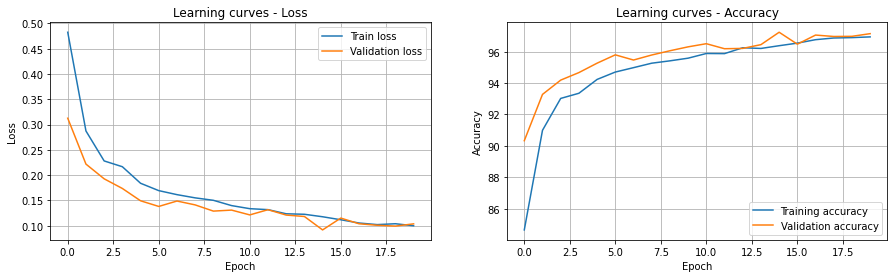

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 3, Nh = 4096, act = Softplus, opt = Adam, lr = 0.003, reg = Batch norm, tbs = 100


Best val_loss: 0.06863 - train_loss: 0.07455 - val_acc: 98.09% - train_acc: 97.74% - execution_time: 626s


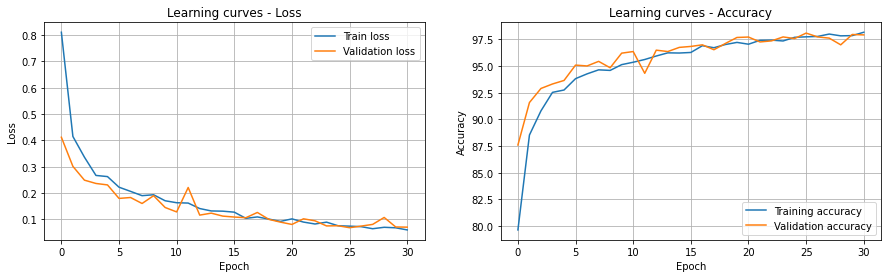

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 4, Nh = 1024, act = ELU, opt = Adam, lr = 0.001, reg = Batch norm, tbs = 100


Best val_loss: 0.07621 - train_loss: 0.08580 - val_acc: 97.60% - train_acc: 97.30% - execution_time: 302s


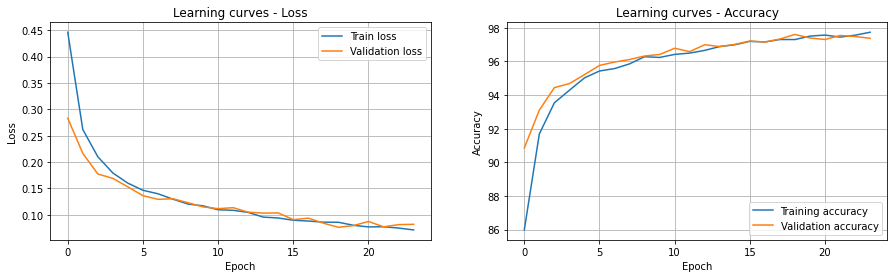

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 2, Nh = 256, act = Softplus, opt = Adam, lr = 0.03, reg = Batch norm, tbs = 100


Best val_loss: 0.06136 - train_loss: 0.06465 - val_acc: 98.25% - train_acc: 97.96% - execution_time: 445s


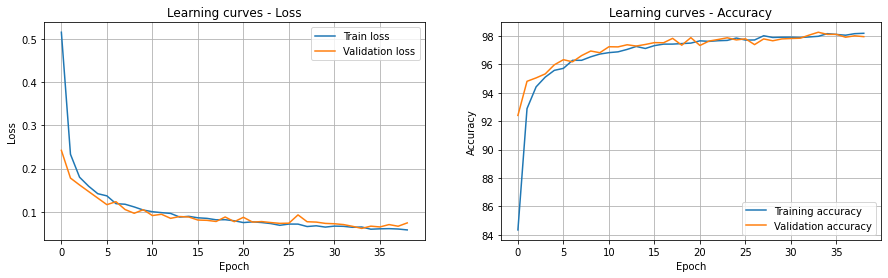

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 3, Nh = 4096, act = LeakyReLU, opt = Adam, lr = 0.003, reg = Batch norm, tbs = 100


Best val_loss: 0.05329 - train_loss: 0.04458 - val_acc: 98.26% - train_acc: 98.47% - execution_time: 633s


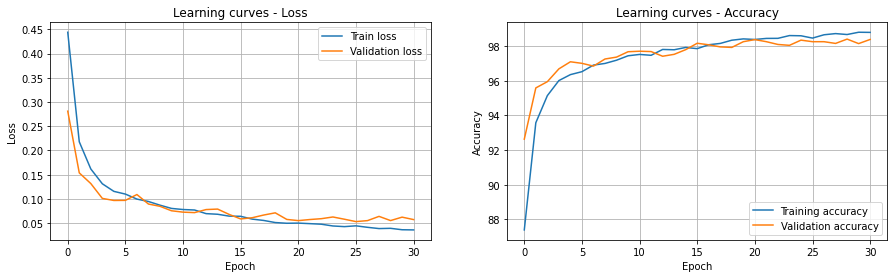

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 3, Nh = 256, act = ELU, opt = Adam, lr = 0.03, reg = Batch norm, tbs = 100


Best val_loss: 0.07777 - train_loss: 0.08455 - val_acc: 97.62% - train_acc: 97.39% - execution_time: 261s


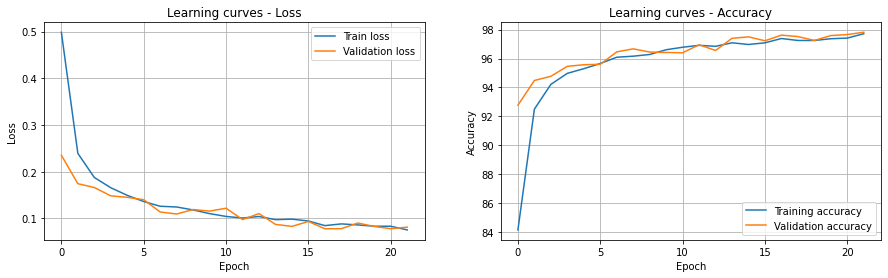

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 2, Nh = 4096, act = ELU, opt = Adam, lr = 0.003, reg = Batch norm, tbs = 100


Best val_loss: 0.06290 - train_loss: 0.05994 - val_acc: 98.16% - train_acc: 98.08% - execution_time: 523s


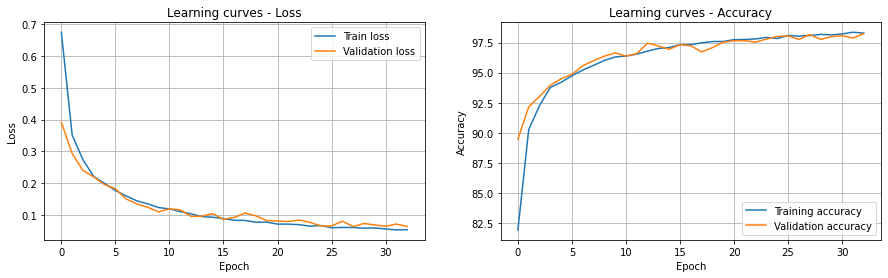

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 4, Nh = 1024, act = LeakyReLU, opt = Adam, lr = 0.001, reg = Batch norm, tbs = 100


Best val_loss: 0.05012 - train_loss: 0.03877 - val_acc: 98.42% - train_acc: 98.74% - execution_time: 430s


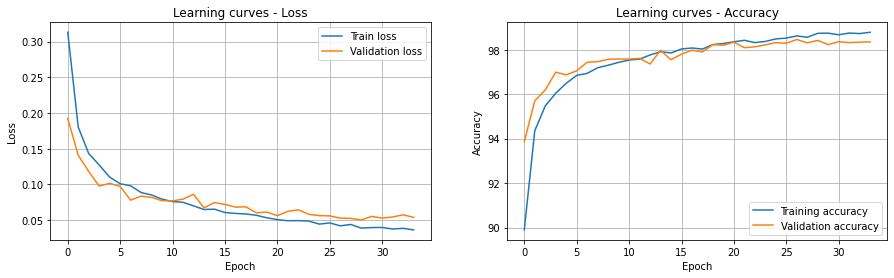

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 2, Nh = 1024, act = Softplus, opt = Adam, lr = 0.003, reg = Batch norm, tbs = 100


Best val_loss: 0.06190 - train_loss: 0.06283 - val_acc: 98.21% - train_acc: 98.02% - execution_time: 381s


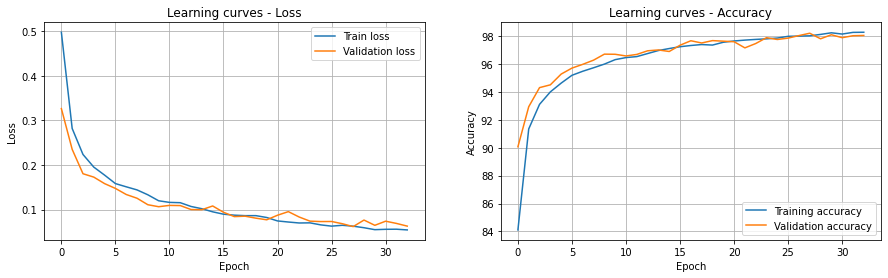

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 3, Nh = 512, act = ELU, opt = Adam, lr = 0.01, reg = Batch norm, tbs = 100


Best val_loss: 0.05531 - train_loss: 0.05232 - val_acc: 98.19% - train_acc: 98.29% - execution_time: 382s


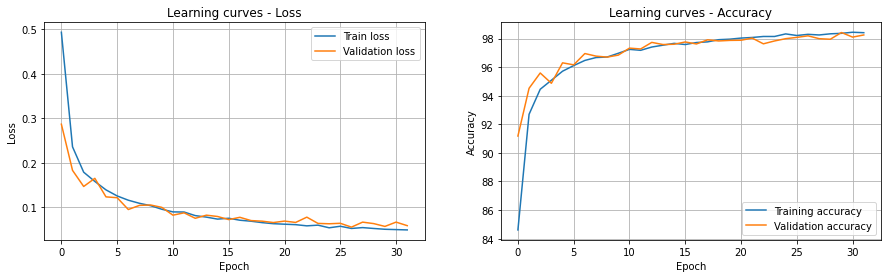

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 4, Nh = 4096, act = Softplus, opt = Adam, lr = 0.001, reg = Batch norm, tbs = 100


Best val_loss: 0.11525 - train_loss: 0.14820 - val_acc: 96.73% - train_acc: 95.65% - execution_time: 479s


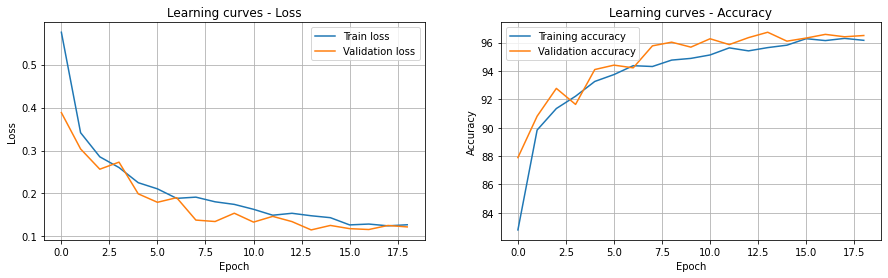

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 2, Nh = 256, act = LeakyReLU, opt = Adam, lr = 0.01, reg = Batch norm, tbs = 100


Best val_loss: 0.07518 - train_loss: 0.08791 - val_acc: 97.64% - train_acc: 97.24% - execution_time: 174s


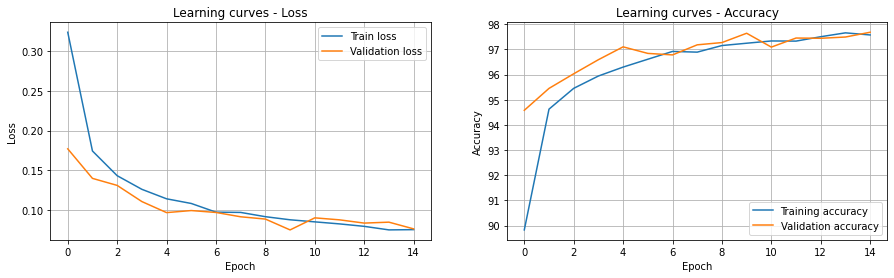

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 2, Nh = 256, act = LeakyReLU, opt = Adam, lr = 0.003, reg = Batch norm, tbs = 100


Best val_loss: 0.06121 - train_loss: 0.05642 - val_acc: 98.20% - train_acc: 98.18% - execution_time: 275s


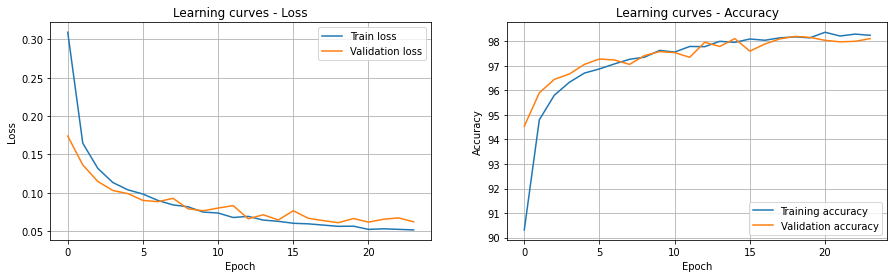

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 4, Nh = 512, act = LeakyReLU, opt = Adam, lr = 0.003, reg = Batch norm, tbs = 100


Best val_loss: 0.05380 - train_loss: 0.06051 - val_acc: 98.41% - train_acc: 98.09% - execution_time: 289s


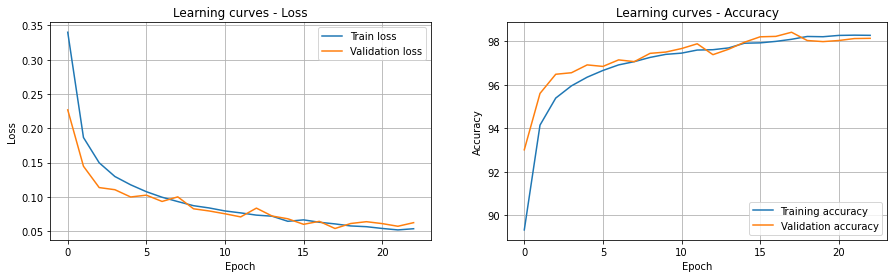

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 2, Nh = 256, act = Softplus, opt = Adam, lr = 0.003, reg = Batch norm, tbs = 100


Best val_loss: 0.06418 - train_loss: 0.06049 - val_acc: 98.06% - train_acc: 98.02% - execution_time: 419s


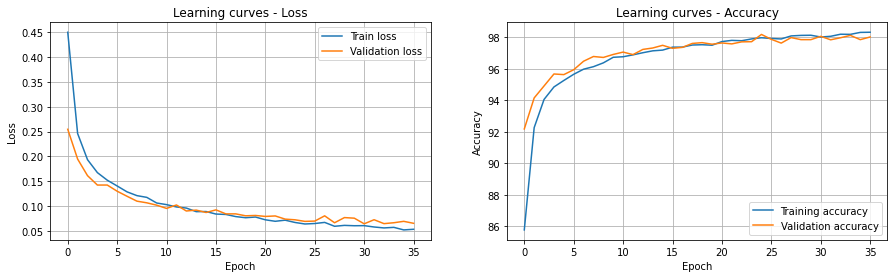

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 4, Nh = 4096, act = Softplus, opt = Adam, lr = 0.003, reg = Batch norm, tbs = 100


Best val_loss: 0.08499 - train_loss: 0.11255 - val_acc: 97.32% - train_acc: 96.70% - execution_time: 555s


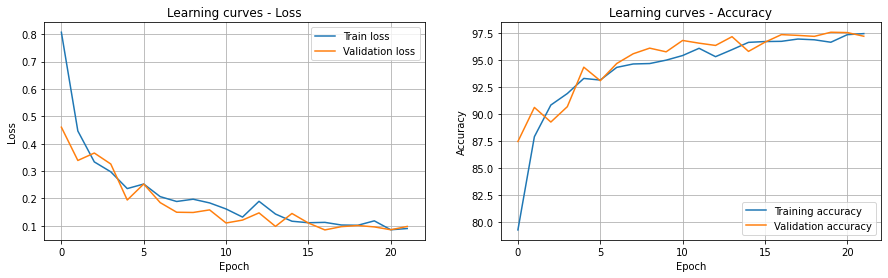

--------------------------------------------------------------------------------------------------------------------
RESULTS
Val_acc = 98.52 -> HL = 4, Nh = 2048, act = ELU      , opt = Adam   , lr =  0.003, reg = Batch norm    , tbs = 100
Val_acc = 98.52 -> HL = 2, Nh = 4096, act = LeakyReLU, opt = Adam   , lr =   0.01, reg = Batch norm    , tbs = 100
Val_acc = 98.43 -> HL = 3, Nh = 4096, act = LeakyReLU, opt = Adam   , lr =  0.001, reg = Batch norm    , tbs = 100
Val_acc = 98.42 -> HL = 4, Nh = 1024, act = LeakyReLU, opt = Adam   , lr =  0.001, reg = Batch norm    , tbs = 100
Val_acc = 98.41 -> HL = 4, Nh =  512, act = LeakyReLU, opt = Adam   , lr =  0.003, reg = Batch norm    , tbs = 100
Val_acc = 98.40 -> HL = 2, Nh = 1024, act = LeakyReLU, opt = Adam   , lr =  0.003, reg = Batch norm    , tbs = 100
Val_acc = 98.40 -> HL = 2, Nh =  256, act = LeakyReLU, opt = Adam   , lr =  0.001, reg = Batch norm    , tbs = 100
Val_acc = 98.36 -> HL = 4, Nh = 1024, act = Softplus , opt = Adam   , 

In [ ]:
# Define possible values for each hyper-parameter
HL_v = [2,3,4]
Nh_v = [256, 512, 1024, 2048, 4096]
act_v = ['Softplus', 'LeakyReLU', 'ELU']
act_dict = {'Softplus':nn.Softplus(), 'LeakyReLU':nn.LeakyReLU(), 'ELU':nn.ELU()}
opt_v = ['Adam']
lr_v = [0.03, 0.01, 0.003, 0.001]
reg_v = ['Batch norm']
tbs = 100
results = []

# RANDOM SEARCH
random.seed(1)
pbar = tq.tqdm(total = 30, desc = 'Random search progress')
random_coarse_grid = list(itertools.product(HL_v, Nh_v, act_v, opt_v, lr_v, reg_v))
for (HL, Nh, act, opt, lr, reg) in random.sample(random_coarse_grid, 30):
    # sampling combinations from itertools.product, we are sure no combination is repeated
    print(f'FCNN with HL = {HL}, Nh = {Nh}, act = {act}, opt = {opt}, lr = {lr},'
          f' reg = {reg if reg != "L2" else reg + " (wd=" + str(wd) + ")"}, tbs = {tbs}')
    
    start_time = time.time()
    # NETWORK INITIALIZATION
    torch.manual_seed(0)
    activation = act_dict[act]
    net = FCNet(784, Nh, 10, HL, activation, reg)
    net.to(device)

    # Define the loss function
    loss_function = nn.CrossEntropyLoss()

    # Define the optimizer
    if reg == 'L2':
        pass
        # opt_dict = {'Adam': optim.Adam(net.parameters(), lr =lr, weight_decay = wd),
        #             'RMSprop': optim.RMSprop(net.parameters(), lr = lr, weight_decay = wd)}
    else:
        opt_dict = {'Adam': optim.Adam(net.parameters(), lr = lr), 
                    'RMSprop': optim.RMSprop(net.parameters(), lr = lr)}
    optimizer = opt_dict[opt]

    # TRAINING LOOP
    num_epochs = 40
    patience = 5
    train_dataloader, val_dataloader = myDataLoader(train_dataset, val_dataset, 100, val_batch_size=250)
    train_loss_log, val_loss_log, best_t_loss, best_v_loss, train_accuracy_log, val_accuracy_log, best_t_acc, best_v_acc, net = training_loop(net, 
                            train_dataloader, val_dataloader, loss_function, optimizer, num_epochs, no_improve_epoch=0, patience=patience)
    
    results.append((np.round(best_v_acc, 2), f'HL = {HL}, Nh = {Nh:4}, act = {act:9}, opt = {opt:7}, lr = {lr:6},'
                                             f' reg = {reg if reg != "L2" else reg + " (wd=" + str(wd) + ")":14}, tbs = {tbs}'))
    run_time = time.time() - start_time
    print(f'Best val_loss: {best_v_loss:.5f} - train_loss: {best_t_loss:.5f} - val_acc: {best_v_acc:.2f}% - train_acc: {best_t_acc:.2f}% - execution_time: {run_time:.0f}s') 
    
    plot_losses(train_loss_log, val_loss_log, train_accuracy_log, val_accuracy_log)
    print('--------------------------------------------------------------------------------------------------------------------')
    pbar.update(1)

print('RESULTS')
for r in sorted(results, key=lambda tup: tup[0], reverse = True):
    print(f'Val_acc = {r[0]:.2f} -> {r[1]}')

Last fine search with different number of neurons in each layer

FCNN with HL = 2, Nh = 1024-4096, act = ELU, opt = Adam, lr = 0.001, reg = Batch norm, tbs = 100


Best val_loss: 0.09214 - train_loss: 0.09891 - val_acc: 97.22% - train_acc: 97.09% - execution_time: 363s


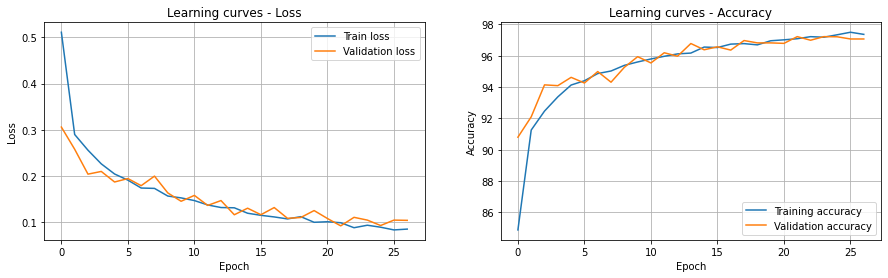

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 4, Nh = 1024-1024-256-4096, act = LeakyReLU, opt = Adam, lr = 0.003, reg = Batch norm, tbs = 100



Best val_loss: 0.04552 - train_loss: 0.03378 - val_acc: 98.56% - train_acc: 98.91% - execution_time: 537s


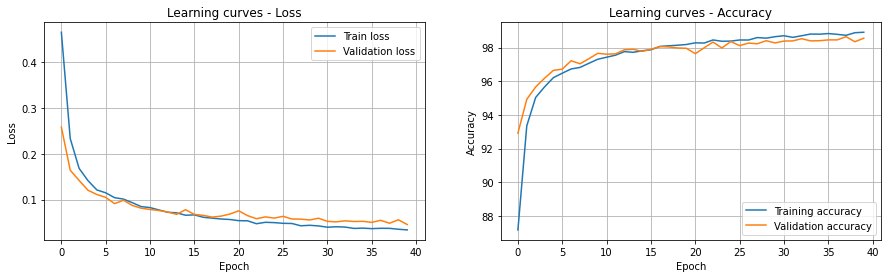

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 2, Nh = 512-512, act = LeakyReLU, opt = Adam, lr = 0.003, reg = Batch norm, tbs = 100


Best val_loss: 0.04745 - train_loss: 0.03898 - val_acc: 98.61% - train_acc: 98.72% - execution_time: 482s


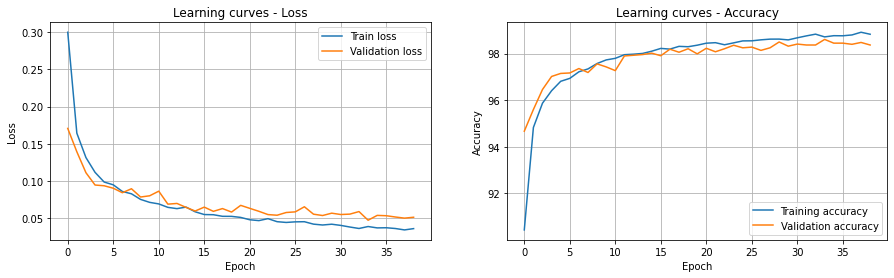

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 3, Nh = 256-1024-4096, act = ELU, opt = Adam, lr = 0.01, reg = Batch norm, tbs = 100


Best val_loss: 0.06533 - train_loss: 0.06344 - val_acc: 98.25% - train_acc: 98.07% - execution_time: 407s


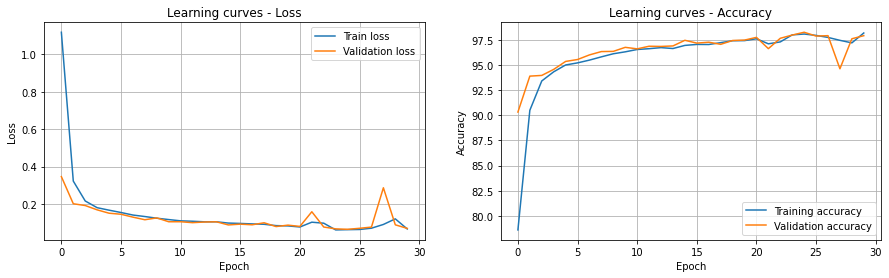

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 2, Nh = 1024-1024, act = ELU, opt = Adam, lr = 0.001, reg = Batch norm, tbs = 100


Best val_loss: 0.08583 - train_loss: 0.08803 - val_acc: 97.51% - train_acc: 97.27% - execution_time: 286s


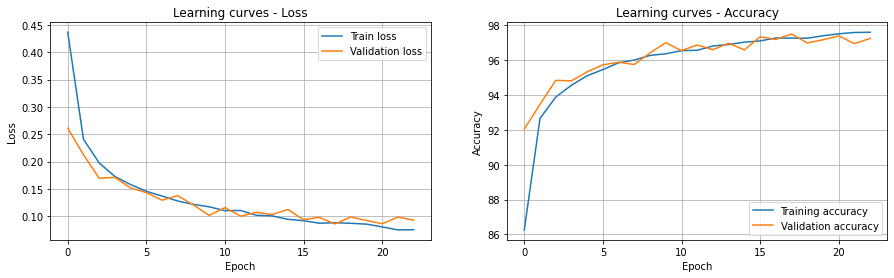

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 4, Nh = 256-4096-256-1024, act = ELU, opt = Adam, lr = 0.001, reg = Batch norm, tbs = 100


Best val_loss: 0.07924 - train_loss: 0.08837 - val_acc: 97.33% - train_acc: 97.16% - execution_time: 312s


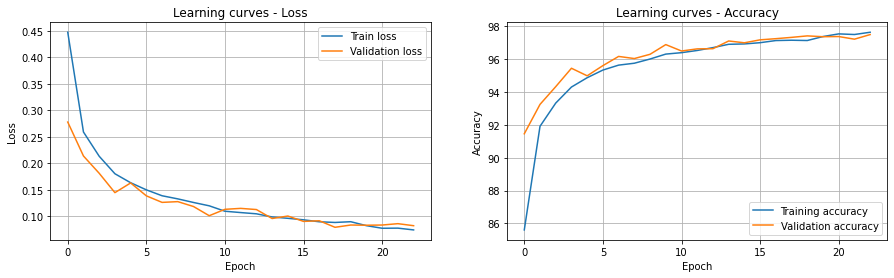

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 3, Nh = 4096-4096-256, act = LeakyReLU, opt = Adam, lr = 0.001, reg = Batch norm, tbs = 100


Best val_loss: 0.04840 - train_loss: 0.04187 - val_acc: 98.43% - train_acc: 98.64% - execution_time: 510s


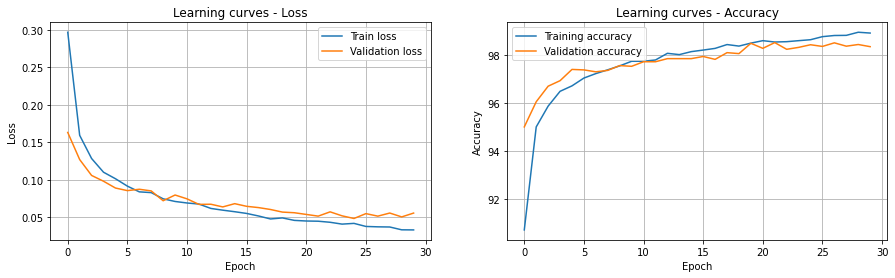

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 4, Nh = 256-512-1024-4096, act = ELU, opt = Adam, lr = 0.01, reg = Batch norm, tbs = 100


Best val_loss: 0.05680 - train_loss: 0.07030 - val_acc: 98.12% - train_acc: 97.91% - execution_time: 425s


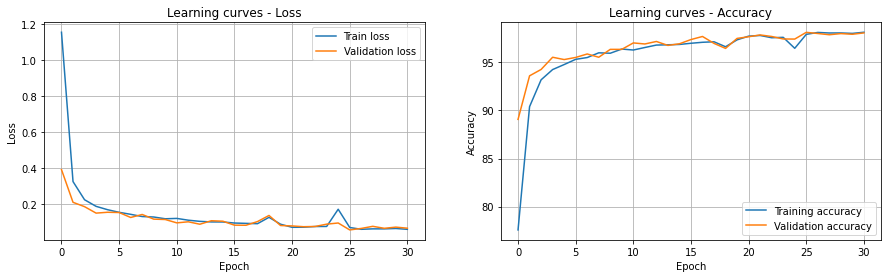

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 4, Nh = 4096-512-256-4096, act = LeakyReLU, opt = Adam, lr = 0.003, reg = Batch norm, tbs = 100


Best val_loss: 0.05633 - train_loss: 0.05173 - val_acc: 98.21% - train_acc: 98.32% - execution_time: 365s


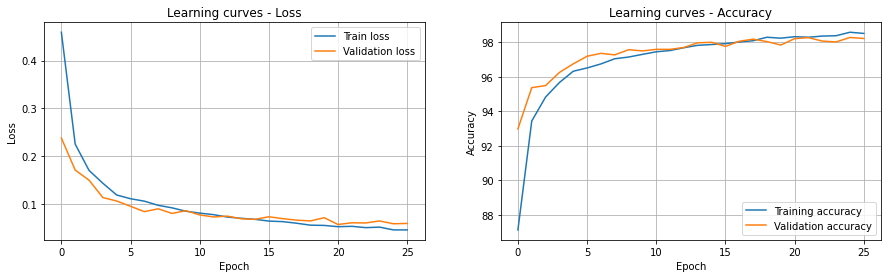

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 3, Nh = 2048-512-1024, act = ELU, opt = Adam, lr = 0.01, reg = Batch norm, tbs = 100


Best val_loss: 0.06312 - train_loss: 0.06112 - val_acc: 97.93% - train_acc: 98.10% - execution_time: 309s


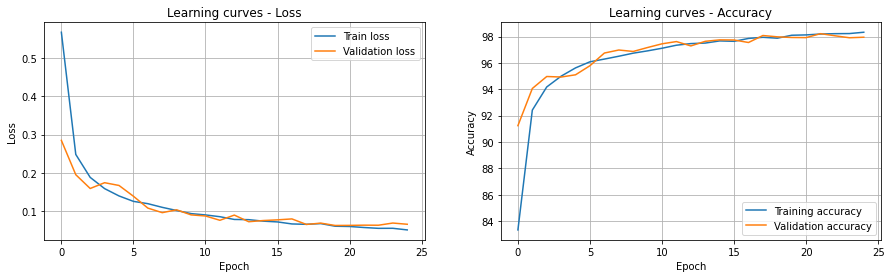

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 2, Nh = 4096-1024, act = LeakyReLU, opt = Adam, lr = 0.003, reg = Batch norm, tbs = 100



Best val_loss: 0.04806 - train_loss: 0.03325 - val_acc: 98.65% - train_acc: 98.95% - execution_time: 513s


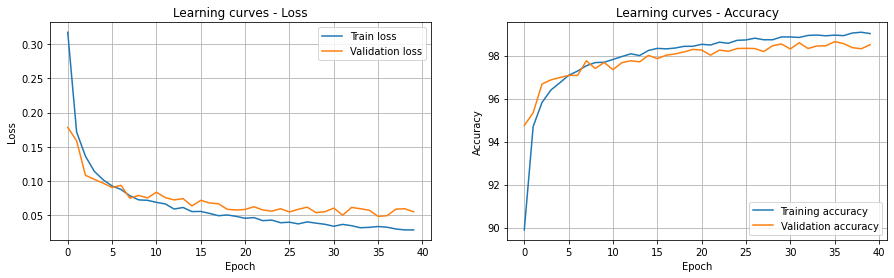

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 2, Nh = 1024-256, act = LeakyReLU, opt = Adam, lr = 0.003, reg = Batch norm, tbs = 100


Best val_loss: 0.05294 - train_loss: 0.04544 - val_acc: 98.48% - train_acc: 98.54% - execution_time: 303s


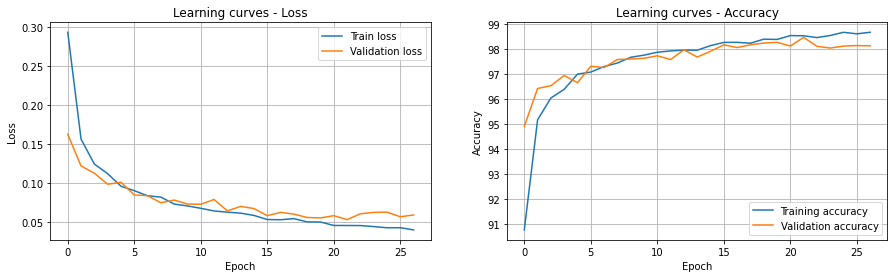

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 4, Nh = 256-2048-512-1024, act = LeakyReLU, opt = Adam, lr = 0.003, reg = Batch norm, tbs = 100


Best val_loss: 0.06590 - train_loss: 0.07276 - val_acc: 97.88% - train_acc: 97.64% - execution_time: 229s


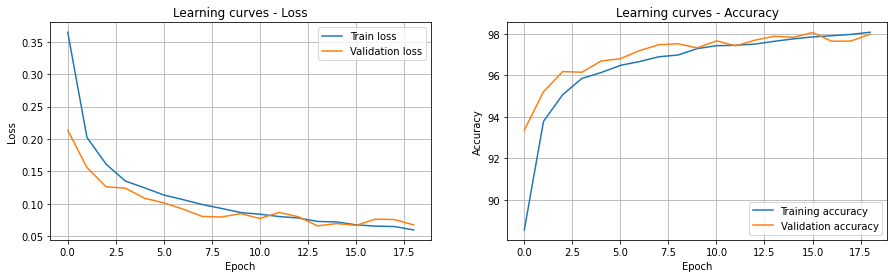

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 2, Nh = 256-2048, act = LeakyReLU, opt = Adam, lr = 0.001, reg = Batch norm, tbs = 100



Best val_loss: 0.04627 - train_loss: 0.03708 - val_acc: 98.49% - train_acc: 98.81% - execution_time: 449s


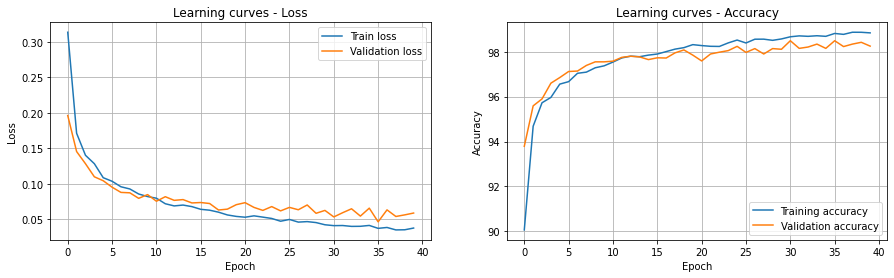

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 3, Nh = 2048-1024-1024, act = LeakyReLU, opt = Adam, lr = 0.001, reg = Batch norm, tbs = 100


Best val_loss: 0.04968 - train_loss: 0.03459 - val_acc: 98.48% - train_acc: 98.82% - execution_time: 474s


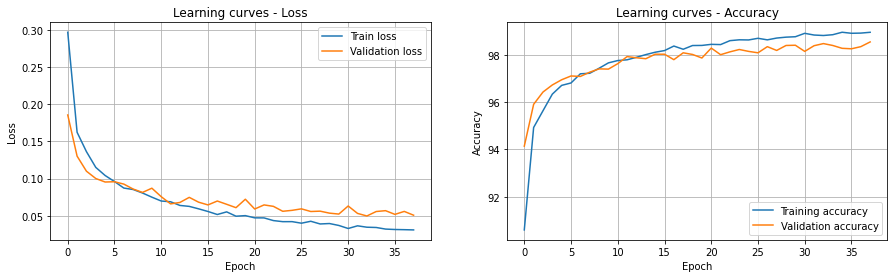

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 3, Nh = 4096-1024-512, act = ELU, opt = Adam, lr = 0.003, reg = Batch norm, tbs = 100



Best val_loss: 0.05029 - train_loss: 0.03868 - val_acc: 98.33% - train_acc: 98.76% - execution_time: 556s


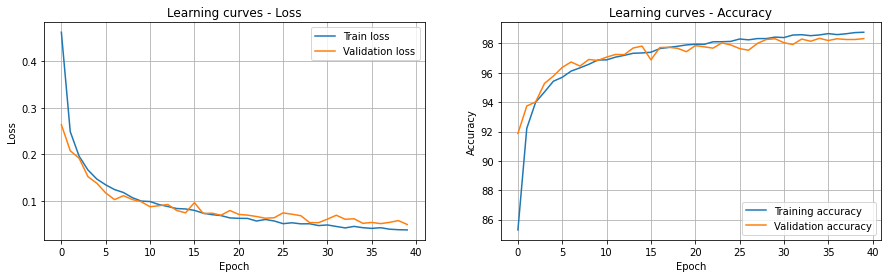

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 4, Nh = 2048-512-512-2048, act = ELU, opt = Adam, lr = 0.003, reg = Batch norm, tbs = 100


Best val_loss: 0.05531 - train_loss: 0.05158 - val_acc: 98.31% - train_acc: 98.39% - execution_time: 473s


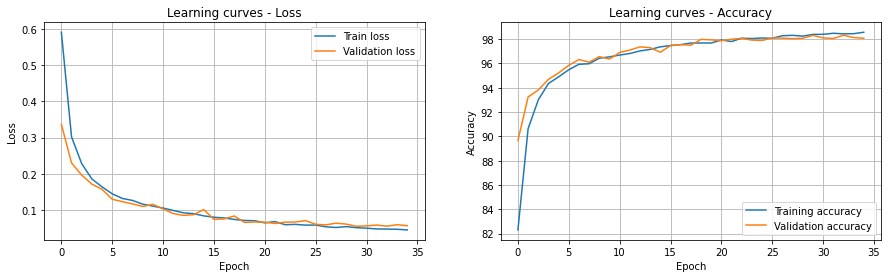

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 2, Nh = 256-256, act = ELU, opt = Adam, lr = 0.003, reg = Batch norm, tbs = 100


Best val_loss: 0.08293 - train_loss: 0.08459 - val_acc: 97.50% - train_acc: 97.28% - execution_time: 247s


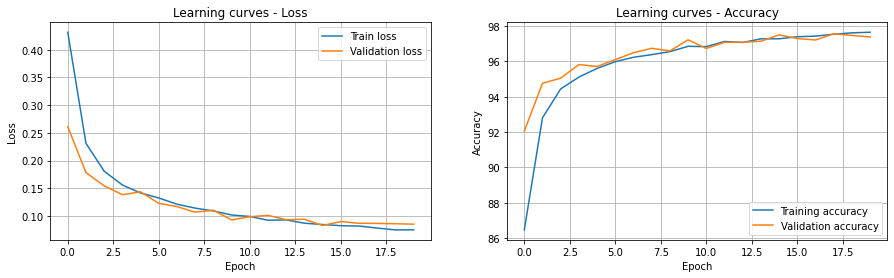

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 3, Nh = 4096-2048-2048, act = LeakyReLU, opt = Adam, lr = 0.003, reg = Batch norm, tbs = 100


Best val_loss: 0.05620 - train_loss: 0.05542 - val_acc: 98.31% - train_acc: 98.22% - execution_time: 400s


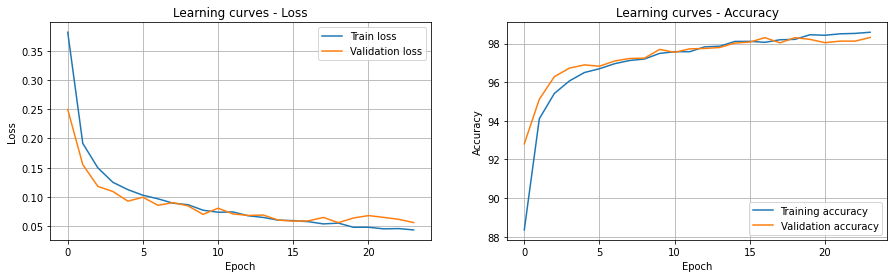

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 3, Nh = 256-4096-256, act = LeakyReLU, opt = Adam, lr = 0.003, reg = Batch norm, tbs = 100


Best val_loss: 0.05724 - train_loss: 0.05662 - val_acc: 98.21% - train_acc: 98.17% - execution_time: 294s


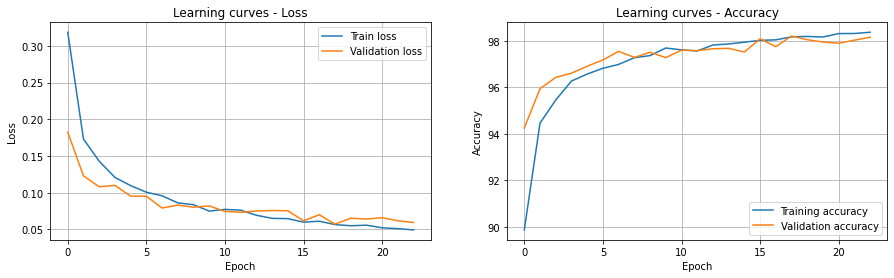

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 2, Nh = 4096-4096, act = ELU, opt = Adam, lr = 0.003, reg = Batch norm, tbs = 100


Best val_loss: 0.06290 - train_loss: 0.05994 - val_acc: 98.16% - train_acc: 98.08% - execution_time: 555s


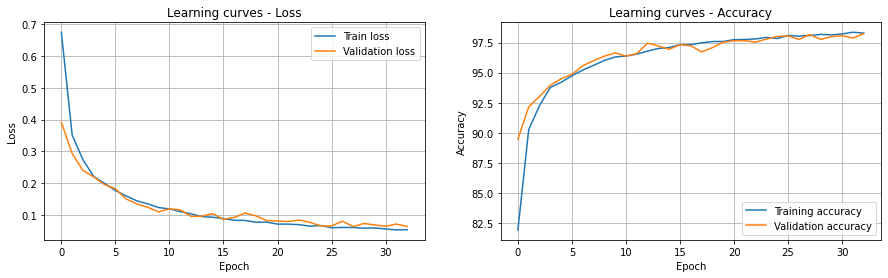

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 4, Nh = 1024-4096-1024-4096, act = LeakyReLU, opt = Adam, lr = 0.003, reg = Batch norm, tbs = 100


Best val_loss: 0.05069 - train_loss: 0.05826 - val_acc: 98.53% - train_acc: 98.17% - execution_time: 394s


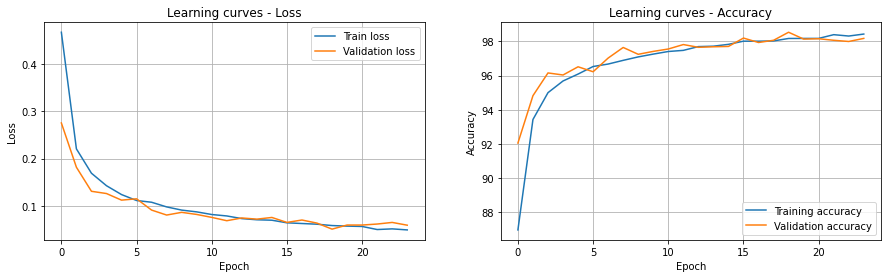

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 2, Nh = 1024-512, act = LeakyReLU, opt = Adam, lr = 0.01, reg = Batch norm, tbs = 100


Best val_loss: 0.06278 - train_loss: 0.05819 - val_acc: 98.19% - train_acc: 98.12% - execution_time: 342s


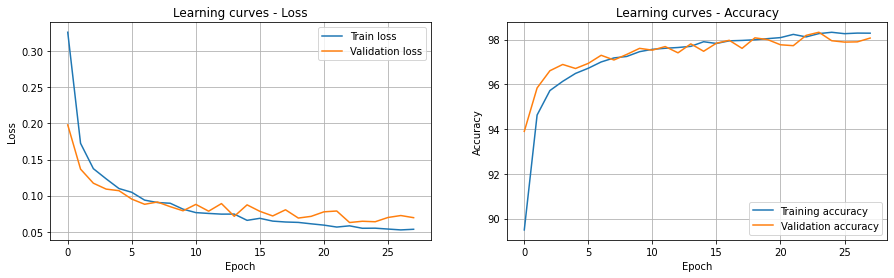

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 3, Nh = 512-4096-2048, act = ELU, opt = Adam, lr = 0.003, reg = Batch norm, tbs = 100


Best val_loss: 0.05057 - train_loss: 0.05005 - val_acc: 98.47% - train_acc: 98.36% - execution_time: 573s


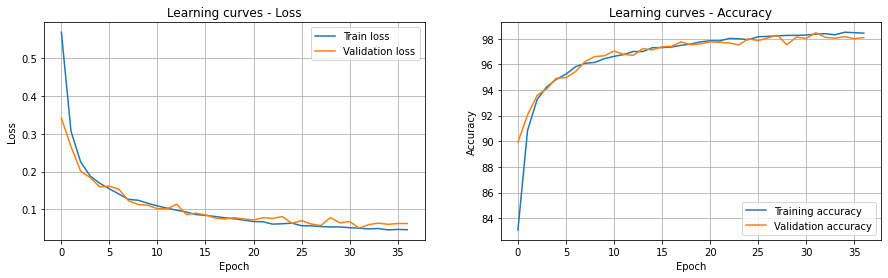

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 2, Nh = 256-2048, act = ELU, opt = Adam, lr = 0.01, reg = Batch norm, tbs = 100


Best val_loss: 0.10238 - train_loss: 0.11898 - val_acc: 96.78% - train_acc: 96.42% - execution_time: 171s


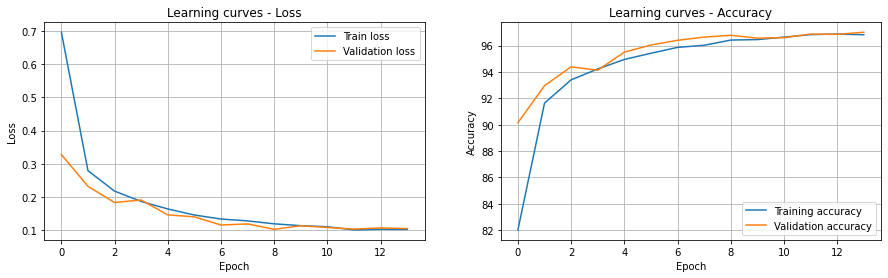

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 2, Nh = 256-1024, act = ELU, opt = Adam, lr = 0.001, reg = Batch norm, tbs = 100


Best val_loss: 0.08431 - train_loss: 0.08648 - val_acc: 97.36% - train_acc: 97.26% - execution_time: 283s


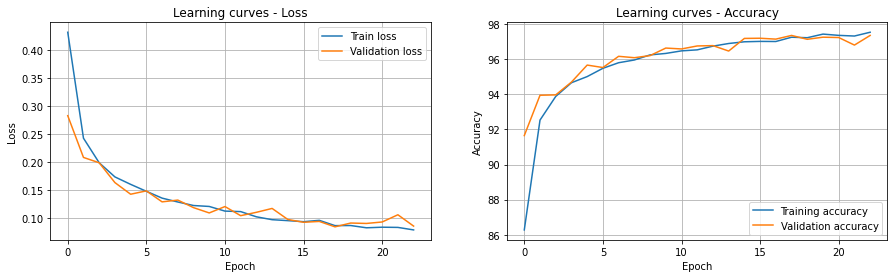

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 2, Nh = 256-1024, act = LeakyReLU, opt = Adam, lr = 0.001, reg = Batch norm, tbs = 100


Best val_loss: 0.05327 - train_loss: 0.04526 - val_acc: 98.50% - train_acc: 98.58% - execution_time: 391s


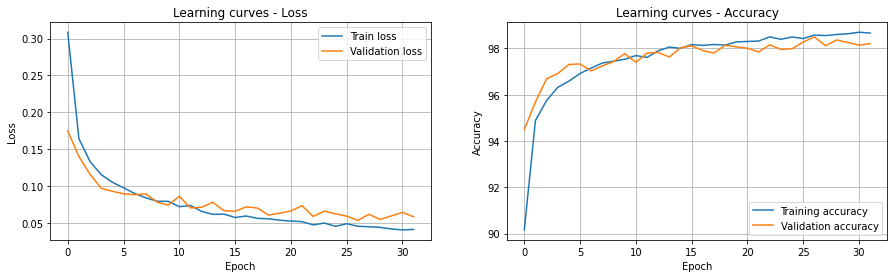

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 4, Nh = 4096-256-4096-2048, act = ELU, opt = Adam, lr = 0.003, reg = Batch norm, tbs = 100


Best val_loss: 0.06078 - train_loss: 0.06256 - val_acc: 98.06% - train_acc: 97.89% - execution_time: 480s


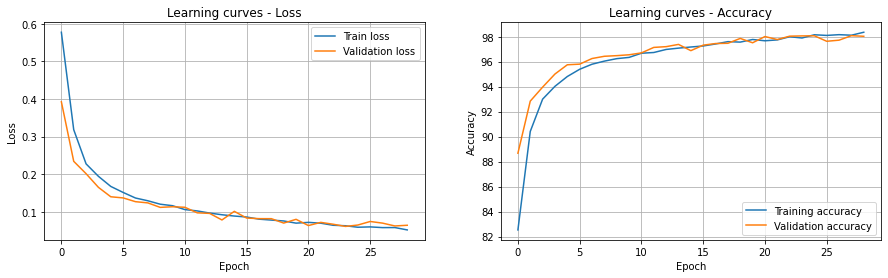

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 4, Nh = 512-4096-256-2048, act = LeakyReLU, opt = Adam, lr = 0.001, reg = Batch norm, tbs = 100


Best val_loss: 0.06054 - train_loss: 0.06098 - val_acc: 98.14% - train_acc: 97.99% - execution_time: 303s


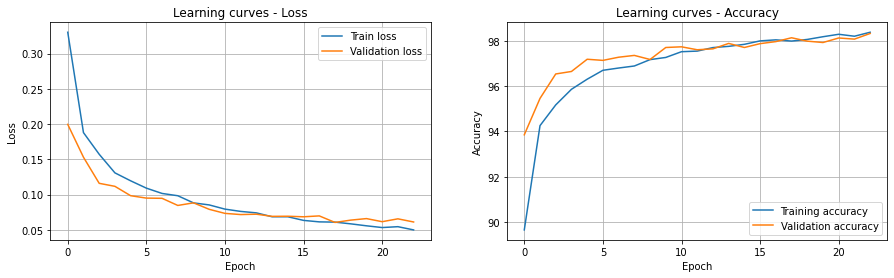

--------------------------------------------------------------------------------------------------------------------
FCNN with HL = 2, Nh = 256-512, act = LeakyReLU, opt = Adam, lr = 0.01, reg = Batch norm, tbs = 100


Best val_loss: 0.06321 - train_loss: 0.05941 - val_acc: 98.12% - train_acc: 98.09% - execution_time: 381s


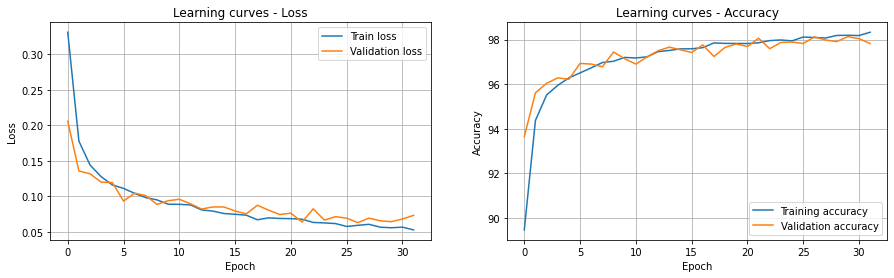

--------------------------------------------------------------------------------------------------------------------
RESULTS
Val_acc = 98.65 -> HL = 2, Nh = 4096-1024, act = LeakyReLU, opt = Adam   , lr =  0.003, reg = Batch norm    , tbs = 100
Val_acc = 98.61 -> HL = 2, Nh = 512-512, act = LeakyReLU, opt = Adam   , lr =  0.003, reg = Batch norm    , tbs = 100
Val_acc = 98.56 -> HL = 4, Nh = 1024-1024-256-4096, act = LeakyReLU, opt = Adam   , lr =  0.003, reg = Batch norm    , tbs = 100
Val_acc = 98.53 -> HL = 4, Nh = 1024-4096-1024-4096, act = LeakyReLU, opt = Adam   , lr =  0.003, reg = Batch norm    , tbs = 100
Val_acc = 98.50 -> HL = 2, Nh = 256-1024, act = LeakyReLU, opt = Adam   , lr =  0.001, reg = Batch norm    , tbs = 100
Val_acc = 98.49 -> HL = 2, Nh = 256-2048, act = LeakyReLU, opt = Adam   , lr =  0.001, reg = Batch norm    , tbs = 100
Val_acc = 98.48 -> HL = 2, Nh = 1024-256, act = LeakyReLU, opt = Adam   , lr =  0.003, reg = Batch norm    , tbs = 100
Val_acc = 98.48 -> HL

In [ ]:
# Define possible values for each hyper-parameter
HL_v = [2,3,4]
Nh_v = [256, 512, 1024, 2048, 4096]
act_v = ['LeakyReLU', 'ELU']
act_dict = {'Softplus':nn.Softplus(), 'LeakyReLU':nn.LeakyReLU(), 'ELU':nn.ELU()}
opt_v = ['Adam']
lr_v = [0.01, 0.003, 0.001]
reg_v = ['Batch norm']
tbs = 100
results = []

# RANDOM SEARCH
random.seed(1)
pbar = tq.tqdm(total = 30, desc = 'Random search progress')
random_coarse_grid = list(itertools.product(HL_v, Nh_v, Nh_v, Nh_v, Nh_v, act_v, opt_v, lr_v, reg_v))
for (HL, Nh1, Nh2, Nh3, Nh4, act, opt, lr, reg) in random.sample(random_coarse_grid, 30):
    # sampling combinations from itertools.product, we are sure no combination is repeated
    print(f'FCNN with HL = {HL}, Nh = {Nh1}{-Nh2 if HL >= 2 else ""}{-Nh3 if HL >= 3 else ""}{-Nh4 if HL >= 4 else ""}, act = {act},' 
          f' opt = {opt}, lr = {lr}, reg = {reg if reg != "L2" else reg + " (wd=" + str(wd) + ")"}, tbs = {tbs}')
    
    start_time = time.time()
    # NETWORK INITIALIZATION
    torch.manual_seed(0)
    activation = act_dict[act]
    net = FCNetmod(784, Nh1, Nh2, Nh3, Nh4, 10, HL, activation, reg)
    net.to(device)

    # Define the loss function
    loss_function = nn.CrossEntropyLoss()

    # Define the optimizer
    optimizer = optim.Adam(net.parameters(), lr = lr)

    # TRAINING LOOP
    num_epochs = 40
    patience = 5
    train_dataloader, val_dataloader = myDataLoader(train_dataset, val_dataset, 100, val_batch_size=250)
    train_loss_log, val_loss_log, best_t_loss, best_v_loss, train_accuracy_log, val_accuracy_log, best_t_acc, best_v_acc, net = training_loop(net, 
                            train_dataloader, val_dataloader, loss_function, optimizer, num_epochs, no_improve_epoch=0, patience=patience)
    
    results.append((np.round(best_v_acc, 2), f'HL = {HL}, Nh = {Nh1}{-Nh2 if HL >= 2 else ""}{-Nh3 if HL >= 3 else ""}{-Nh4 if HL >= 4 else ""},'
                                             f' act = {act:9}, opt = {opt:7}, lr = {lr:6},'
                                             f' reg = {reg if reg != "L2" else reg + " (wd=" + str(wd) + ")":14}, tbs = {tbs}'))
    run_time = time.time() - start_time
    print(f'Best val_loss: {best_v_loss:.5f} - train_loss: {best_t_loss:.5f} - val_acc: {best_v_acc:.2f}% - train_acc: {best_t_acc:.2f}% - execution_time: {run_time:.0f}s') 
    
    plot_losses(train_loss_log, val_loss_log, train_accuracy_log, val_accuracy_log)
    print('--------------------------------------------------------------------------------------------------------------------')
    pbar.update(1)

print('RESULTS')
for r in sorted(results, key=lambda tup: tup[0], reverse = True):
    print(f'Val_acc = {r[0]:.2f} -> {r[1]}')

### CNN

First search

CNN 2 conv: 32(9x9)-16(3x3), stride1 = 2, stride2 = 1, 3 fc: 256-64-10, act = LeakyReLU, opt = RMSprop, lr = 0.01, reg = Dropout


Best val_loss: 0.32572 - train_loss: 0.58749 - val_acc: 90.66% - train_acc: 82.84% - execution_time: 174s


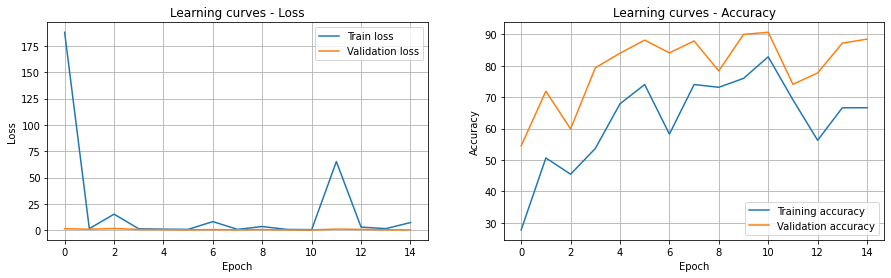

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(5x5)-64(3x3), stride1 = 2, stride2 = 2, 2 fc: 256-10, act = LeakyReLU, opt = RMSprop, lr = 0.0001, reg = False



Best val_loss: 0.09269 - train_loss: 0.08799 - val_acc: 97.32% - train_acc: 97.24% - execution_time: 324s


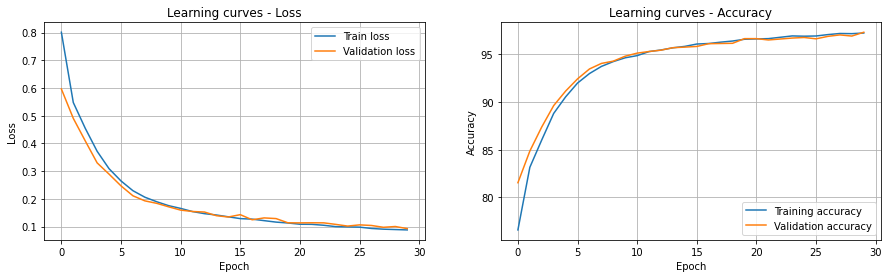

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 64(7x7)-16(5x5)-16, stride1 = 2, stride2 = 1, 2 fc: 512-10, act = LeakyReLU, opt = RMSprop, lr = 0.1, reg = False


Best val_loss: 715660.25000 - train_loss: 1041940.25000 - val_acc: 63.18% - train_acc: 59.37% - execution_time: 69s


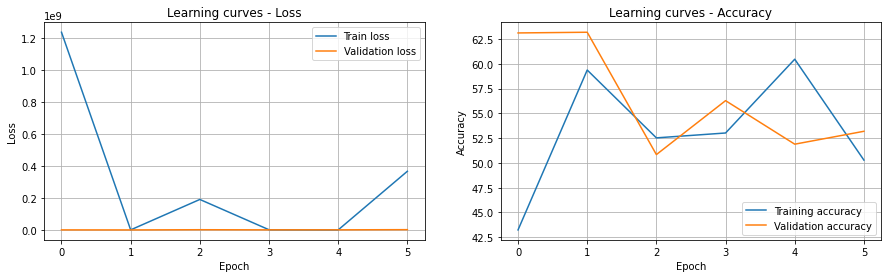

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(5x5)-128(5x5), stride1 = 2, stride2 = 2, 3 fc: 128-128-10, act = LeakyReLU, opt = RMSprop, lr = 0.01, reg = Batch norm


Best val_loss: 0.06786 - train_loss: 0.06068 - val_acc: 97.85% - train_acc: 98.07% - execution_time: 335s


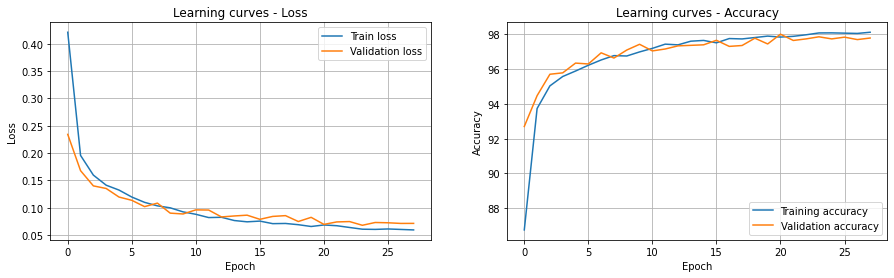

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 128(7x7)-128(7x7)-128-32, stride1 = 2, stride2 = 1, 3 fc: 256-256-10, act = Tanh, opt = Adagrad, lr = 0.1, reg = Dropout


Best val_loss: 2.30092 - train_loss: 2.52308 - val_acc: 18.45% - train_acc: 12.14% - execution_time: 103s


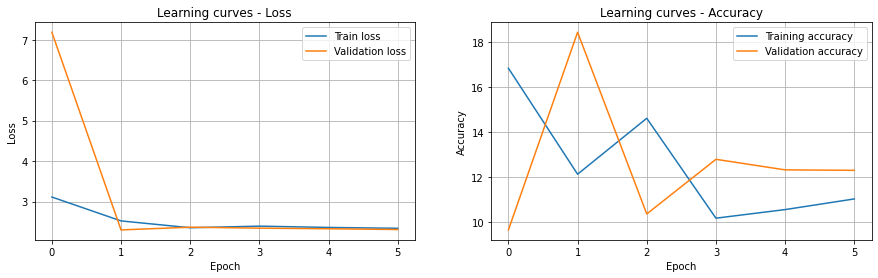

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 128(3x3)-64(7x7)-32-64, stride1 = 1, stride2 = 1, 3 fc: 64-128-10, act = ELU, opt = RMSprop, lr = 0.0001, reg = Dropout



Best val_loss: 0.05452 - train_loss: 0.07365 - val_acc: 98.26% - train_acc: 97.80% - execution_time: 505s


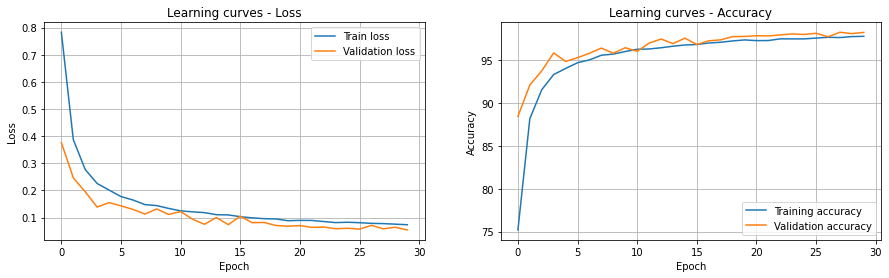

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 128(9x9)-128(3x3)-16-32, stride1 = 2, stride2 = 1, 3 fc: 128-128-10, act = ELU, opt = Adadelta, lr = 0.001, reg = False



Best val_loss: 2.13258 - train_loss: 2.15191 - val_acc: 54.88% - train_acc: 53.68% - execution_time: 389s


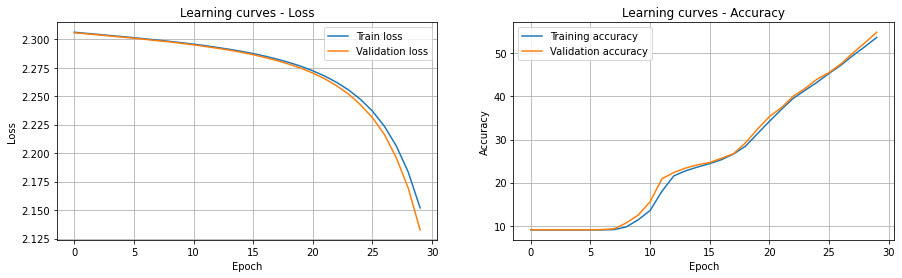

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 128(5x5)-16(5x5)-16-64, stride1 = 2, stride2 = 2, 2 fc: 128-10, act = Tanh, opt = RMSprop, lr = 0.1, reg = Dropout


Best val_loss: 8.79080 - train_loss: 8.45642 - val_acc: 12.91% - train_acc: 15.73% - execution_time: 161s


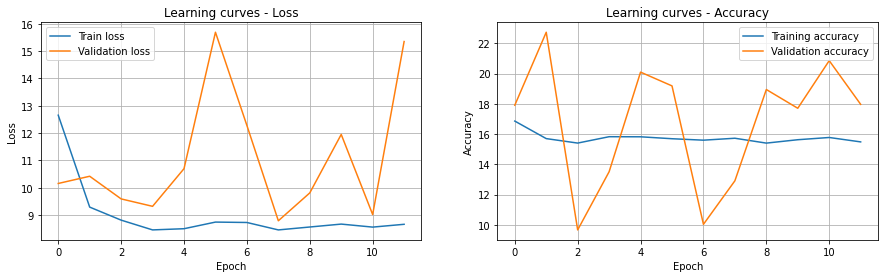

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 32(5x5)-64(9x9)-64, stride1 = 2, stride2 = 2, 2 fc: 128-10, act = Tanh, opt = Adagrad, lr = 0.001, reg = False



Best val_loss: 0.30445 - train_loss: 0.30756 - val_acc: 91.36% - train_acc: 91.58% - execution_time: 386s


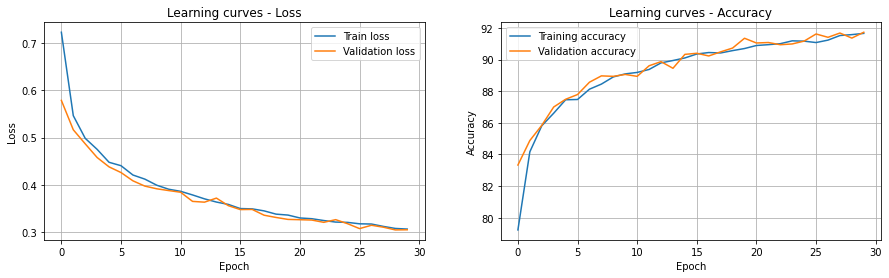

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(3x3)-128(3x3), stride1 = 2, stride2 = 2, 3 fc: 64-128-10, act = Tanh, opt = RMSprop, lr = 1, reg = False


Best val_loss: 73.38806 - train_loss: 119.98034 - val_acc: 24.70% - train_acc: 19.93% - execution_time: 121s


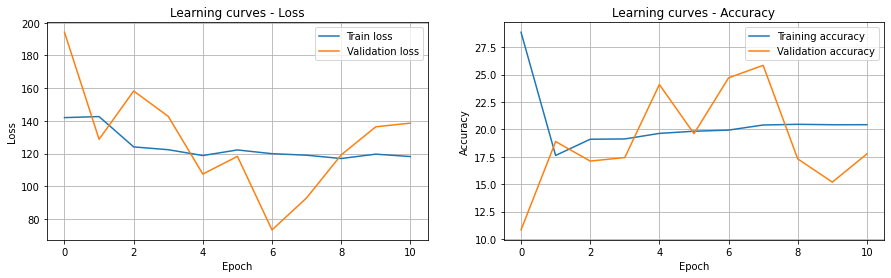

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 128(9x9)-128(3x3)-64-32, stride1 = 2, stride2 = 1, 3 fc: 256-64-10, act = ELU, opt = RMSprop, lr = 0.001, reg = Batch norm


Best val_loss: 0.07040 - train_loss: 0.05771 - val_acc: 97.87% - train_acc: 98.23% - execution_time: 161s


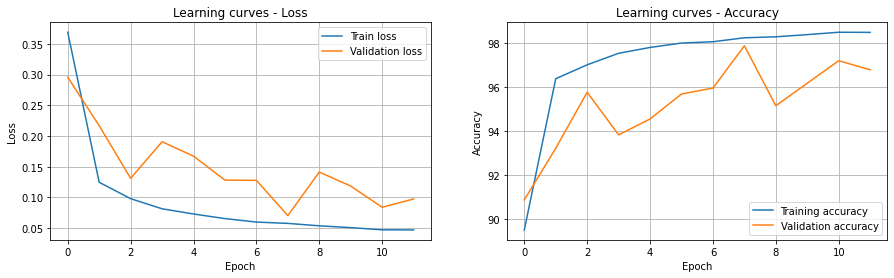

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(7x7)-16(3x3), stride1 = 1, stride2 = 1, 2 fc: 128-10, act = Tanh, opt = RMSprop, lr = 0.0001, reg = Dropout



Best val_loss: 0.10447 - train_loss: 0.11731 - val_acc: 96.71% - train_acc: 96.45% - execution_time: 334s


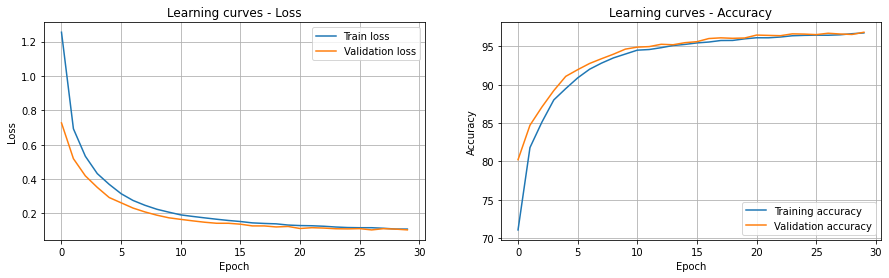

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 128(7x7)-16(5x5)-32-128, stride1 = 1, stride2 = 2, 2 fc: 128-10, act = ELU, opt = Adadelta, lr = 0.01, reg = Batch norm


Best val_loss: 0.11999 - train_loss: 0.12130 - val_acc: 96.75% - train_acc: 96.73% - execution_time: 328s


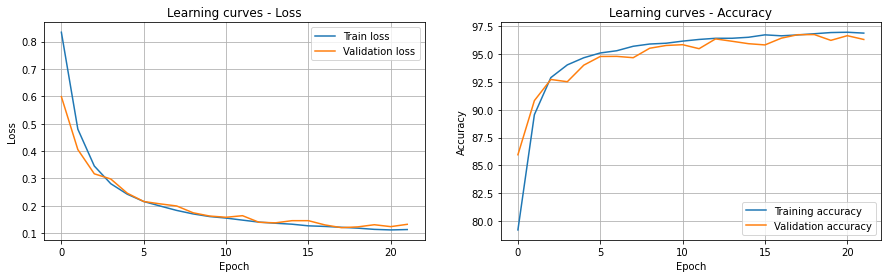

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 128(7x7)-32(5x5)-128-32, stride1 = 1, stride2 = 1, 2 fc: 512-10, act = ELU, opt = RMSprop, lr = 0.1, reg = Batch norm


Best val_loss: 0.31138 - train_loss: 0.46508 - val_acc: 93.95% - train_acc: 93.99% - execution_time: 132s


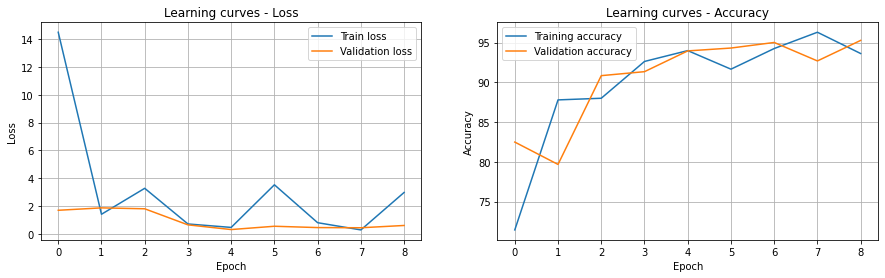

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(3x3)-16(5x5), stride1 = 1, stride2 = 2, 2 fc: 64-10, act = LeakyReLU, opt = Adam, lr = 0.001, reg = False



Best val_loss: 0.06086 - train_loss: 0.05550 - val_acc: 98.06% - train_acc: 98.28% - execution_time: 332s


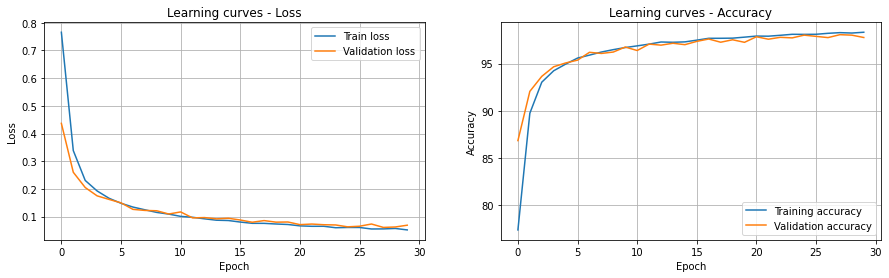

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 128(3x3)-64(3x3)-32-16, stride1 = 2, stride2 = 1, 3 fc: 64-128-10, act = Tanh, opt = Adam, lr = 0.0001, reg = Batch norm


Best val_loss: 0.06195 - train_loss: 0.06374 - val_acc: 98.25% - train_acc: 98.08% - execution_time: 312s


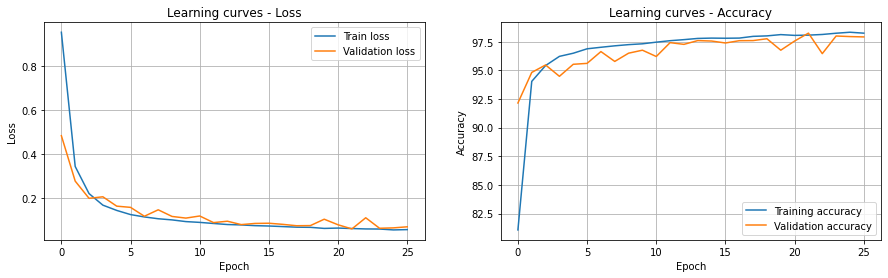

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 64(5x5)-16(5x5)-64, stride1 = 2, stride2 = 2, 3 fc: 64-64-10, act = LeakyReLU, opt = RMSprop, lr = 0.0001, reg = False



Best val_loss: 0.14721 - train_loss: 0.14323 - val_acc: 95.51% - train_acc: 95.49% - execution_time: 349s


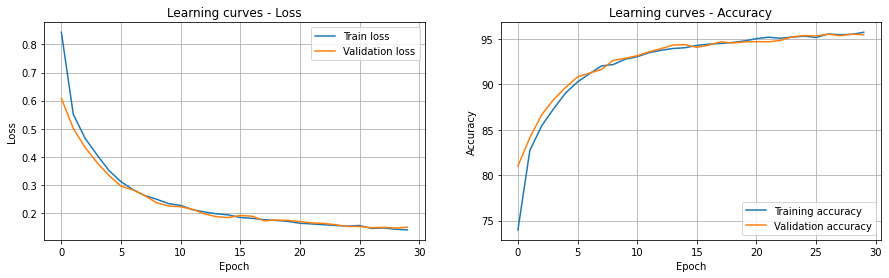

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 32(3x3)-128(7x7)-32, stride1 = 1, stride2 = 1, 2 fc: 256-10, act = LeakyReLU, opt = Adadelta, lr = 0.001, reg = Batch norm



Best val_loss: 0.27511 - train_loss: 0.27861 - val_acc: 94.48% - train_acc: 94.39% - execution_time: 448s


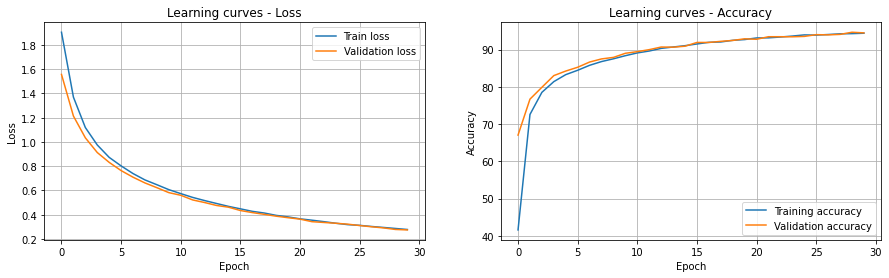

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(5x5)-128(5x5), stride1 = 1, stride2 = 2, 3 fc: 64-256-10, act = LeakyReLU, opt = Adadelta, lr = 0.1, reg = Dropout



Best val_loss: 0.07681 - train_loss: 0.12286 - val_acc: 97.48% - train_acc: 96.21% - execution_time: 360s


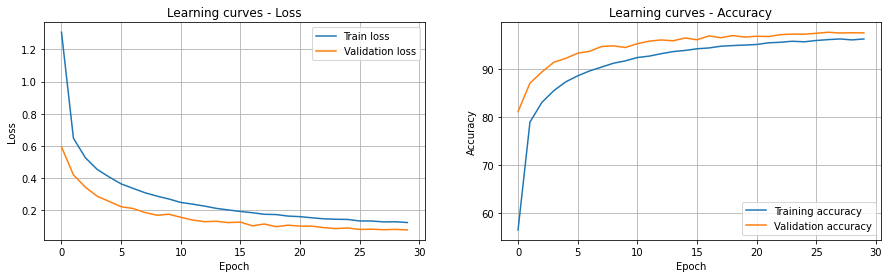

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 64(7x7)-64(3x3)-16, stride1 = 1, stride2 = 2, 3 fc: 256-128-10, act = ELU, opt = RMSprop, lr = 0.01, reg = False


Best val_loss: 2.30134 - train_loss: 2.31653 - val_acc: 11.52% - train_acc: 10.47% - execution_time: 84s


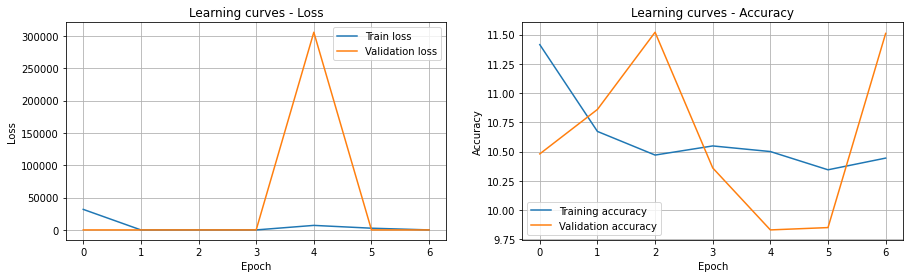

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(7x7)-16(7x7), stride1 = 2, stride2 = 1, 2 fc: 128-10, act = LeakyReLU, opt = Adagrad, lr = 0.0001, reg = False



Best val_loss: 0.87207 - train_loss: 0.87996 - val_acc: 77.10% - train_acc: 76.77% - execution_time: 343s


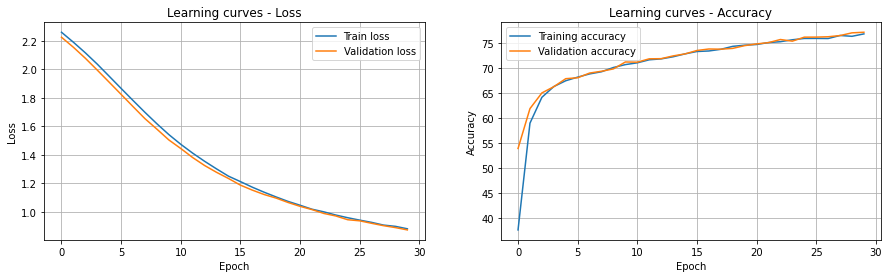

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(5x5)-16(7x7), stride1 = 2, stride2 = 2, 2 fc: 128-10, act = Tanh, opt = Adam, lr = 0.001, reg = Batch norm



Best val_loss: 0.10175 - train_loss: 0.10159 - val_acc: 96.92% - train_acc: 96.86% - execution_time: 331s


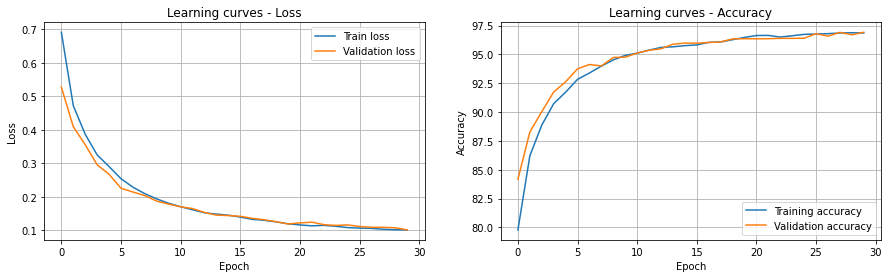

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(3x3)-16(3x3), stride1 = 1, stride2 = 2, 2 fc: 128-10, act = LeakyReLU, opt = Adadelta, lr = 0.01, reg = Batch norm



Best val_loss: 0.16299 - train_loss: 0.17436 - val_acc: 95.62% - train_acc: 95.46% - execution_time: 334s


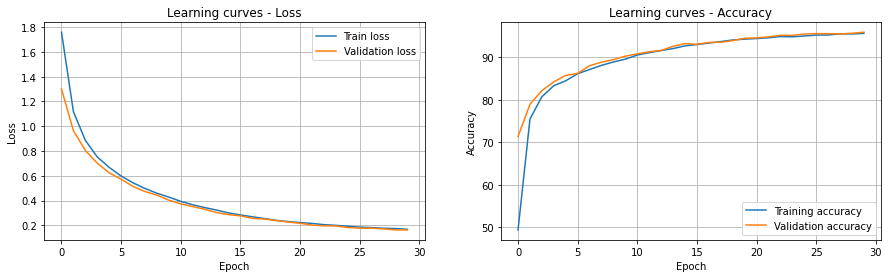

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(7x7)-16(9x9), stride1 = 1, stride2 = 2, 2 fc: 64-10, act = ELU, opt = Adam, lr = 1, reg = Dropout


Best val_loss: 90.41591 - train_loss: 24.23556 - val_acc: 10.37% - train_acc: 9.86% - execution_time: 116s


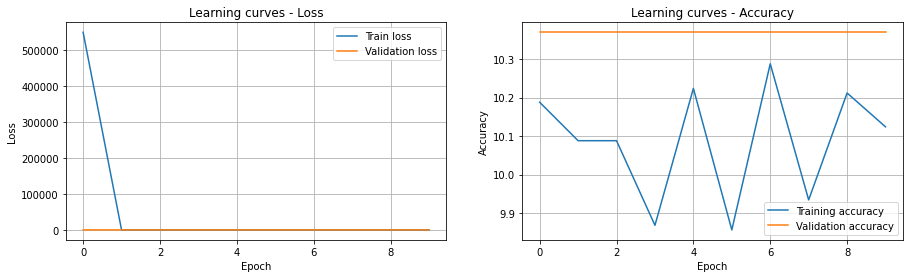

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 128(3x3)-16(7x7)-16-128, stride1 = 2, stride2 = 2, 2 fc: 128-10, act = LeakyReLU, opt = Adam, lr = 0.001, reg = Batch norm


Best val_loss: 0.12081 - train_loss: 0.12263 - val_acc: 96.56% - train_acc: 96.39% - execution_time: 243s


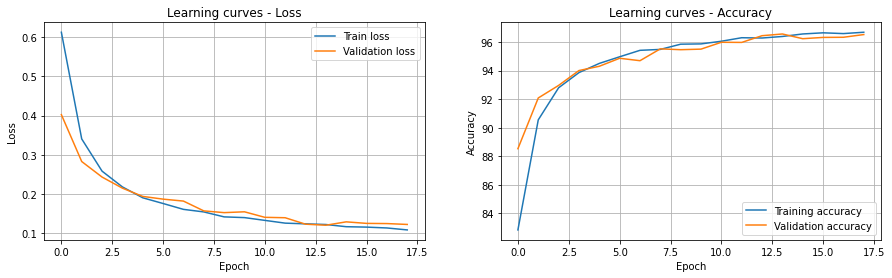

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 32(9x9)-64(7x7)-128, stride1 = 1, stride2 = 2, 2 fc: 128-10, act = LeakyReLU, opt = RMSprop, lr = 1, reg = Batch norm


Best val_loss: 1.00700 - train_loss: 5.54902 - val_acc: 92.79% - train_acc: 88.70% - execution_time: 227s


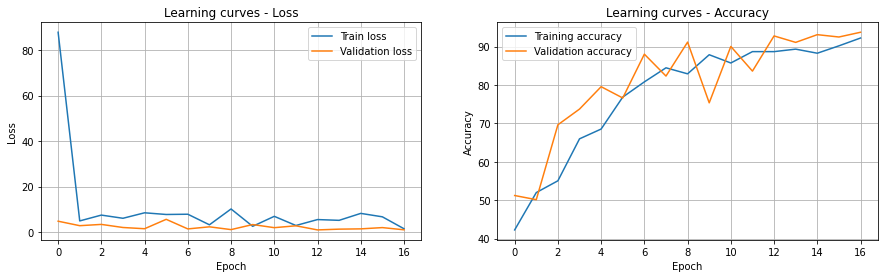

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 128(3x3)-32(5x5)-64-16, stride1 = 2, stride2 = 2, 2 fc: 512-10, act = ELU, opt = Adagrad, lr = 1, reg = Dropout


Best val_loss: 10373.17871 - train_loss: 54977.64062 - val_acc: 10.54% - train_acc: 10.52% - execution_time: 240s


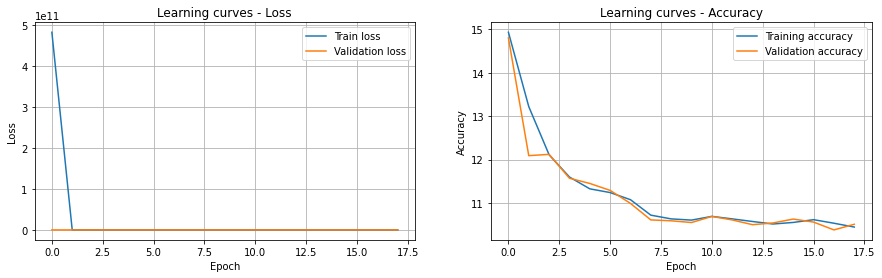

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(9x9)-16(5x5), stride1 = 2, stride2 = 2, 2 fc: 128-10, act = Tanh, opt = Adadelta, lr = 0.01, reg = False



Best val_loss: 0.38410 - train_loss: 0.39373 - val_acc: 88.68% - train_acc: 88.62% - execution_time: 326s


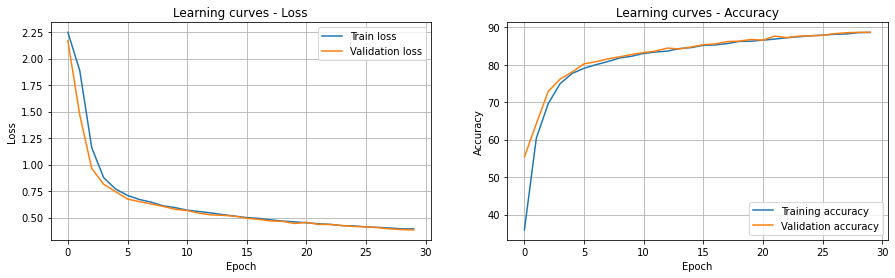

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 32(7x7)-128(3x3)-16, stride1 = 1, stride2 = 1, 2 fc: 256-10, act = LeakyReLU, opt = Adam, lr = 0.1, reg = Dropout


Best val_loss: 2.47527 - train_loss: 7.24908 - val_acc: 90.63% - train_acc: 81.71% - execution_time: 202s


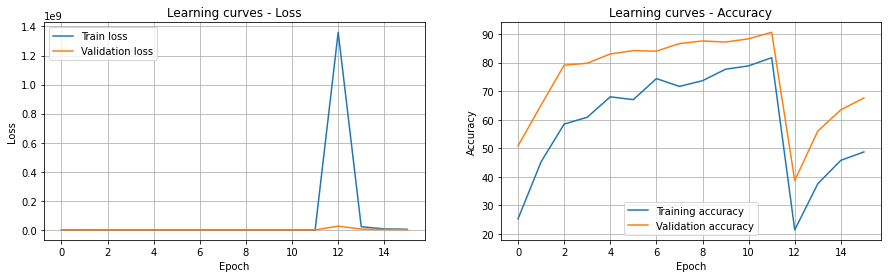

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 128(3x3)-64(9x9)-16-16, stride1 = 1, stride2 = 1, 2 fc: 512-10, act = ELU, opt = Adam, lr = 0.01, reg = Batch norm


Best val_loss: 0.05849 - train_loss: 0.04294 - val_acc: 98.23% - train_acc: 98.71% - execution_time: 445s


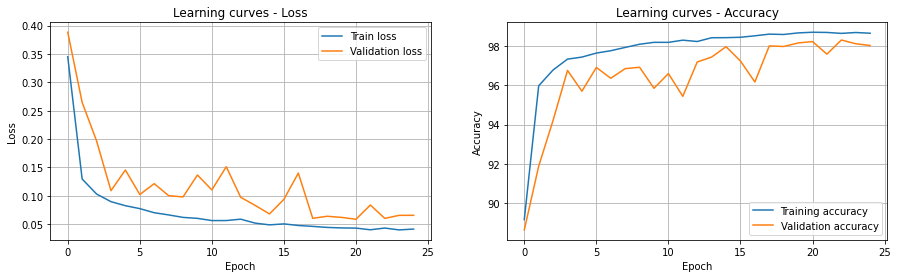

--------------------------------------------------------------------------------------------------------------------
RESULTS
Val_acc = 98.26 -> 4 conv: 128(3x3)-64(7x7)-32-64, stride1 = 1, stride2 = 1, 3 fc: 64-128-10, act = ELU, opt = RMSprop, lr = 0.0001, reg = Dropout
Val_acc = 98.25 -> 4 conv: 128(3x3)-64(3x3)-32-16, stride1 = 2, stride2 = 1, 3 fc: 64-128-10, act = Tanh, opt = Adam, lr = 0.0001, reg = Batch norm
Val_acc = 98.23 -> 4 conv: 128(3x3)-64(9x9)-16-16, stride1 = 1, stride2 = 1, 2 fc: 512-10, act = ELU, opt = Adam, lr = 0.01, reg = Batch norm
Val_acc = 98.06 -> 2 conv: 16(3x3)-16(5x5), stride1 = 1, stride2 = 2, 2 fc: 64-10, act = LeakyReLU, opt = Adam, lr = 0.001, reg = False
Val_acc = 97.87 -> 4 conv: 128(9x9)-128(3x3)-64-32, stride1 = 2, stride2 = 1, 3 fc: 256-64-10, act = ELU, opt = RMSprop, lr = 0.001, reg = Batch norm
Val_acc = 97.85 -> 2 conv: 16(5x5)-128(5x5), stride1 = 2, stride2 = 2, 3 fc: 128-128-10, act = LeakyReLU, opt = RMSprop, lr = 0.01, reg = Batch norm
Val

In [ ]:
# Define possible values for each hyper-parameter
conv_layers_v = [2, 3, 4, 5, 6]
fc_layers_v = [2, 3]
Nconv_v = [16, 32, 64, 128]
kernel_v = [3, 5, 7, 9]
stride_v = [1, 2]
Nh_v = [64, 128, 256, 512]
act_v = ['Tanh', 'LeakyReLU', 'ELU']
act_dict = {'Tanh':nn.Tanh(), 'LeakyReLU':nn.LeakyReLU(), 'ELU':nn.ELU()}
opt_v = ['Adam', 'RMSprop', 'Adagrad', 'Adadelta']
lr_v = [1, 0.1, 0.01, 0.001, 0.0001]
reg_v = ['False', 'Dropout', 'Batch norm']
results = []

# RANDOM SEARCH
random.seed(1)
torch.manual_seed(0)
pbar = tq.tqdm(total = 30, desc = 'Random search progress')
random_coarse_grid_conv = list(itertools.product(Nconv_v, Nconv_v, Nconv_v, Nconv_v, kernel_v, kernel_v, stride_v, stride_v))
random_coarse_grid_fc = list(itertools.product(conv_layers_v, fc_layers_v, Nh_v, Nh_v, act_v, opt_v, lr_v, reg_v))
random_coarse_grid = [x + y for x, y in zip(random_coarse_grid_conv, random_coarse_grid_fc)] 
for (Nconv1, Nconv2, Nconv3, Nconv4, k1, k2, stride1, stride2, 
     cl, fcl, Nh1, Nh2, act, opt, lr, reg) in random.sample(random_coarse_grid, 30):
    # sampling combinations from itertools.product, we are sure no combination is repeated
    print(f'CNN {cl} conv:' 
          f' {Nconv1}({k1}x{k1}){-Nconv2}({k2}x{k2}){-Nconv3 if cl >= 3 else ""}{-Nconv4 if cl == 4 else ""},'
          f' stride1 = {stride1}, stride2 = {stride2},'
          f' {fcl} fc: {Nh1}{-Nh2 if fcl == 3 else ""}{-10}, act = {act}, opt = {opt}, lr = {lr}, reg = {reg}')
    
    start_time = time.time()
    # NETWORK INITIALIZATION
    torch.manual_seed(0)
    activation = act_dict[act]
    net = CNN(784, 10, cl, fcl, Nconv1, Nconv2, Nconv3, Nconv4, k1, k2, stride1, stride2, Nh1, Nh2, activation, reg)
    net.to(device)

    # Define the loss function
    loss_function = nn.CrossEntropyLoss()

    # Define the optimizer
    if reg == 'L2':
        opt_dict = {'Adam': optim.Adam(net.parameters(), lr =lr, weight_decay = wd),
                    'RMSprop': optim.RMSprop(net.parameters(), lr = lr, weight_decay = wd),
                    'Adagrad': optim.Adagrad(net.parameters(), lr = lr, weight_decay = wd),
                    'Adadelta': optim.Adadelta(net.parameters(), lr = lr, weight_decay = wd)}
        optimizer = opt_dict[opt]
    else:
        opt_dict = {'Adam': optim.Adam(net.parameters(), lr = lr), 
                    'RMSprop': optim.RMSprop(net.parameters(), lr = lr),
                    'Adagrad': optim.Adagrad(net.parameters(), lr = lr),
                    'Adadelta': optim.Adadelta(net.parameters(), lr = lr)}
        optimizer = opt_dict[opt]

    # TRAINING LOOP
    num_epochs = 30
    patience = 4
    train_dataloader, val_dataloader = myDataLoader(train_dataset, val_dataset, 250, val_batch_size=250)
    train_loss_log, val_loss_log, best_t_loss, best_v_loss, train_accuracy_log, val_accuracy_log, best_t_acc, best_v_acc, net = training_loop(net, 
                            train_dataloader, val_dataloader, loss_function, optimizer, num_epochs, no_improve_epoch=0, patience=patience)
    
    results.append((np.round(best_v_acc, 2), f'{cl} conv:' 
          f' {Nconv1}({k1}x{k1}){-Nconv2}({k2}x{k2}){-Nconv3 if cl >= 3 else ""}{-Nconv4 if cl == 4 else ""},'
          f' stride1 = {stride1}, stride2 = {stride2},'
          f' {fcl} fc: {Nh1}{-Nh2 if fcl == 3 else ""}{-10}, act = {act}, opt = {opt}, lr = {lr}, reg = {reg}'))
    run_time = time.time() - start_time
    print(f'Best val_loss: {best_v_loss:.5f} - train_loss: {best_t_loss:.5f} - val_acc: {best_v_acc:.2f}% - train_acc: {best_t_acc:.2f}% - execution_time: {run_time:.0f}s') 
    
    plot_losses(train_loss_log, val_loss_log, train_accuracy_log, val_accuracy_log)
    print('--------------------------------------------------------------------------------------------------------------------')
    pbar.update(1)

print('RESULTS')
for r in sorted(results, key=lambda tup: tup[0], reverse = True):
    print(f'Val_acc = {r[0]:.2f} -> {r[1]}')

Second search

CNN 2 conv: 16(5x5)-16(7x7), stride1 = 1, stride2 = 2, 3 fc: 64-1024-10, act = ELU, opt = Adam, lr = 0.001, reg = Batch norm


Best val_loss: 0.07105 - train_loss: 0.05876 - val_acc: 97.58% - train_acc: 98.15% - execution_time: 159s


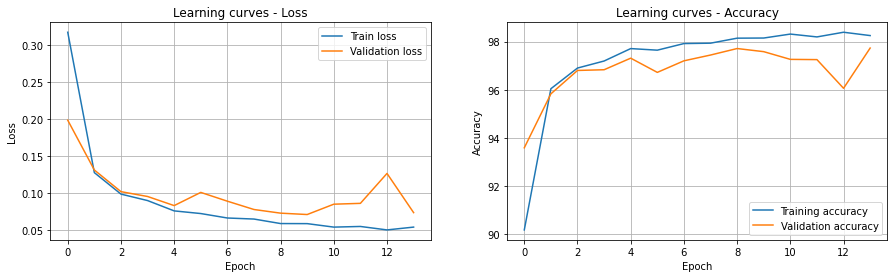

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(7x7)-64(9x9)-32-16, stride1 = 1, stride2 = 2, 2 fc: 1024-10, act = ELU, opt = Adam, lr = 0.01, reg = Dropout


Best val_loss: 0.10550 - train_loss: 0.14773 - val_acc: 97.05% - train_acc: 95.81% - execution_time: 196s


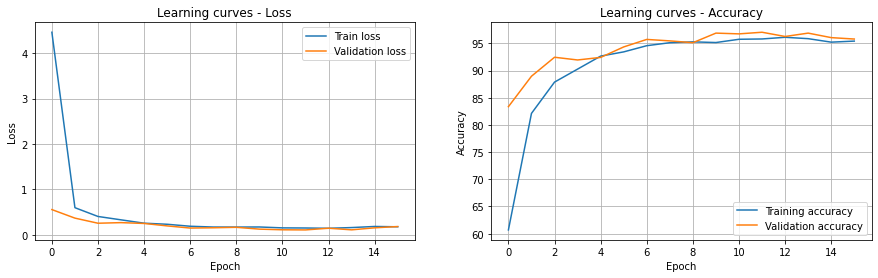

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 16(9x9)-128(9x9)-32-64-16, stride1 = 1, stride2 = 1, 3 fc: 64-2048-10, act = Tanh, opt = Adam, lr = 0.0001, reg = False


Best val_loss: 0.06901 - train_loss: 0.07417 - val_acc: 97.91% - train_acc: 97.74% - execution_time: 371s


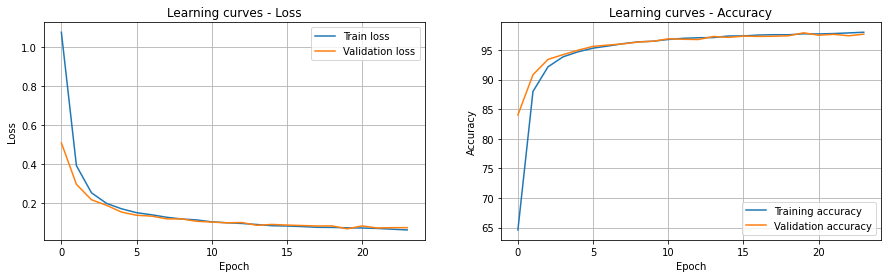

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 16(5x5)-128(7x7)-16-128-32, stride1 = 1, stride2 = 1, 2 fc: 1024-10, act = LeakyReLU, opt = Adam, lr = 0.001, reg = Dropout


Best val_loss: 0.04967 - train_loss: 0.05242 - val_acc: 98.39% - train_acc: 98.39% - execution_time: 259s


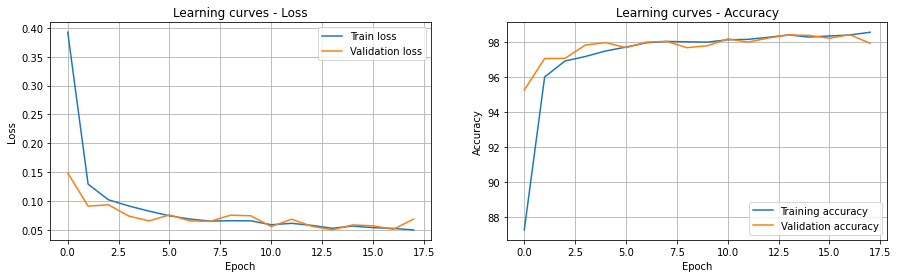

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 16(7x7)-128(3x3)-16-16-128, stride1 = 1, stride2 = 2, 2 fc: 256-10, act = ELU, opt = Adam, lr = 0.001, reg = False


Best val_loss: 0.05346 - train_loss: 0.05128 - val_acc: 98.39% - train_acc: 98.35% - execution_time: 230s


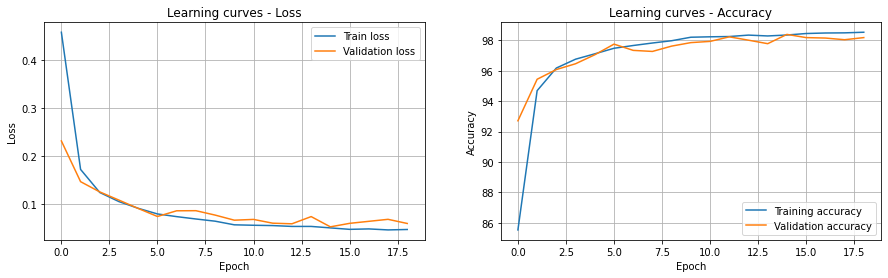

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(3x3)-16(7x7), stride1 = 1, stride2 = 2, 2 fc: 512-10, act = Tanh, opt = Adam, lr = 0.0001, reg = Dropout



Best val_loss: 0.11474 - train_loss: 0.13006 - val_acc: 96.53% - train_acc: 96.02% - execution_time: 335s


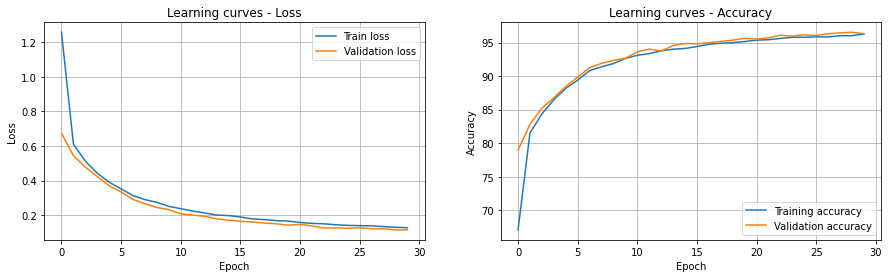

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(5x5)-32(3x3)-16, stride1 = 2, stride2 = 2, 2 fc: 64-10, act = LeakyReLU, opt = Adam, lr = 0.001, reg = False


Best val_loss: 0.11688 - train_loss: 0.11599 - val_acc: 96.43% - train_acc: 96.48% - execution_time: 313s


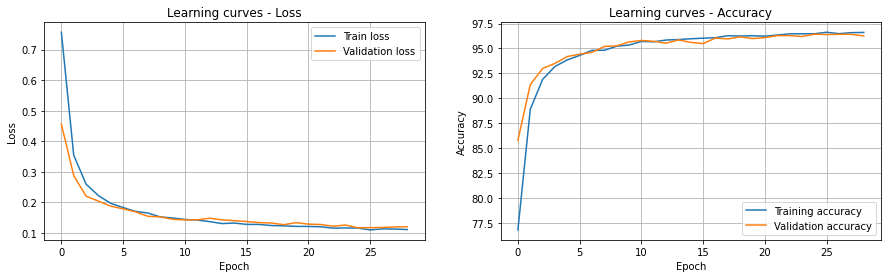

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(3x3)-16(7x7), stride1 = 2, stride2 = 2, 2 fc: 2048-10, act = ELU, opt = Adam, lr = 0.001, reg = Batch norm


Best val_loss: 0.11444 - train_loss: 0.11503 - val_acc: 96.48% - train_acc: 96.44% - execution_time: 211s


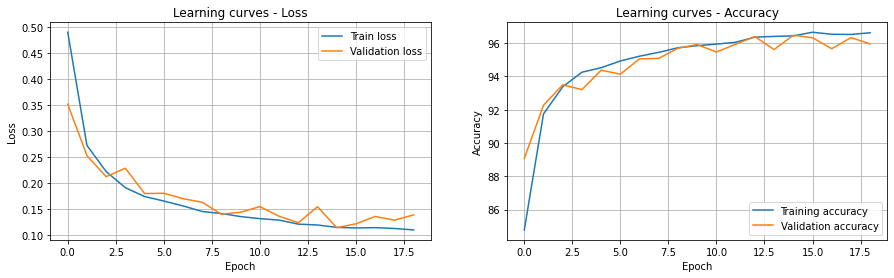

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(9x9)-32(5x5)-128-128, stride1 = 1, stride2 = 2, 2 fc: 128-10, act = Tanh, opt = RMSprop, lr = 0.0001, reg = Batch norm


Best val_loss: 0.11584 - train_loss: 0.10671 - val_acc: 96.55% - train_acc: 96.89% - execution_time: 189s


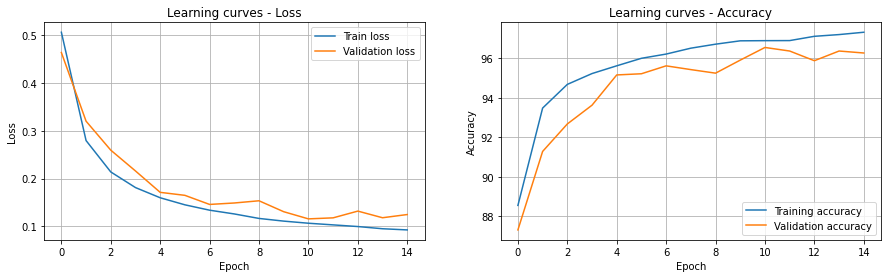

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 16(9x9)-128(3x3)-16-16-64, stride1 = 2, stride2 = 2, 2 fc: 256-10, act = ELU, opt = RMSprop, lr = 0.01, reg = Batch norm


Best val_loss: 0.12692 - train_loss: 0.13686 - val_acc: 96.14% - train_acc: 95.93% - execution_time: 217s


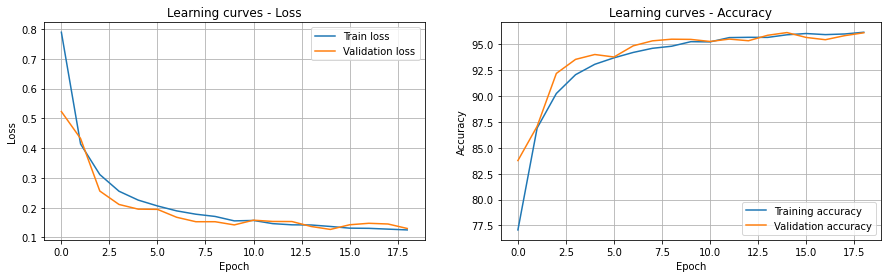

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(3x3)-32(5x5)-128, stride1 = 1, stride2 = 1, 3 fc: 1024-1024-10, act = LeakyReLU, opt = Adam, lr = 0.01, reg = Batch norm


Best val_loss: 0.05347 - train_loss: 0.04477 - val_acc: 98.32% - train_acc: 98.58% - execution_time: 161s


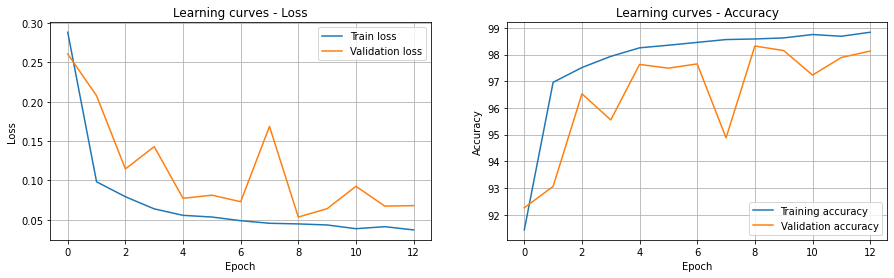

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(9x9)-32(7x7)-128, stride1 = 1, stride2 = 2, 3 fc: 2048-2048-10, act = Tanh, opt = RMSprop, lr = 0.0001, reg = False



Best val_loss: 0.05135 - train_loss: 0.04484 - val_acc: 98.39% - train_acc: 98.56% - execution_time: 425s


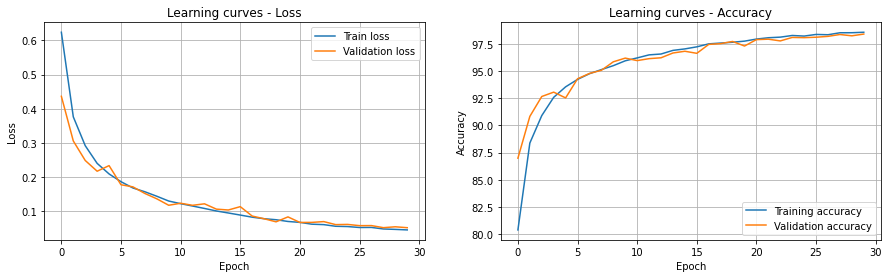

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(9x9)-64(3x3)-64-32, stride1 = 2, stride2 = 2, 3 fc: 256-2048-10, act = ELU, opt = Adam, lr = 0.01, reg = Dropout


Best val_loss: 0.29324 - train_loss: 0.46029 - val_acc: 91.92% - train_acc: 88.30% - execution_time: 237s


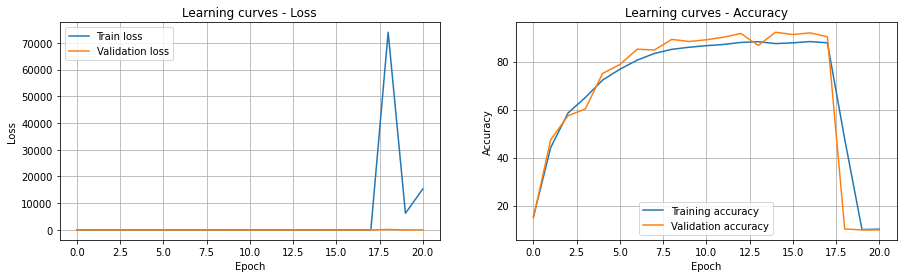

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(3x3)-32(7x7)-64, stride1 = 2, stride2 = 2, 3 fc: 128-128-10, act = Tanh, opt = RMSprop, lr = 0.01, reg = False


Best val_loss: 2.54246 - train_loss: 2.52505 - val_acc: 9.75% - train_acc: 9.95% - execution_time: 66s


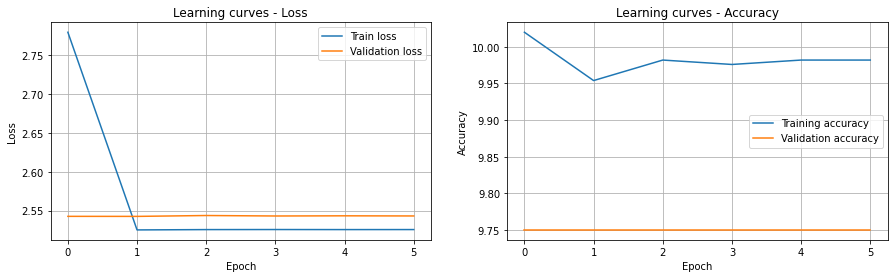

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 16(9x9)-128(7x7)-16-64-32, stride1 = 2, stride2 = 1, 2 fc: 512-10, act = Tanh, opt = RMSprop, lr = 0.0001, reg = Dropout



Best val_loss: 0.06503 - train_loss: 0.06287 - val_acc: 97.89% - train_acc: 98.09% - execution_time: 409s


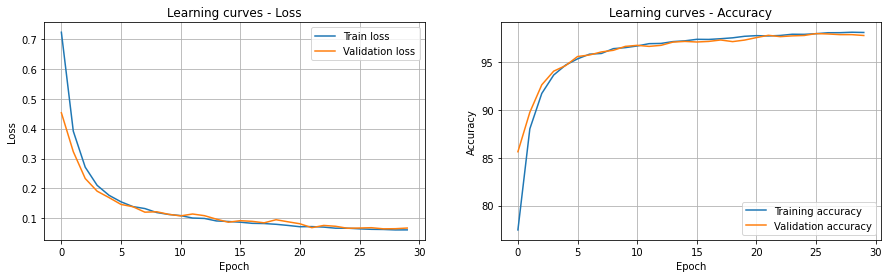

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(7x7)-16(9x9), stride1 = 2, stride2 = 2, 3 fc: 1024-512-10, act = ELU, opt = Adam, lr = 0.01, reg = Dropout


Best val_loss: 0.19315 - train_loss: 0.30373 - val_acc: 94.61% - train_acc: 91.89% - execution_time: 133s


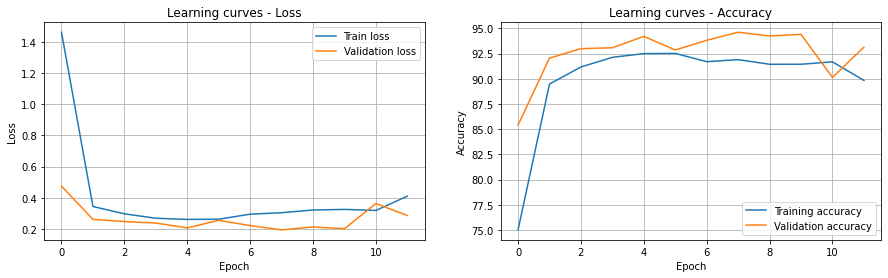

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(3x3)-16(3x3), stride1 = 1, stride2 = 2, 2 fc: 1024-10, act = LeakyReLU, opt = Adam, lr = 0.0001, reg = Dropout



Best val_loss: 0.09041 - train_loss: 0.09345 - val_acc: 97.16% - train_acc: 97.08% - execution_time: 321s


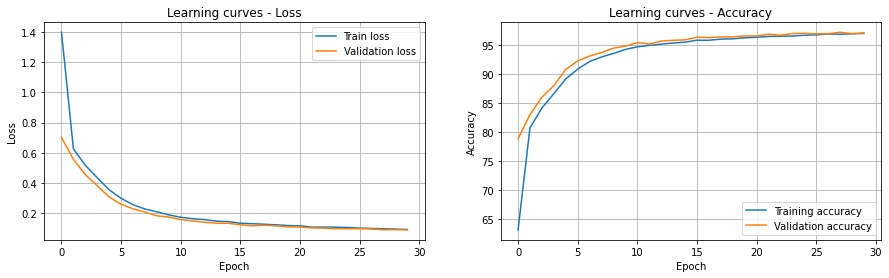

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(9x9)-32(7x7)-128-128, stride1 = 1, stride2 = 2, 2 fc: 64-10, act = Tanh, opt = Adam, lr = 0.01, reg = Dropout


Best val_loss: 2.32614 - train_loss: 2.32360 - val_acc: 9.83% - train_acc: 10.23% - execution_time: 175s


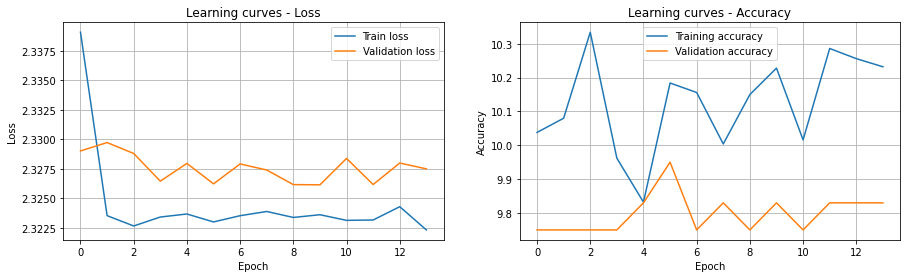

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(5x5)-16(3x3), stride1 = 1, stride2 = 1, 2 fc: 128-10, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = Batch norm


Best val_loss: 0.04097 - train_loss: 0.03088 - val_acc: 98.78% - train_acc: 98.99% - execution_time: 261s


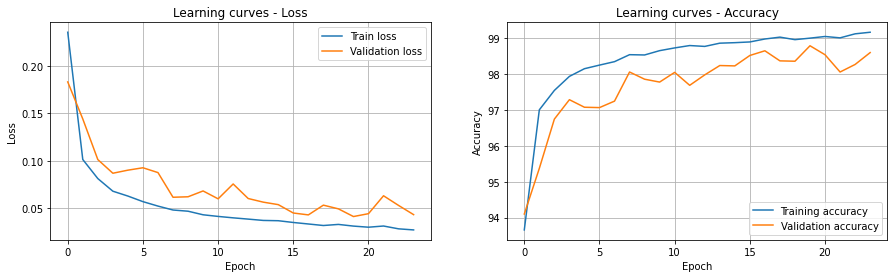

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 16(7x7)-128(9x9)-64-32-16, stride1 = 1, stride2 = 1, 3 fc: 512-128-10, act = Tanh, opt = Adam, lr = 0.01, reg = Batch norm


Best val_loss: 0.07353 - train_loss: 0.06227 - val_acc: 97.73% - train_acc: 98.03% - execution_time: 181s


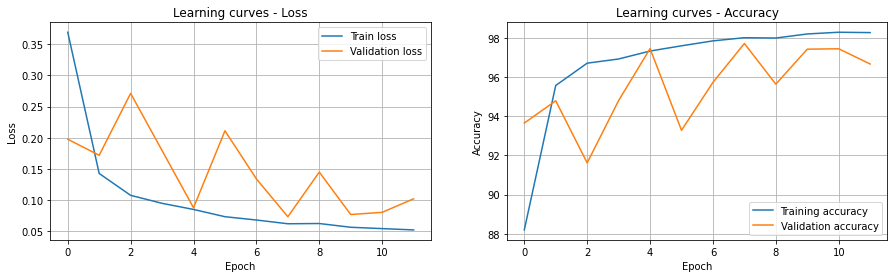

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 16(9x9)-128(9x9)-32-32-32, stride1 = 1, stride2 = 2, 3 fc: 64-128-10, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = Dropout


Best val_loss: 0.08279 - train_loss: 0.15483 - val_acc: 97.38% - train_acc: 95.35% - execution_time: 259s


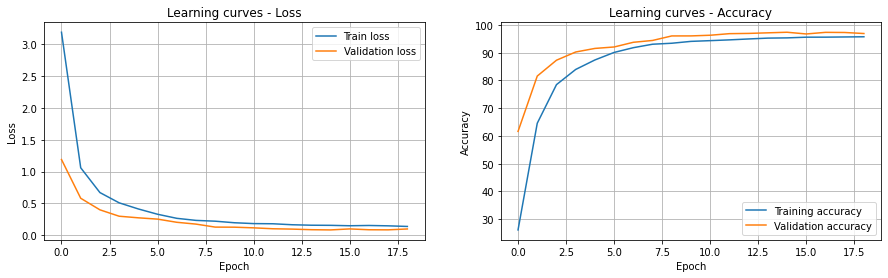

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(9x9)-32(3x3)-64, stride1 = 2, stride2 = 1, 3 fc: 128-1024-10, act = Tanh, opt = RMSprop, lr = 0.001, reg = Batch norm


Best val_loss: 0.05668 - train_loss: 0.05977 - val_acc: 98.09% - train_acc: 98.11% - execution_time: 142s


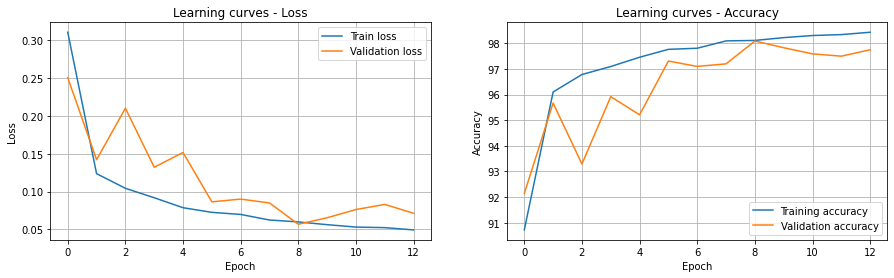

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(9x9)-32(3x3)-64, stride1 = 2, stride2 = 1, 3 fc: 512-2048-10, act = Tanh, opt = RMSprop, lr = 0.0001, reg = Dropout


Best val_loss: 0.09019 - train_loss: 0.10252 - val_acc: 97.02% - train_acc: 96.76% - execution_time: 202s


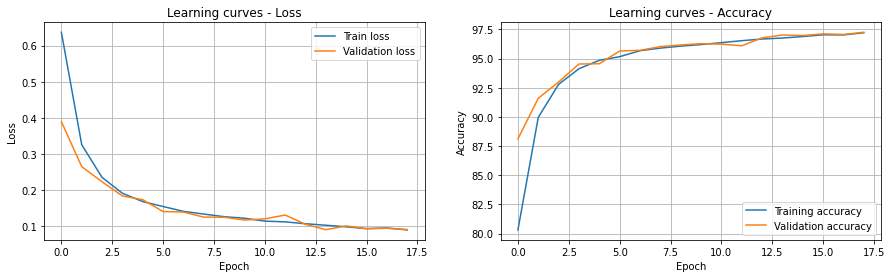

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(7x7)-64(3x3)-32-64, stride1 = 1, stride2 = 1, 3 fc: 64-1024-10, act = Tanh, opt = RMSprop, lr = 0.0001, reg = Dropout



Best val_loss: 0.07726 - train_loss: 0.10424 - val_acc: 97.57% - train_acc: 96.79% - execution_time: 342s


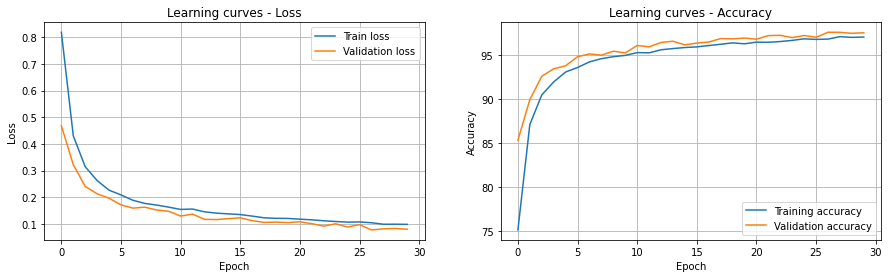

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 16(3x3)-128(7x7)-16-16-128, stride1 = 1, stride2 = 2, 2 fc: 256-10, act = Tanh, opt = RMSprop, lr = 0.0001, reg = False



Best val_loss: 0.08716 - train_loss: 0.08813 - val_acc: 97.51% - train_acc: 97.38% - execution_time: 381s


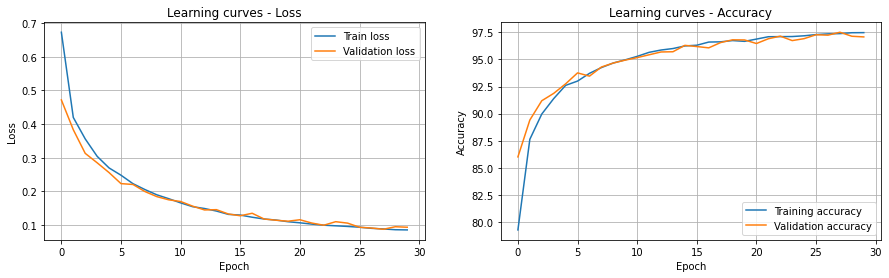

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 16(5x5)-128(7x7)-16-32-16, stride1 = 1, stride2 = 2, 2 fc: 256-10, act = ELU, opt = Adam, lr = 0.001, reg = Batch norm


Best val_loss: 0.05602 - train_loss: 0.04923 - val_acc: 98.08% - train_acc: 98.44% - execution_time: 258s


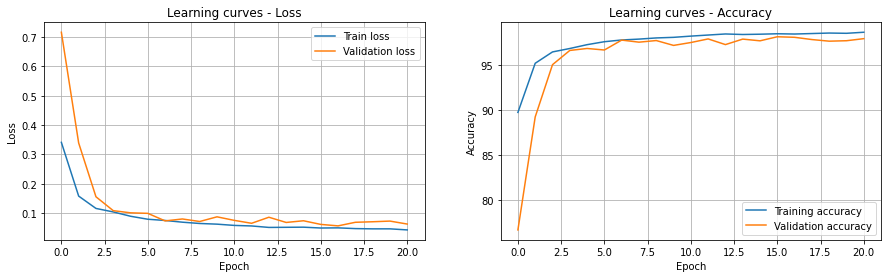

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(7x7)-16(3x3), stride1 = 2, stride2 = 1, 2 fc: 64-10, act = LeakyReLU, opt = RMSprop, lr = 0.0001, reg = Dropout



Best val_loss: 0.12292 - train_loss: 0.16552 - val_acc: 96.11% - train_acc: 94.98% - execution_time: 317s


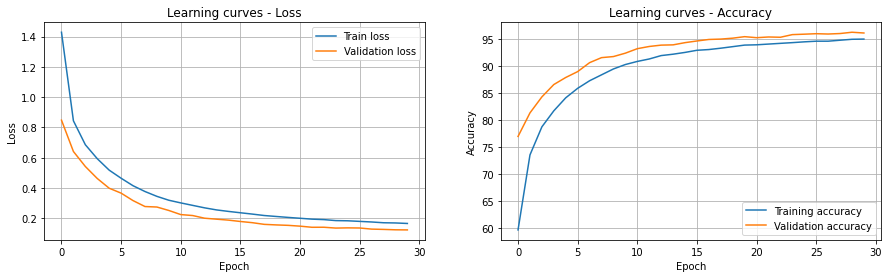

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(3x3)-64(7x7)-128-16, stride1 = 1, stride2 = 1, 3 fc: 2048-128-10, act = Tanh, opt = Adam, lr = 0.0001, reg = False



Best val_loss: 0.04628 - train_loss: 0.03602 - val_acc: 98.58% - train_acc: 98.91% - execution_time: 393s


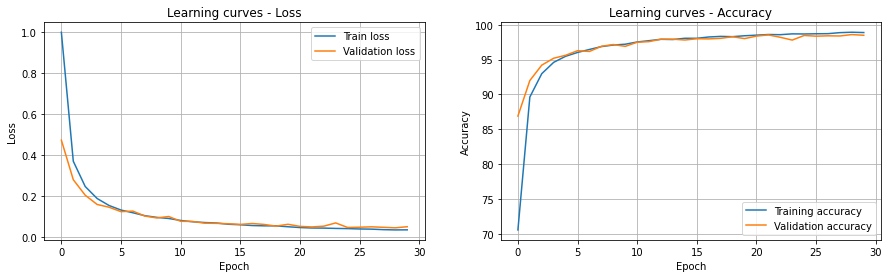

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(3x3)-32(3x3)-128, stride1 = 1, stride2 = 2, 3 fc: 1024-512-10, act = Tanh, opt = Adam, lr = 0.0001, reg = Dropout


Best val_loss: 0.07834 - train_loss: 0.09018 - val_acc: 97.44% - train_acc: 97.18% - execution_time: 256s


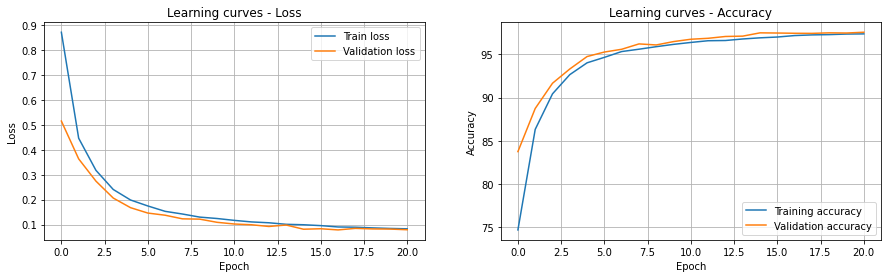

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(3x3)-32(7x7)-16, stride1 = 2, stride2 = 2, 2 fc: 128-10, act = ELU, opt = Adam, lr = 0.0001, reg = Dropout



Best val_loss: 0.14541 - train_loss: 0.20266 - val_acc: 95.52% - train_acc: 93.72% - execution_time: 320s


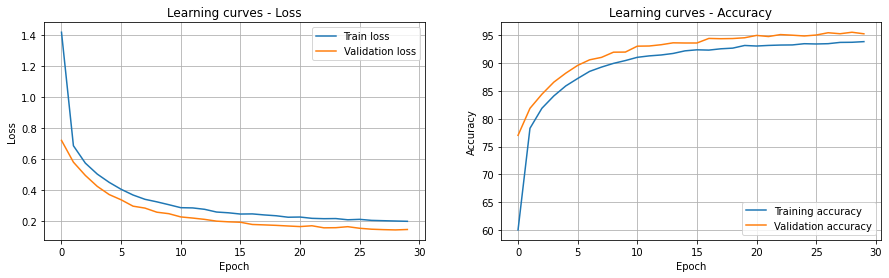

--------------------------------------------------------------------------------------------------------------------
RESULTS
Val_acc = 98.78 -> 2 conv: 16(5x5)-16(3x3), stride1 = 1, stride2 = 1, 2 fc: 128-10, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = Batch norm
Val_acc = 98.58 -> 4 conv: 16(3x3)-64(7x7)-128-16, stride1 = 1, stride2 = 1, 3 fc: 2048-128-10, act = Tanh, opt = Adam, lr = 0.0001, reg = False
Val_acc = 98.39 -> 5 conv: 16(5x5)-128(7x7)-16-128-32, stride1 = 1, stride2 = 1, 2 fc: 1024-10, act = LeakyReLU, opt = Adam, lr = 0.001, reg = Dropout
Val_acc = 98.39 -> 5 conv: 16(7x7)-128(3x3)-16-16-128, stride1 = 1, stride2 = 2, 2 fc: 256-10, act = ELU, opt = Adam, lr = 0.001, reg = False
Val_acc = 98.39 -> 3 conv: 16(9x9)-32(7x7)-128, stride1 = 1, stride2 = 2, 3 fc: 2048-2048-10, act = Tanh, opt = RMSprop, lr = 0.0001, reg = False
Val_acc = 98.32 -> 3 conv: 16(3x3)-32(5x5)-128, stride1 = 1, stride2 = 1, 3 fc: 1024-1024-10, act = LeakyReLU, opt = Adam, lr = 0.01, reg = Batch 

In [ ]:
# Define possible values for each hyper-parameter

conv_layers_v = [2, 3, 4, 5]
fc_layers_v = [2, 3]
Nconv_v = [16, 32, 64, 128]
kernel_v = [3, 5, 7, 9]
stride_v = [1, 2]
Nh_v = [64, 128, 256, 512, 1024, 2048]
act_v = ['Tanh', 'LeakyReLU', 'ELU']
act_dict = {'Tanh':nn.Tanh(), 'LeakyReLU':nn.LeakyReLU(), 'ELU':nn.ELU()}
opt_v = ['Adam', 'RMSprop']
lr_v = [0.01, 0.001, 0.0001]
reg_v = ['False', 'Dropout', 'Batch norm']
results = []

# RANDOM SEARCH
random.seed(1)
torch.manual_seed(0)
pbar = tq.tqdm(total = 30, desc = 'Random search progress')
random_coarse_grid_conv = list(itertools.product(Nconv_v, Nconv_v, Nconv_v, Nconv_v, Nconv_v, kernel_v, kernel_v, stride_v, stride_v))
random_coarse_grid_fc = list(itertools.product(conv_layers_v, fc_layers_v, Nh_v, Nh_v, act_v, opt_v, lr_v, reg_v))
random_coarse_grid = [x + y for x, y in zip(random_coarse_grid_conv, random_coarse_grid_fc)] 
for (Nconv1, Nconv2, Nconv3, Nconv4, Nconv5, k1, k2, stride1, stride2, 
     cl, fcl, Nh1, Nh2, act, opt, lr, reg) in random.sample(random_coarse_grid, 30):
    # sampling combinations from itertools.product, we are sure no combination is repeated

    # CNN 5 conv: 16(9x9)-128(9x9)-32-64-3, stride1 = 1, stride2 = 1, 3 fc: 64-2048-10, act = Tanh, opt = Adam, lr = 0.0001, reg = False
    # (Nconv1, Nconv2, Nconv3, Nconv4, Nconv5, k1, k2, stride1, stride2, cl, fcl, Nh1, Nh2, act, opt, lr, reg) = (16, 128, 32, 64, 3)
    print(f'CNN {cl} conv:' 
          f' {Nconv1}({k1}x{k1}){-Nconv2}({k2}x{k2}){-Nconv3 if cl >= 3 else ""}{-Nconv4 if cl >= 4 else ""}{-Nconv5 if cl >= 5 else ""},'
          f' stride1 = {stride1}, stride2 = {stride2},'
          f' {fcl} fc: {Nh1}{-Nh2 if fcl == 3 else ""}{-10}, act = {act}, opt = {opt}, lr = {lr}, reg = {reg}')
    
    start_time = time.time()
    # NETWORK INITIALIZATION
    torch.manual_seed(0)
    activation = act_dict[act]
    net = CNN(784, 10, cl, fcl, Nconv1, Nconv2, Nconv3, Nconv4, Nconv5, k1, k2, stride1, stride2, Nh1, Nh2, activation, reg)
    net.to(device)

    # Define the loss function
    loss_function = nn.CrossEntropyLoss()

    # Define the optimizer
    if reg == 'L2':
        opt_dict = {'Adam': optim.Adam(net.parameters(), lr =lr, weight_decay = wd),
                    'RMSprop': optim.RMSprop(net.parameters(), lr = lr, weight_decay = wd),
                    'Adagrad': optim.Adagrad(net.parameters(), lr = lr, weight_decay = wd),
                    'Adadelta': optim.Adadelta(net.parameters(), lr = lr, weight_decay = wd)}
        optimizer = opt_dict[opt]
    else:
        opt_dict = {'Adam': optim.Adam(net.parameters(), lr = lr), 
                    'RMSprop': optim.RMSprop(net.parameters(), lr = lr),
                    'Adagrad': optim.Adagrad(net.parameters(), lr = lr),
                    'Adadelta': optim.Adadelta(net.parameters(), lr = lr)}
        optimizer = opt_dict[opt]

    # TRAINING LOOP
    num_epochs = 30
    patience = 4
    train_dataloader, val_dataloader = myDataLoader(train_dataset, val_dataset, 250, val_batch_size=250)
    train_loss_log, val_loss_log, best_t_loss, best_v_loss, train_accuracy_log, val_accuracy_log, best_t_acc, best_v_acc, net = training_loop(net, 
                            train_dataloader, val_dataloader, loss_function, optimizer, num_epochs, no_improve_epoch=0, patience=patience)
    
    results.append((np.round(best_v_acc, 2), f'{cl} conv:' 
          f' {Nconv1}({k1}x{k1}){-Nconv2}({k2}x{k2}){-Nconv3 if cl >= 3 else ""}{-Nconv4 if cl >= 4 else ""}{-Nconv5 if cl >= 5 else ""},'
          f' stride1 = {stride1}, stride2 = {stride2},'
          f' {fcl} fc: {Nh1}{-Nh2 if fcl == 3 else ""}{-10}, act = {act}, opt = {opt}, lr = {lr}, reg = {reg}'))
    run_time = time.time() - start_time
    print(f'Best val_loss: {best_v_loss:.5f} - train_loss: {best_t_loss:.5f} - val_acc: {best_v_acc:.2f}% - train_acc: {best_t_acc:.2f}% - execution_time: {run_time:.0f}s') 
    
    plot_losses(train_loss_log, val_loss_log, train_accuracy_log, val_accuracy_log)
    print('--------------------------------------------------------------------------------------------------------------------')
    pbar.update(1)

print('RESULTS')
for r in sorted(results, key=lambda tup: tup[0], reverse = True):
    print(f'Val_acc = {r[0]:.2f} -> {r[1]}')

Third search

CNN 2 conv: 16(9x9)-32(3x3), stride1 = 2, stride2 = 1, 3 fc: 2048-256-10, act = LeakyReLU, opt = RMSprop, lr = 0.003, reg = Dropout, loss = CrossEntropy


Best val_loss: 0.06307 - train_loss: 0.11740 - val_acc: 98.14% - train_acc: 96.77% - execution_time: 305s


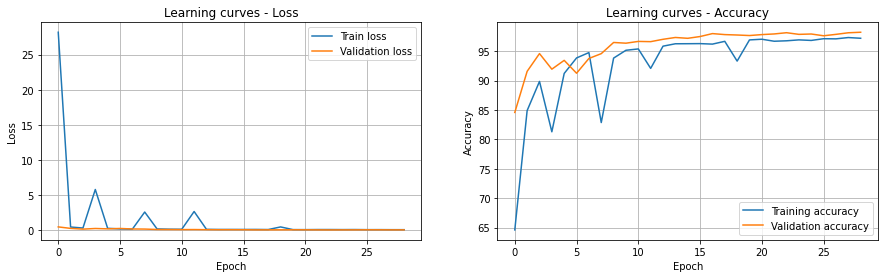

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(5x5)-16(3x3), stride1 = 2, stride2 = 2, 2 fc: 2048-10, act = Tanh, opt = RMSprop, lr = 0.003, reg = Dropout, loss = NLLLoss


Best val_loss: 0.20624 - train_loss: 0.28434 - val_acc: 94.85% - train_acc: 91.94% - execution_time: 238s


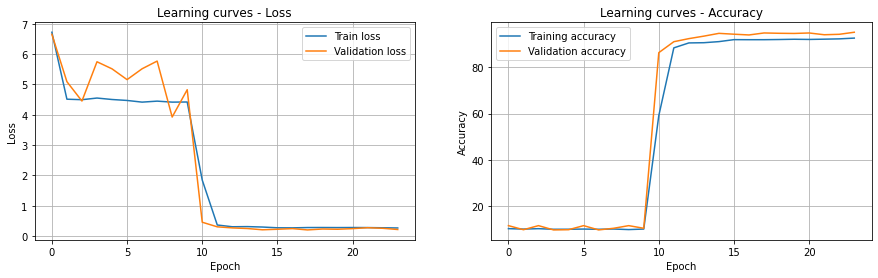

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(7x7)-64(5x5)-16, stride1 = 2, stride2 = 1, 3 fc: 512-1024-10, act = LeakyReLU, opt = Adam, lr = 0.001, reg = Dropout, loss = CrossEntropy


Best val_loss: 0.03598 - train_loss: 0.03733 - val_acc: 98.89% - train_acc: 98.80% - execution_time: 343s


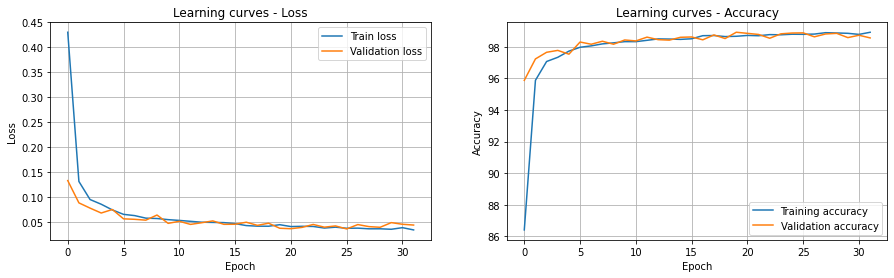

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(5x5)-16(5x5), stride1 = 2, stride2 = 2, 3 fc: 1024-64-10, act = Tanh, opt = RMSprop, lr = 0.001, reg = Dropout, loss = NLLLoss



Best val_loss: 0.07665 - train_loss: 0.11272 - val_acc: 97.84% - train_acc: 96.58% - execution_time: 404s


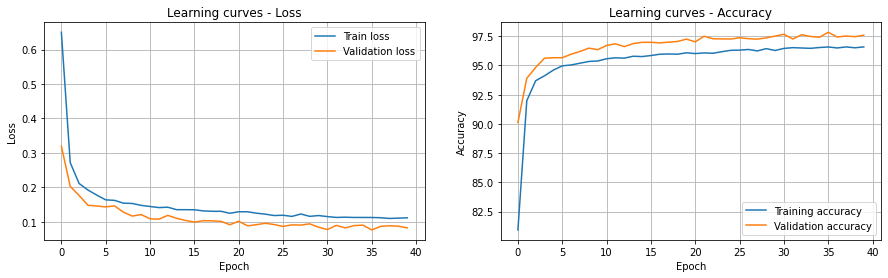

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 16(7x7)-128(7x7)-128-128-32, stride1 = 2, stride2 = 1, 3 fc: 64-128-10, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = Dropout, loss = CrossEntropy


Best val_loss: 0.05979 - train_loss: 0.08702 - val_acc: 98.16% - train_acc: 97.46% - execution_time: 448s


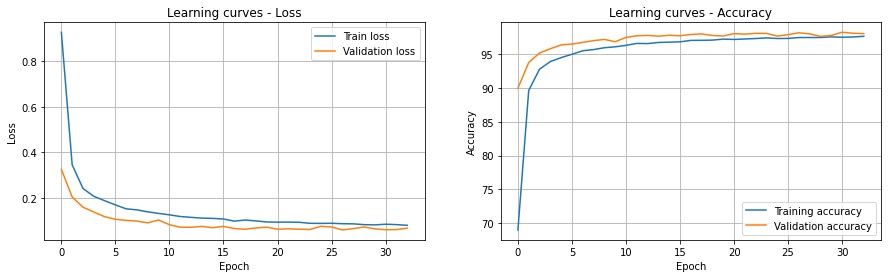

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 16(3x3)-128(7x7)-64-32-64, stride1 = 1, stride2 = 1, 2 fc: 256-10, act = Tanh, opt = Adam, lr = 0.0003, reg = False, loss = CrossEntropy


Best val_loss: 0.05191 - train_loss: 0.04933 - val_acc: 98.41% - train_acc: 98.52% - execution_time: 363s


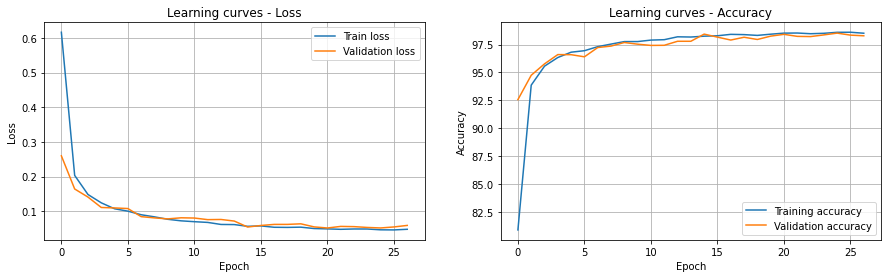

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 16(9x9)-128(3x3)-128-16-32, stride1 = 2, stride2 = 1, 2 fc: 1024-10, act = LeakyReLU, opt = RMSprop, lr = 0.003, reg = Dropout, loss = CrossEntropy


Best val_loss: 0.69516 - train_loss: 1.18940 - val_acc: 79.78% - train_acc: 67.82% - execution_time: 117s


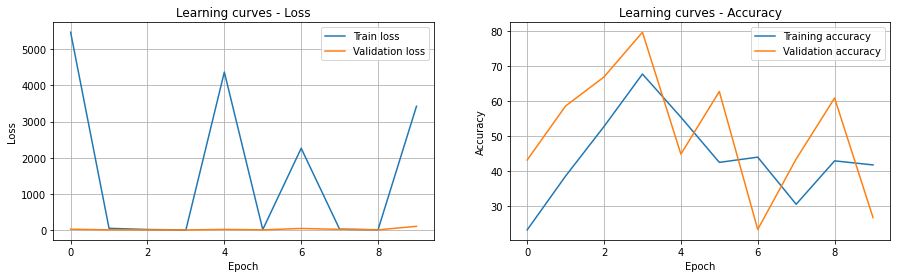

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(5x5)-128(5x5)-16-16, stride1 = 2, stride2 = 2, 3 fc: 256-256-10, act = Tanh, opt = RMSprop, lr = 0.001, reg = Dropout, loss = NLLLoss


Best val_loss: 0.16326 - train_loss: 0.23274 - val_acc: 94.99% - train_acc: 92.63% - execution_time: 223s


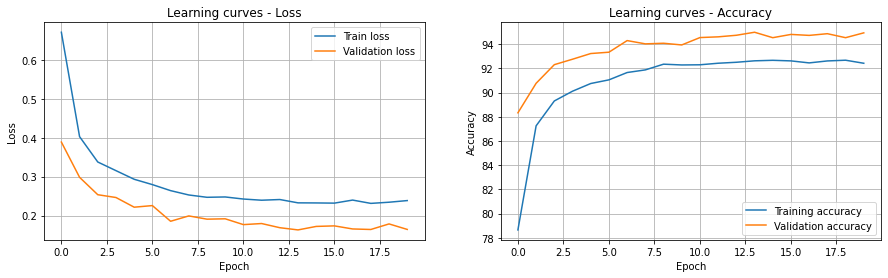

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(5x5)-32(9x9)-64, stride1 = 2, stride2 = 2, 2 fc: 2048-10, act = Tanh, opt = RMSprop, lr = 0.0001, reg = Dropout, loss = NLLLoss



Best val_loss: 0.07338 - train_loss: 0.07914 - val_acc: 97.82% - train_acc: 97.56% - execution_time: 451s


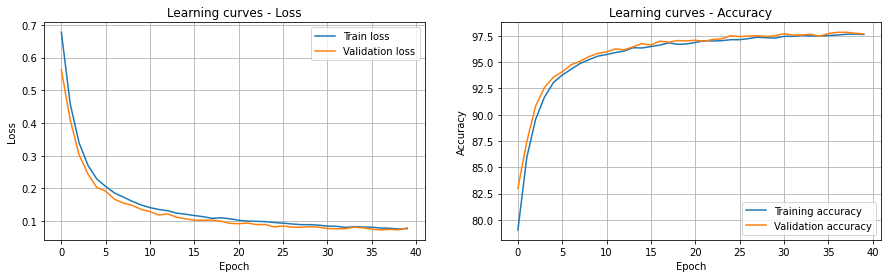

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(3x3)-16(3x3), stride1 = 2, stride2 = 2, 3 fc: 256-64-10, act = Tanh, opt = Adam, lr = 0.003, reg = Dropout, loss = NLLLoss


Best val_loss: 0.11418 - train_loss: 0.17758 - val_acc: 96.76% - train_acc: 94.80% - execution_time: 289s


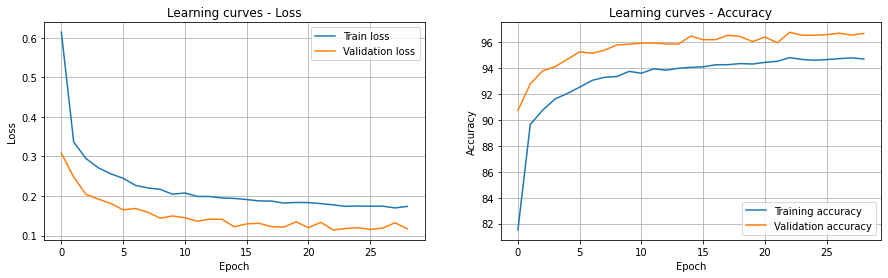

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 16(9x9)-128(3x3)-128-64-32, stride1 = 2, stride2 = 1, 2 fc: 2048-10, act = LeakyReLU, opt = RMSprop, lr = 0.003, reg = Dropout, loss = CrossEntropy


Best val_loss: 4.01886 - train_loss: 21.69490 - val_acc: 59.24% - train_acc: 45.09% - execution_time: 184s


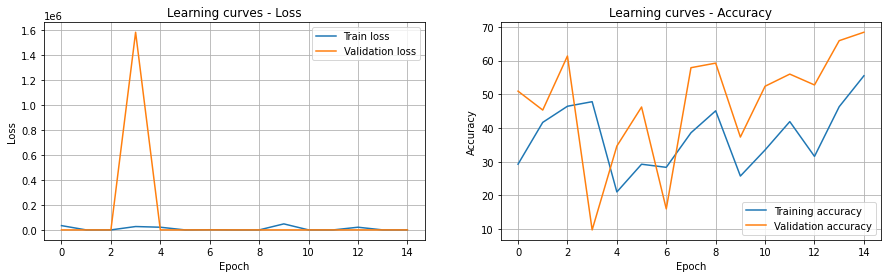

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(7x7)-16(3x3), stride1 = 1, stride2 = 1, 2 fc: 256-10, act = LeakyReLU, opt = Adam, lr = 0.003, reg = False, loss = CrossEntropy


Best val_loss: 0.04813 - train_loss: 0.05451 - val_acc: 98.59% - train_acc: 98.33% - execution_time: 133s


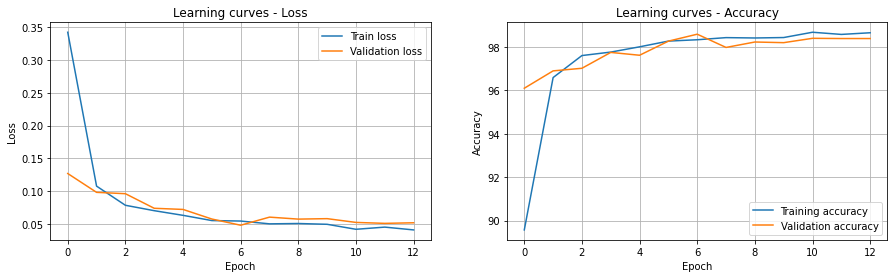

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(7x7)-128(5x5)-16-32, stride1 = 1, stride2 = 2, 3 fc: 512-128-10, act = LeakyReLU, opt = Adam, lr = 0.001, reg = False, loss = NLLLoss


Best val_loss: 0.04548 - train_loss: 0.03456 - val_acc: 98.65% - train_acc: 98.90% - execution_time: 443s


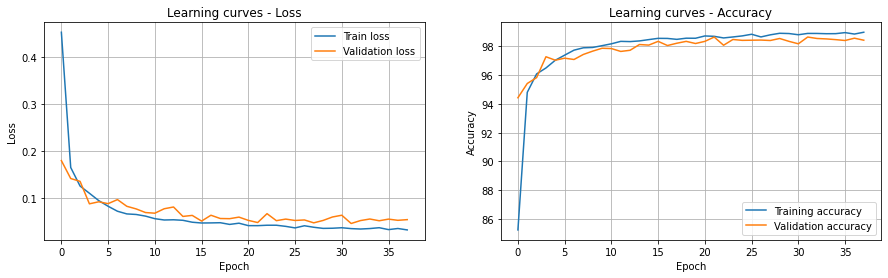

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 16(7x7)-128(5x5)-32-128-32, stride1 = 1, stride2 = 1, 2 fc: 64-10, act = LeakyReLU, opt = Adam, lr = 0.001, reg = False, loss = CrossEntropy


Best val_loss: 0.05274 - train_loss: 0.05359 - val_acc: 98.49% - train_acc: 98.33% - execution_time: 278s


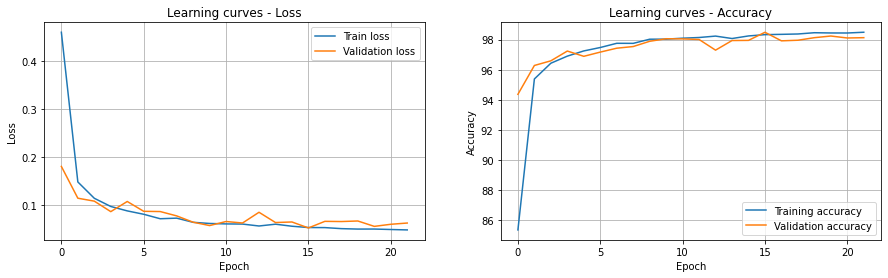

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(3x3)-16(5x5), stride1 = 1, stride2 = 2, 2 fc: 64-10, act = Tanh, opt = Adam, lr = 0.001, reg = False, loss = NLLLoss


Best val_loss: 0.06402 - train_loss: 0.05662 - val_acc: 98.01% - train_acc: 98.28% - execution_time: 345s


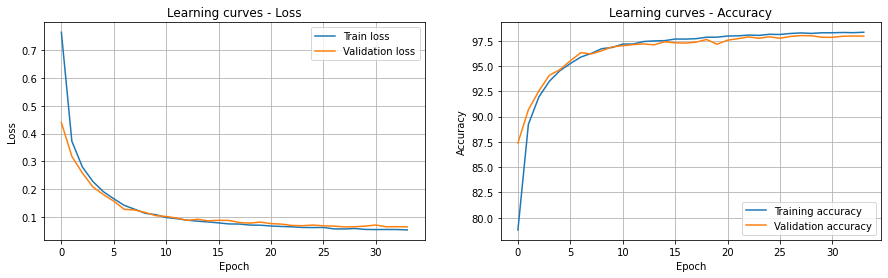

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 16(3x3)-128(3x3)-64-32-16, stride1 = 2, stride2 = 1, 2 fc: 256-10, act = Tanh, opt = Adam, lr = 0.003, reg = Dropout, loss = CrossEntropy


Best val_loss: 0.28492 - train_loss: 0.48606 - val_acc: 91.63% - train_acc: 84.63% - execution_time: 81s


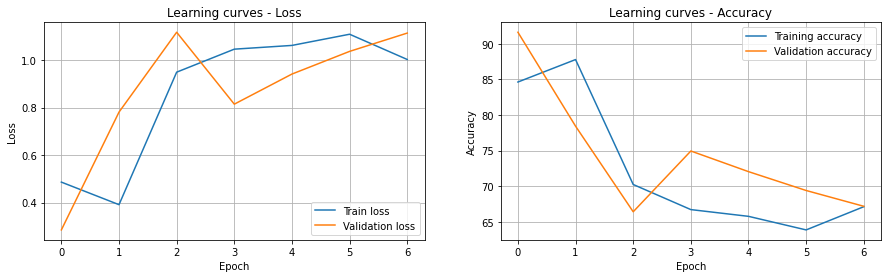

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(5x5)-64(5x5)-16, stride1 = 2, stride2 = 2, 3 fc: 1024-1024-10, act = Tanh, opt = RMSprop, lr = 0.001, reg = Dropout, loss = NLLLoss


Best val_loss: 0.09677 - train_loss: 0.12501 - val_acc: 96.89% - train_acc: 96.03% - execution_time: 365s


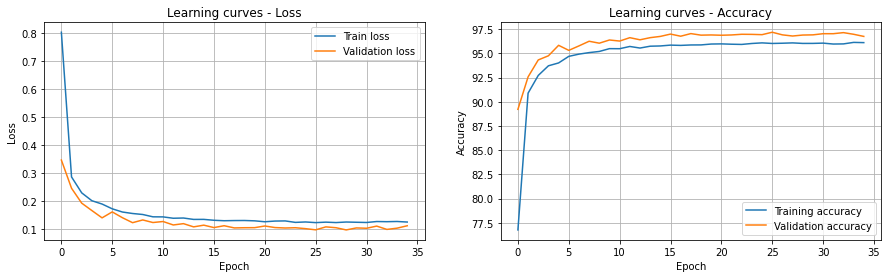

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(3x3)-32(7x7)-128, stride1 = 1, stride2 = 1, 3 fc: 128-512-10, act = Tanh, opt = Adam, lr = 0.0003, reg = False, loss = CrossEntropy


Best val_loss: 0.04434 - train_loss: 0.04038 - val_acc: 98.55% - train_acc: 98.72% - execution_time: 294s


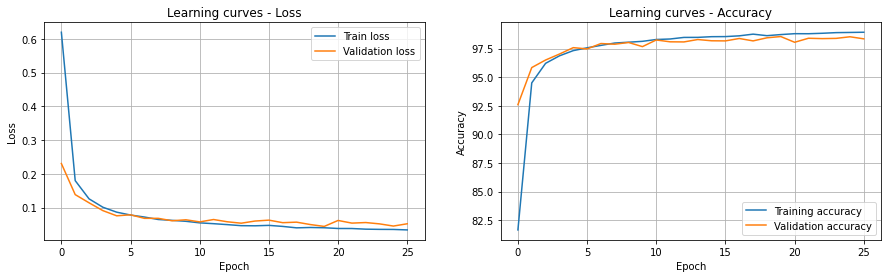

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(5x5)-16(5x5), stride1 = 1, stride2 = 2, 3 fc: 256-1024-10, act = Tanh, opt = RMSprop, lr = 0.001, reg = False, loss = NLLLoss


Best val_loss: 0.04648 - train_loss: 0.04033 - val_acc: 98.45% - train_acc: 98.70% - execution_time: 251s


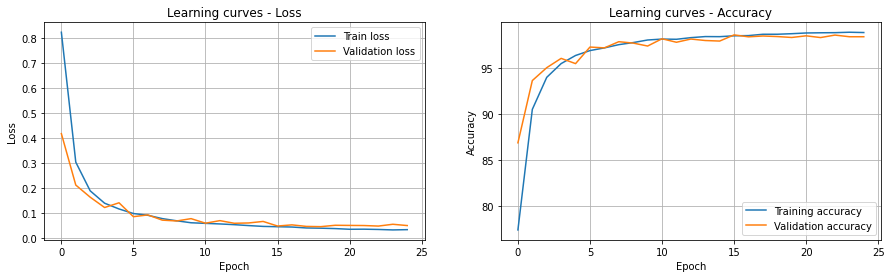

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(7x7)-64(3x3)-64-16, stride1 = 1, stride2 = 2, 2 fc: 512-10, act = LeakyReLU, opt = Adam, lr = 0.003, reg = False, loss = NLLLoss


Best val_loss: 0.06782 - train_loss: 0.06540 - val_acc: 97.96% - train_acc: 98.05% - execution_time: 245s


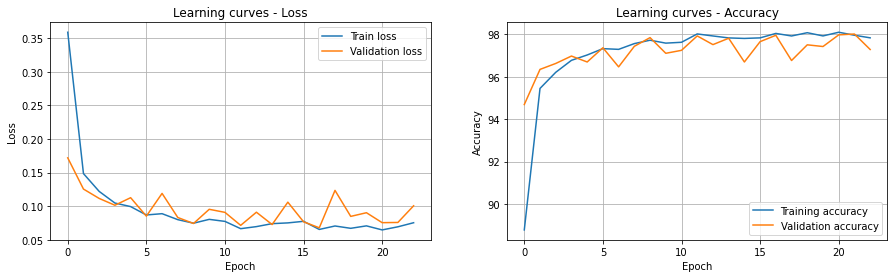

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(7x7)-16(7x7), stride1 = 2, stride2 = 1, 2 fc: 256-10, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = Dropout, loss = CrossEntropy



Best val_loss: 0.04140 - train_loss: 0.04755 - val_acc: 98.77% - train_acc: 98.50% - execution_time: 422s


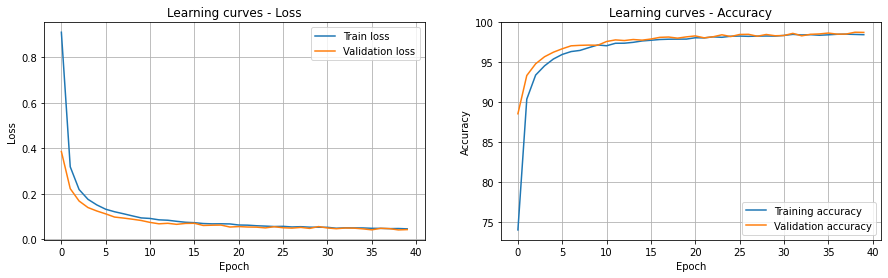

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(5x5)-16(7x7), stride1 = 2, stride2 = 2, 2 fc: 128-10, act = Tanh, opt = RMSprop, lr = 0.0003, reg = Dropout, loss = NLLLoss



Best val_loss: 0.14756 - train_loss: 0.21525 - val_acc: 95.48% - train_acc: 93.33% - execution_time: 395s


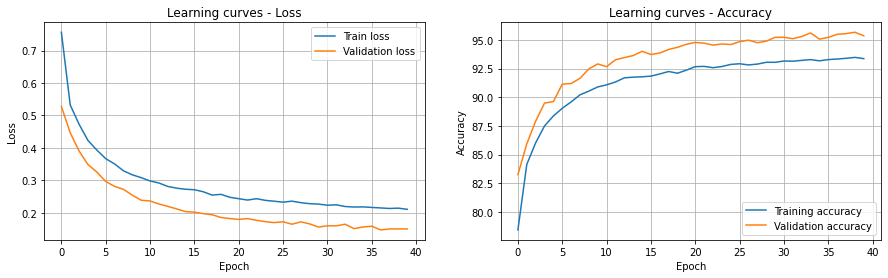

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(3x3)-16(3x3), stride1 = 1, stride2 = 2, 2 fc: 256-10, act = Tanh, opt = Adam, lr = 0.003, reg = False, loss = NLLLoss


Best val_loss: 0.05249 - train_loss: 0.04896 - val_acc: 98.33% - train_acc: 98.41% - execution_time: 208s


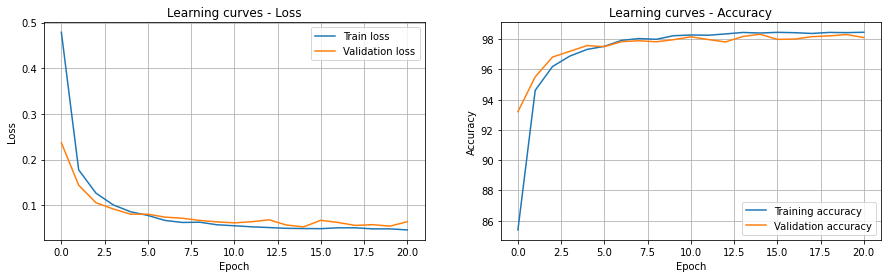

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 32(3x3)-16(9x9)-32-32-32, stride1 = 1, stride2 = 2, 3 fc: 1024-128-10, act = Tanh, opt = Adam, lr = 0.0001, reg = False, loss = NLLLoss



Best val_loss: 0.05552 - train_loss: 0.04635 - val_acc: 98.19% - train_acc: 98.59% - execution_time: 484s


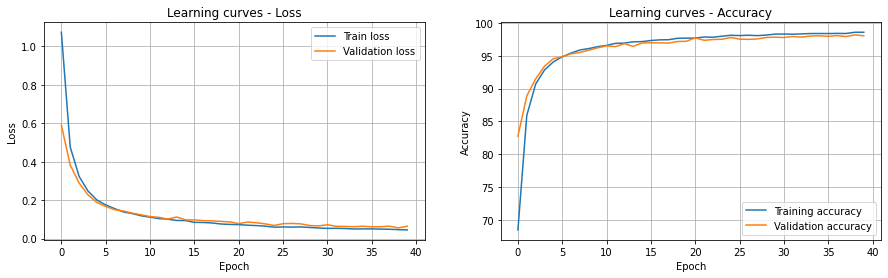

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(7x7)-16(9x9), stride1 = 1, stride2 = 2, 2 fc: 64-10, act = LeakyReLU, opt = Adam, lr = 0.0001, reg = False, loss = NLLLoss



Best val_loss: 0.10583 - train_loss: 0.09834 - val_acc: 96.76% - train_acc: 97.05% - execution_time: 419s


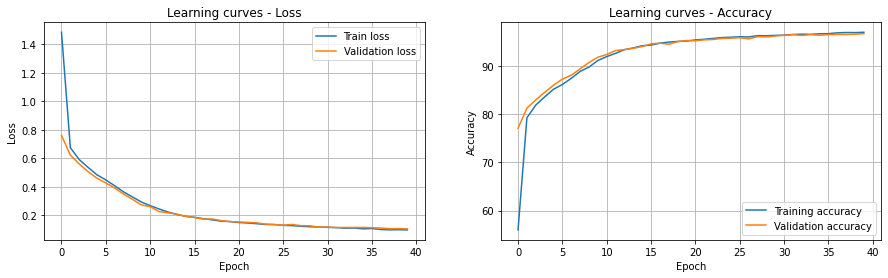

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(3x3)-128(7x7)-16-16, stride1 = 2, stride2 = 2, 3 fc: 256-512-10, act = Tanh, opt = Adam, lr = 0.0003, reg = Dropout, loss = NLLLoss



Best val_loss: 0.09432 - train_loss: 0.12358 - val_acc: 97.22% - train_acc: 96.04% - execution_time: 444s


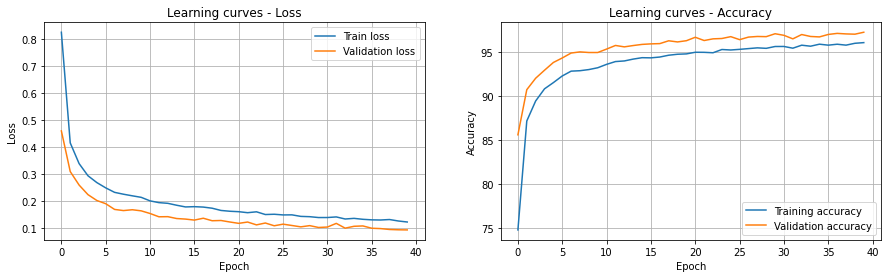

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(9x9)-32(7x7)-64, stride1 = 1, stride2 = 2, 3 fc: 64-256-10, act = LeakyReLU, opt = RMSprop, lr = 0.0003, reg = False, loss = NLLLoss



Best val_loss: 0.04591 - train_loss: 0.04082 - val_acc: 98.48% - train_acc: 98.71% - execution_time: 446s


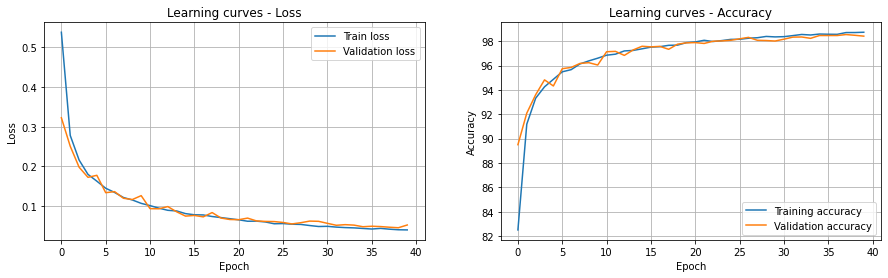

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 16(3x3)-128(5x5)-32-64-16, stride1 = 2, stride2 = 2, 2 fc: 64-10, act = Tanh, opt = Adam, lr = 0.001, reg = Dropout, loss = NLLLoss


Best val_loss: 0.63679 - train_loss: 0.91827 - val_acc: 80.46% - train_acc: 74.07% - execution_time: 81s


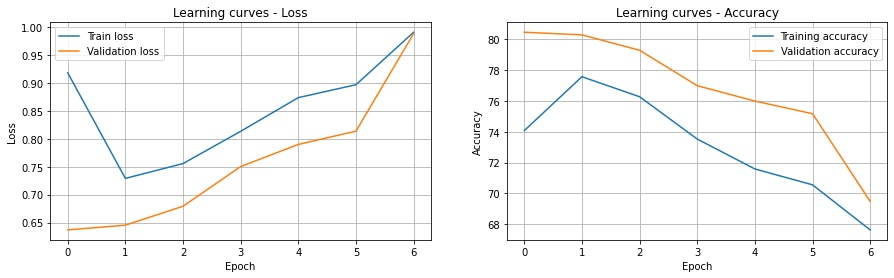

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(9x9)-16(5x5), stride1 = 2, stride2 = 2, 2 fc: 256-10, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = Dropout, loss = NLLLoss


Best val_loss: 0.07168 - train_loss: 0.10955 - val_acc: 97.88% - train_acc: 96.65% - execution_time: 340s


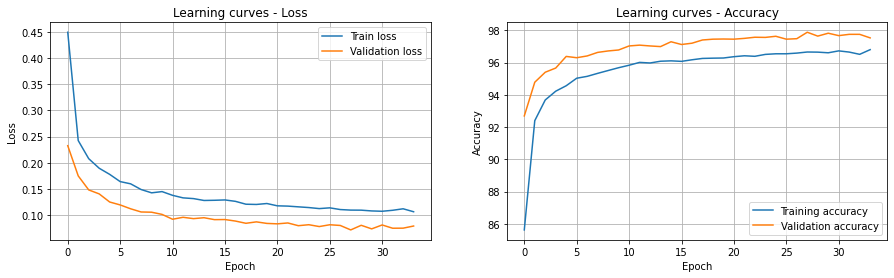

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 32(3x3)-16(7x7)-16-128-64, stride1 = 1, stride2 = 2, 3 fc: 512-64-10, act = Tanh, opt = Adam, lr = 0.0003, reg = False, loss = NLLLoss


Best val_loss: 0.04605 - train_loss: 0.04176 - val_acc: 98.54% - train_acc: 98.65% - execution_time: 438s


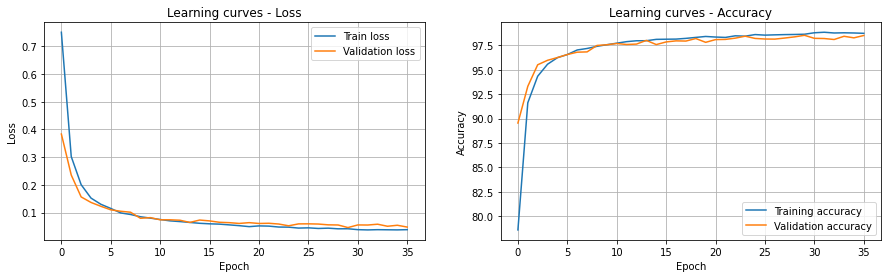

--------------------------------------------------------------------------------------------------------------------
RESULTS
Val_acc = 98.89 -> 3 conv: 16(7x7)-64(5x5)-16, stride1 = 2, stride2 = 1, 3 fc: 512-1024-10, act = LeakyReLU, opt = Adam, lr = 0.001, reg = Dropout, loss = CrossEntropy
Val_acc = 98.77 -> 2 conv: 16(7x7)-16(7x7), stride1 = 2, stride2 = 1, 2 fc: 256-10, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = Dropout, loss = CrossEntropy
Val_acc = 98.65 -> 4 conv: 16(7x7)-128(5x5)-16-32, stride1 = 1, stride2 = 2, 3 fc: 512-128-10, act = LeakyReLU, opt = Adam, lr = 0.001, reg = False, loss = NLLLoss
Val_acc = 98.59 -> 2 conv: 16(7x7)-16(3x3), stride1 = 1, stride2 = 1, 2 fc: 256-10, act = LeakyReLU, opt = Adam, lr = 0.003, reg = False, loss = CrossEntropy
Val_acc = 98.55 -> 3 conv: 16(3x3)-32(7x7)-128, stride1 = 1, stride2 = 1, 3 fc: 128-512-10, act = Tanh, opt = Adam, lr = 0.0003, reg = False, loss = CrossEntropy
Val_acc = 98.54 -> 5 conv: 32(3x3)-16(7x7)-16-128-64, stride1 

In [ ]:
# Loss functions and more precise lr
# Define possible values for each hyper-parameter

conv_layers_v = [2, 3, 4, 5]
fc_layers_v = [2, 3]
Nconv_v = [16, 32, 64, 128]
kernel_v = [3, 5, 7, 9]
stride_v = [1, 2]
Nh_v = [64, 128, 256, 512, 1024, 2048]
act_v = ['Tanh', 'LeakyReLU']
act_dict = {'Tanh':nn.Tanh(), 'LeakyReLU':nn.LeakyReLU()}
opt_v = ['Adam', 'RMSprop']
lr_v = [0.003, 0.001, 0.0003, 0.0001]
reg_v = ['False', 'Dropout']
loss_dict = {'CrossEntropy':nn.CrossEntropyLoss(), 'NLLLoss':torch.nn.NLLLoss()}
loss_v = ['CrossEntropy', 'NLLLoss']
results = []

# RANDOM SEARCH
random.seed(1)
torch.manual_seed(0)
pbar = tq.tqdm(total = 30, desc = 'Random search progress')
random_coarse_grid_conv = list(itertools.product(Nconv_v, Nconv_v, Nconv_v, Nconv_v, Nconv_v, kernel_v, kernel_v, stride_v, stride_v))
random_coarse_grid_fc = list(itertools.product(conv_layers_v, fc_layers_v, Nh_v, Nh_v, act_v, opt_v, lr_v, reg_v, loss_v))
random_coarse_grid = [x + y for x, y in zip(random_coarse_grid_conv, random_coarse_grid_fc)] 
for (Nconv1, Nconv2, Nconv3, Nconv4, Nconv5, k1, k2, stride1, stride2, 
     cl, fcl, Nh1, Nh2, act, opt, lr, reg, loss) in random.sample(random_coarse_grid, 30):
    # sampling combinations from itertools.product, we are sure no combination is repeated

    # CNN 5 conv: 16(9x9)-128(9x9)-32-64-3, stride1 = 1, stride2 = 1, 3 fc: 64-2048-10, act = Tanh, opt = Adam, lr = 0.0001, reg = False
    # (Nconv1, Nconv2, Nconv3, Nconv4, Nconv5, k1, k2, stride1, stride2, cl, fcl, Nh1, Nh2, act, opt, lr, reg) = (16, 128, 32, 64, 3)
    print(f'CNN {cl} conv:' 
          f' {Nconv1}({k1}x{k1}){-Nconv2}({k2}x{k2}){-Nconv3 if cl >= 3 else ""}{-Nconv4 if cl >= 4 else ""}{-Nconv5 if cl >= 5 else ""},'
          f' stride1 = {stride1}, stride2 = {stride2},'
          f' {fcl} fc: {Nh1}{-Nh2 if fcl == 3 else ""}{-10}, act = {act}, opt = {opt}, lr = {lr}, reg = {reg}, loss = {loss}')
    
    start_time = time.time()
    # NETWORK INITIALIZATION
    torch.manual_seed(0)
    activation = act_dict[act]
    net = CNNmod(784, 10, cl, fcl, Nconv1, Nconv2, Nconv3, Nconv4, Nconv5, k1, k2, stride1, stride2, Nh1, Nh2, activation, reg, loss)
    net.to(device)

    # Define the loss function
    loss_function = loss_dict[loss]

    # Define the optimizer
    if reg == 'L2':
        opt_dict = {'Adam': optim.Adam(net.parameters(), lr =lr, weight_decay = wd),
                    'RMSprop': optim.RMSprop(net.parameters(), lr = lr, weight_decay = wd)}
        optimizer = opt_dict[opt]
    else:
        opt_dict = {'Adam': optim.Adam(net.parameters(), lr = lr), 
                    'RMSprop': optim.RMSprop(net.parameters(), lr = lr)}
        optimizer = opt_dict[opt]

    # TRAINING LOOP
    num_epochs = 40
    patience = 6
    train_dataloader, val_dataloader = myDataLoader(train_dataset, val_dataset, 250, val_batch_size=250)
    train_loss_log, val_loss_log, best_t_loss, best_v_loss, train_accuracy_log, val_accuracy_log, best_t_acc, best_v_acc, net = training_loop(net, 
                            train_dataloader, val_dataloader, loss_function, optimizer, num_epochs, no_improve_epoch=0, patience=patience)
    
    results.append((np.round(best_v_acc, 2), f'{cl} conv:' 
          f' {Nconv1}({k1}x{k1}){-Nconv2}({k2}x{k2}){-Nconv3 if cl >= 3 else ""}{-Nconv4 if cl >= 4 else ""}{-Nconv5 if cl >= 5 else ""},'
          f' stride1 = {stride1}, stride2 = {stride2},'
          f' {fcl} fc: {Nh1}{-Nh2 if fcl == 3 else ""}{-10}, act = {act}, opt = {opt}, lr = {lr}, reg = {reg}, loss = {loss}'))
    run_time = time.time() - start_time
    print(f'Best val_loss: {best_v_loss:.5f} - train_loss: {best_t_loss:.5f} - val_acc: {best_v_acc:.2f}% - train_acc: {best_t_acc:.2f}% - execution_time: {run_time:.0f}s') 
    
    plot_losses(train_loss_log, val_loss_log, train_accuracy_log, val_accuracy_log)
    print('--------------------------------------------------------------------------------------------------------------------')
    pbar.update(1)

print('RESULTS')
for r in sorted(results, key=lambda tup: tup[0], reverse = True):
    print(f'Val_acc = {r[0]:.2f} -> {r[1]}')

Fourth search

CNN 2 conv: 16(9x9)-32(3x3), stride1 = 2, stride2 = 1, 3 fc: 2048-256-10, act = LeakyReLU, opt = RMSprop, lr = 0.003, reg = Dropout, loss = CrossEntropy


Best val_loss: 0.06965 - train_loss: 0.10231 - val_acc: 97.90% - train_acc: 96.94% - execution_time: 66s


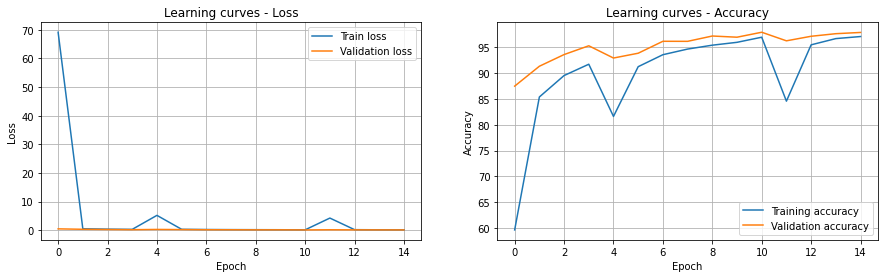

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(5x5)-16(3x3), stride1 = 2, stride2 = 2, 2 fc: 2048-10, act = Tanh, opt = RMSprop, lr = 0.003, reg = Dropout, loss = NLLLoss


Best val_loss: 0.10270 - train_loss: 0.12897 - val_acc: 97.68% - train_acc: 96.87% - execution_time: 58s


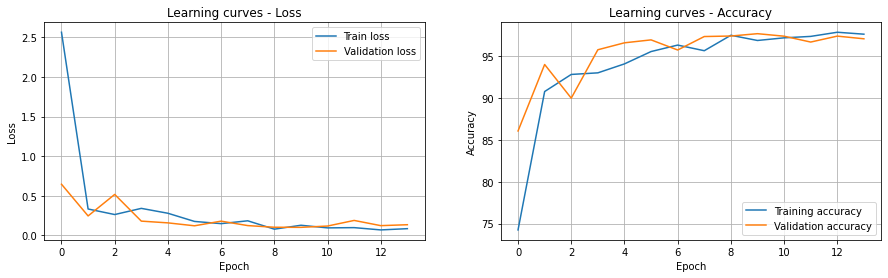

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(7x7)-64(5x5)-16, stride1 = 2, stride2 = 1, 3 fc: 512-1024-10, act = LeakyReLU, opt = Adam, lr = 0.001, reg = Dropout, loss = CrossEntropy


Best val_loss: 0.03287 - train_loss: 0.02873 - val_acc: 98.88% - train_acc: 99.10% - execution_time: 50s


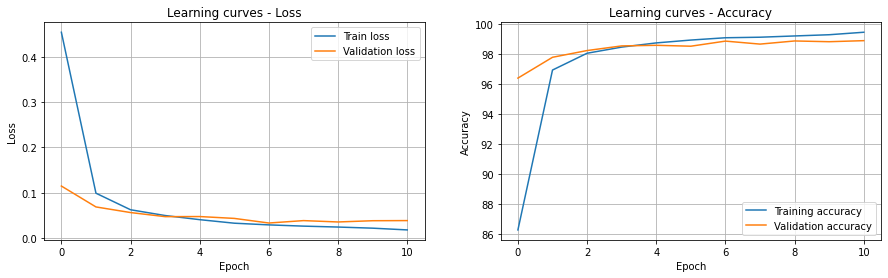

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(5x5)-16(5x5), stride1 = 2, stride2 = 2, 3 fc: 1024-64-10, act = Tanh, opt = RMSprop, lr = 0.001, reg = Dropout, loss = NLLLoss


Best val_loss: 0.07005 - train_loss: 0.04463 - val_acc: 98.07% - train_acc: 98.62% - execution_time: 58s


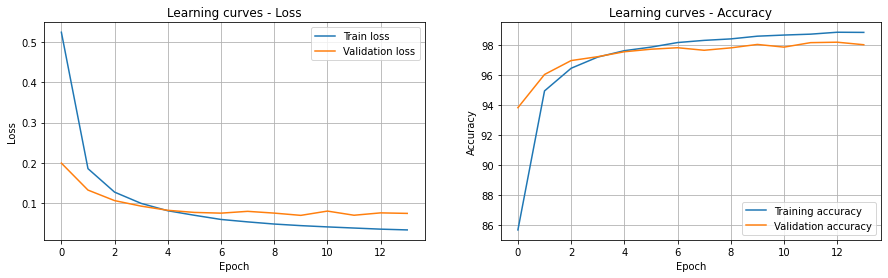

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 16(7x7)-128(7x7)-128-128-32, stride1 = 2, stride2 = 1, 3 fc: 64-128-10, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = Dropout, loss = CrossEntropy


Best val_loss: 0.05758 - train_loss: 0.06896 - val_acc: 98.25% - train_acc: 97.97% - execution_time: 80s


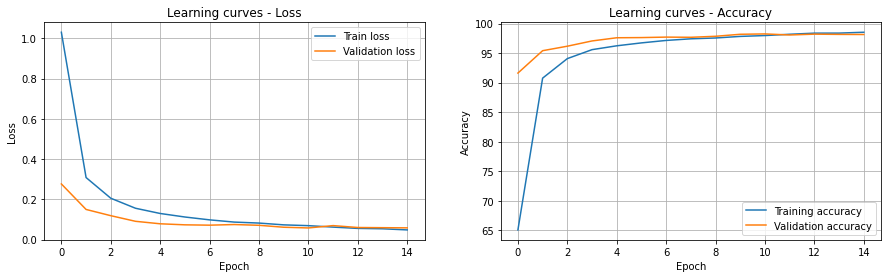

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 16(3x3)-128(7x7)-64-32-64, stride1 = 1, stride2 = 1, 2 fc: 256-10, act = Tanh, opt = Adam, lr = 0.0003, reg = False, loss = CrossEntropy


Best val_loss: 0.03885 - train_loss: 0.01353 - val_acc: 98.66% - train_acc: 99.69% - execution_time: 120s


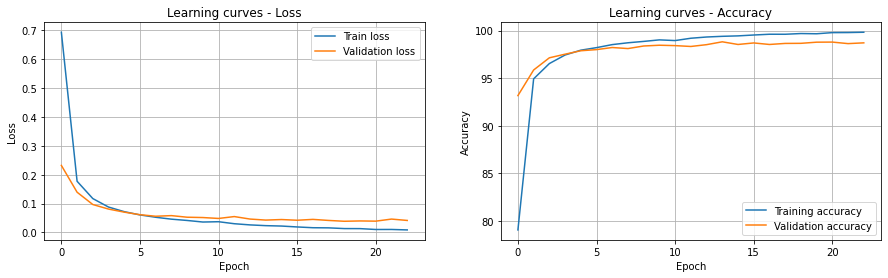

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 16(9x9)-128(3x3)-128-16-32, stride1 = 2, stride2 = 1, 2 fc: 1024-10, act = LeakyReLU, opt = RMSprop, lr = 0.003, reg = Dropout, loss = CrossEntropy


Best val_loss: 0.45994 - train_loss: 0.88921 - val_acc: 86.00% - train_acc: 74.74% - execution_time: 64s


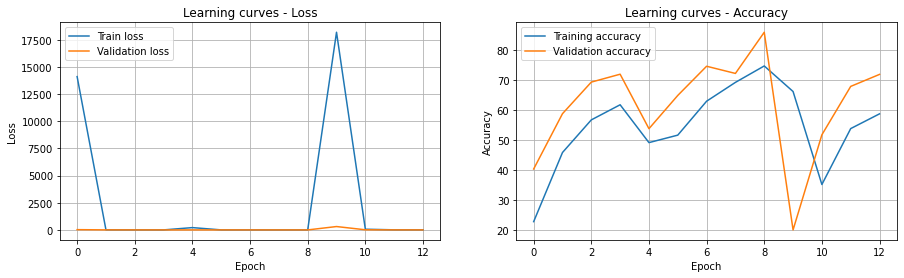

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(5x5)-128(5x5)-16-16, stride1 = 2, stride2 = 2, 3 fc: 256-256-10, act = Tanh, opt = RMSprop, lr = 0.001, reg = Dropout, loss = NLLLoss


Best val_loss: 0.08294 - train_loss: 0.08698 - val_acc: 97.62% - train_acc: 97.16% - execution_time: 92s


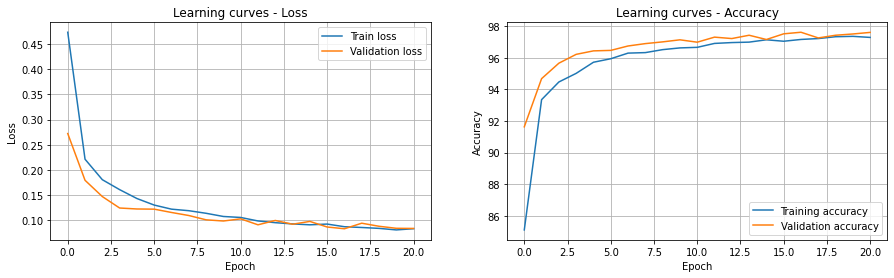

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(5x5)-32(9x9)-64, stride1 = 2, stride2 = 2, 2 fc: 2048-10, act = Tanh, opt = RMSprop, lr = 0.0001, reg = Dropout, loss = NLLLoss



Best val_loss: 0.06874 - train_loss: 0.01779 - val_acc: 98.07% - train_acc: 99.70% - execution_time: 138s


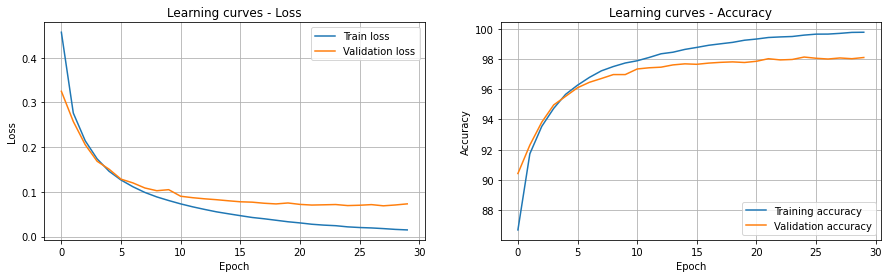

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(3x3)-16(3x3), stride1 = 2, stride2 = 2, 3 fc: 256-64-10, act = Tanh, opt = Adam, lr = 0.003, reg = Dropout, loss = NLLLoss


Best val_loss: 0.08628 - train_loss: 0.09823 - val_acc: 97.59% - train_acc: 96.93% - execution_time: 53s


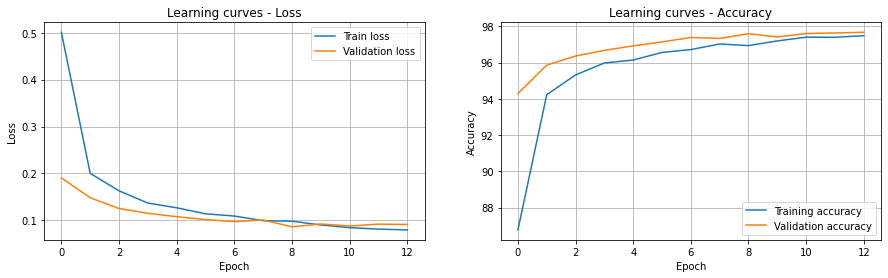

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 16(9x9)-128(3x3)-128-64-32, stride1 = 2, stride2 = 1, 2 fc: 2048-10, act = LeakyReLU, opt = RMSprop, lr = 0.003, reg = Dropout, loss = CrossEntropy


Best val_loss: 2.56575 - train_loss: 6.39104 - val_acc: 71.20% - train_acc: 55.89% - execution_time: 71s


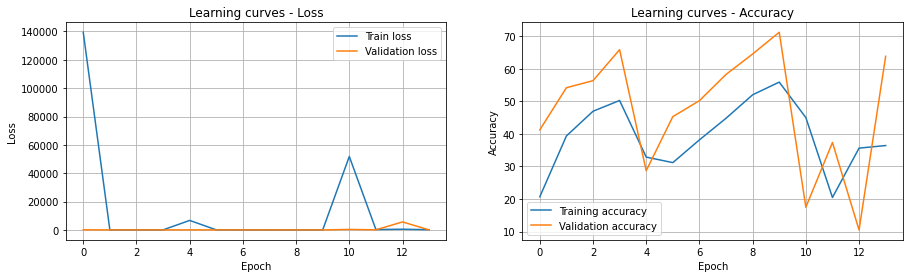

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(7x7)-16(3x3), stride1 = 1, stride2 = 1, 2 fc: 256-10, act = LeakyReLU, opt = Adam, lr = 0.003, reg = False, loss = CrossEntropy


Best val_loss: 0.03965 - train_loss: 0.02116 - val_acc: 98.80% - train_acc: 99.34% - execution_time: 43s


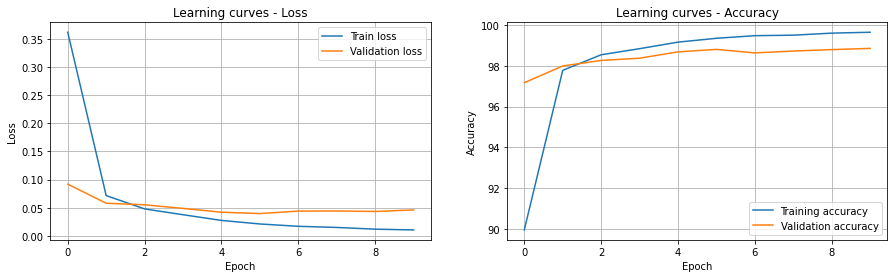

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(7x7)-128(5x5)-16-32, stride1 = 1, stride2 = 2, 3 fc: 512-128-10, act = LeakyReLU, opt = Adam, lr = 0.001, reg = False, loss = NLLLoss


Best val_loss: 0.05200 - train_loss: 0.02590 - val_acc: 98.49% - train_acc: 99.16% - execution_time: 60s


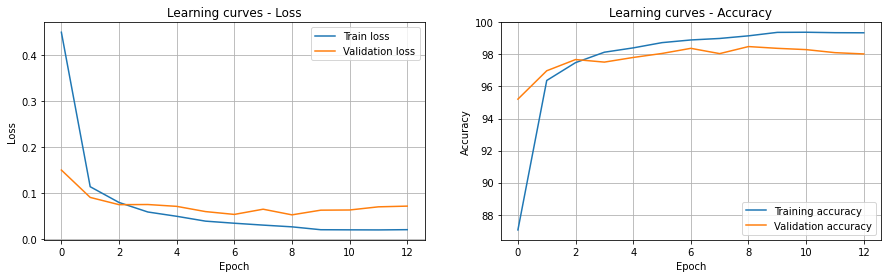

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 16(7x7)-128(5x5)-32-128-32, stride1 = 1, stride2 = 1, 2 fc: 64-10, act = LeakyReLU, opt = Adam, lr = 0.001, reg = False, loss = CrossEntropy


Best val_loss: 0.04214 - train_loss: 0.02602 - val_acc: 98.57% - train_acc: 99.16% - execution_time: 67s


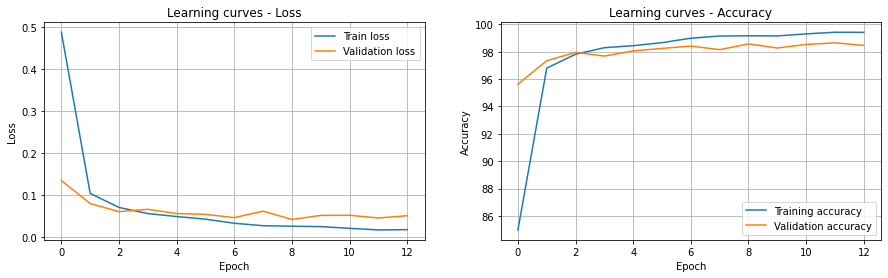

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(3x3)-16(5x5), stride1 = 1, stride2 = 2, 2 fc: 64-10, act = Tanh, opt = Adam, lr = 0.001, reg = False, loss = NLLLoss


KeyboardInterrupt: ignored

In [ ]:
# Define possible values for each hyper-parameter
conv_layers_v = [2, 3, 4, 5]
fc_layers_v = [2, 3]
Nconv_v = [16, 32, 64, 128]
kernel_v = [3, 5, 7, 9]
stride_v = [1, 2]
Nh_v = [64, 128, 256, 512, 1024, 2048]
act_v = ['Tanh', 'LeakyReLU']
act_dict = {'Tanh':nn.Tanh(), 'LeakyReLU':nn.LeakyReLU()}
opt_v = ['Adam', 'RMSprop']
lr_v = [0.01, 0.005, 0.001, 0.0001]
reg_v = ['False', 'Dropout']
loss_dict = {'CrossEntropy':nn.CrossEntropyLoss(), 'NLLLoss':torch.nn.NLLLoss()}
loss_v = ['CrossEntropy', 'NLLLoss']
results = []

# RANDOM SEARCH
random.seed(1)
torch.manual_seed(0)
pbar = tq.tqdm(total = 30, desc = 'Random search progress')
random_coarse_grid_conv = list(itertools.product(Nconv_v, Nconv_v, Nconv_v, Nconv_v, Nconv_v, kernel_v, kernel_v, stride_v, stride_v))
random_coarse_grid_fc = list(itertools.product(conv_layers_v, fc_layers_v, Nh_v, Nh_v, act_v, opt_v, lr_v, reg_v, loss_v))
random_coarse_grid = [x + y for x, y in zip(random_coarse_grid_conv, random_coarse_grid_fc)] 
for (Nconv1, Nconv2, Nconv3, Nconv4, Nconv5, k1, k2, stride1, stride2, 
     cl, fcl, Nh1, Nh2, act, opt, lr, reg, loss) in random.sample(random_coarse_grid, 30):
    # sampling combinations from itertools.product, we are sure no combination is repeated

    # CNN 5 conv: 16(9x9)-128(9x9)-32-64-3, stride1 = 1, stride2 = 1, 3 fc: 64-2048-10, act = Tanh, opt = Adam, lr = 0.0001, reg = False
    # (Nconv1, Nconv2, Nconv3, Nconv4, Nconv5, k1, k2, stride1, stride2, cl, fcl, Nh1, Nh2, act, opt, lr, reg) = (16, 128, 32, 64, 3)
    print(f'CNN {cl} conv:' 
          f' {Nconv1}({k1}x{k1}){-Nconv2}({k2}x{k2}){-Nconv3 if cl >= 3 else ""}{-Nconv4 if cl >= 4 else ""}{-Nconv5 if cl >= 5 else ""},'
          f' stride1 = {stride1}, stride2 = {stride2},'
          f' {fcl} fc: {Nh1}{-Nh2 if fcl == 3 else ""}{-10}, act = {act}, opt = {opt}, lr = {lr}, reg = {reg}, loss = {loss}')
    
    start_time = time.time()
    # NETWORK INITIALIZATION
    torch.manual_seed(0)
    activation = act_dict[act]
    net = CNNmod(784, 10, cl, fcl, Nconv1, Nconv2, Nconv3, Nconv4, Nconv5, k1, k2, stride1, stride2, Nh1, Nh2, activation, reg, loss)
    net.to(device)

    # Define the loss function
    loss_function = loss_dict[loss]

    # Define the optimizer
    if reg == 'L2':
        opt_dict = {'Adam': optim.Adam(net.parameters(), lr =lr, weight_decay = wd),
                    'RMSprop': optim.RMSprop(net.parameters(), lr = lr, weight_decay = wd)}
        optimizer = opt_dict[opt]
    else:
        opt_dict = {'Adam': optim.Adam(net.parameters(), lr = lr), 
                    'RMSprop': optim.RMSprop(net.parameters(), lr = lr)}
        optimizer = opt_dict[opt]

    # TRAINING LOOP
    num_epochs = 30
    patience = 4
    train_dataloader, val_dataloader = myDataLoader(train_dataset, val_dataset, 500, val_batch_size=10000)
    train_loss_log, val_loss_log, best_t_loss, best_v_loss, train_accuracy_log, val_accuracy_log, best_t_acc, best_v_acc, net = training_loop(net, 
                            train_dataloader, val_dataloader, loss_function, optimizer, num_epochs, no_improve_epoch=0, patience=patience)
    
    results.append((np.round(best_v_acc, 2), f'{cl} conv:' 
          f' {Nconv1}({k1}x{k1}){-Nconv2}({k2}x{k2}){-Nconv3 if cl >= 3 else ""}{-Nconv4 if cl >= 4 else ""}{-Nconv5 if cl >= 5 else ""},'
          f' stride1 = {stride1}, stride2 = {stride2},'
          f' {fcl} fc: {Nh1}{-Nh2 if fcl == 3 else ""}{-10}, act = {act}, opt = {opt}, lr = {lr}, reg = {reg}, loss = {loss}'))
    run_time = time.time() - start_time
    print(f'Best val_loss: {best_v_loss:.5f} - train_loss: {best_t_loss:.5f} - val_acc: {best_v_acc:.2f}% - train_acc: {best_t_acc:.2f}% - execution_time: {run_time:.0f}s') 
    
    plot_losses(train_loss_log, val_loss_log, train_accuracy_log, val_accuracy_log)
    print('--------------------------------------------------------------------------------------------------------------------')
    pbar.update(1)

print('RESULTS')
for r in sorted(results, key=lambda tup: tup[0], reverse = True):
    print(f'Val_acc = {r[0]:.2f} -> {r[1]}')

Fifth search

CNN 3 conv: 16(5x5)-16(5x5)-128, stride1 = 1, 3 fc: 64-64-10, act = LeakyReLU, opt = Adam, lr = 0.0001, reg = Batch norm, loss = CrossEntropy



Best val_loss: 0.03086 - train_loss: 0.00663 - val_acc: 99.19% - train_acc: 100.00% - execution_time: 187s


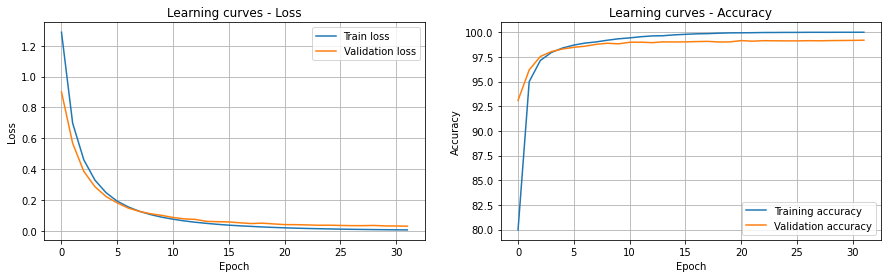

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 128(5x5)-128(5x5)-64, stride1 = 1, 2 fc: 1024-10, act = ELU, opt = RMSprop, lr = 0.0001, reg = False, loss = NLLLoss


Best val_loss: 0.03224 - train_loss: 0.00923 - val_acc: 99.04% - train_acc: 99.74% - execution_time: 195s


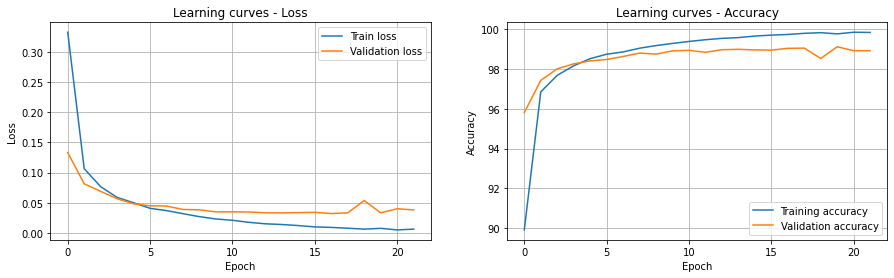

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(5x5)-16(5x5)-32-32, stride1 = 2, 2 fc: 512-10, act = LeakyReLU, opt = Adadelta, lr = 0.01, reg = Dropout, loss = CrossEntropy



Best val_loss: 0.25372 - train_loss: 0.29049 - val_acc: 92.39% - train_acc: 91.20% - execution_time: 165s


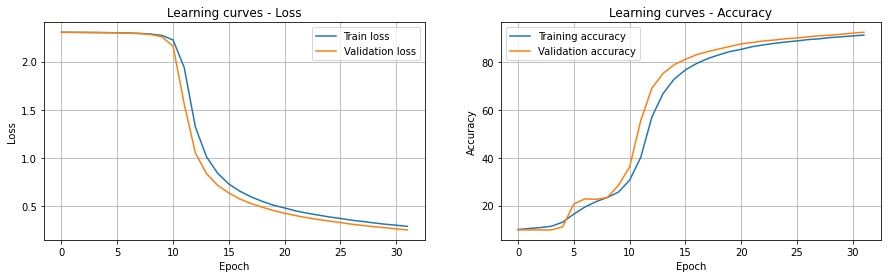

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 32(5x5)-32(5x5)-64-64, stride1 = 1, 3 fc: 512-512-10, act = LeakyReLU, opt = Adam, lr = 0.01, reg = False, loss = CrossEntropy


Best val_loss: 0.04813 - train_loss: 0.04318 - val_acc: 98.51% - train_acc: 98.73% - execution_time: 88s


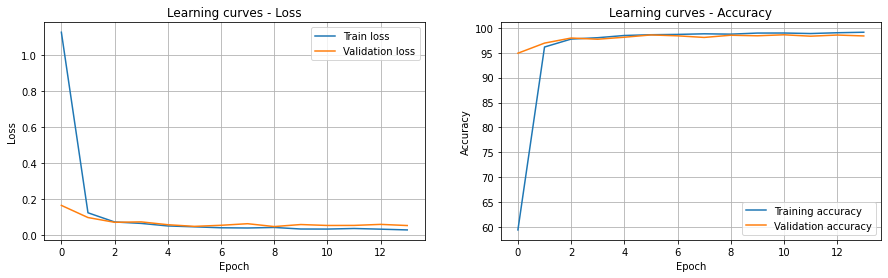

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 16(7x7)-16(7x7)-64-64-64, stride1 = 2, 3 fc: 64-64-10, act = LeakyReLU, opt = Adagrad, lr = 0.0001, reg = Dropout, loss = NLLLoss



Best val_loss: 1.21726 - train_loss: 1.38798 - val_acc: 61.61% - train_acc: 51.82% - execution_time: 199s


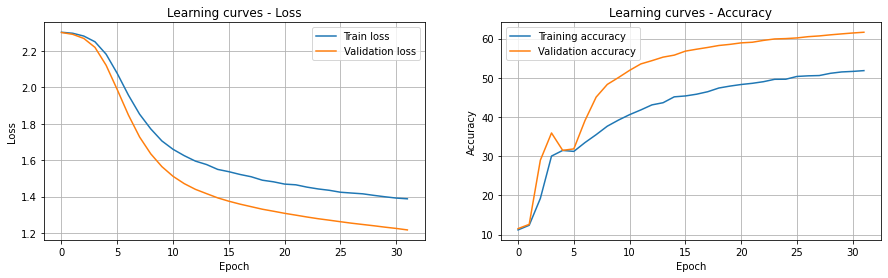

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 128(5x5)-128(5x5), stride1 = 2, 3 fc: 128-128-10, act = LeakyReLU, opt = Adagrad, lr = 0.0001, reg = False, loss = CrossEntropy



Best val_loss: 0.31713 - train_loss: 0.32054 - val_acc: 91.25% - train_acc: 91.11% - execution_time: 224s


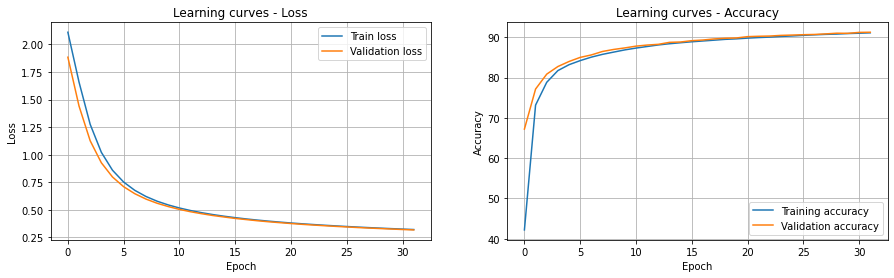

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 64(5x5)-64(5x5), stride1 = 1, 3 fc: 512-512-10, act = Tanh, opt = RMSprop, lr = 0.1, reg = Dropout, loss = NLLLoss


Best val_loss: 39.59334 - train_loss: 45.77645 - val_acc: 9.83% - train_acc: 10.01% - execution_time: 45s


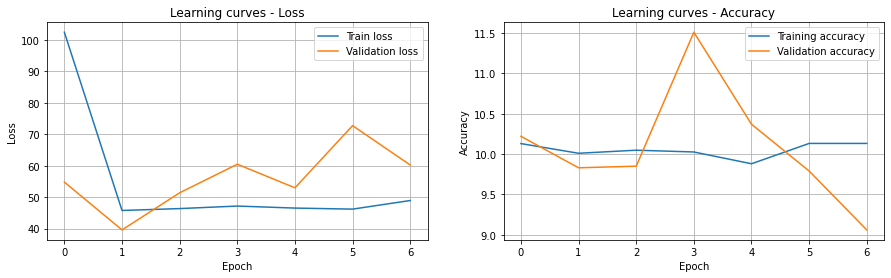

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 64(7x7)-64(7x7)-128-128, stride1 = 2, 3 fc: 64-64-10, act = ELU, opt = RMSprop, lr = 0.01, reg = Batch norm, loss = CrossEntropy


Best val_loss: 0.02892 - train_loss: 0.01431 - val_acc: 99.18% - train_acc: 99.50% - execution_time: 140s


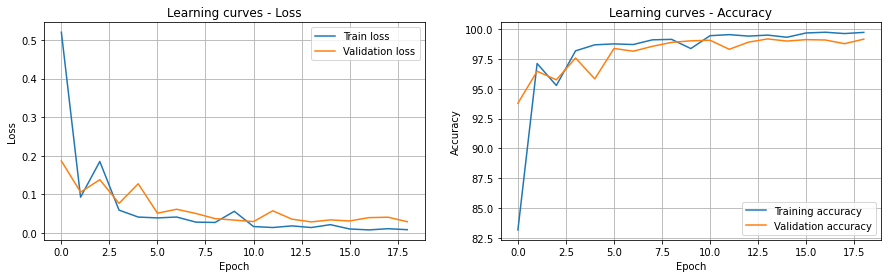

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 64(5x5)-64(5x5)-32-32, stride1 = 2, 2 fc: 1024-10, act = Tanh, opt = Adagrad, lr = 0.01, reg = False, loss = CrossEntropy



Best val_loss: 0.03281 - train_loss: 0.01338 - val_acc: 99.05% - train_acc: 99.72% - execution_time: 203s


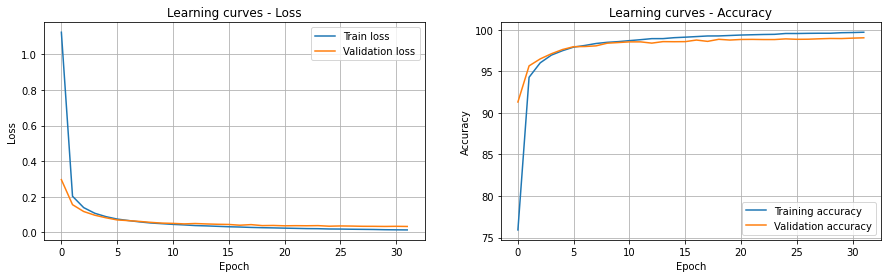

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 32(3x3)-32(3x3)-32-32-32, stride1 = 2, 2 fc: 1024-10, act = ELU, opt = Adadelta, lr = 0.1, reg = Dropout, loss = NLLLoss


Best val_loss: 0.05541 - train_loss: 0.03860 - val_acc: 98.36% - train_acc: 98.72% - execution_time: 171s


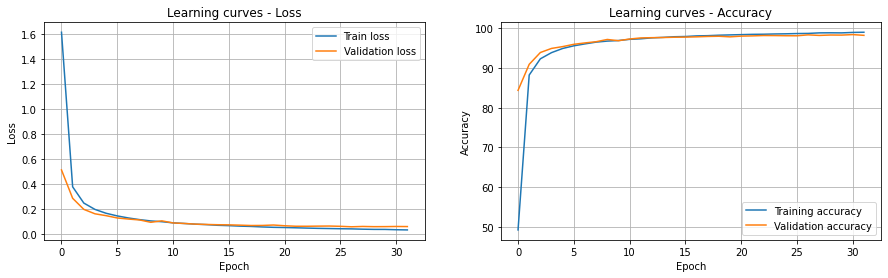

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(5x5)-16(5x5), stride1 = 1, 3 fc: 2048-2048-10, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = False, loss = NLLLoss


Best val_loss: 0.03111 - train_loss: 0.01245 - val_acc: 99.03% - train_acc: 99.65% - execution_time: 100s


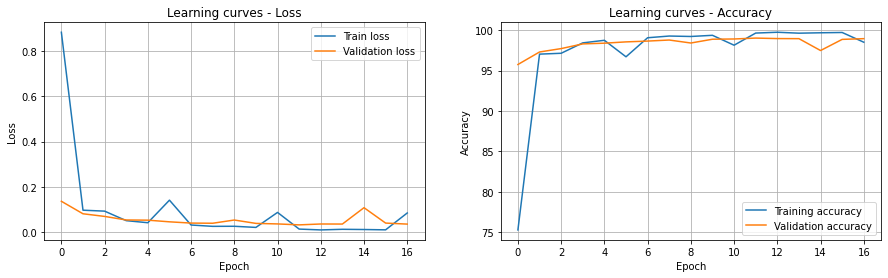

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 128(5x5)-128(5x5), stride1 = 1, 2 fc: 64-10, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = False, loss = NLLLoss


Best val_loss: 0.02479 - train_loss: 0.01471 - val_acc: 99.18% - train_acc: 99.64% - execution_time: 192s


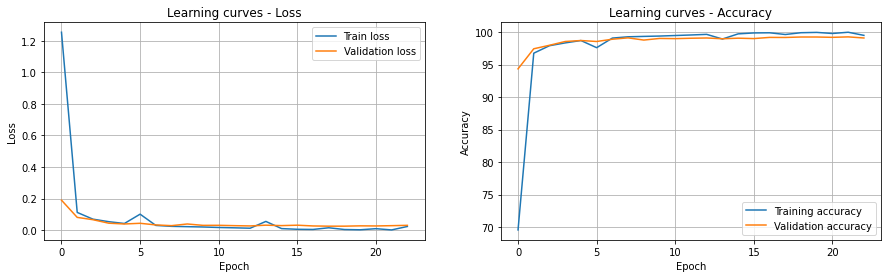

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(7x7)-16(7x7)-16, stride1 = 1, 2 fc: 256-10, act = LeakyReLU, opt = RMSprop, lr = 0.1, reg = False, loss = CrossEntropy


Best val_loss: 81.26784 - train_loss: 121.88763 - val_acc: 34.31% - train_acc: 27.18% - execution_time: 103s


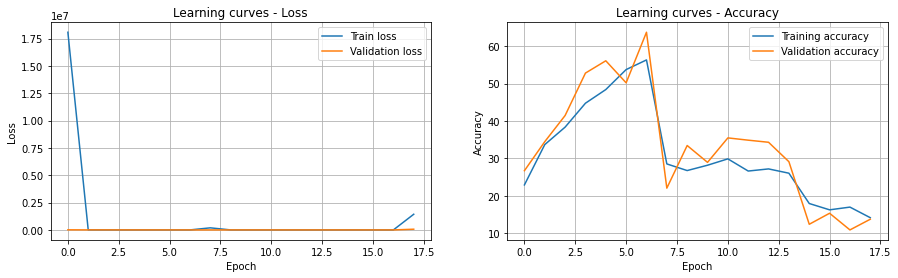

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 64(7x7)-64(7x7), stride1 = 2, 3 fc: 64-64-10, act = LeakyReLU, opt = Adadelta, lr = 0.1, reg = False, loss = CrossEntropy



Best val_loss: 0.04076 - train_loss: 0.02706 - val_acc: 98.63% - train_acc: 99.19% - execution_time: 204s


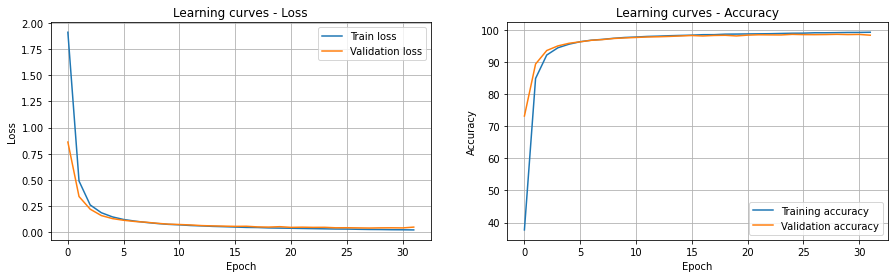

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 64(7x7)-64(7x7)-64-64, stride1 = 2, 3 fc: 128-128-10, act = Tanh, opt = Adagrad, lr = 0.0001, reg = False, loss = CrossEntropy



Best val_loss: 0.75781 - train_loss: 0.76493 - val_acc: 84.59% - train_acc: 84.51% - execution_time: 213s


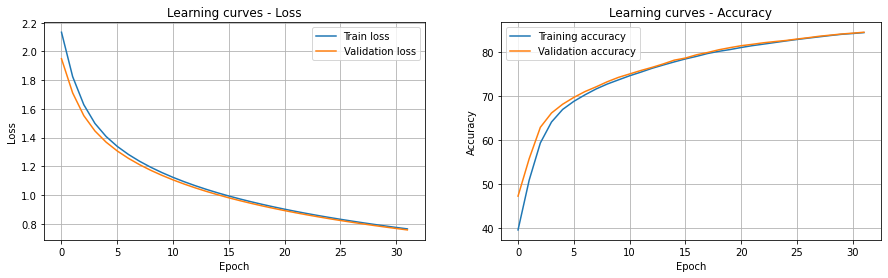

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 128(5x5)-128(5x5), stride1 = 1, 3 fc: 128-128-10, act = Tanh, opt = Adadelta, lr = 0.001, reg = Batch norm, loss = NLLLoss



Best val_loss: 0.21995 - train_loss: 0.21586 - val_acc: 97.05% - train_acc: 97.25% - execution_time: 271s


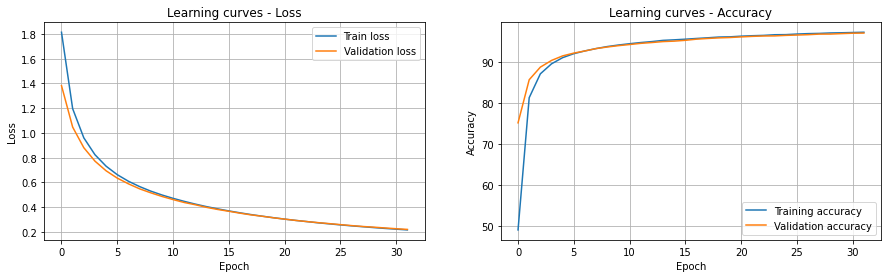

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(3x3)-16(3x3)-16, stride1 = 1, 2 fc: 512-10, act = LeakyReLU, opt = Adam, lr = 0.1, reg = False, loss = CrossEntropy



Best val_loss: 0.12205 - train_loss: 0.11507 - val_acc: 96.29% - train_acc: 96.48% - execution_time: 160s


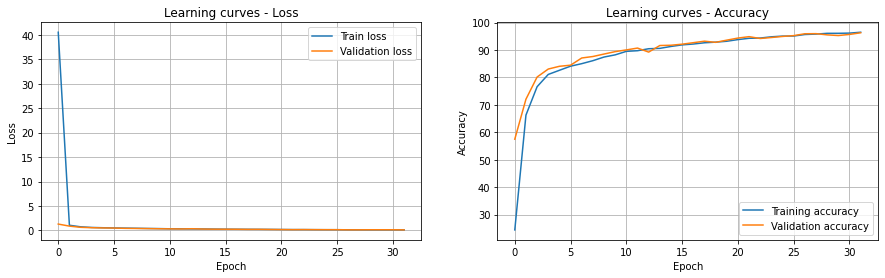

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 64(3x3)-64(3x3)-128-128, stride1 = 2, 2 fc: 512-10, act = Tanh, opt = Adadelta, lr = 0.001, reg = False, loss = CrossEntropy



Best val_loss: 1.26078 - train_loss: 1.29956 - val_acc: 71.70% - train_acc: 70.68% - execution_time: 205s


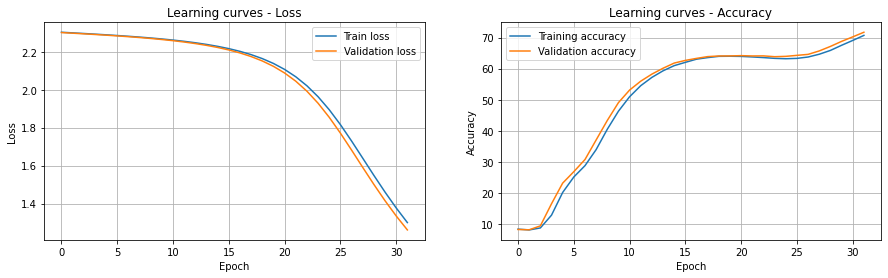

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 32(7x7)-32(7x7)-64, stride1 = 1, 3 fc: 128-128-10, act = LeakyReLU, opt = Adam, lr = 0.01, reg = False, loss = NLLLoss


Best val_loss: 0.03671 - train_loss: 0.03026 - val_acc: 98.84% - train_acc: 99.13% - execution_time: 65s


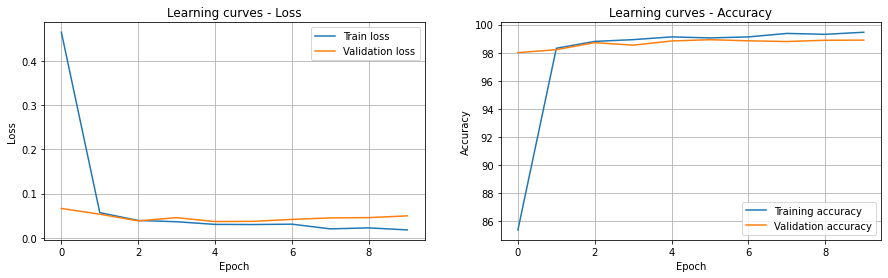

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 32(7x7)-32(7x7)-32-32, stride1 = 1, 3 fc: 512-512-10, act = ELU, opt = RMSprop, lr = 0.001, reg = False, loss = NLLLoss


Best val_loss: 0.04198 - train_loss: 0.05018 - val_acc: 98.63% - train_acc: 98.40% - execution_time: 96s


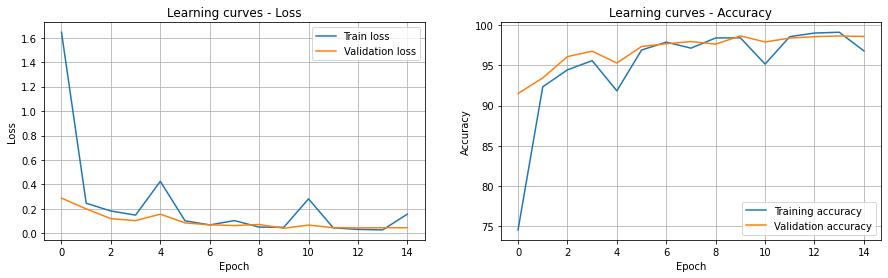

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 128(7x7)-128(7x7)-64-64, stride1 = 2, 3 fc: 256-256-10, act = LeakyReLU, opt = Adagrad, lr = 0.0001, reg = False, loss = CrossEntropy



Best val_loss: 0.30072 - train_loss: 0.30538 - val_acc: 91.08% - train_acc: 90.86% - execution_time: 370s


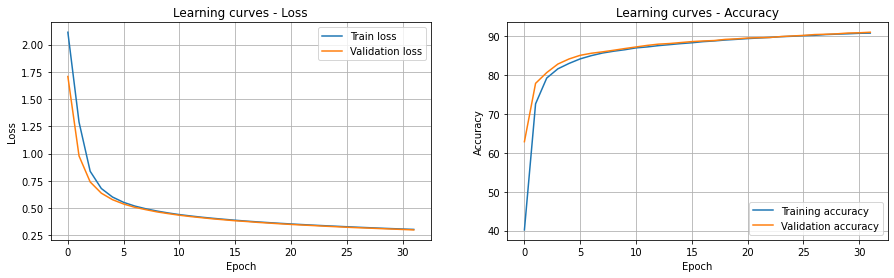

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(5x5)-16(5x5)-64-64, stride1 = 2, 2 fc: 64-10, act = LeakyReLU, opt = Adam, lr = 0.001, reg = Batch norm, loss = NLLLoss


Best val_loss: 0.02222 - train_loss: 0.00038 - val_acc: 99.28% - train_acc: 100.00% - execution_time: 135s


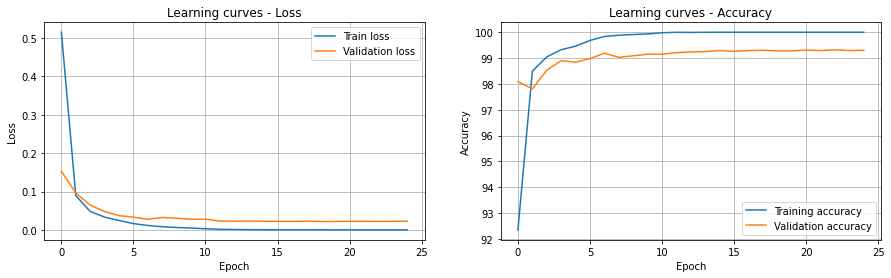

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 64(3x3)-64(3x3), stride1 = 1, 3 fc: 128-128-10, act = LeakyReLU, opt = RMSprop, lr = 0.01, reg = Batch norm, loss = CrossEntropy


Best val_loss: 0.03112 - train_loss: 0.01713 - val_acc: 99.02% - train_acc: 99.45% - execution_time: 83s


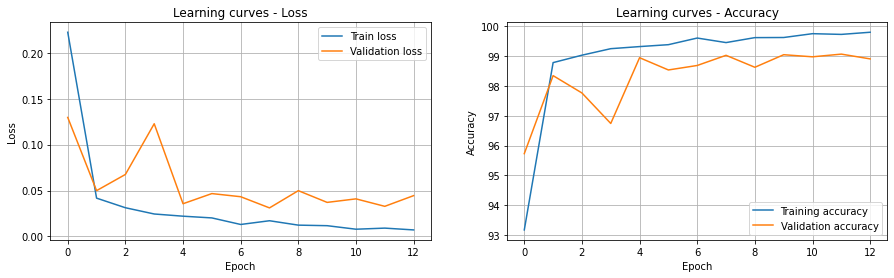

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(7x7)-16(7x7)-16-16, stride1 = 1, 3 fc: 64-64-10, act = ELU, opt = Adam, lr = 0.0001, reg = Batch norm, loss = NLLLoss



Best val_loss: 0.05036 - train_loss: 0.03074 - val_acc: 98.59% - train_acc: 99.44% - execution_time: 190s


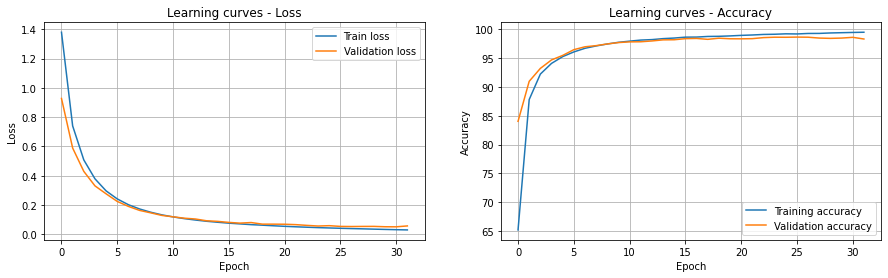

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(5x5)-16(5x5)-16, stride1 = 2, 3 fc: 64-64-10, act = LeakyReLU, opt = Adadelta, lr = 0.001, reg = False, loss = CrossEntropy



Best val_loss: 2.30218 - train_loss: 2.30261 - val_acc: 10.22% - train_acc: 9.80% - execution_time: 156s


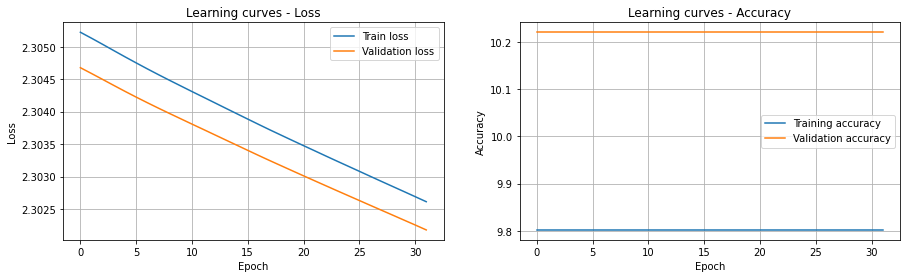

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 16(5x5)-16(5x5)-16-16-16, stride1 = 2, 2 fc: 2048-10, act = Tanh, opt = Adagrad, lr = 0.01, reg = Batch norm, loss = NLLLoss



Best val_loss: 0.05463 - train_loss: 0.02065 - val_acc: 98.32% - train_acc: 99.48% - execution_time: 164s


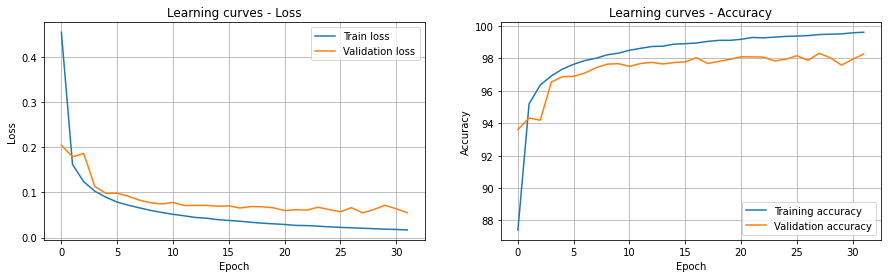

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 128(7x7)-128(7x7), stride1 = 1, 3 fc: 64-64-10, act = LeakyReLU, opt = RMSprop, lr = 0.01, reg = Dropout, loss = CrossEntropy


Best val_loss: 0.08363 - train_loss: 0.18657 - val_acc: 97.78% - train_acc: 94.88% - execution_time: 182s


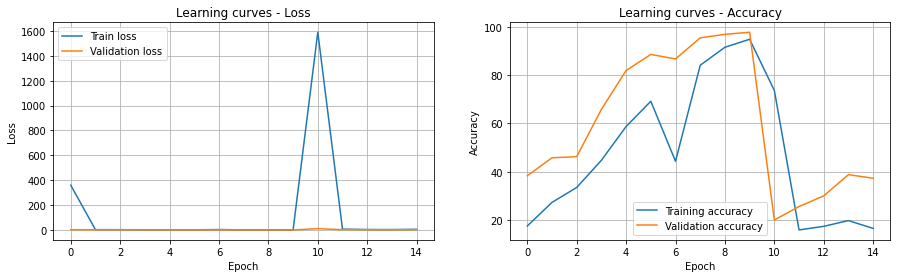

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(3x3)-16(3x3)-16, stride1 = 2, 3 fc: 128-128-10, act = Tanh, opt = Adam, lr = 0.01, reg = Dropout, loss = CrossEntropy


Best val_loss: 0.06095 - train_loss: 0.05607 - val_acc: 98.23% - train_acc: 98.32% - execution_time: 62s


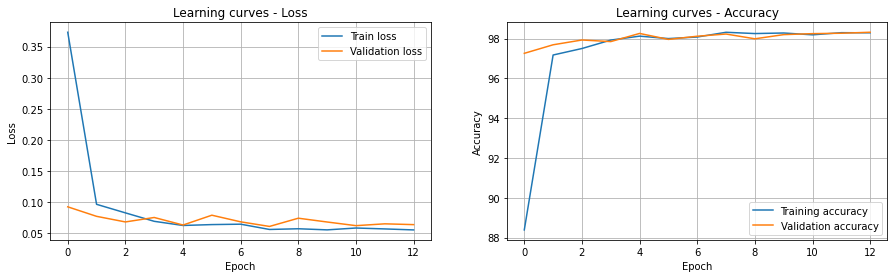

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 64(5x5)-64(5x5)-32-32-32, stride1 = 2, 2 fc: 512-10, act = ELU, opt = Adadelta, lr = 0.1, reg = Dropout, loss = NLLLoss



Best val_loss: 0.05359 - train_loss: 0.03446 - val_acc: 98.36% - train_acc: 98.93% - execution_time: 203s


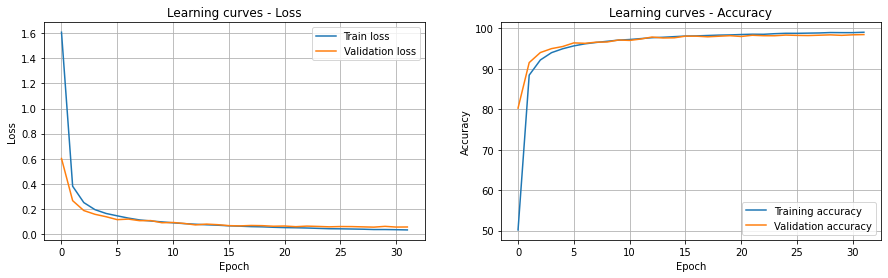

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 32(5x5)-32(5x5)-32-32-32, stride1 = 1, 2 fc: 2048-10, act = Tanh, opt = Adadelta, lr = 0.001, reg = Batch norm, loss = NLLLoss



Best val_loss: 0.23525 - train_loss: 0.23645 - val_acc: 93.82% - train_acc: 93.85% - execution_time: 203s


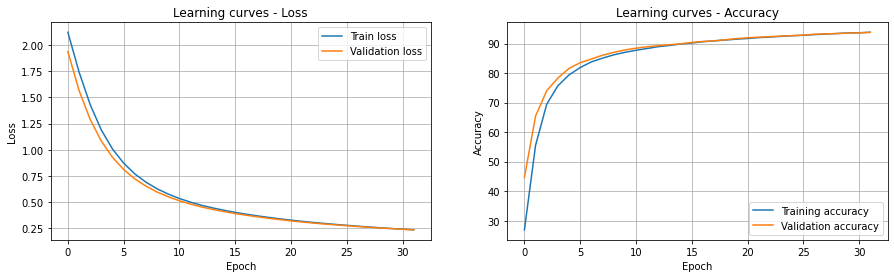

--------------------------------------------------------------------------------------------------------------------
RESULTS
Val_acc = 99.28 -> 4 conv: 16(5x5)-16(5x5)-64-64, stride1 = 2, 2 fc: 64-10, act = LeakyReLU, opt = Adam, lr = 0.001, reg = Batch norm, loss = NLLLoss
Val_acc = 99.19 -> 3 conv: 16(5x5)-16(5x5)-128, stride1 = 1, 3 fc: 64-64-10, act = LeakyReLU, opt = Adam, lr = 0.0001, reg = Batch norm, loss = CrossEntropy
Val_acc = 99.18 -> 4 conv: 64(7x7)-64(7x7)-128-128, stride1 = 2, 3 fc: 64-64-10, act = ELU, opt = RMSprop, lr = 0.01, reg = Batch norm, loss = CrossEntropy
Val_acc = 99.18 -> 2 conv: 128(5x5)-128(5x5), stride1 = 1, 2 fc: 64-10, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = False, loss = NLLLoss
Val_acc = 99.05 -> 4 conv: 64(5x5)-64(5x5)-32-32, stride1 = 2, 2 fc: 1024-10, act = Tanh, opt = Adagrad, lr = 0.01, reg = False, loss = CrossEntropy
Val_acc = 99.04 -> 3 conv: 128(5x5)-128(5x5)-64, stride1 = 1, 2 fc: 1024-10, act = ELU, opt = RMSprop, lr = 0.0001, reg

In [ ]:
# Hyper-parameters
conv_layers_v = [2, 3, 4, 5]
fc_layers_v = [2, 3]
Nconv_v = [16, 32, 64, 128]
kernel_v = [3, 5, 7]
stride_v = [1, 2]
Nh_v = [64, 128, 256, 512, 1024, 2048]
act_v = ['Tanh', 'LeakyReLU', 'ELU']
act_dict = {'Tanh':nn.Tanh(), 'LeakyReLU':nn.LeakyReLU(), 'ELU':nn.ELU()}
opt_v = ['Adam', 'RMSprop', 'Adadelta', 'Adagrad']
lr_v = [0.1, 0.01, 0.001, 0.0001]
reg_v = ['False', 'Dropout', 'Batch norm']
loss_dict = {'CrossEntropy':nn.CrossEntropyLoss(), 'NLLLoss':torch.nn.NLLLoss()}
loss_v = ['CrossEntropy', 'NLLLoss']
results = []

# RANDOM SEARCH
random.seed(1)
torch.manual_seed(0)
pbar = tq.tqdm(total = 30, desc = 'Random search progress')
random_coarse_grid = list(itertools.product(Nconv_v, Nconv_v, kernel_v, stride_v, conv_layers_v, fc_layers_v, Nh_v, act_v, opt_v, lr_v, reg_v, loss_v))
for (Nconv1, Nconv3, k1, stride1, cl, fcl, Nh1, act, opt, lr, reg, loss) in random.sample(random_coarse_grid, 30):
    Nconv2 = Nconv1; Nconv4 = Nconv3; Nconv5 = Nconv3; k2 = k1; Nh2 = Nh1; 
    print(f'CNN {cl} conv:' 
          f' {Nconv1}({k1}x{k1}){-Nconv2}({k2}x{k2}){-Nconv3 if cl >= 3 else ""}{-Nconv4 if cl >= 4 else ""}{-Nconv5 if cl >= 5 else ""},'
          f' stride1 = {stride1},'
          f' {fcl} fc: {Nh1}{-Nh2 if fcl == 3 else ""}{-10}, act = {act}, opt = {opt}, lr = {lr}, reg = {reg}, loss = {loss}')
    

    start_time = time.time()
    # NETWORK INITIALIZATION
    torch.manual_seed(0)
    activation = act_dict[act]
    net = CNN2(cl, fcl, Nconv1, Nconv2, Nconv3, Nconv4, Nconv5, k1, k2, stride1, 1, Nh1, Nh2, No, activation, reg, loss) 
    net.to(device)

    # Define the loss function
    loss_function = loss_dict[loss]

    # Define the optimizer
    opt_dict = {'Adam': optim.Adam(net.parameters(), lr = lr), 
                    'RMSprop': optim.RMSprop(net.parameters(), lr = lr),
                    'Adagrad': optim.Adagrad(net.parameters(), lr = lr),
                    'Adadelta': optim.Adadelta(net.parameters(), lr = lr)}
    optimizer = opt_dict[opt]

    # TRAINING LOOP
    num_epochs = 32
    patience = 5
    train_dataloader, val_dataloader = myDataLoader(train_dataset, val_dataset, 500, val_batch_size=500)
    train_loss_log, val_loss_log, best_t_loss, best_v_loss, train_accuracy_log, val_accuracy_log, best_t_acc, best_v_acc, net = training_loop(net, 
                            train_dataloader, val_dataloader, loss_function, optimizer, num_epochs, no_improve_epoch=0, patience=patience)
    
    results.append((np.round(best_v_acc, 2), f'{cl} conv:' 
          f' {Nconv1}({k1}x{k1}){-Nconv2}({k2}x{k2}){-Nconv3 if cl >= 3 else ""}{-Nconv4 if cl >= 4 else ""}{-Nconv5 if cl >= 5 else ""},'
          f' stride1 = {stride1},'
          f' {fcl} fc: {Nh1}{-Nh2 if fcl == 3 else ""}{-10}, act = {act}, opt = {opt}, lr = {lr}, reg = {reg}, loss = {loss}'))
    run_time = time.time() - start_time
    print(f'Best val_loss: {best_v_loss:.5f} - train_loss: {best_t_loss:.5f} - val_acc: {best_v_acc:.2f}% - train_acc: {best_t_acc:.2f}% - execution_time: {run_time:.0f}s') 
    
    plot_losses(train_loss_log, val_loss_log, train_accuracy_log, val_accuracy_log)
    print('--------------------------------------------------------------------------------------------------------------------')
    pbar.update(1)

print('RESULTS')
for r in sorted(results, key=lambda tup: tup[0], reverse = True):
    print(f'Val_acc = {r[0]:.2f} -> {r[1]}')

Sixth search

CNN 4 conv: 16(5x5)-32(3x3)-32-16, stride1 = 1, 2 fc: 256-10, act = LeakyReLU, opt = Adam, lr = 0.0001, reg = False, loss = CrossEntropy



Best val_loss: 0.05569 - train_loss: 0.04409 - val_acc: 98.33% - train_acc: 98.68% - execution_time: 254s


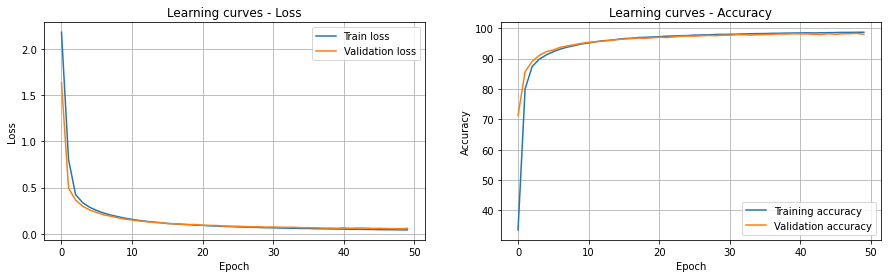

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 32(5x5)-32(3x3), stride1 = 1, 3 fc: 1024-512-10, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = Batch norm, loss = CrossEntropy


Best val_loss: 0.02586 - train_loss: 0.00308 - val_acc: 99.27% - train_acc: 99.88% - execution_time: 121s


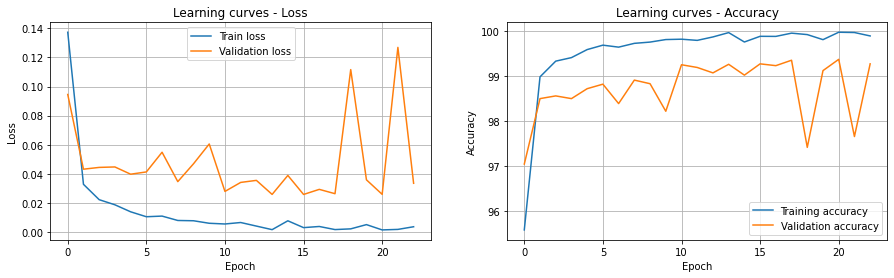

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(5x5)-16(7x7), stride1 = 1, 2 fc: 128-10, act = LeakyReLU, opt = Adam, lr = 0.001, reg = False, loss = CrossEntropy


Best val_loss: 0.03196 - train_loss: 0.01216 - val_acc: 98.96% - train_acc: 99.63% - execution_time: 133s


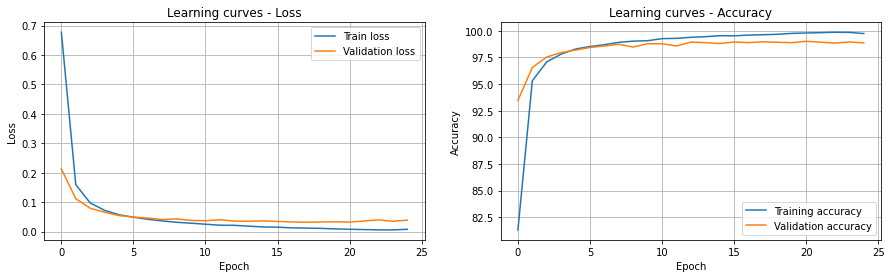

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(7x7)-64(3x3)-32, stride1 = 1, 2 fc: 1024-10, act = ELU, opt = Adam, lr = 0.0003, reg = False, loss = NLLLoss


Best val_loss: 0.03557 - train_loss: 0.01377 - val_acc: 98.96% - train_acc: 99.58% - execution_time: 142s


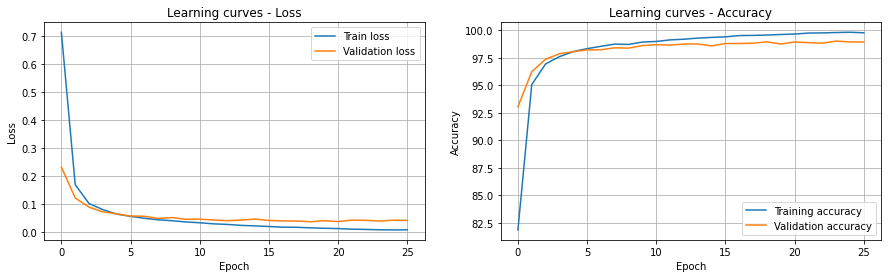

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(7x7)-32(5x5)-16-32, stride1 = 2, 2 fc: 256-10, act = Tanh, opt = Adam, lr = 0.001, reg = False, loss = NLLLoss


Best val_loss: 0.03770 - train_loss: 0.01624 - val_acc: 98.76% - train_acc: 99.57% - execution_time: 95s


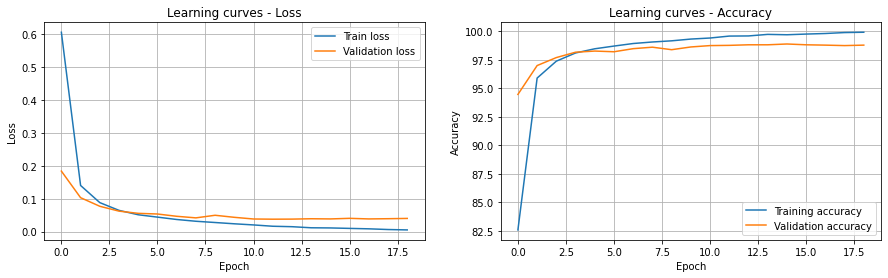

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 32(3x3)-16(5x5)-64-128, stride1 = 1, 3 fc: 512-256-10, act = Tanh, opt = RMSprop, lr = 0.0003, reg = Batch norm, loss = CrossEntropy


Best val_loss: 0.02826 - train_loss: 0.00029 - val_acc: 99.11% - train_acc: 100.00% - execution_time: 184s


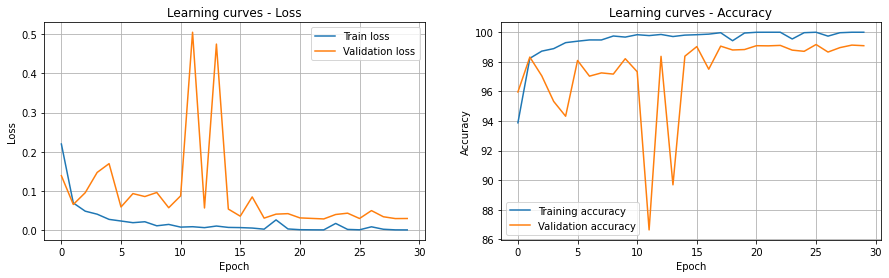

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 32(3x3)-16(5x5)-32, stride1 = 2, 3 fc: 256-512-10, act = LeakyReLU, opt = Adam, lr = 0.003, reg = Batch norm, loss = CrossEntropy


Best val_loss: 0.03732 - train_loss: 0.00427 - val_acc: 99.02% - train_acc: 99.86% - execution_time: 115s


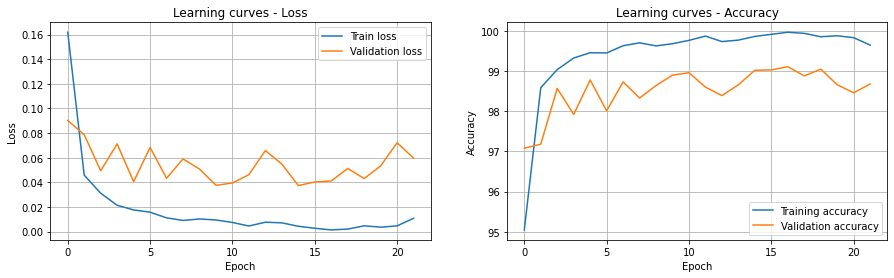

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 32(5x5)-16(7x7)-32, stride1 = 2, 3 fc: 512-64-10, act = Tanh, opt = RMSprop, lr = 0.0001, reg = False, loss = CrossEntropy



Best val_loss: 0.03296 - train_loss: 0.00917 - val_acc: 98.96% - train_acc: 99.82% - execution_time: 297s


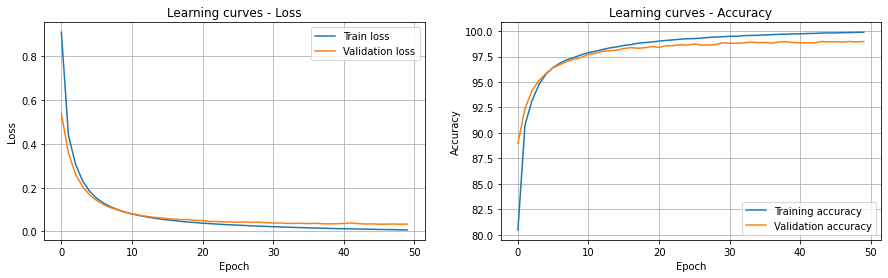

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(5x5)-128(7x7)-64, stride1 = 1, 3 fc: 128-256-10, act = LeakyReLU, opt = Adam, lr = 0.001, reg = False, loss = NLLLoss


Best val_loss: 0.02812 - train_loss: 0.02331 - val_acc: 99.15% - train_acc: 99.27% - execution_time: 92s


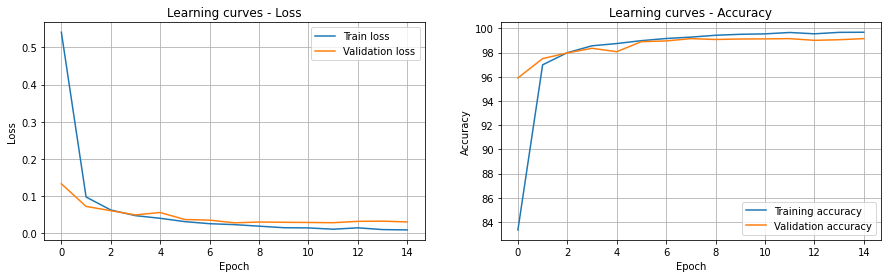

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(7x7)-32(5x5), stride1 = 2, 2 fc: 512-10, act = ELU, opt = RMSprop, lr = 0.001, reg = Batch norm, loss = NLLLoss


Best val_loss: 0.04645 - train_loss: 0.00090 - val_acc: 98.87% - train_acc: 99.98% - execution_time: 146s


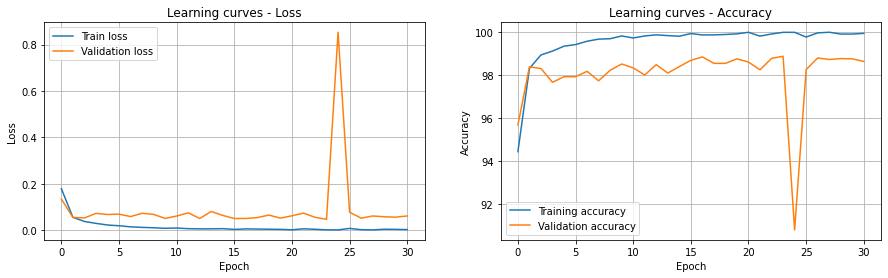

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(3x3)-16(7x7), stride1 = 1, 2 fc: 128-10, act = Tanh, opt = Adam, lr = 0.003, reg = False, loss = CrossEntropy


Best val_loss: 0.03555 - train_loss: 0.00312 - val_acc: 98.92% - train_acc: 99.96% - execution_time: 108s


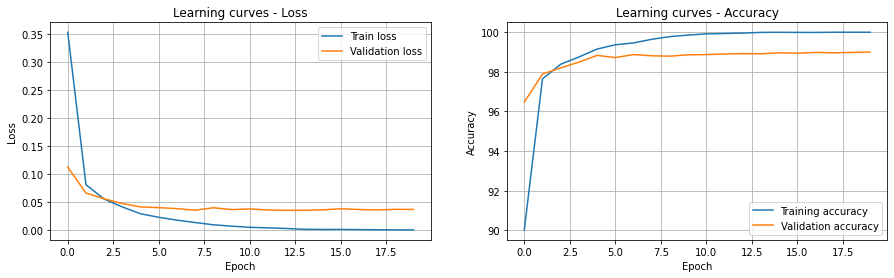

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 32(3x3)-16(3x3), stride1 = 1, 3 fc: 512-128-10, act = LeakyReLU, opt = RMSprop, lr = 0.0001, reg = False, loss = CrossEntropy



Best val_loss: 0.03914 - train_loss: 0.02412 - val_acc: 98.78% - train_acc: 99.27% - execution_time: 256s


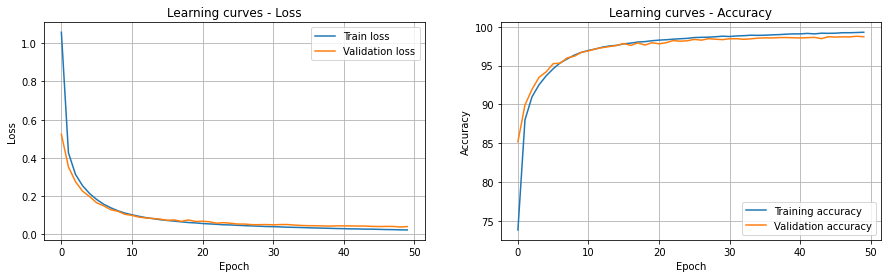

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(3x3)-16(7x7)-32, stride1 = 2, 2 fc: 64-10, act = LeakyReLU, opt = Adam, lr = 0.0003, reg = False, loss = CrossEntropy


Best val_loss: 0.03923 - train_loss: 0.02100 - val_acc: 98.81% - train_acc: 99.34% - execution_time: 242s


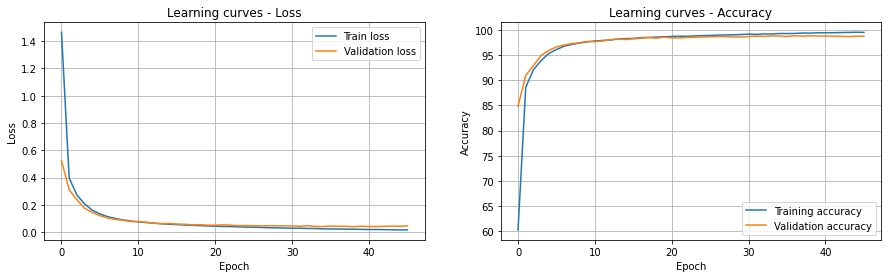

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(3x3)-128(5x5)-64, stride1 = 1, 3 fc: 128-512-10, act = Tanh, opt = RMSprop, lr = 0.0003, reg = False, loss = NLLLoss


Best val_loss: 0.03118 - train_loss: 0.00975 - val_acc: 99.05% - train_acc: 99.75% - execution_time: 129s


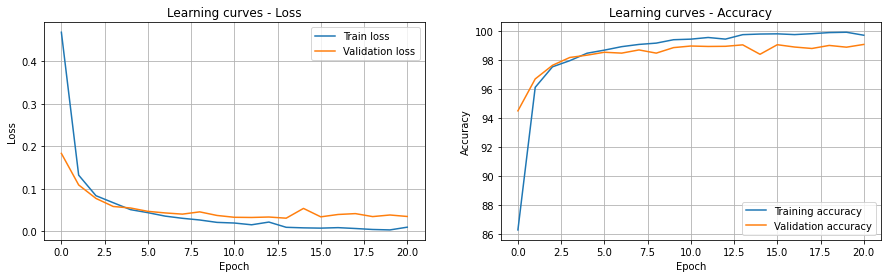

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 32(5x5)-16(7x7)-16-32, stride1 = 2, 3 fc: 256-128-10, act = ELU, opt = RMSprop, lr = 0.0003, reg = False, loss = NLLLoss


Best val_loss: 0.04399 - train_loss: 0.01496 - val_acc: 98.71% - train_acc: 99.56% - execution_time: 161s


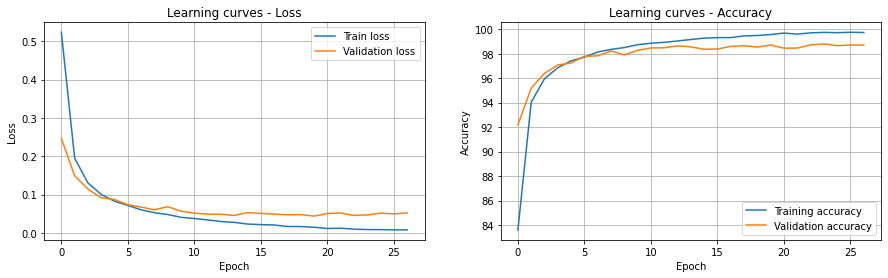

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(3x3)-16(7x7)-16-16, stride1 = 2, 2 fc: 64-10, act = Tanh, opt = RMSprop, lr = 0.003, reg = False, loss = NLLLoss


Best val_loss: 0.05290 - train_loss: 0.04895 - val_acc: 98.31% - train_acc: 98.72% - execution_time: 142s


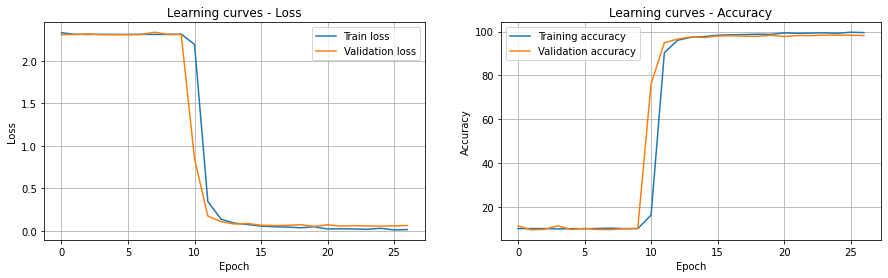

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 32(5x5)-16(7x7), stride1 = 1, 3 fc: 256-512-10, act = Tanh, opt = Adam, lr = 0.003, reg = False, loss = CrossEntropy


Best val_loss: 0.03909 - train_loss: 0.00806 - val_acc: 99.02% - train_acc: 99.73% - execution_time: 110s


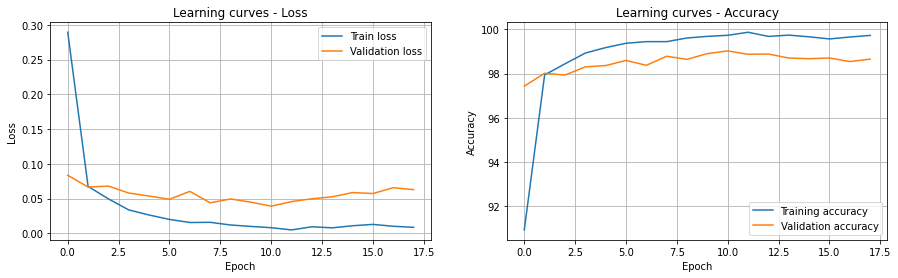

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(5x5)-64(3x3), stride1 = 2, 2 fc: 1024-10, act = ELU, opt = Adam, lr = 0.001, reg = False, loss = NLLLoss


Best val_loss: 0.03586 - train_loss: 0.00943 - val_acc: 98.91% - train_acc: 99.75% - execution_time: 84s


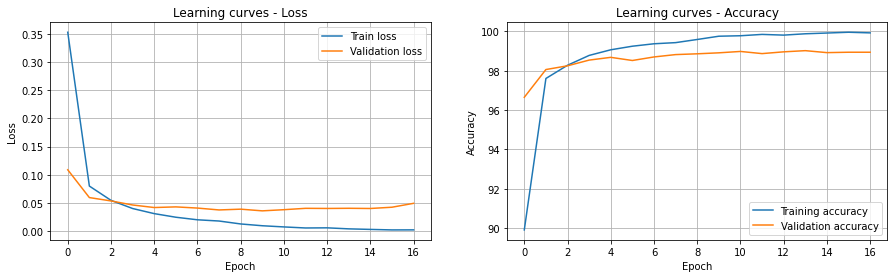

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(7x7)-64(3x3)-16-64, stride1 = 1, 2 fc: 512-10, act = LeakyReLU, opt = RMSprop, lr = 0.003, reg = Batch norm, loss = CrossEntropy


Best val_loss: 0.02723 - train_loss: 0.01092 - val_acc: 99.28% - train_acc: 99.67% - execution_time: 97s


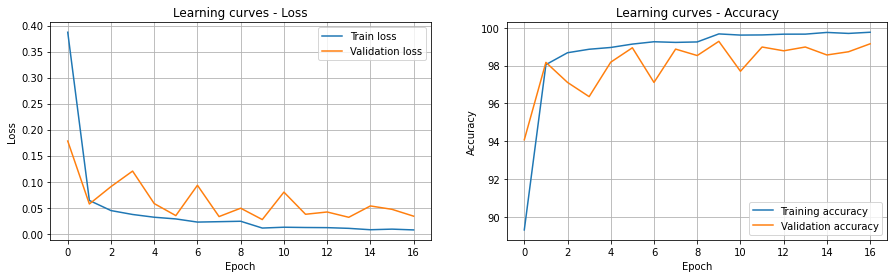

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(5x5)-16(5x5), stride1 = 2, 2 fc: 128-10, act = ELU, opt = Adam, lr = 0.001, reg = False, loss = NLLLoss


Best val_loss: 0.03797 - train_loss: 0.00754 - val_acc: 98.86% - train_acc: 99.78% - execution_time: 117s


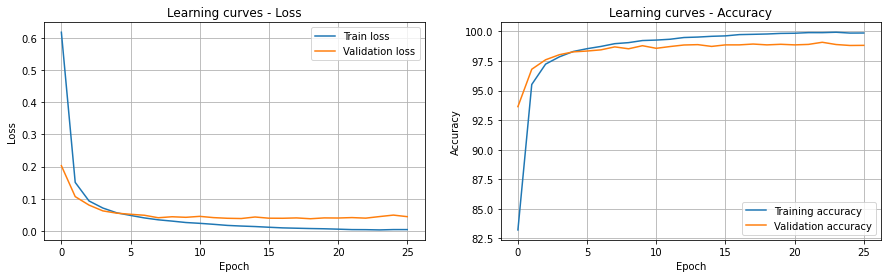

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(3x3)-128(5x5)-16-16, stride1 = 1, 3 fc: 64-256-10, act = Tanh, opt = Adam, lr = 0.0003, reg = False, loss = CrossEntropy


Best val_loss: 0.04027 - train_loss: 0.01660 - val_acc: 98.77% - train_acc: 99.55% - execution_time: 233s


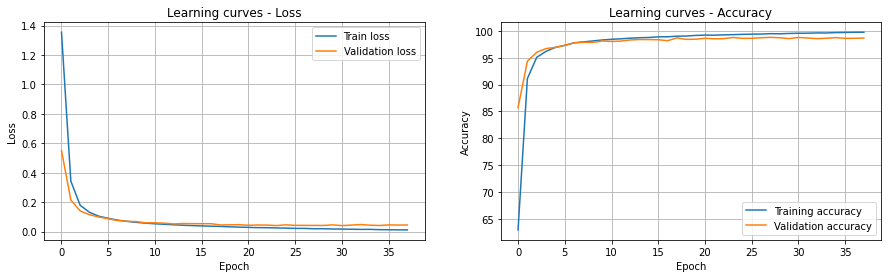

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(5x5)-16(7x7)-32, stride1 = 2, 2 fc: 64-10, act = LeakyReLU, opt = RMSprop, lr = 0.0003, reg = Batch norm, loss = CrossEntropy


Best val_loss: 0.03050 - train_loss: 0.00371 - val_acc: 99.09% - train_acc: 99.98% - execution_time: 121s


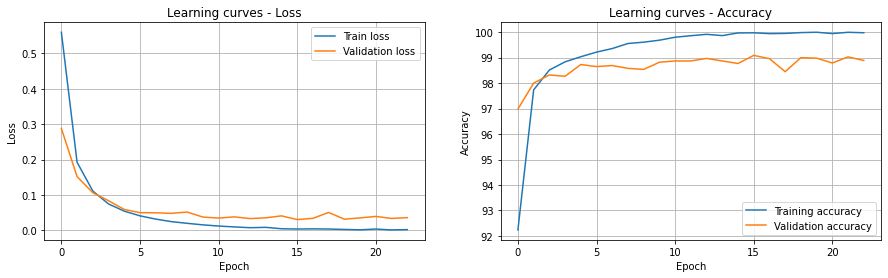

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(5x5)-16(3x3)-16-128, stride1 = 1, 2 fc: 64-10, act = ELU, opt = RMSprop, lr = 0.001, reg = Batch norm, loss = CrossEntropy


Best val_loss: 0.04480 - train_loss: 0.03034 - val_acc: 98.66% - train_acc: 99.15% - execution_time: 70s


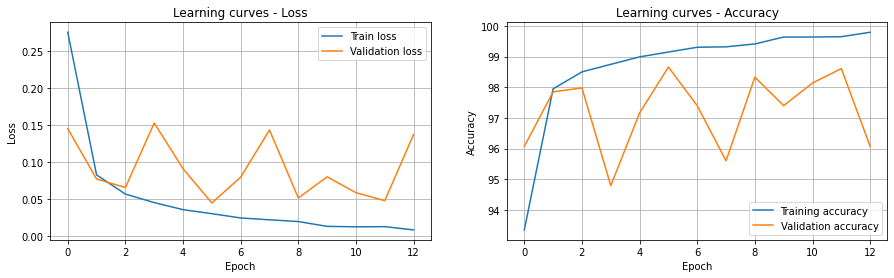

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(7x7)-16(5x5)-16, stride1 = 2, 2 fc: 64-10, act = Tanh, opt = RMSprop, lr = 0.003, reg = False, loss = CrossEntropy


Best val_loss: 0.04123 - train_loss: 0.01672 - val_acc: 98.65% - train_acc: 99.48% - execution_time: 88s


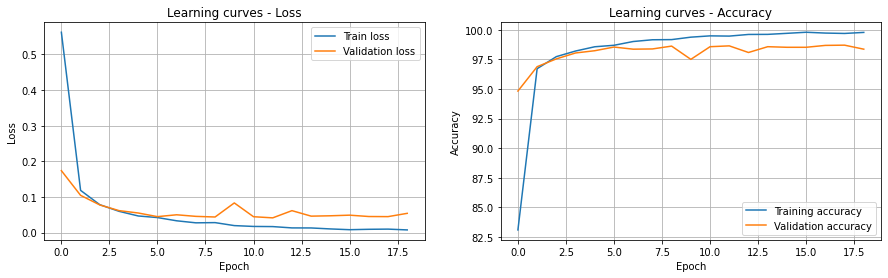

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 32(3x3)-32(5x5)-16, stride1 = 1, 3 fc: 1024-128-10, act = Tanh, opt = RMSprop, lr = 0.003, reg = Batch norm, loss = NLLLoss


Best val_loss: 0.03830 - train_loss: 0.00976 - val_acc: 99.05% - train_acc: 99.67% - execution_time: 142s


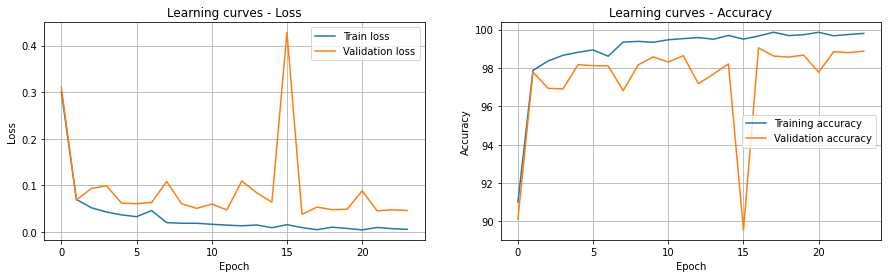

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(5x5)-16(3x3), stride1 = 2, 2 fc: 64-10, act = ELU, opt = Adam, lr = 0.0003, reg = Batch norm, loss = NLLLoss


Best val_loss: 0.04461 - train_loss: 0.02177 - val_acc: 98.62% - train_acc: 99.57% - execution_time: 149s


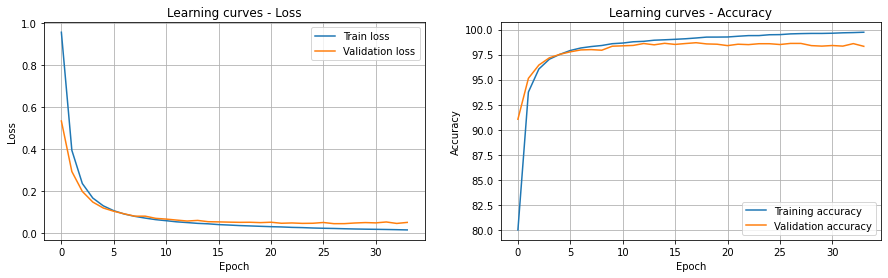

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(7x7)-128(5x5)-64-32, stride1 = 1, 3 fc: 128-256-10, act = LeakyReLU, opt = RMSprop, lr = 0.003, reg = Batch norm, loss = CrossEntropy


Best val_loss: 0.02857 - train_loss: 0.01177 - val_acc: 99.20% - train_acc: 99.60% - execution_time: 141s


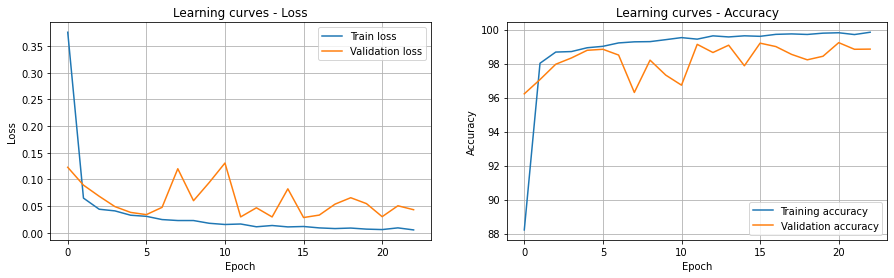

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(7x7)-64(5x5)-16, stride1 = 2, 2 fc: 512-10, act = LeakyReLU, opt = Adam, lr = 0.0001, reg = Batch norm, loss = CrossEntropy


Best val_loss: 0.03086 - train_loss: 0.00148 - val_acc: 99.07% - train_acc: 100.00% - execution_time: 238s


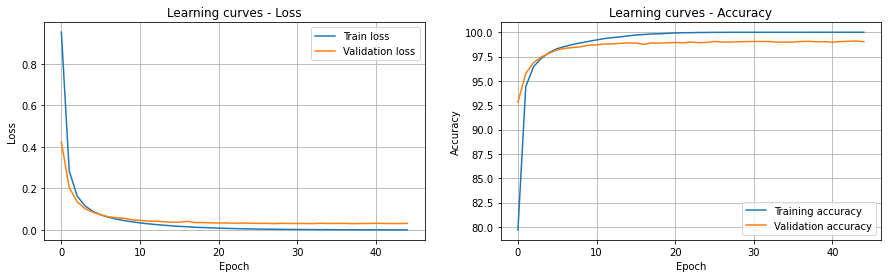

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 32(3x3)-16(3x3)-16, stride1 = 1, 3 fc: 256-128-10, act = Tanh, opt = Adam, lr = 0.003, reg = False, loss = NLLLoss


Best val_loss: 0.03398 - train_loss: 0.00048 - val_acc: 99.14% - train_acc: 99.99% - execution_time: 131s


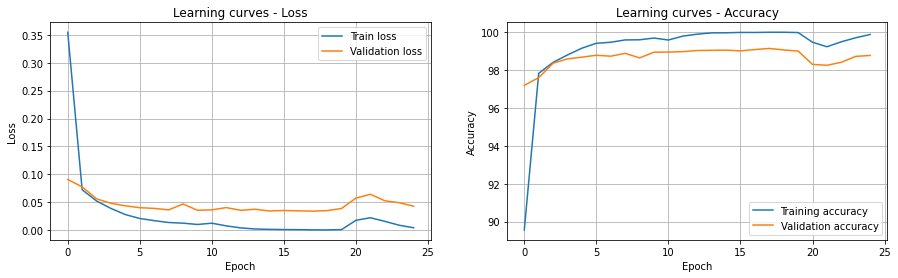

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(5x5)-16(3x3), stride1 = 2, 2 fc: 64-10, act = LeakyReLU, opt = Adam, lr = 0.0001, reg = False, loss = NLLLoss



Best val_loss: 0.06656 - train_loss: 0.05979 - val_acc: 97.88% - train_acc: 98.22% - execution_time: 218s


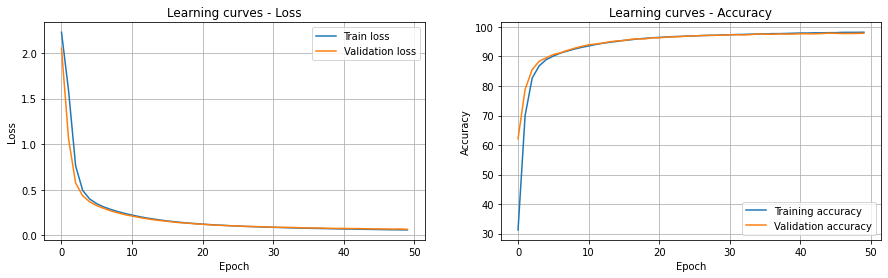

--------------------------------------------------------------------------------------------------------------------
RESULTS
Val_acc = 99.28 -> 4 conv: 16(7x7)-64(3x3)-16-64, stride1 = 1, 2 fc: 512-10, act = LeakyReLU, opt = RMSprop, lr = 0.003, reg = Batch norm, loss = CrossEntropy
Val_acc = 99.27 -> 2 conv: 32(5x5)-32(3x3), stride1 = 1, 3 fc: 1024-512-10, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = Batch norm, loss = CrossEntropy
Val_acc = 99.20 -> 4 conv: 16(7x7)-128(5x5)-64-32, stride1 = 1, 3 fc: 128-256-10, act = LeakyReLU, opt = RMSprop, lr = 0.003, reg = Batch norm, loss = CrossEntropy
Val_acc = 99.15 -> 3 conv: 16(5x5)-128(7x7)-64, stride1 = 1, 3 fc: 128-256-10, act = LeakyReLU, opt = Adam, lr = 0.001, reg = False, loss = NLLLoss
Val_acc = 99.14 -> 3 conv: 32(3x3)-16(3x3)-16, stride1 = 1, 3 fc: 256-128-10, act = Tanh, opt = Adam, lr = 0.003, reg = False, loss = NLLLoss
Val_acc = 99.11 -> 4 conv: 32(3x3)-16(5x5)-64-128, stride1 = 1, 3 fc: 512-256-10, act = Tanh, opt = RMSp

In [ ]:
# More precise lr

# Hyper-parameters
conv_layers_v = [2, 3, 4]
fc_layers_v = [2, 3]
Nconv_v = [16, 32, 64, 128]
kernel_v = [3, 5, 7]
stride_v = [1, 2]
Nh_v = [64, 128, 256, 512, 1024]
act_v = ['Tanh', 'LeakyReLU', 'ELU']
act_dict = {'Tanh':nn.Tanh(), 'LeakyReLU':nn.LeakyReLU(), 'ELU':nn.ELU()}
opt_v = ['Adam', 'RMSprop']
lr_v = [0.003, 0.001, 0.0003, 0.0001]
reg_v = ['False', 'Batch norm']
loss_dict = {'CrossEntropy':nn.CrossEntropyLoss(), 'NLLLoss':torch.nn.NLLLoss()}
loss_v = ['CrossEntropy', 'NLLLoss']
results = []

# RANDOM SEARCH
random.seed(1)
torch.manual_seed(0)
pbar = tq.tqdm(total = 30, desc = 'Random search progress')
random_coarse_grid_conv = list(itertools.product(Nconv_v, Nconv_v, Nconv_v, Nconv_v, kernel_v, kernel_v, stride_v, conv_layers_v))
random_coarse_grid_fc = list(itertools.product(fc_layers_v, Nh_v, Nh_v, act_v, opt_v, lr_v, reg_v, loss_v))
# random_coarse_grid = random_coarse_grid_conv
# for (Nconv1, Nconv4, 
#      act, opt, lr, loss) in random.sample(random_coarse_grid, 9):
    # sampling combinations from itertools.product, we are sure no combination is repeated
# random_coarse_grid = list(itertools.product(Nconv_v, Nconv_v, Nconv_v, Nconv_v, kernel_v, kernel_v, stride_v, conv_layers_v, fc_layers_v, Nh_v, Nh_v, act_v, opt_v, lr_v, reg_v, loss_v))
# # random_coarse_grid_fc = list(itertools.product(conv_layers_v, fc_layers_v, Nh_v, act_v, opt_v, lr_v, reg_v, loss_v))
random_coarse_grid = [x + y for x, y in zip(random_coarse_grid_conv, random_coarse_grid_fc)] 
for (Nconv1, Nconv2, Nconv3, Nconv4, k1, k2, stride1, cl, fcl, Nh1, Nh2, act, opt, lr, reg, loss) in random.sample(random_coarse_grid, 30):
    # k2 = k1; Nh2 = Nh1; 
    # CNN 5 conv: 16(9x9)-128(9x9)-32-64-3, stride1 = 1, stride2 = 1, 3 fc: 64-2048-10, act = Tanh, opt = Adam, lr = 0.0001, reg = False
    # (Nconv1, Nconv2, Nconv3, Nconv4, Nconv5, k1, k2, stride1, stride2, cl, fcl, Nh1, Nh2, act, opt, lr, reg) = (16, 128, 32, 64, 3)
    print(f'CNN {cl} conv:' 
          f' {Nconv1}({k1}x{k1}){-Nconv2}({k2}x{k2}){-Nconv3 if cl >= 3 else ""}{-Nconv4 if cl >= 4 else ""},'
          f' stride1 = {stride1},'
          f' {fcl} fc: {Nh1}{-Nh2 if fcl == 3 else ""}{-10}, act = {act}, opt = {opt}, lr = {lr}, reg = {reg}, loss = {loss}')
    
    # print(Nconv1, Nconv4, act, opt, lr, loss)

    start_time = time.time()
    # NETWORK INITIALIZATION
    torch.manual_seed(0)
    activation = act_dict[act]
    # net = CNNmod(784, 10, cl, fcl, Nconv1, Nconv2, Nconv3, Nconv4, Nconv5, k1, k2, stride1, stride2, Nh1, Nh2, activation, reg, loss)
    # net = CNN2(hidden_neurons_fc, No, conv_layers, Nconv1, Nconv2, Nconv3, Nconv4)
    # Nh, No, conv_layers, Nconv1, Nconv2=0, Nconv3=0, Nconv4=0)
    # conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, Nconv5, kernel1, kernel2, stride1, stride2, Nh1, Nh2, No, activation, reg, loss)
    net = CNN2(cl, fcl, Nconv1, Nconv2, Nconv3, Nconv4, 16, k1, k2, stride1, 1, Nh1, Nh2, 10, activation, reg, loss) 
    net.to(device)

    # Define the loss function
    loss_function = loss_dict[loss]

    # Define the optimizer
    opt_dict = {'Adam': optim.Adam(net.parameters(), lr = lr), 
                    'RMSprop': optim.RMSprop(net.parameters(), lr = lr),
                    'Adagrad': optim.Adagrad(net.parameters(), lr = lr),
                    'Adadelta': optim.Adadelta(net.parameters(), lr = lr)}
    optimizer = opt_dict[opt]

    # TRAINING LOOP
    num_epochs = 50
    patience = 7
    torch.manual_seed(0)
    train_dataloader, val_dataloader = myDataLoader(train_dataset, val_dataset, 500, val_batch_size=500)
    train_loss_log, val_loss_log, best_t_loss, best_v_loss, train_accuracy_log, val_accuracy_log, best_t_acc, best_v_acc, net = training_loop(net, 
                            train_dataloader, val_dataloader, loss_function, optimizer, num_epochs, no_improve_epoch=0, patience=patience)
    
    results.append((np.round(best_v_acc, 2), f'{cl} conv:' 
          f' {Nconv1}({k1}x{k1}){-Nconv2}({k2}x{k2}){-Nconv3 if cl >= 3 else ""}{-Nconv4 if cl >= 4 else ""},'
          f' stride1 = {stride1},'
          f' {fcl} fc: {Nh1}{-Nh2 if fcl == 3 else ""}{-10}, act = {act}, opt = {opt}, lr = {lr}, reg = {reg}, loss = {loss}'))
    run_time = time.time() - start_time
    print(f'Best val_loss: {best_v_loss:.5f} - train_loss: {best_t_loss:.5f} - val_acc: {best_v_acc:.2f}% - train_acc: {best_t_acc:.2f}% - execution_time: {run_time:.0f}s') 
    
    plot_losses(train_loss_log, val_loss_log, train_accuracy_log, val_accuracy_log)
    print('--------------------------------------------------------------------------------------------------------------------')
    pbar.update(1)

print('RESULTS')
for r in sorted(results, key=lambda tup: tup[0], reverse = True):
    print(f'Val_acc = {r[0]:.2f} -> {r[1]}')

Seventh search

CNN 3 conv: 16(5x5)-16(5x5)-128, stride1 = 1, 3 fc: 64-64-10, act = LeakyReLU, opt = Adam, lr = 0.0001, reg = Batch norm, loss = CrossEntropy



Best val_loss: 0.04239 - train_loss: 0.03299 - val_acc: 98.92% - train_acc: 99.22% - execution_time: 394s


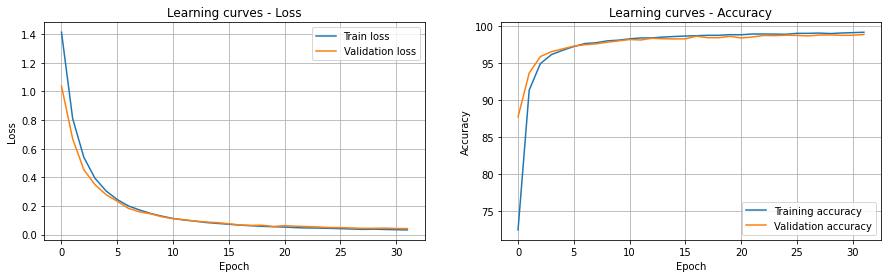

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 128(5x5)-128(5x5)-64, stride1 = 1, 2 fc: 1024-10, act = ELU, opt = RMSprop, lr = 0.0001, reg = False, loss = NLLLoss


Best val_loss: 0.04225 - train_loss: 0.04596 - val_acc: 98.59% - train_acc: 98.53% - execution_time: 300s


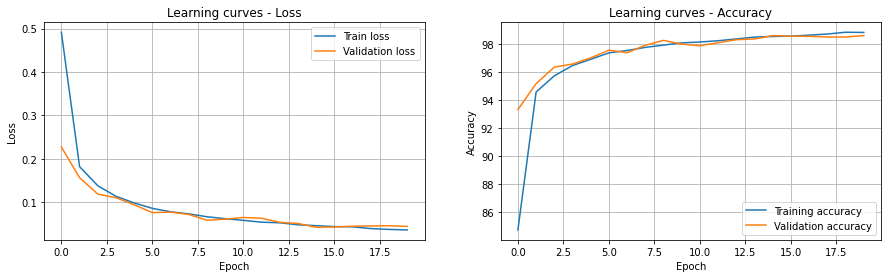

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(5x5)-16(5x5)-32-32, stride1 = 2, 2 fc: 512-10, act = LeakyReLU, opt = Adadelta, lr = 0.01, reg = Dropout, loss = CrossEntropy



Best val_loss: 0.44768 - train_loss: 0.50329 - val_acc: 86.19% - train_acc: 84.22% - execution_time: 341s


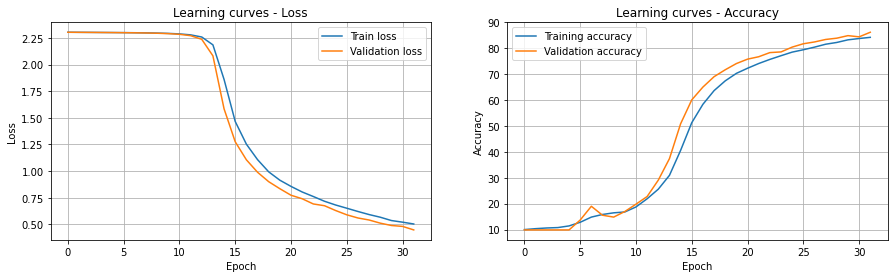

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 32(5x5)-32(5x5)-64-64, stride1 = 1, 3 fc: 512-512-10, act = LeakyReLU, opt = Adam, lr = 0.01, reg = False, loss = CrossEntropy


Best val_loss: 0.05463 - train_loss: 0.05151 - val_acc: 98.35% - train_acc: 98.49% - execution_time: 280s


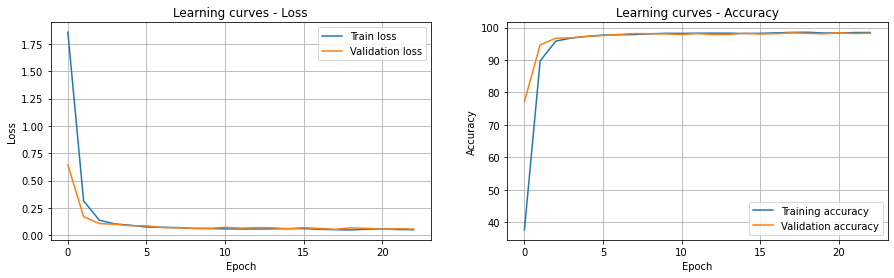

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 16(7x7)-16(7x7)-64-64-64, stride1 = 2, 3 fc: 64-64-10, act = LeakyReLU, opt = Adagrad, lr = 0.0001, reg = Dropout, loss = NLLLoss



Best val_loss: 1.43379 - train_loss: 1.56848 - val_acc: 52.70% - train_acc: 43.88% - execution_time: 377s


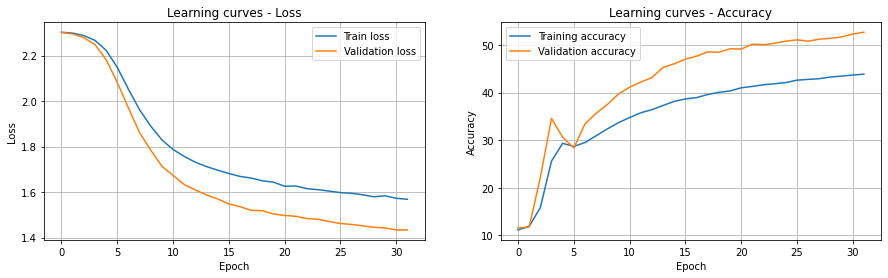

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 128(5x5)-128(5x5), stride1 = 2, 3 fc: 128-128-10, act = LeakyReLU, opt = Adagrad, lr = 0.0001, reg = False, loss = CrossEntropy



Best val_loss: 0.50198 - train_loss: 0.51735 - val_acc: 84.98% - train_acc: 84.86% - execution_time: 444s


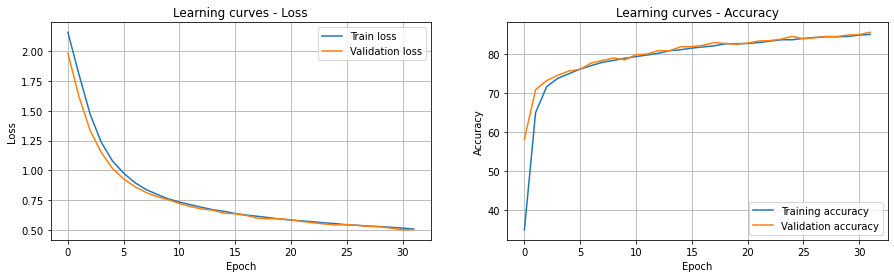

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 64(5x5)-64(5x5), stride1 = 1, 3 fc: 512-512-10, act = Tanh, opt = RMSprop, lr = 0.1, reg = Dropout, loss = NLLLoss


Best val_loss: 47.63532 - train_loss: 45.30427 - val_acc: 11.51% - train_acc: 9.97% - execution_time: 112s


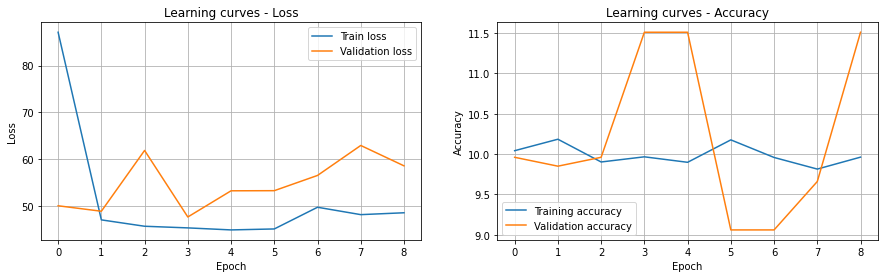

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 64(7x7)-64(7x7)-128-128, stride1 = 2, 3 fc: 64-64-10, act = ELU, opt = RMSprop, lr = 0.01, reg = Batch norm, loss = CrossEntropy


Best val_loss: 0.06707 - train_loss: 0.11483 - val_acc: 97.92% - train_acc: 96.52% - execution_time: 125s


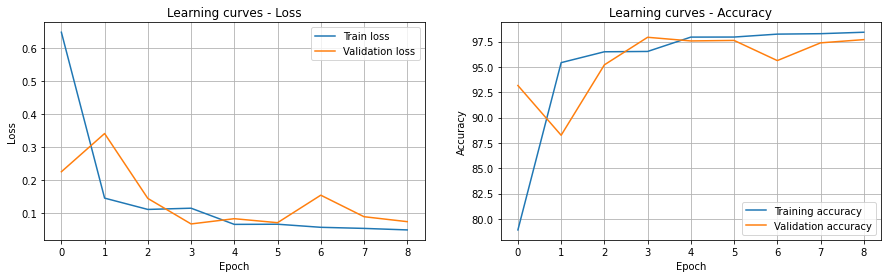

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 64(5x5)-64(5x5)-32-32, stride1 = 2, 2 fc: 1024-10, act = Tanh, opt = Adagrad, lr = 0.01, reg = False, loss = CrossEntropy



Best val_loss: 0.05239 - train_loss: 0.05126 - val_acc: 98.28% - train_acc: 98.37% - execution_time: 381s


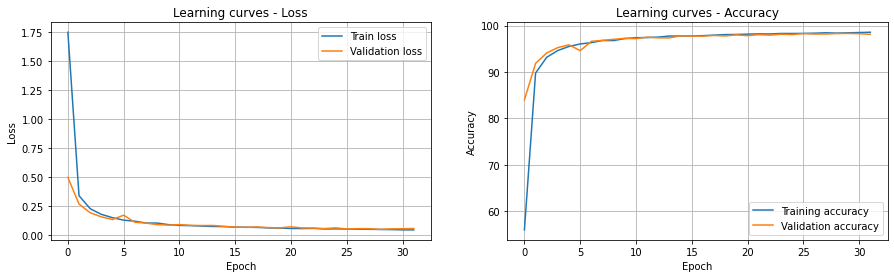

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 32(3x3)-32(3x3)-32-32-32, stride1 = 2, 2 fc: 1024-10, act = ELU, opt = Adadelta, lr = 0.1, reg = Dropout, loss = NLLLoss



Best val_loss: 0.07332 - train_loss: 0.07773 - val_acc: 97.62% - train_acc: 97.54% - execution_time: 342s


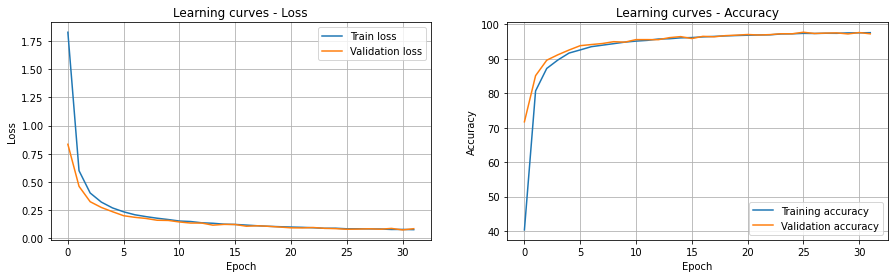

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 16(5x5)-16(5x5), stride1 = 1, 3 fc: 2048-2048-10, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = False, loss = NLLLoss


Best val_loss: 0.03275 - train_loss: 0.03098 - val_acc: 98.95% - train_acc: 99.02% - execution_time: 277s


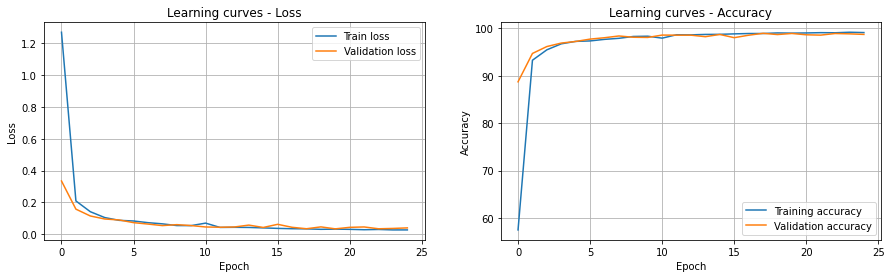

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 128(5x5)-128(5x5), stride1 = 1, 2 fc: 64-10, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = False, loss = NLLLoss



Best val_loss: 0.02478 - train_loss: 0.01619 - val_acc: 99.20% - train_acc: 99.49% - execution_time: 454s


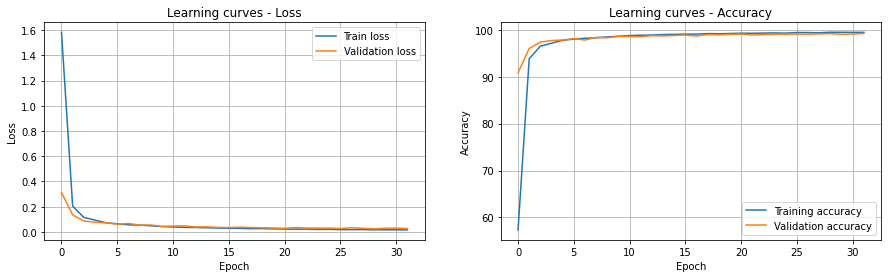

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(7x7)-16(7x7)-16, stride1 = 1, 2 fc: 256-10, act = LeakyReLU, opt = RMSprop, lr = 0.1, reg = False, loss = CrossEntropy


Best val_loss: 453.47430 - train_loss: 571.53290 - val_acc: 46.25% - train_acc: 44.69% - execution_time: 143s


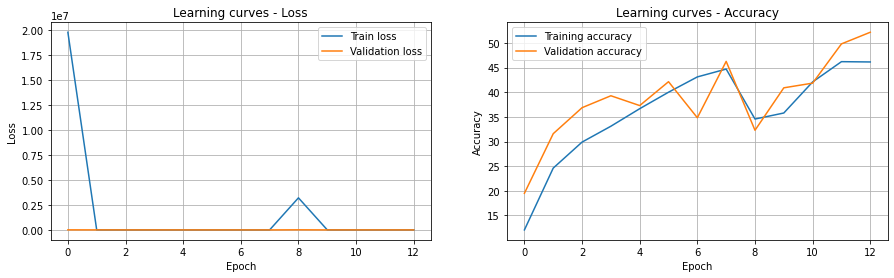

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 64(7x7)-64(7x7), stride1 = 2, 3 fc: 64-64-10, act = LeakyReLU, opt = Adadelta, lr = 0.1, reg = False, loss = CrossEntropy



Best val_loss: 0.06110 - train_loss: 0.05648 - val_acc: 98.11% - train_acc: 98.22% - execution_time: 429s


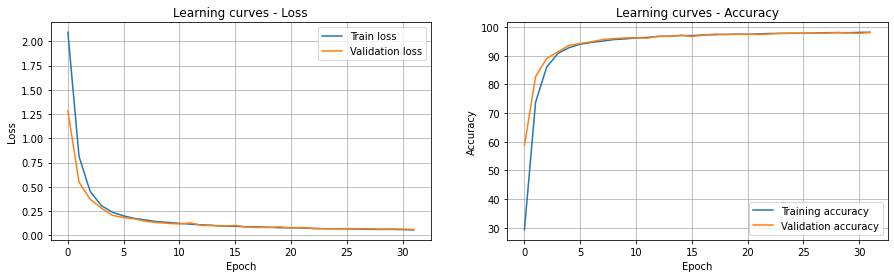

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 64(7x7)-64(7x7)-64-64, stride1 = 2, 3 fc: 128-128-10, act = Tanh, opt = Adagrad, lr = 0.0001, reg = False, loss = CrossEntropy



Best val_loss: 0.94737 - train_loss: 0.94577 - val_acc: 75.79% - train_acc: 76.05% - execution_time: 441s


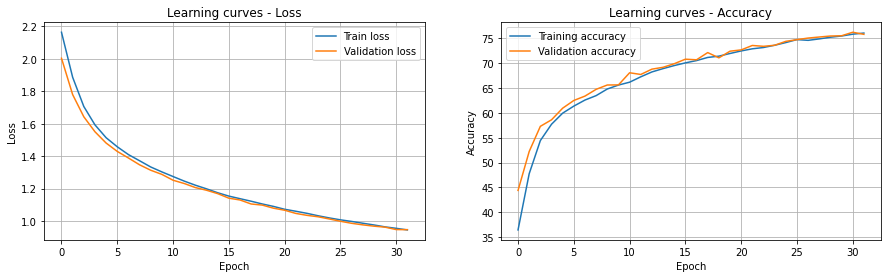

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 128(5x5)-128(5x5), stride1 = 1, 3 fc: 128-128-10, act = Tanh, opt = Adadelta, lr = 0.001, reg = Batch norm, loss = NLLLoss



Best val_loss: 0.32108 - train_loss: 0.32237 - val_acc: 95.05% - train_acc: 94.98% - execution_time: 461s


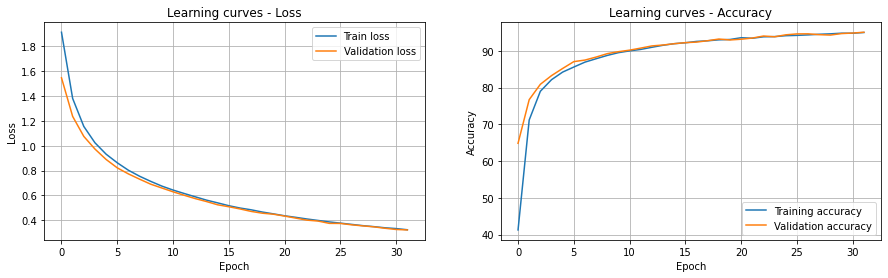

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(3x3)-16(3x3)-16, stride1 = 1, 2 fc: 512-10, act = LeakyReLU, opt = Adam, lr = 0.1, reg = False, loss = CrossEntropy


Best val_loss: 2.22455 - train_loss: 18.31986 - val_acc: 15.71% - train_acc: 14.43% - execution_time: 63s


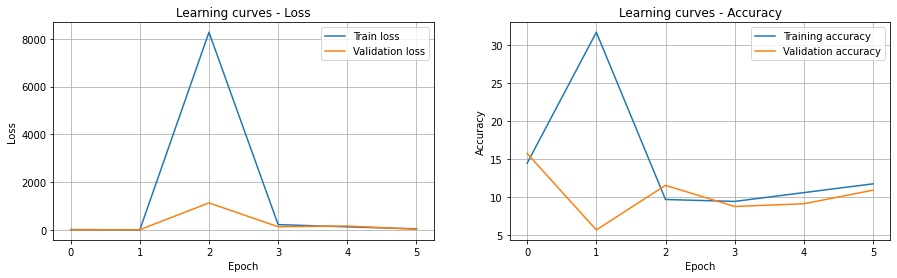

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 64(3x3)-64(3x3)-128-128, stride1 = 2, 2 fc: 512-10, act = Tanh, opt = Adadelta, lr = 0.001, reg = False, loss = CrossEntropy



Best val_loss: 1.72244 - train_loss: 1.76325 - val_acc: 58.36% - train_acc: 57.60% - execution_time: 417s


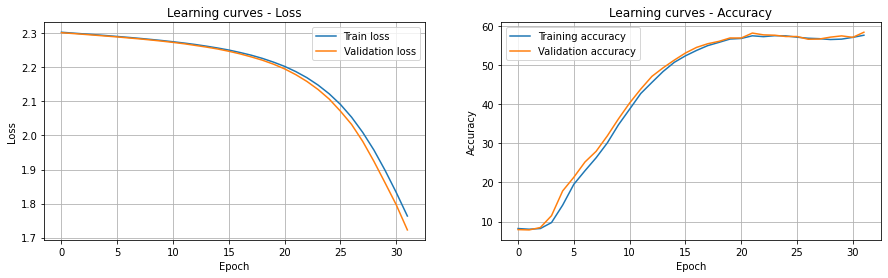

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 32(7x7)-32(7x7)-64, stride1 = 1, 3 fc: 128-128-10, act = LeakyReLU, opt = Adam, lr = 0.01, reg = False, loss = NLLLoss


Best val_loss: 0.05307 - train_loss: 0.05112 - val_acc: 98.39% - train_acc: 98.53% - execution_time: 187s


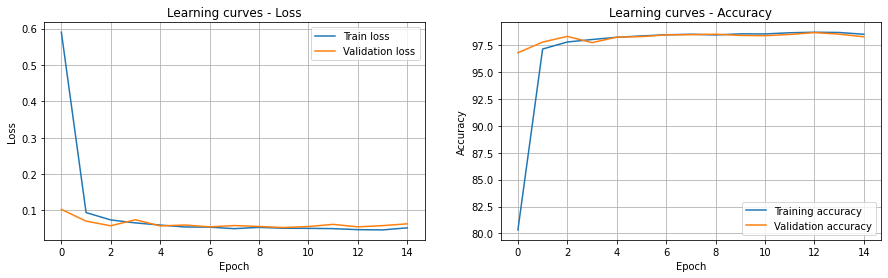

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 32(7x7)-32(7x7)-32-32, stride1 = 1, 3 fc: 512-512-10, act = ELU, opt = RMSprop, lr = 0.001, reg = False, loss = NLLLoss



Best val_loss: 0.03043 - train_loss: 0.03789 - val_acc: 99.04% - train_acc: 98.89% - execution_time: 398s


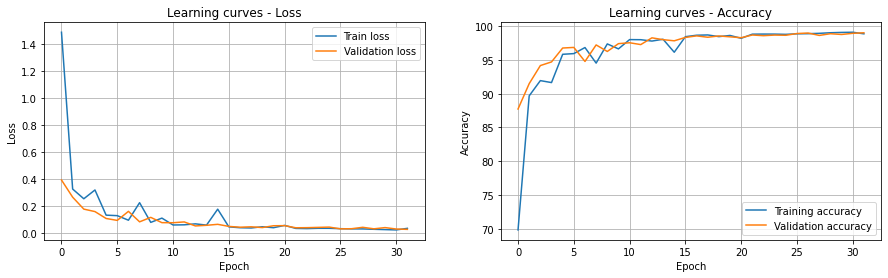

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 128(7x7)-128(7x7)-64-64, stride1 = 2, 3 fc: 256-256-10, act = LeakyReLU, opt = Adagrad, lr = 0.0001, reg = False, loss = CrossEntropy



Best val_loss: 0.47678 - train_loss: 0.48365 - val_acc: 85.27% - train_acc: 85.11% - execution_time: 553s


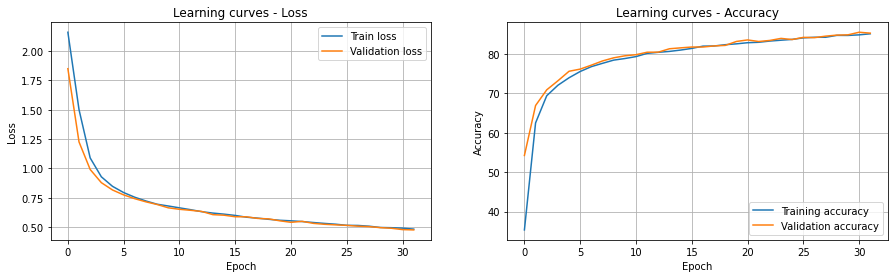

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(5x5)-16(5x5)-64-64, stride1 = 2, 2 fc: 64-10, act = LeakyReLU, opt = Adam, lr = 0.001, reg = Batch norm, loss = NLLLoss


Best val_loss: 0.03595 - train_loss: 0.03429 - val_acc: 99.02% - train_acc: 98.94% - execution_time: 172s


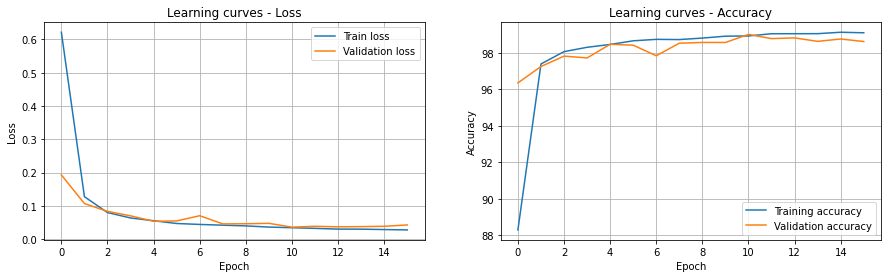

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 64(3x3)-64(3x3), stride1 = 1, 3 fc: 128-128-10, act = LeakyReLU, opt = RMSprop, lr = 0.01, reg = Batch norm, loss = CrossEntropy


Best val_loss: 0.03033 - train_loss: 0.02722 - val_acc: 99.05% - train_acc: 99.14% - execution_time: 262s


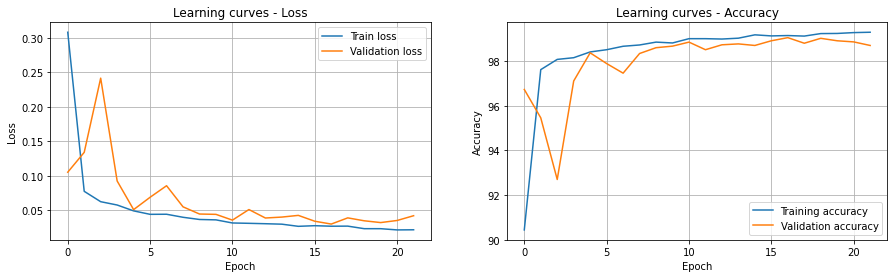

--------------------------------------------------------------------------------------------------------------------
CNN 4 conv: 16(7x7)-16(7x7)-16-16, stride1 = 1, 3 fc: 64-64-10, act = ELU, opt = Adam, lr = 0.0001, reg = Batch norm, loss = NLLLoss



Best val_loss: 0.07381 - train_loss: 0.06912 - val_acc: 97.79% - train_acc: 98.02% - execution_time: 360s


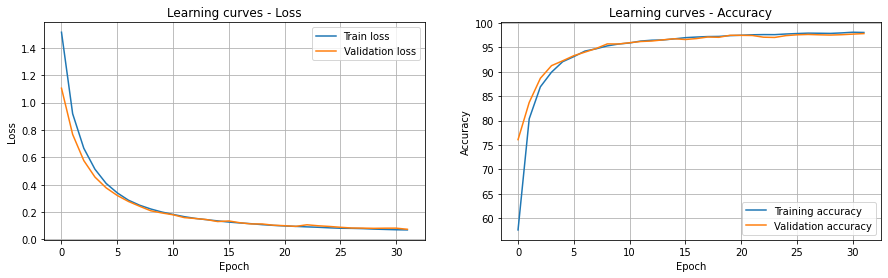

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(5x5)-16(5x5)-16, stride1 = 2, 3 fc: 64-64-10, act = LeakyReLU, opt = Adadelta, lr = 0.001, reg = False, loss = CrossEntropy



Best val_loss: 2.30271 - train_loss: 2.30313 - val_acc: 10.22% - train_acc: 9.80% - execution_time: 328s


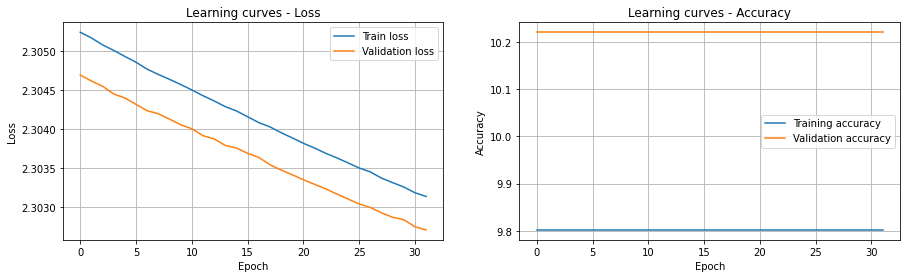

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 16(5x5)-16(5x5)-16-16-16, stride1 = 2, 2 fc: 2048-10, act = Tanh, opt = Adagrad, lr = 0.01, reg = Batch norm, loss = NLLLoss


Best val_loss: 0.07611 - train_loss: 0.07107 - val_acc: 97.54% - train_acc: 97.75% - execution_time: 271s


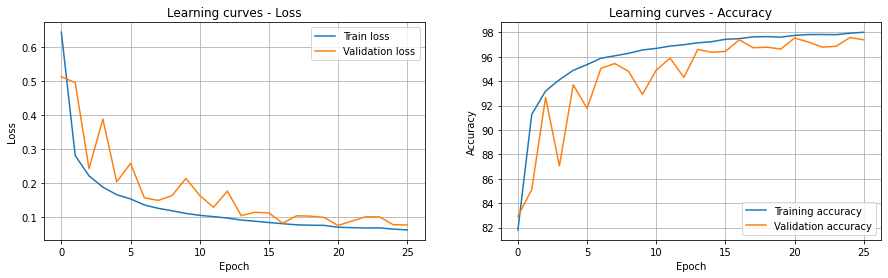

--------------------------------------------------------------------------------------------------------------------
CNN 2 conv: 128(7x7)-128(7x7), stride1 = 1, 3 fc: 64-64-10, act = LeakyReLU, opt = RMSprop, lr = 0.01, reg = Dropout, loss = CrossEntropy


Best val_loss: 0.09152 - train_loss: 0.17505 - val_acc: 97.70% - train_acc: 95.36% - execution_time: 385s


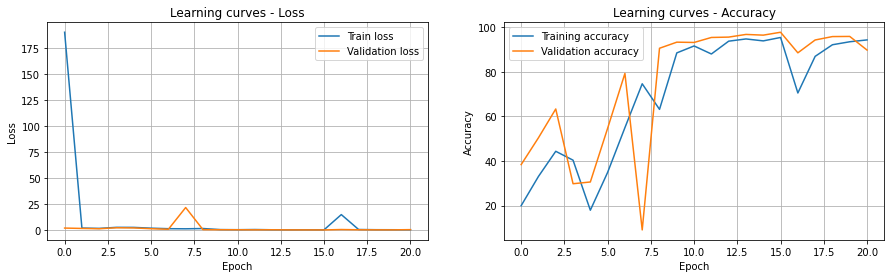

--------------------------------------------------------------------------------------------------------------------
CNN 3 conv: 16(3x3)-16(3x3)-16, stride1 = 2, 3 fc: 128-128-10, act = Tanh, opt = Adam, lr = 0.01, reg = Dropout, loss = CrossEntropy


Best val_loss: 0.09985 - train_loss: 0.12489 - val_acc: 97.02% - train_acc: 96.31% - execution_time: 151s


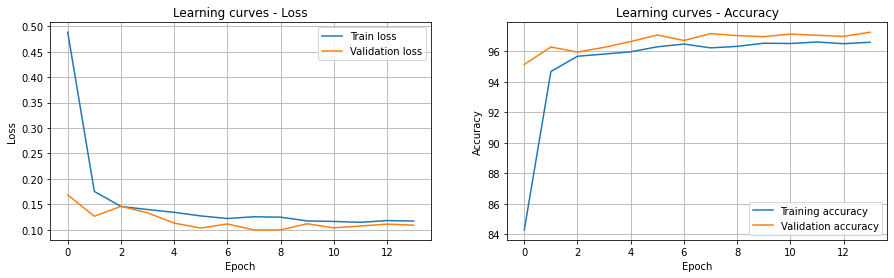

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 64(5x5)-64(5x5)-32-32-32, stride1 = 2, 2 fc: 512-10, act = ELU, opt = Adadelta, lr = 0.1, reg = Dropout, loss = NLLLoss



Best val_loss: 0.06080 - train_loss: 0.06943 - val_acc: 98.04% - train_acc: 97.81% - execution_time: 415s


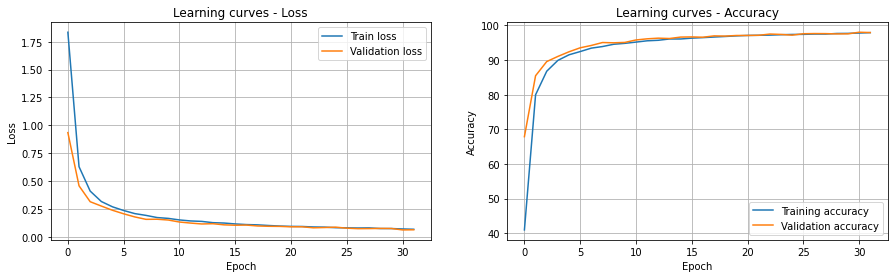

--------------------------------------------------------------------------------------------------------------------
CNN 5 conv: 32(5x5)-32(5x5)-32-32-32, stride1 = 1, 2 fc: 2048-10, act = Tanh, opt = Adadelta, lr = 0.001, reg = Batch norm, loss = NLLLoss



Best val_loss: 0.38250 - train_loss: 0.39770 - val_acc: 89.34% - train_acc: 88.76% - execution_time: 383s


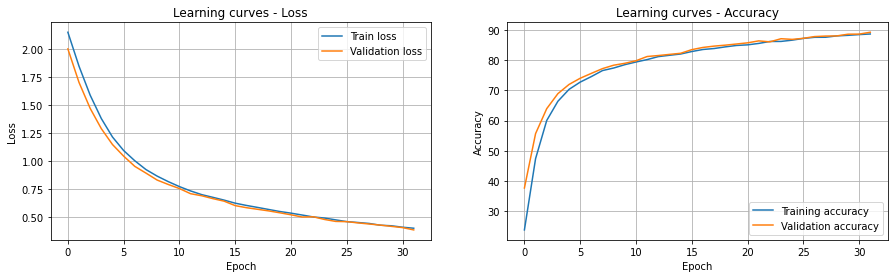

--------------------------------------------------------------------------------------------------------------------
RESULTS
Val_acc = 99.20 -> 2 conv: 128(5x5)-128(5x5), stride1 = 1, 2 fc: 64-10, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = False, loss = NLLLoss
Val_acc = 99.05 -> 2 conv: 64(3x3)-64(3x3), stride1 = 1, 3 fc: 128-128-10, act = LeakyReLU, opt = RMSprop, lr = 0.01, reg = Batch norm, loss = CrossEntropy
Val_acc = 99.04 -> 4 conv: 32(7x7)-32(7x7)-32-32, stride1 = 1, 3 fc: 512-512-10, act = ELU, opt = RMSprop, lr = 0.001, reg = False, loss = NLLLoss
Val_acc = 99.02 -> 4 conv: 16(5x5)-16(5x5)-64-64, stride1 = 2, 2 fc: 64-10, act = LeakyReLU, opt = Adam, lr = 0.001, reg = Batch norm, loss = NLLLoss
Val_acc = 98.95 -> 2 conv: 16(5x5)-16(5x5), stride1 = 1, 3 fc: 2048-2048-10, act = LeakyReLU, opt = RMSprop, lr = 0.001, reg = False, loss = NLLLoss
Val_acc = 98.92 -> 3 conv: 16(5x5)-16(5x5)-128, stride1 = 1, 3 fc: 64-64-10, act = LeakyReLU, opt = Adam, lr = 0.0001, reg = Batc

In [ ]:
# USING DATA AUGMENTATION 

No = 10

# Hyper-parameters
conv_layers_v = [2, 3, 4, 5]
fc_layers_v = [2, 3]
Nconv_v = [16, 32, 64, 128]
kernel_v = [3, 5, 7]
stride_v = [1, 2]
Nh_v = [64, 128, 256, 512, 1024, 2048]
act_v = ['Tanh', 'LeakyReLU', 'ELU']
act_dict = {'Tanh':nn.Tanh(), 'LeakyReLU':nn.LeakyReLU(), 'ELU':nn.ELU()}
opt_v = ['Adam', 'RMSprop', 'Adadelta', 'Adagrad']
lr_v = [0.1, 0.01, 0.001, 0.0001]
reg_v = ['False', 'Dropout', 'Batch norm']
loss_dict = {'CrossEntropy':nn.CrossEntropyLoss(), 'NLLLoss':torch.nn.NLLLoss()}
loss_v = ['CrossEntropy', 'NLLLoss']
results = []

# RANDOM SEARCH
random.seed(1)
torch.manual_seed(0)
pbar = tq.tqdm(total = 30, desc = 'Random search progress')
random_coarse_grid = list(itertools.product(Nconv_v, Nconv_v, kernel_v, stride_v, conv_layers_v, fc_layers_v, Nh_v, act_v, opt_v, lr_v, reg_v, loss_v))
for (Nconv1, Nconv3, k1, stride1, cl, fcl, Nh1, act, opt, lr, reg, loss) in random.sample(random_coarse_grid, 30):
    Nconv2 = Nconv1; Nconv4 = Nconv3; Nconv5 = Nconv3; k2 = k1; Nh2 = Nh1; 
    print(f'CNN {cl} conv:' 
          f' {Nconv1}({k1}x{k1}){-Nconv2}({k2}x{k2}){-Nconv3 if cl >= 3 else ""}{-Nconv4 if cl >= 4 else ""}{-Nconv5 if cl >= 5 else ""},'
          f' stride1 = {stride1},'
          f' {fcl} fc: {Nh1}{-Nh2 if fcl == 3 else ""}{-10}, act = {act}, opt = {opt}, lr = {lr}, reg = {reg}, loss = {loss}')
    
    start_time = time.time()
    # NETWORK INITIALIZATION
    torch.manual_seed(0)
    activation = act_dict[act]
    net = CNN2(cl, fcl, Nconv1, Nconv2, Nconv3, Nconv4, Nconv5, k1, k2, stride1, 1, Nh1, Nh2, No, activation, reg, loss) 
    net.to(device)

    # Define the loss function
    loss_function = loss_dict[loss]

    # Define the optimizer
    opt_dict = {'Adam': optim.Adam(net.parameters(), lr = lr), 
                    'RMSprop': optim.RMSprop(net.parameters(), lr = lr),
                    'Adagrad': optim.Adagrad(net.parameters(), lr = lr),
                    'Adadelta': optim.Adadelta(net.parameters(), lr = lr)}
    optimizer = opt_dict[opt]

    # TRAINING LOOP
    num_epochs = 32
    patience = 5
    train_dataloader, val_dataloader = myDataLoader(train_dataset, val_dataset, 500, val_batch_size=500)
    train_loss_log, val_loss_log, best_t_loss, best_v_loss, train_accuracy_log, val_accuracy_log, best_t_acc, best_v_acc, net = training_loop(net, 
                            train_dataloader, val_dataloader, loss_function, optimizer, num_epochs, no_improve_epoch=0, patience=patience)
    
    results.append((np.round(best_v_acc, 2), f'{cl} conv:' 
          f' {Nconv1}({k1}x{k1}){-Nconv2}({k2}x{k2}){-Nconv3 if cl >= 3 else ""}{-Nconv4 if cl >= 4 else ""}{-Nconv5 if cl >= 5 else ""},'
          f' stride1 = {stride1},'
          f' {fcl} fc: {Nh1}{-Nh2 if fcl == 3 else ""}{-10}, act = {act}, opt = {opt}, lr = {lr}, reg = {reg}, loss = {loss}'))
    run_time = time.time() - start_time
    print(f'Best val_loss: {best_v_loss:.5f} - train_loss: {best_t_loss:.5f} - val_acc: {best_v_acc:.2f}% - train_acc: {best_t_acc:.2f}% - execution_time: {run_time:.0f}s') 
    
    plot_losses(train_loss_log, val_loss_log, train_accuracy_log, val_accuracy_log)
    print('--------------------------------------------------------------------------------------------------------------------')
    pbar.update(1)

print('RESULTS')
for r in sorted(results, key=lambda tup: tup[0], reverse = True):
    print(f'Val_acc = {r[0]:.2f} -> {r[1]}')

# Test evaluation

#### Final FC


Best val_loss: 0.04806 - train_loss: 0.03325 - val_acc: 98.65% - train_acc: 98.95% - execution_time: 535s


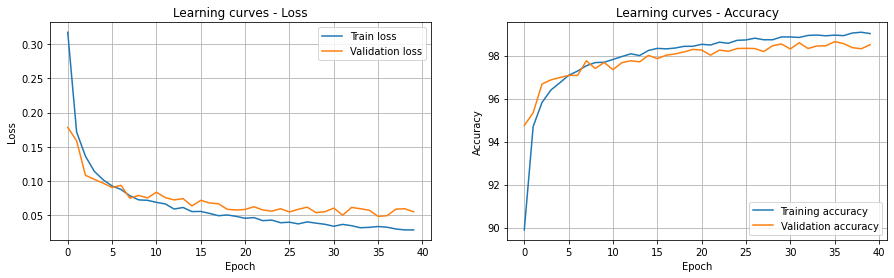

--------------------------------------------------------------------------------------------------------------------


In [ ]:
random.seed(1)

start_time = time.time()
# NETWORK INITIALIZATION
torch.manual_seed(0)
net = FCNetmod(784, 4096, 1024, 0, 0, 10, 2, nn.LeakyReLU(), 'Batch norm')
net.to(device)

# Define the loss function
loss_function = nn.CrossEntropyLoss()

# Define the optimizer
optimizer = optim.Adam(net.parameters(), lr = 0.003)

# TRAINING LOOP
num_epochs = 40
patience = 5
train_dataloader, val_dataloader = myDataLoader(train_dataset, val_dataset, 100, val_batch_size=250)
train_loss_log, val_loss_log, best_t_loss, best_v_loss, train_accuracy_log, val_accuracy_log, best_t_acc, best_v_acc, net = training_loop(net, 
                        train_dataloader, val_dataloader, loss_function, optimizer, num_epochs, no_improve_epoch=0, patience=patience)

run_time = time.time() - start_time
print(f'Best val_loss: {best_v_loss:.5f} - train_loss: {best_t_loss:.5f} - val_acc: {best_v_acc:.2f}% - train_acc: {best_t_acc:.2f}% - execution_time: {run_time:.0f}s') 

plot_losses(train_loss_log, val_loss_log, train_accuracy_log, val_accuracy_log)
print('--------------------------------------------------------------------------------------------------------------------')

In [ ]:
random.seed(1)

start_time = time.time()
# NETWORK INITIALIZATION
torch.manual_seed(0)
net = FCNetmod(784, 4096, 1024, 0, 0, 10, 2, nn.LeakyReLU(), 'Batch norm')
net.to(device)

# Define the loss function
loss_function = nn.CrossEntropyLoss()

# Define the optimizer
optimizer = optim.Adam(net.parameters(), lr = 0.003)

# TRAINING LOOP
start_time = time.time()

train_loss_log = []; val_loss_log = []
train_accuracy_log = []; val_accuracy_log = []

for epoch_num in tq.tqdm(range(40), desc = f'Training'):

    # ----------- TRAIN -----------
    train_loss= []
    all_outputs, all_labels = [], []
    net.train() # Training mode (e.g. enable dropout, and all other stochastic behaviours)
    for sample_batched in train_dataloader_original:
        # Move data to device
        x_batch = sample_batched[0].to(device)
        label_batch = sample_batched[1].to(device)

        # Forward pass
        out = net(x_batch)

        # Compute loss
        loss = loss_function(out, label_batch)

        # Backpropagation
        net.zero_grad()
        loss.backward()

        # Update the weights
        optimizer.step()

        # Save train loss and output for this batch
        loss_batch = loss.detach().cpu().numpy()
        train_loss.append(loss_batch)
        all_outputs.append(out)
        all_labels.append(label_batch)

    train_accuracy = accuracy(all_outputs, all_labels)
    train_accuracy_log.append(train_accuracy)

    # Save average train loss
    train_loss = np.mean(train_loss)
    train_loss_log.append(train_loss)
    

    # # ----------- VALIDATION -----------
    val_loss, all_outputs_v, all_labels_v = validation(test_dataloader, net)
    # print(val_loss)
    val_loss_log.append(val_loss)

    val_accuracy = accuracy(all_outputs_v, all_labels_v)
    # print(val_accuracy)
    val_accuracy_log.append(val_accuracy)
        

 
run_time = time.time() - start_time


In [ ]:
all_inputs = []
all_outputs = []
all_labels = []
net.eval() # Evaluation mode (e.g. disable dropout)
with torch.no_grad(): # Disable gradient tracking
  for sample_batched in test_dataloader:
    # Move data to device
    x_batch = sample_batched[0].to(device)
    # x_batch = torch.reshape(x_batch, (10000, -1))
    x_batch = torch.reshape(x_batch, (500, 1, 28, 28))
    label_batch = sample_batched[1].to(device)
    label_batch = torch.reshape(label_batch, (-1,))
    # Forward pass
    out = net(x_batch)
    # Save outputs and labels
    all_inputs.append(x_batch)
    all_outputs.append(out)
    all_labels.append(label_batch)
# Concatenate all the outputs and labels in a single tensor
all_inputs  = torch.cat(all_inputs)
all_outputs = torch.cat(all_outputs)
all_labels  = torch.cat(all_labels)

test_loss = loss_function(all_outputs, all_labels)
print(f"AVERAGE TEST LOSS: {test_loss}")
tot_correct_out = (all_outputs.argmax(dim=-1) == all_labels).sum()
test_accuracy = 100 * tot_correct_out / len(all_labels)
print(f"TEST ACCURACY: {test_accuracy:.2f}%")

AVERAGE TEST LOSS: 0.0275094173848629
TEST ACCURACY: 99.06%


In [ ]:
torch.save(net, 'FC_aug.torch')

In [ ]:
# First hidden layer
h1_w = net.fc1.weight.data.cpu().numpy()  

# Second hidden layer
h2_w = net.fc2.weight.data.cpu().numpy()

# Output layer
out_w = net.out.weight.data.cpu().numpy()

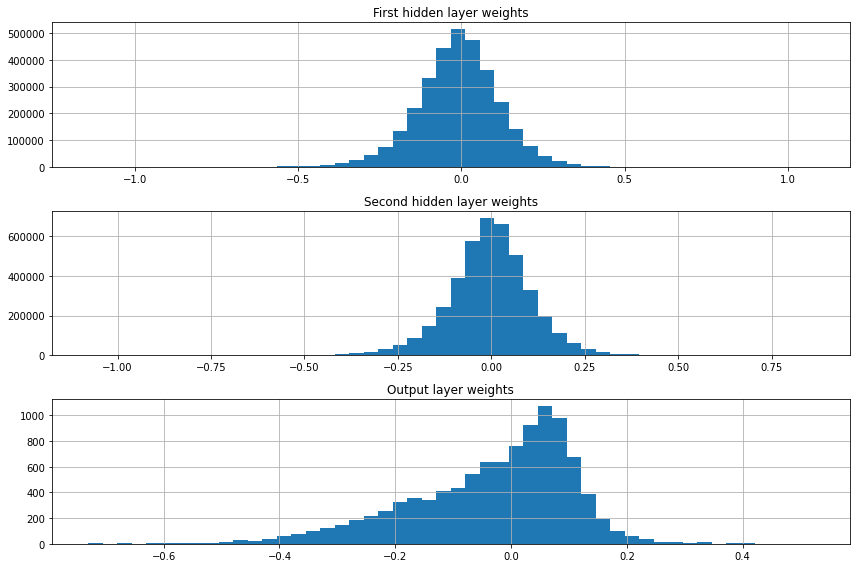

In [ ]:
# Weights histogram
fig, axs = plt.subplots(3, 1, figsize=(12,8))
axs[0].hist(h1_w.flatten(), 50)
axs[0].set_title('First hidden layer weights')
axs[1].hist(h2_w.flatten(), 50)
axs[1].set_title('Second hidden layer weights')
axs[2].hist(out_w.flatten(), 50)
axs[2].set_title('Output layer weights')
[ax.grid() for ax in axs]
plt.tight_layout()
plt.show()

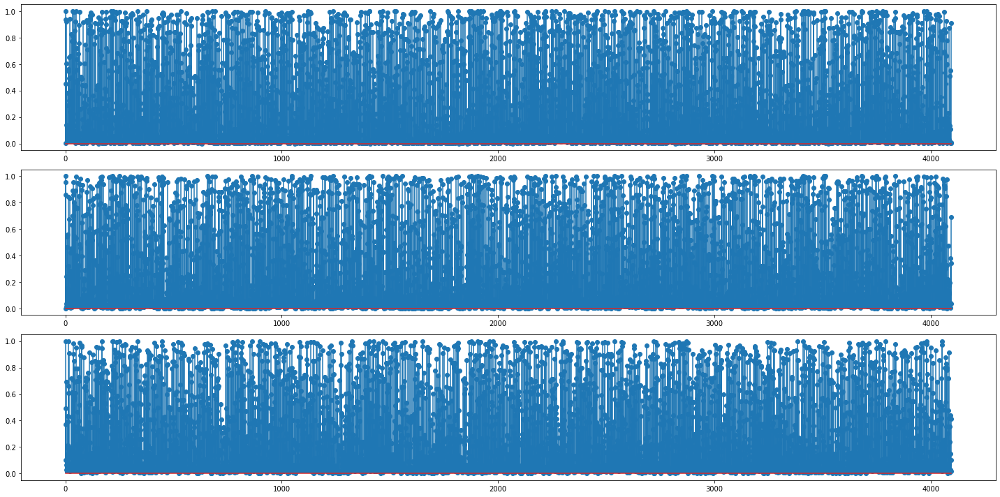

In [ ]:
def get_activation(layer, input, output):
    global activation
    activation = torch.sigmoid(output)

### Register hook  
hook_handle = net.fc1.register_forward_hook(get_activation) # executed every time fc2 is called in the forward step

### Analyze activations
net = net.to(device)
net.eval()
with torch.no_grad():
    x1 = next(iter(train_dataloader))
    x1 = x1[0].to(device)
    y1 = net(x1)
    z1 = activation
    x2 = next(iter(train_dataloader))[0].to(device)
    y2 = net(x2)
    z2 = activation
    x3 = next(iter(train_dataloader))[0].to(device)
    y3 = net(x3)
    z3 = activation

### Remove hook
hook_handle.remove()

### Plot activations
fig, axs = plt.subplots(3, 1, figsize=(20,10))
axs[0].stem(z1[0].cpu().numpy(), use_line_collection=True)
# axs[0].set_title('Last layer activations for input x=%.2f' % x1)
axs[1].stem(z2[0].cpu().numpy(), use_line_collection=True)
# axs[1].set_title('Last layer activations for input x=%.2f' % x2)
axs[2].stem(z3[0].cpu().numpy(), use_line_collection=True)
# axs[2].set_title('Last layer activations for input x=%.2f' % x3)
plt.tight_layout()
plt.show()

### Final CNN

In [ ]:
train_dataloader_original = DataLoader(train_dataset_original, batch_size=500, shuffle=True, num_workers=0)
test_dataloader = DataLoader(test_dataset_original, batch_size=500, shuffle=False, num_workers = 0)

In [ ]:
random.seed(1)
torch.manual_seed(0)

# NETWORK INITIALIZATION
activation = nn.LeakyReLU()
# conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, Nconv5, kernel1, kernel2, stride1, stride2, Nh1, Nh2, No, activation, reg, loss):
net = CNN2(4, 2, 16, 64, 16, 64, 64, 7, 3, 1, 1, 512, 128, 10, activation, 'Batch norm', 'CrossEntropy') 
net.to(device)

# Define the loss function
loss_function = nn.CrossEntropyLoss()

# Define the optimizer
optimizer = optim.RMSprop(net.parameters(), lr = 0.003)

# TRAINING LOOP
start_time = time.time()

train_loss_log = []; val_loss_log = []
train_accuracy_log = []; val_accuracy_log = []

for epoch_num in tq.tqdm(range(15), desc = f'Training'):

    # ----------- TRAIN -----------
    train_loss= []
    all_outputs, all_labels = [], []
    net.train() # Training mode (e.g. enable dropout, and all other stochastic behaviours)
    for sample_batched in train_dataloader_original:
        # Move data to device
        x_batch = sample_batched[0].to(device)
        label_batch = sample_batched[1].to(device)

        # Forward pass
        out = net(x_batch)

        # Compute loss
        loss = loss_function(out, label_batch)

        # Backpropagation
        net.zero_grad()
        loss.backward()

        # Update the weights
        optimizer.step()

        # Save train loss and output for this batch
        loss_batch = loss.detach().cpu().numpy()
        train_loss.append(loss_batch)
        all_outputs.append(out)
        all_labels.append(label_batch)

    train_accuracy = accuracy(all_outputs, all_labels)
    train_accuracy_log.append(train_accuracy)

    # Save average train loss
    train_loss = np.mean(train_loss)
    train_loss_log.append(train_loss)
    

    # # ----------- VALIDATION -----------
    val_loss, all_outputs_v, all_labels_v = validation(test_dataloader, net)
    # print(val_loss)
    val_loss_log.append(val_loss)

    val_accuracy = accuracy(all_outputs_v, all_labels_v)
    # print(val_accuracy)
    val_accuracy_log.append(val_accuracy)
        
run_time = time.time() - start_time

In [ ]:
all_inputs = []
all_outputs = []
all_labels = []
net.eval() # Evaluation mode (e.g. disable dropout)
with torch.no_grad(): # Disable gradient tracking
  for sample_batched in test_dataloader:
    # Move data to device
    x_batch = sample_batched[0].to(device)
    # x_batch = torch.reshape(x_batch, (10000, -1))
    x_batch = torch.reshape(x_batch, (500, 1, 28, 28))
    label_batch = sample_batched[1].to(device)
    label_batch = torch.reshape(label_batch, (-1,))
    # Forward pass
    out = net(x_batch)
    # Save outputs and labels
    all_inputs.append(x_batch)
    all_outputs.append(out)
    all_labels.append(label_batch)
# Concatenate all the outputs and labels in a single tensor
all_inputs  = torch.cat(all_inputs)
all_outputs = torch.cat(all_outputs)
all_labels  = torch.cat(all_labels)

test_loss = loss_function(all_outputs, all_labels)
print(f"AVERAGE TEST LOSS: {test_loss}")
tot_correct_out = (all_outputs.argmax(dim=-1) == all_labels).sum()
test_accuracy = 100 * tot_correct_out / len(all_labels)
print(f"TEST ACCURACY: {test_accuracy:.2f}%")

AVERAGE TEST LOSS: 0.030819298699498177
TEST ACCURACY: 99.20%


### Final CNN data augmentation

In [ ]:
train_dataloader_original = DataLoader(train_dataset_original, batch_size=500, shuffle=True, num_workers=0)
test_dataloader = DataLoader(test_dataset_original, batch_size=500, shuffle=False, num_workers = 0)

In [ ]:
random.seed(1)
torch.manual_seed(0)

# NETWORK INITIALIZATION
activation = nn.LeakyReLU()
# conv_layers, fc_layers, Nconv1, Nconv2, Nconv3, Nconv4, Nconv5, kernel1, kernel2, stride1, stride2, Nh1, Nh2, No, activation, reg, loss):
net = CNN2(2, 2, 128, 128, 0, 0, 0, 5, 5, 1, 1, 64, 0, 10, activation, False, 'NLLLoss') 
net.to(device)

# Define the loss function
loss_function = torch.nn.NLLLoss()

# Define the optimizer
optimizer = optim.RMSprop(net.parameters(), lr = 0.001)

# TRAINING LOOP
start_time = time.time()

train_loss_log = []; val_loss_log = []
train_accuracy_log = []; val_accuracy_log = []

for epoch_num in tq.tqdm(range(32), desc = f'Training'):

    # ----------- TRAIN -----------
    train_loss= []
    all_outputs, all_labels = [], []
    net.train() # Training mode (e.g. enable dropout, and all other stochastic behaviours)
    for sample_batched in train_dataloader_original:
        # Move data to device
        x_batch = sample_batched[0].to(device)
        label_batch = sample_batched[1].to(device)

        # Forward pass
        out = net(x_batch)

        # Compute loss
        loss = loss_function(out, label_batch)

        # Backpropagation
        net.zero_grad()
        loss.backward()

        # Update the weights
        optimizer.step()

        # Save train loss and output for this batch
        loss_batch = loss.detach().cpu().numpy()
        train_loss.append(loss_batch)
        all_outputs.append(out)
        all_labels.append(label_batch)

    train_accuracy = accuracy(all_outputs, all_labels)
    train_accuracy_log.append(train_accuracy)

    # Save average train loss
    train_loss = np.mean(train_loss)
    train_loss_log.append(train_loss)
    

    # # ----------- VALIDATION -----------
    val_loss, all_outputs_v, all_labels_v = validation(test_dataloader, net)
    # print(val_loss)
    val_loss_log.append(val_loss)

    val_accuracy = accuracy(all_outputs_v, all_labels_v)
    # print(val_accuracy)
    val_accuracy_log.append(val_accuracy)
        
run_time = time.time() - start_time

In [ ]:
all_inputs = []
all_outputs = []
all_labels = []
net.eval() # Evaluation mode (e.g. disable dropout)
with torch.no_grad(): # Disable gradient tracking
  for sample_batched in test_dataloader:
    # Move data to device
    x_batch = sample_batched[0].to(device)
    # x_batch = torch.reshape(x_batch, (10000, -1))
    x_batch = torch.reshape(x_batch, (500, 1, 28, 28))
    label_batch = sample_batched[1].to(device)
    label_batch = torch.reshape(label_batch, (-1,))
    # Forward pass
    out = net(x_batch)
    # Save outputs and labels
    all_inputs.append(x_batch)
    all_outputs.append(out)
    all_labels.append(label_batch)
# Concatenate all the outputs and labels in a single tensor
all_inputs  = torch.cat(all_inputs)
all_outputs = torch.cat(all_outputs)
all_labels  = torch.cat(all_labels)

test_loss = loss_function(all_outputs, all_labels)
print(f"AVERAGE TEST LOSS: {test_loss}")
tot_correct_out = (all_outputs.argmax(dim=-1) == all_labels).sum()
test_accuracy = 100 * tot_correct_out / len(all_labels)
print(f"TEST ACCURACY: {test_accuracy:.2f}%")

AVERAGE TEST LOSS: 0.014897896908223629
TEST ACCURACY: 99.62%


In [ ]:
### Confusion matrix
from sklearn import metrics
# Predicted labels
y_true = all_labels.cpu().data.numpy()
y_pred = all_outputs.cpu().argmax(dim=-1).numpy()
# Evaluate confusion matrix
cm = metrics.confusion_matrix(y_true, y_pred)
# Show the confusion matrix
pd.DataFrame(cm)

,0,1,2,3,4,5,6,7,8,9
0,979,0,0,1,0,0,0,0,0,0
1,0,1134,0,1,0,0,0,0,0,0
2,0,0,1027,1,0,0,0,3,1,0
3,0,1,0,1008,0,1,0,0,0,0
4,0,0,0,0,974,0,1,1,0,6
5,0,0,0,3,0,888,1,0,0,0
6,2,0,1,0,1,0,953,0,1,0
7,0,2,2,0,0,0,0,1022,1,1
8,1,0,2,0,0,0,0,0,971,0
9,0,0,0,0,2,1,0,1,0,1005


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_true, y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       980
           1       1.00      1.00      1.00      1135
           2       1.00      1.00      1.00      1032
           3       0.99      1.00      1.00      1010
           4       1.00      0.99      0.99       982
           5       1.00      1.00      1.00       892
           6       1.00      0.99      1.00       958
           7       1.00      0.99      0.99      1028
           8       1.00      1.00      1.00       974
           9       0.99      1.00      0.99      1009

    accuracy                           1.00     10000
   macro avg       1.00      1.00      1.00     10000
weighted avg       1.00      1.00      1.00     10000



In [ ]:
torch.save(net, 'CNN_aug9962.torch')

In [ ]:
net

CNN2(
  (conv1): Conv2d(1, 128, kernel_size=(5, 5), stride=(1, 1), padding=(1, 1))
  (maxpool1): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(128, 128, kernel_size=(5, 5), stride=(1, 1), padding=(1, 1))
  (maxpool4): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=3200, out_features=64, bias=True)
  (out): Linear(in_features=64, out_features=10, bias=True)
  (act): LeakyReLU(negative_slope=0.01)
)

In [ ]:
# First hidden layer
h1_w = net.fc1.weight.data.cpu().numpy()  

# Second hidden layer
h2_w = net.out.weight.data.cpu().numpy()

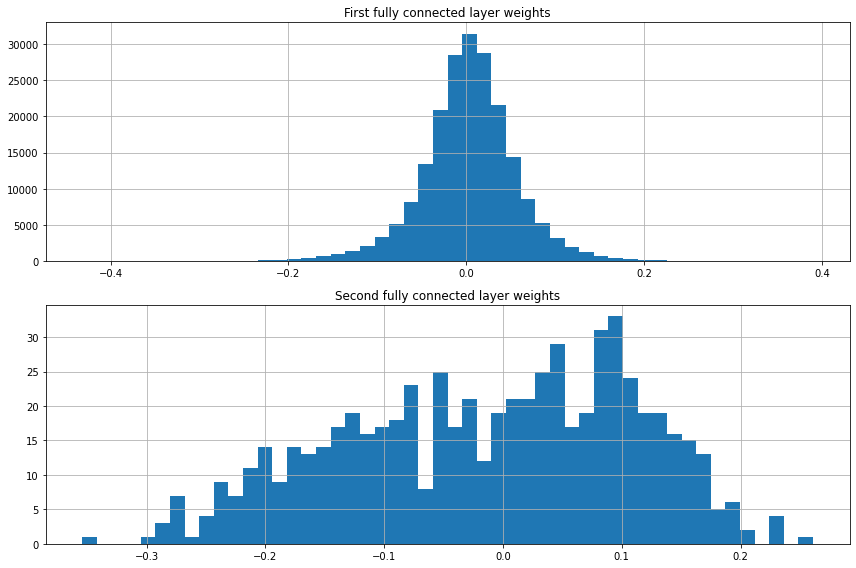

In [ ]:
# Weights histogram
fig, axs = plt.subplots(2, 1, figsize=(12,8))
axs[0].hist(h1_w.flatten(), 50)
axs[0].set_title('First fully connected layer weights')
axs[1].hist(h2_w.flatten(), 50)
axs[1].set_title('Second fully connected layer weights')
[ax.grid() for ax in axs]
plt.tight_layout()
plt.show()

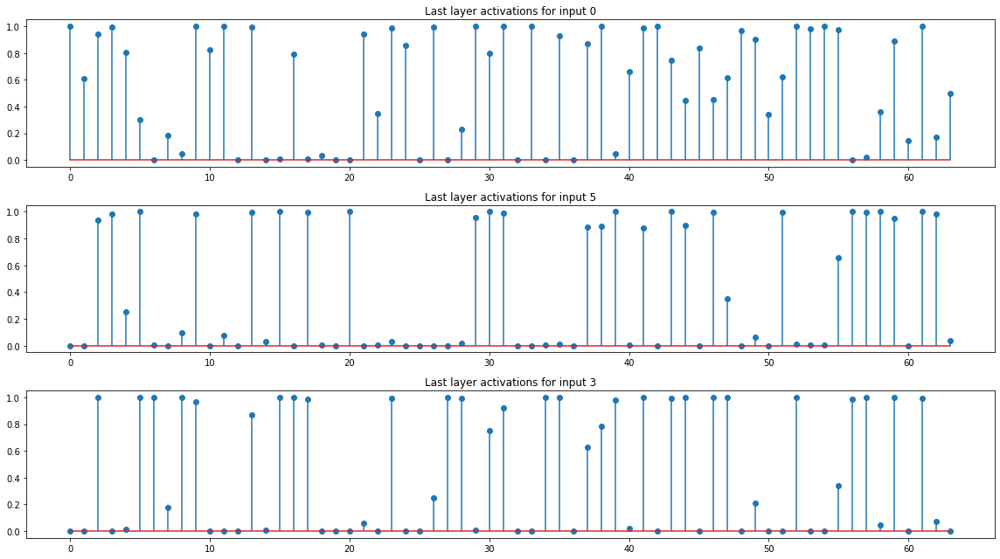

In [ ]:
def get_activation(layer, input, output):
    global activation
    activation = torch.sigmoid(output)

### Register hook  
hook_handle = net.fc1.register_forward_hook(get_activation) # executed every time fc2 is called in the forward step

### Analyze activations
net = net.to(device)
net.eval()
with torch.no_grad():
    x1 = next(iter(train_dataloader_original))
    l1 = int(x1[1][0])
    x1 = x1[0].to(device)
    y1 = net(x1)
    z1 = activation
    x2 = next(iter(train_dataloader_original))
    l2 = int(x2[1][0])
    x2 = x2[0].to(device)
    y2 = net(x2)
    z2 = activation
    x3 = next(iter(train_dataloader_original))
    l3 = int(x3[1][0])
    x3 = x3[0].to(device)
    y3 = net(x3)
    z3 = activation

### Remove hook
hook_handle.remove()

### Plot activations
fig, axs = plt.subplots(3, 1, figsize=(16,9))
axs[0].stem(z1[0].cpu().numpy(), use_line_collection=True)
axs[0].set_title(f'Last layer activations for input {l1}')
axs[1].stem(z2[0].cpu().numpy(), use_line_collection=True, )
axs[1].set_title(f'Last layer activations for input {l2}')
axs[2].stem(z3[0].cpu().numpy(), use_line_collection=True)
axs[2].set_title(f'Last layer activations for input {l3}')
plt.tight_layout()
plt.show()

## Analyze network weights

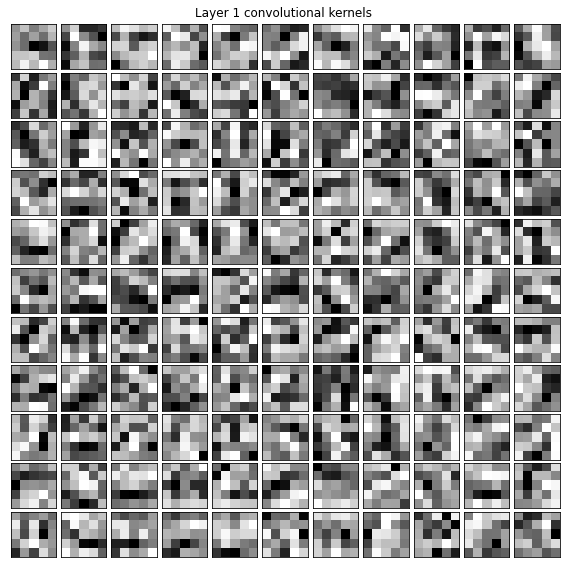

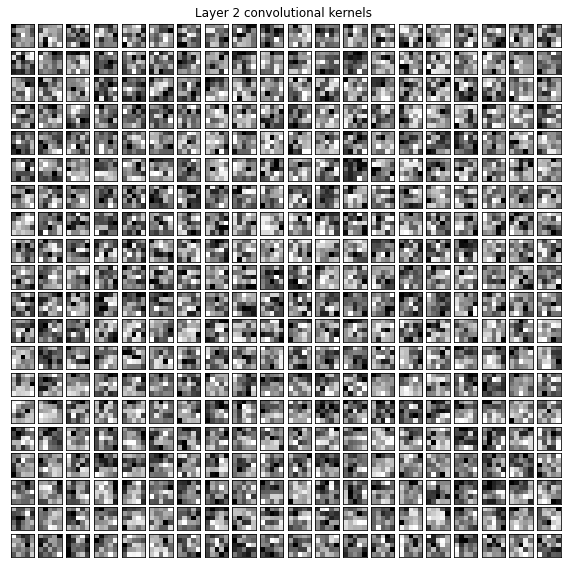

In [ ]:
### Extract weights 
# Layer 1 weights
weights_l1 = net.conv1.weight.data.cpu().numpy()
# Layer 2 weights
weights_l2 = net.conv2.weight.data.cpu().numpy()

### Plot the weights (this is a utility function, no need to analyze this code)
def plot_nchw_data(data, h_num, v_num, title):
    fig, axs = plt.subplots(h_num, v_num, figsize=(8,8))
    shape = data.shape
    data = data.reshape(shape[0]*shape[1], shape[2], shape[3])
    for idx, ax in enumerate(axs.flatten()):
        ax.set_xticks([])
        ax.set_yticks([])
        if idx < len(data):
            ax.imshow(data[idx,:,:], cmap='gray')
    plt.suptitle(title)
    plt.tight_layout(rect=[0, 0, 1, 0.97], h_pad=0, w_pad=0)
    plt.show()

plot_nchw_data(weights_l1, 11, 11, 'Layer 1 convolutional kernels')
plot_nchw_data(weights_l2, 20, 20, 'Layer 2 convolutional kernels')


## Analyze activations

Register the forward hooks

In [ ]:
# Hook function to call during forward pass
def hook_fn(module, input, output):
    intermediate_outputs.append(output)

# Attach hook function to all the convolutional layers
hook_handles = [] # This list will contains all the handles required to remove the hooks later
hook_handles.append(net.conv1.register_forward_hook(hook_fn))
hook_handles.append(net.conv2.register_forward_hook(hook_fn))

Analyze the activations for a single input image

Data shape: torch.Size([500, 1, 28, 28]))
Label shape: torch.Size([500]))
First sample in batch number 1:


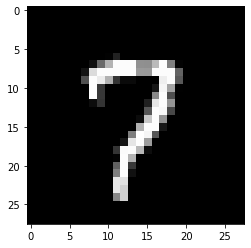

Label = tensor(7)


In [ ]:
# # Define input
# net_input = next(iter(train_dataloader_original))[0][0]
# net_input = net_input.to(device)

# # Show original image
# Image.open(test_dataset.samples[1][0])

batch = next(iter(train_dataloader_original))
image, label = batch[0], batch[1]
print(f"Data shape: {image.shape})")
print(f"Label shape: {label.shape})")
print('First sample in batch number 1:')
plt.imshow(image[0].squeeze(), cmap='gray')
plt.show()
print('Label =', label[0])

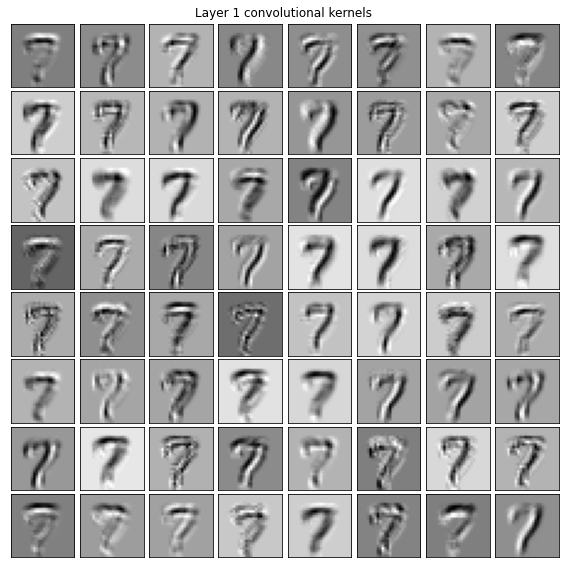

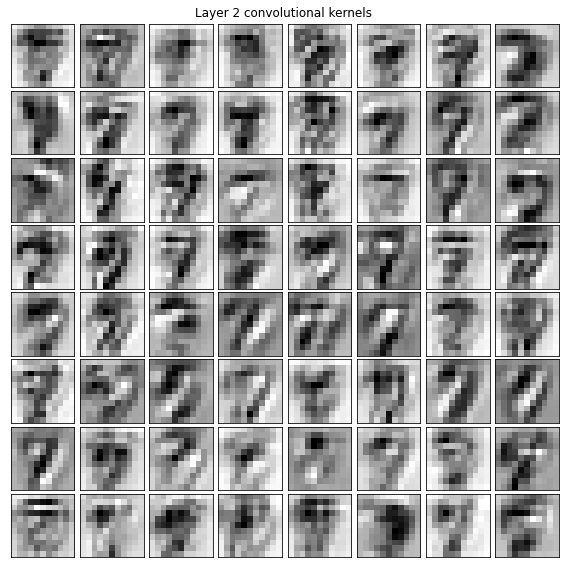

In [ ]:
# Evaluate output
image = image.to(device)
net.eval()
with torch.no_grad():
    intermediate_outputs = []
    out = net(image)
    # Now the intermediate_outputs list contains the intermediate outputs thanks to the hook function

# Analyze intermediate outputs
for layer_num, intermediate_output in enumerate(intermediate_outputs):
    intermediate_output = intermediate_output.cpu().data.numpy()
    # Plot
    plot_nchw_data(intermediate_output, 8, 8, 'Layer %d convolutional kernels' % (layer_num + 1))

Remove the registered forward hooks

In [ ]:
# Remove the hooks using the handles saved during the hooks definition
for handle in hook_handles:
  handle.remove()